# HW4 - Data Analysis & Make Prediction Models

#### Data Science in Korea University, Prof. Jaewoo Kang
#### COSE471, Spring 2020
#### Due : 7/01 (wednes)  11:59 PM [Through Black board]

## Assignment Credit

### Your assignments are 40% of the total score. The scores for each assignment are as follows.
- __HW#1: 5%__
- __HW#2: 10%__
- __HW#3: 10%__
- __HW#4: 15%__

## Python Assingment HW4 Guide
- You need to fill out your code in ###YOUR CODE HERE### or #TODO.
- The code results should be the same as the results displayed below the code or the format we gave in problem description.
- When solving descriptive problems, both __Korean and English are available.__
- The some libraries are already imported below. __But you should import more.__
    - If you don't have some libraries, install it with pip or conda command. [Google will help you]

## Problem1. Scikit-learn
- Scikit-learn is the most common python library in machine learning.
- Let's port our work from matplotlib to scikit-learn.
- However, not all plots will be handled. We will focus on the most recent data, 2010-2015.

<b>URL:</b> http://scikit-learn.org/
<br/><b>Install guide:</b> http://scikit-learn.org/stable/install.html

In [148]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import time
from datetime import datetime
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

import nltk
from sklearn import preprocessing
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

## Problem1. Regression Model
## -Amzon stock price prediction.

### Problem 1-1
- In this problem you will predict stock price only with price related data. People usually call it as Technical analysis.
- Find best combination of parameters to predict next day price.
- __Your MSE loss should be lower than 30.__

In [149]:
# TODO : load data 'AMZN.csv'
raw_data = pd.read_csv('data/AMZN.csv')

In [150]:
raw_data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1997-05-15,2.437500,2.500000,1.927083,1.958333,1.958333,72156000
1,1997-05-16,1.968750,1.979167,1.708333,1.729167,1.729167,14700000
2,1997-05-19,1.760417,1.770833,1.625000,1.708333,1.708333,6106800
3,1997-05-20,1.729167,1.750000,1.635417,1.635417,1.635417,5467200
4,1997-05-21,1.635417,1.645833,1.375000,1.427083,1.427083,18853200


<br/><br/>
- We will use only __one kind of variable__ for __last 'lookback' days__ to predict next day close price.<br/>
For example, if we set lookback days as 5, and use close price for our independent variable.<br/><br/>
Close price of [1997-05-15, 1997-05-16, 1997-05-19, 1997-05-20, 1997-05-21] --> predict [1997-05-22] <br/><br/>

In [ ]:
"""
TODO : make get_concated_data function.
       this function create x and y data

@Function
get_concated_data

@Inputs
__
raw_data : dataframe, full Amazon stock data.
     

@Returns
___

x_data 
    : <class 'numpy.ndarray'>
    : crteated data should in shape of [len(raw_data)-lookback, lookback]
    : x_data should be made based on 'col_name', parameters of the function, variable we will use
    
y_data 
    : <class 'numpy.ndarray'>
    : crteated data should in shape of [len(raw_data)-lookback]
    : y should be always made based on 'Close'.
"""

In [151]:
# We will use only one kind of variable as a time series data
def get_concated_data(raw_data, col_name, lookback):
    x_datas = list()
    y_datas = list()
    # col_name : Variable to be used
    col_data = raw_data[col_name].values
    # aggregate target variable data for length of lookback days
    
    ##### Your Code Here ####
    row_data = raw_data['Close'].values
    for i in range(len(col_data)):
        if( i < lookback) : 
            continue
        else:
            x_lookback = list()
            for j in range(lookback):
                x_lookback.append(col_data[i-j-1])
            x_datas.append(np.array(x_lookback))
            y_datas.append(row_data[i])
    
    x_datas = [np.array(x_datas)]
    ##########################    
    x_data = np.concatenate(x_datas,0)
    y_data = np.asarray(y_datas)
    
    print(x_data.shape)
    print(y_data.shape)

    return x_data, y_data

In [ ]:
"""
TODO : make split_data function which split train / test (last 60 data, approximately 3 month)

@Function
split_datas

@Inputs
__
data : numpy array
     
@Returns
___
x_train, x_test, y_train, y_test
    :<class 'numpy.ndarray'>

"""

In [152]:
def split_datas(x,y):
    x_train_size = len(x)-60
    y_train_size = len(y)-60
    x_train = list()
    y_train = list()
    x_test = list()
    y_test = list()
    
    for data in x:
        if( x_train_size <=0 ):
            x_test.append(data)
            continue
        x_train.append(data)
        x_train_size = x_train_size - 1
        
    for data in y:
        if( y_train_size <=0 ):
            y_test.append(data)
            continue
        y_train.append(data)
        y_train_size = y_train_size - 1
        
        
    x_train = np.array(x_train)
    y_train = np.array(y_train)
    x_test = np.array(x_test)
    y_test = np.array(y_test)
    
    return x_train, x_test, y_train, y_test

In [153]:
x, y = get_concated_data(raw_data, 'Close', 5)
x[:10], y[:10]

(5283, 5)
(5283,)


(array([[1.427083, 1.635417, 1.708333, 1.729167, 1.958333],
        [1.395833, 1.427083, 1.635417, 1.708333, 1.729167],
        [1.5     , 1.395833, 1.427083, 1.635417, 1.708333],
        [1.583333, 1.5     , 1.395833, 1.427083, 1.635417],
        [1.53125 , 1.583333, 1.5     , 1.395833, 1.427083],
        [1.505208, 1.53125 , 1.583333, 1.5     , 1.395833],
        [1.5     , 1.505208, 1.53125 , 1.583333, 1.5     ],
        [1.510417, 1.5     , 1.505208, 1.53125 , 1.583333],
        [1.479167, 1.510417, 1.5     , 1.505208, 1.53125 ],
        [1.416667, 1.479167, 1.510417, 1.5     , 1.505208]]),
 array([1.395833, 1.5     , 1.583333, 1.53125 , 1.505208, 1.5     ,
        1.510417, 1.479167, 1.416667, 1.541667]))

In [154]:
x_train, x_test, y_train, y_test = split_datas(x, y)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((5223, 5), (5223,), (60, 5), (60,))

### <br/>Problem 1-2 Find best parameter combination 
- You can choose which __columns to use__ as variable for __how many days__, and in which __polynomial space.__
- Find the best combination of parameters to predict next day price.
- __Find combination which makes MSE loss for train data lower than 6.__

In [ ]:
# TODO : complete run_regression function

In [155]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model
from sklearn.pipeline import make_pipeline

def run_regression(raw_data, column_name, lookback_days, poly_degree):
    # performing regression analysis with specified parameters
    x, y = get_concated_data(raw_data, column_name, lookback_days)
    x_train, x_test, y_train, y_test = split_datas(x, y)

    X_train = x_train
    model = make_pipeline(PolynomialFeatures(poly_degree), linear_model.Ridge())
    model.fit(X_train, y_train)
    #print(model.coef_)
    print(model.score(X_train, y_train))
    X_test = x_test

    print ("MSE - Train %.4f"%mean_squared_error(model.predict(X_train), y_train))
    print ("MSE - Test %.4f"%mean_squared_error(model.predict(X_test), y_test))
    
    test_pred = model.predict(X_test)
    return test_pred, y_test

In [156]:
# TODO : run experiment with various combination
test_pred, y_test = run_regression(raw_data, column_name='Close', lookback_days=2500, poly_degree=1)

(2788, 2500)
(2788,)
0.9999619428233654
MSE - Train 3.4717
MSE - Test 3889.6891


Write Combination that you've found. (Train loss lower than 6) <br/><br/>
Variable :   Close    <br/>
Lookback :   2500    <br/>
Poly_degree :   1    <br/>

### Problem 1-3 Overfitting & Underfitting
1. Briefly explain about the concept of overfitting and underftting with proper example that you can find from experiment above.
2. In the above problem desciption, I set your goal as fiding best parameters for total data loss. What is wrong with it? 

### YOUR ANSWER HERE ###

1.  underfitting : train data에 대한 error와 test data에 대한 error가 모두 높은 경우 <br>
                    ex) variable을 Open으로, poly_degree를 1로 선택한 모델에 대해 lookback_days 가 1부터 3 사이인 경우, train mse 와 test mse가 모두 감소한다. 하지만 lookback_days가 4이상부터는 train mse가 줄어드는 반면, test mse는 증가한다. 즉 이때 look_back_days가 1과 2인 경우가 모델이 underfitting된 경우이다.
    overfitting : train data에 대한 error는 낮지만 test data에 대한 error가 높은 경우 <br>
                    ex) variable을 close로 선택한 모델들은 lookback_days가 커질수록, poly_degree가 높아질수록 train mse는 줄어들지만 test mse는 증가한다. 즉 overfitting된다.
    
2. linear regression에서 모델이 갖는 train mse는 variable이 많을수록, poly_degree가 높을수록 작아지는 경향을 갖지만, test mse는 variable이 많을 수록, poly_degree가 높을 수록 작아지는 경향을 갖지만, 어느 순간 이후에는 variable이 많을 수록, poly_degree가 높을 수록 test mse가 커지는 경향을 갖는다. 즉 모델이 train data에 대해 underfitting된 상황에서는 모델의 복잡도가 증가할수록 train mse, test mse가 모두 감소하지만, train data에 overfitting된 상황에서는 모델의 복잡도가 증가할수록 train mse는 낮아지는 반면, test mse는 증가한다. underfitting의 상황에서는 total data loss가 줄어들지만 overfitting의 상황에서는 total data loss가 증가하는 구간과 감소하는 구간, 혹은 변화가 없는 구간이 모두 존재할 수 있다. Total data loss가 작아지며 overfitting인 상황에서는 train mse와 test mse의 trade off가 발생하고, train 데이터에 대한 모델의 정확도가 높지만, 새로운 데이터에 대한 모델의 정확도가 낮아진다. 따라서 total data loss가 작아지는 parameter들을 찾는 것은 적절한 goal이 아니다.

### Problem 1-4 Visualization
- Visualize your predicton.
- You can use code below with proper variable.
- __Your best model's prediction --> best_pred.__

In [157]:
# TODO : Assign your best prediction for test data to best_pred
best_pred = test_pred

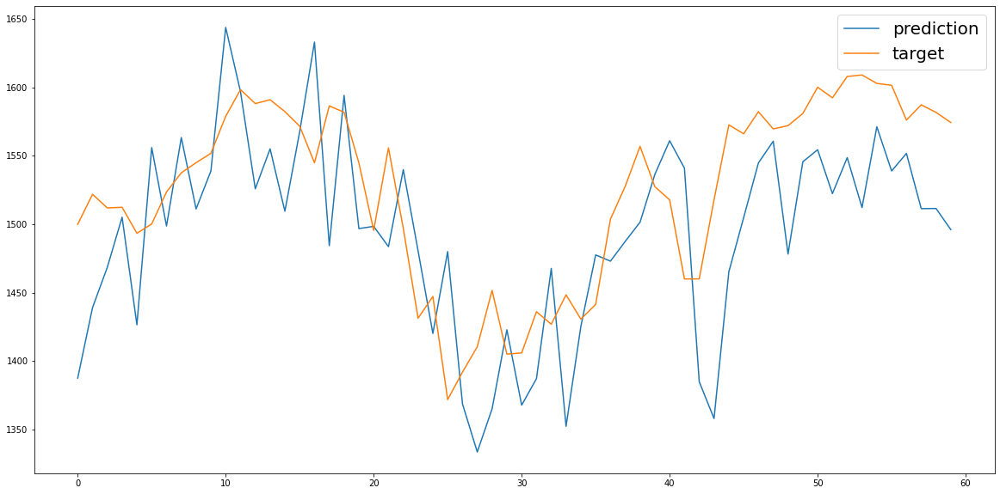

In [158]:
from matplotlib import pyplot as plt

plt.figure(figsize=(20,10))
plt.plot(best_pred, label='prediction')
plt.plot(y_test, label='target')
plt.legend(loc='best', fontsize=20)
plt.show()

## Problem2. Regression Model
## -Covid Confirmed prediction.

In [87]:
#import covidall dataset 
train = pd.read_csv('data/train.csv')
all_data = pd.read_csv('data/covid_all.csv') #set your working directory
all_data

,Unnamed: 0,index,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities,ForecastId,Day_num,...,Trend_Fatalities_2,Trend_Fatalities_3,Trend_Fatalities_4,Trend_Fatalities_5,Trend_Fatalities_6,Population (2020),Density,Land Area,Med Age,Urban Pop
0,0,0,1.0,83,0,2020-01-22,0.0,0.0,-1.0,0,...,0.0,0.0,0.0,0.0,0.0,38742911.0,60.0,652860.0,18.0,25.0
1,1,1,2.0,83,0,2020-01-23,0.0,0.0,-1.0,1,...,0.0,0.0,0.0,0.0,0.0,38742911.0,60.0,652860.0,18.0,25.0
2,2,2,3.0,83,0,2020-01-24,0.0,0.0,-1.0,2,...,0.0,0.0,0.0,0.0,0.0,38742911.0,60.0,652860.0,18.0,25.0
3,3,3,4.0,83,0,2020-01-25,0.0,0.0,-1.0,3,...,0.0,0.0,0.0,0.0,0.0,38742911.0,60.0,652860.0,18.0,25.0
4,4,4,5.0,83,0,2020-01-26,0.0,0.0,-1.0,4,...,0.0,0.0,0.0,0.0,0.0,38742911.0,60.0,652860.0,18.0,25.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35677,35677,13454,-1.0,83,183,2020-05-10,0.0,0.0,13455.0,109,...,0.0,0.0,0.0,0.0,0.0,14818157.0,38.0,386850.0,19.0,38.0
35678,35678,13455,-1.0,83,183,2020-05-11,0.0,0.0,13456.0,110,...,0.0,0.0,0.0,0.0,0.0,14818157.0,38.0,386850.0,19.0,38.0
35679,35679,13456,-1.0,83,183,2020-05-12,0.0,0.0,13457.0,111,...,0.0,0.0,0.0,0.0,0.0,14818157.0,38.0,386850.0,19.0,38.0
35680,35680,13457,-1.0,83,183,2020-05-13,0.0,0.0,13458.0,112,...,0.0,0.0,0.0,0.0,0.0,14818157.0,38.0,386850.0,19.0,38.0


In [88]:
country_dict = {'Afghanistan': 0,
 'Albania': 1,
 'Algeria': 2,
 'Andorra': 3,
 'Angola': 4,
 'Antigua and Barbuda': 5,
 'Argentina': 6,
 'Armenia': 7,
 'Australia': 8,
 'Austria': 9,
 'Azerbaijan': 10,
 'Bahamas': 11,
 'Bahrain': 12,
 'Bangladesh': 13,
 'Barbados': 14,
 'Belarus': 15,
 'Belgium': 16,
 'Belize': 17,
 'Benin': 18,
 'Bhutan': 19,
 'Bolivia': 20,
 'Bosnia and Herzegovina': 21,
 'Botswana': 22,
 'Brazil': 23,
 'Brunei': 24,
 'Bulgaria': 25,
 'Burkina Faso': 26,
 'Burma': 27,
 'Burundi': 28,
 'Cabo Verde': 29,
 'Cambodia': 30,
 'Cameroon': 31,
 'Canada': 32,
 'Central African Republic': 33,
 'Chad': 34,
 'Chile': 35,
 'China': 36,
 'Colombia': 37,
 'Congo (Brazzaville)': 38,
 'Congo (Kinshasa)': 39,
 'Costa Rica': 40,
 "Cote d'Ivoire": 41,
 'Croatia': 42,
 'Cuba': 43,
 'Cyprus': 44,
 'Czechia': 45,
 'Denmark': 46,
 'Diamond Princess': 47,
 'Djibouti': 48,
 'Dominica': 49,
 'Dominican Republic': 50,
 'Ecuador': 51,
 'Egypt': 52,
 'El Salvador': 53,
 'Equatorial Guinea': 54,
 'Eritrea': 55,
 'Estonia': 56,
 'Eswatini': 57,
 'Ethiopia': 58,
 'Fiji': 59,
 'Finland': 60,
 'France': 61,
 'Gabon': 62,
 'Gambia': 63,
 'Georgia': 64,
 'Germany': 65,
 'Ghana': 66,
 'Greece': 67,
 'Grenada': 68,
 'Guatemala': 69,
 'Guinea': 70,
 'Guinea-Bissau': 71,
 'Guyana': 72,
 'Haiti': 73,
 'Holy See': 74,
 'Honduras': 75,
 'Hungary': 76,
 'Iceland': 77,
 'India': 78,
 'Indonesia': 79,
 'Iran': 80,
 'Iraq': 81,
 'Ireland': 82,
 'Israel': 83,
 'Italy': 84,
 'Jamaica': 85,
 'Japan': 86,
 'Jordan': 87,
 'Kazakhstan': 88,
 'Kenya': 89,
 'Korea, South': 90,
 'Kosovo': 91,
 'Kuwait': 92,
 'Kyrgyzstan': 93,
 'Laos': 94,
 'Latvia': 95,
 'Lebanon': 96,
 'Liberia': 97,
 'Libya': 98,
 'Liechtenstein': 99,
 'Lithuania': 100,
 'Luxembourg': 101,
 'MS Zaandam': 102,
 'Madagascar': 103,
 'Malawi': 104,
 'Malaysia': 105,
 'Maldives': 106,
 'Mali': 107,
 'Malta': 108,
 'Mauritania': 109,
 'Mauritius': 110,
 'Mexico': 111,
 'Moldova': 112,
 'Monaco': 113,
 'Mongolia': 114,
 'Montenegro': 115,
 'Morocco': 116,
 'Mozambique': 117,
 'Namibia': 118,
 'Nepal': 119,
 'Netherlands': 120,
 'New Zealand': 121,
 'Nicaragua': 122,
 'Niger': 123,
 'Nigeria': 124,
 'North Macedonia': 125,
 'Norway': 126,
 'Oman': 127,
 'Pakistan': 128,
 'Panama': 129,
 'Papua New Guinea': 130,
 'Paraguay': 131,
 'Peru': 132,
 'Philippines': 133,
 'Poland': 134,
 'Portugal': 135,
 'Qatar': 136,
 'Romania': 137,
 'Russia': 138,
 'Rwanda': 139,
 'Saint Kitts and Nevis': 140,
 'Saint Lucia': 141,
 'Saint Vincent and the Grenadines': 142,
 'San Marino': 143,
 'Sao Tome and Principe': 144,
 'Saudi Arabia': 145,
 'Senegal': 146,
 'Serbia': 147,
 'Seychelles': 148,
 'Sierra Leone': 149,
 'Singapore': 150,
 'Slovakia': 151,
 'Slovenia': 152,
 'Somalia': 153,
 'South Africa': 154,
 'South Sudan': 155,
 'Spain': 156,
 'Sri Lanka': 157,
 'Sudan': 158,
 'Suriname': 159,
 'Sweden': 160,
 'Switzerland': 161,
 'Syria': 162,
 'Taiwan*': 163,
 'Tanzania': 164,
 'Thailand': 165,
 'Timor-Leste': 166,
 'Togo': 167,
 'Trinidad and Tobago': 168,
 'Tunisia': 169,
 'Turkey': 170,
 'US': 171,
 'Uganda': 172,
 'Ukraine': 173,
 'United Arab Emirates': 174,
 'United Kingdom': 175,
 'Uruguay': 176,
 'Uzbekistan': 177,
 'Venezuela': 178,
 'Vietnam': 179,
 'West Bank and Gaza': 180,
 'Western Sahara': 181,
 'Zambia': 182,
 'Zimbabwe': 183}

### <br/>Problem 2-1 Plot ' Spain' covid-Confiremedcases graph between march 1 to march 11.
- your completed graph doesn't have to be the same as the example.

Text(0, 0.5, 'Log ConfrimedCases')

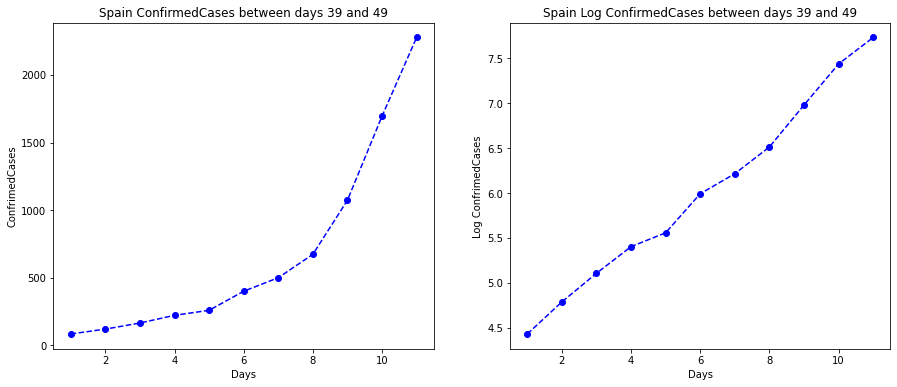

In [89]:
###To do####  
# plot 'Spain' covid-Confiremedcases graph between march 1 to march 11.
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))

spain = country_dict['Spain']
train.keys()
spain_case = train.loc[train['Country_Region']=='Spain'].loc[train['Date']>='2020-03-01'].loc[train['Date']<='2020-03-11']

x_spain = [int(x.split('-')[-1]) for x in spain_case['Date'].values]
y_spain = spain_case['ConfirmedCases'].values
ax1.plot(x_spain, y_spain, 'bo--')
ax1.set_title('Spain ConfirmedCases between days 39 and 49')
ax1.set_xlabel('Days')
ax1.set_ylabel('ConfrimedCases')

## To do ###
##apply log transform to y variables ## 

y_spain_log = [np.log(y) for y in y_spain]
ax2.plot(x_spain, y_spain_log, 'bo--')
ax2.set_title('Spain Log ConfirmedCases between days 39 and 49')
ax2.set_xlabel('Days')
ax2.set_ylabel('Log ConfrimedCases')



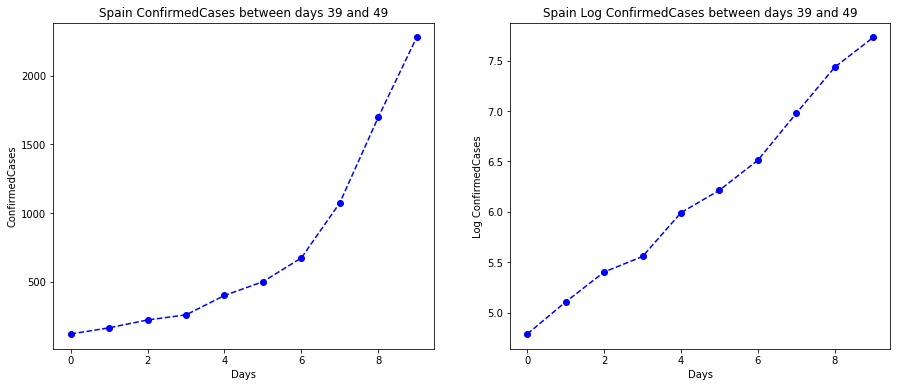

In [90]:
# Filter selected features
data = all_data.copy()
features = ['Id', 'ForecastId', 'Country_Region', 'Province_State', 'ConfirmedCases', 'Fatalities', 
       'Day_num']
data = data[features]

# Apply log transformation to all ConfirmedCases and Fatalities columns, except for trends
data[['ConfirmedCases', 'Fatalities']] = data[['ConfirmedCases', 'Fatalities']].astype('float64')
data[['ConfirmedCases', 'Fatalities']] = data[['ConfirmedCases', 'Fatalities']].apply(lambda x: np.log1p(x))

# Replace infinites
data.replace([np.inf, -np.inf], 0, inplace=True)


### <br/>Problem 2-2  complete below function to  Split data into train/test and apply linear regression

In [91]:
#  Split data into train/test
def split_data(df, train_lim, test_lim):
    
    df.loc[df['Day_num']<=train_lim , 'ForecastId'] = -1
    df = df[df['Day_num']<=test_lim]
    
    x_train = df[df.ForecastId == -1].drop(['ConfirmedCases', 'Fatalities'], axis=1)
    y_train_1 = df[df.ForecastId == -1]['ConfirmedCases']
    y_train_2 = df[df.ForecastId == -1]['Fatalities']

    x_test = df[df.ForecastId != -1].drop(['ConfirmedCases', 'Fatalities'], axis=1)

    # Clean Id columns and keep ForecastId as index
    x_train.drop('Id', inplace=True, errors='ignore', axis=1)
    x_train.drop('ForecastId', inplace=True, errors='ignore', axis=1)
    x_test.drop('Id', inplace=True, errors='ignore', axis=1)
    x_test.drop('ForecastId', inplace=True, errors='ignore', axis=1)
    
    return x_train, y_train_1, y_train_2, x_test #check to devide y_dataset 


# Linear regression model
def lin_reg(X_train, Y_train, X_test):
    
    regr = linear_model.LinearRegression()

    regr.fit(X_train, Y_train)

    y_pred = regr.predict(X_test)
    
    return regr, y_pred



In [92]:
dates_list = ['2020-03-01', '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05', '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09', 
                 '2020-03-10', '2020-03-11','2020-03-12','2020-03-13','2020-03-14','2020-03-15','2020-03-16','2020-03-17','2020-03-18',
                 '2020-03-19','2020-03-20','2020-03-21','2020-03-22','2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26', '2020-03-27', 
                 '2020-03-28', '2020-03-29', '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02', '2020-04-03', '2020-04-04', '2020-04-05', 
                 '2020-04-06', '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10', '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14','2020-04-15','2020-04-16','2020-04-17','2020-04-18','2020-04-19',
                '2020-04-20','2020-04-21','2020-04-22','2020-04-23','2020-04-24','2020-04-25','2020-04-26','2020-04-27','2020-04-28','2020-04-29','2020-04-30',
                '2020-05-01','2020-05-02','2020-05-03','2020-05-04','2020-05-05','2020-05-06','2020-05-07','2020-05-08','2020-05-09','2020-05-10','2020-05-11',
                '2020-05-12','2020-05-13','2020-05-14','2020-05-15']
def plot_linreg_basic_country(data, country_name, dates_list, day_start, shift, train_lim, test_lim):
    
    data_country = data[data['Country_Region']==country_dict[country_name]]
    data_country = data_country.loc[data_country['Day_num']>=day_start]
    X_train, Y_train_1, Y_train_2, X_test = split_data(data_country, train_lim, test_lim)
    model, pred = lin_reg(X_train, Y_train_1, X_test)

    # Create a df with both real cases and predictions (predictions starting on March 12th)
    X_train_check = X_train.copy()
    X_train_check['Target'] = Y_train_1

    X_test_check = X_test.copy()
    X_test_check['Target'] = pred

    X_final_check = pd.concat([X_train_check, X_test_check])

    # Select predictions from March 1st to March 25th
    predicted_data = X_final_check.loc[(X_final_check['Day_num'].isin(list(range(day_start, day_start+len(dates_list)))))].Target
    real_data = train.loc[(train['Country_Region']==country_name) & (train['Date'].isin(dates_list))]['ConfirmedCases']
    dates_list_num = list(range(0,len(dates_list)))

    # Plot results
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))

    ax1.plot(dates_list_num, np.expm1(predicted_data))
    ax1.plot(dates_list_num, real_data)
    ax1.axvline(30-shift, linewidth=2, ls = ':', color='grey', alpha=0.5)
    ax1.legend(['Predicted cases', 'Actual cases', 'Train-test split'], loc='upper left')
    ax1.set_xlabel("Day count (from March " + str(1+shift) + " to March 25th)")
    ax1.set_ylabel("Confirmed Cases")

    ax2.plot(dates_list_num, predicted_data)
    ax2.plot(dates_list_num, np.log1p(real_data))
    ax2.axvline(30-shift, linewidth=2, ls = ':', color='grey', alpha=0.5)
    ax2.legend(['Predicted cases', 'Actual cases', 'Train-test split'], loc='upper left')
    ax2.set_xlabel("Day count (from March " + str(1+shift) + " to March 30th)")
    ax2.set_ylabel("Log Confirmed Cases")

    plt.suptitle(("ConfirmedCases predictions based on Log-Lineal Regression for "+country_name))

### <br/>Problem 2-3  using above function'plot_linreg_basic_country' run the Linear Regression workflow to Korea, South case
 - your completed graph doesn't have to be the same as the example.


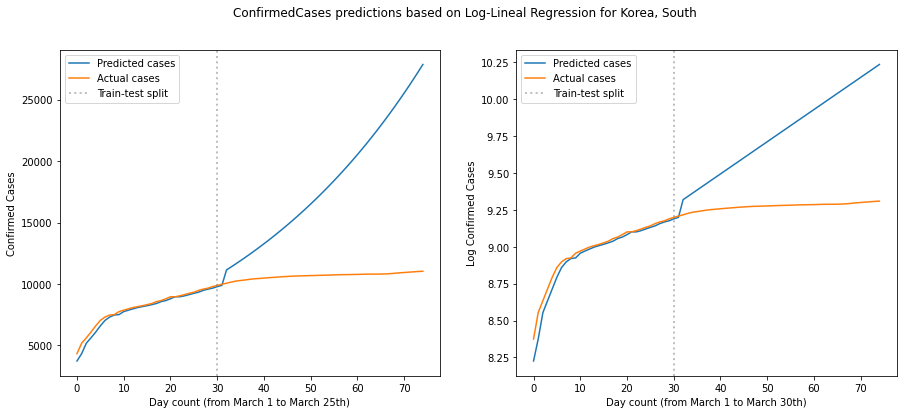

In [95]:
country_name = 'Korea, South'
march_day = 0
day_start = all_data.loc[all_data['Country_Region']==country_dict[country_name]].loc[all_data['Date']>='2020-03-01']['Day_num'].values[0] + march_day
dates_list2 = dates_list[march_day+1:]
train_lim = all_data.loc[all_data['Country_Region']==country_dict[country_name]].loc[all_data['Date']>='2020-03-31']['Day_num'].values[0]
test_lim = all_data.loc[all_data['Country_Region']==country_dict[country_name]]['Day_num'].values[-1]
plot_linreg_basic_country(data, country_name, dates_list2, day_start, march_day, train_lim, test_lim)


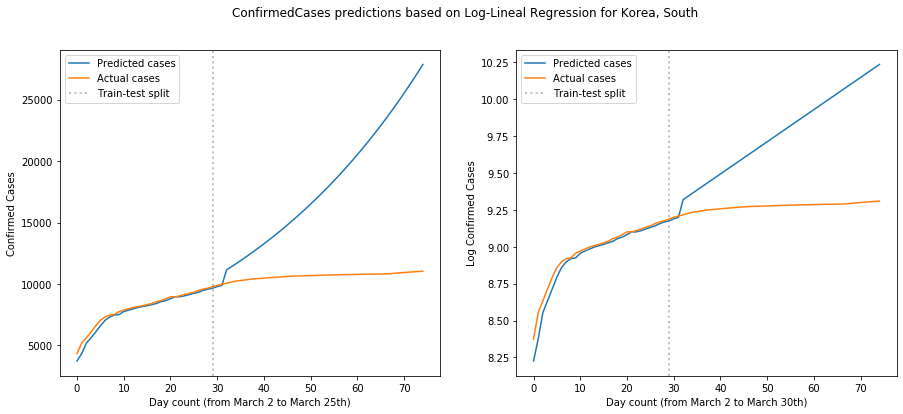

### <br/>Problem 2-4 Describe the significance and limitations of the graph above.

### YOUR ANSWER HERE ###

Significance : Actual case에 대한 그래프와 predicted case에 대한 그래프의 차이로부터 prediction의 장점과 단점을 설명할 수 있다는 것이다. Prediction모델은 train data로부터 유도된 모델이기 때문에 train data에 대한 prediction은 정확도가 높다는 것이 장점이고, 모델을 구현할 때 참여하지 않은 data, 즉 test data에 대해서는 정확도가 높지 않을 수 있다는 것이 단점이다. <br>
Limitation : 다른 variable들이 Confirmed case의 값에 기여한 정도를 알 수 없다. 따라서 day count 30과 40사이에서 predicted cases의 그래프가 가파른 순간을 설명할 수 없다.

## 3. Caculating Stringency Indexes of six countries 

Reference : https://www.bsg.ox.ac.uk/sites/default/files/Calculation%20and%20presentation%20of%20the%20Stringency%20Index.pdf

Look at the document above and learn about Stringency Index (not legacy stringency index!!)

## 3-1 Data filtering

In [96]:
OxCGRT = pd.read_csv('data/OxCGRT_latest.csv')


In [99]:
#Filter rows with six unique countries by 'CountryName'
#('CountryName' == Australia, China, Japan, New Zealand, Singapore, South Korea)
OxCGRT = OxCGRT.loc[lambda x: x['CountryName'].str.contains('Australia|China|Japan|New Zealand|Singapore|South Korea', regex = True)]
OxCGRT

,CountryName,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,H1_Public information campaigns,H1_Flag
947,Australia,20200101,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
948,Australia,20200102,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
949,Australia,20200103,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
950,Australia,20200104,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
951,Australia,20200105,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17720,Singapore,20200510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17721,Singapore,20200511,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17722,Singapore,20200512,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17723,Singapore,20200513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
#Drop columns you don't need
#print dataframe you care about
#use columns : 
"""
['CountryName', 'Date', 'C1_School closing', 'C1_Flag', 'C2_Workplace closing', 'C2_Flag', 'C3_Cancel public events','C3_Flag',
'C4_Restrictions on gatherings','C4_Flag','C5_Close public transport','C5_Flag','C6_Stay at home requirements','C6_Flag',
'C7_Restrictions on internal movement','C7_Flag','C8_International travel controls','H1_Public information campaigns','H1_Flag']
"""

OxCGRT.drop(OxCGRT.filter(regex='CountryCode|E+|H[2-9]+|C8_F+|Confirmed*|M+|L+|StringencyIndex*').columns,axis=1,inplace=True)
OxCGRT

,CountryName,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,H1_Public information campaigns,H1_Flag
947,Australia,20200101,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
948,Australia,20200102,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
949,Australia,20200103,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
950,Australia,20200104,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
951,Australia,20200105,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17720,Singapore,20200510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17721,Singapore,20200511,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17722,Singapore,20200512,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17723,Singapore,20200513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 3-2 Calculating Stringency Index

you can use some pakages to deal with 'nan' values

In [101]:
#stringency calculation
#step1 : calculate weight for a policy of general scope

# targeted/general : true
N = np.zeros(10)
N[1] = 3
N[2] = 3
N[3] = 2
N[4] = 4
N[5] = 2
N[6] = 3
N[7] = 2
N[8] = 2

# targeted/general : false
N[9] = 4

# weight
w = 0
for i in range(1,9):
    w = w + 1/(N[i]+1)
w = (1/8)*w
w

0.28541666666666665

In [102]:
#step2 : calculate sub-indices
#calculate C1-C9, G1-G8, and I1-I9 

sub_I = list()
data_count_item = list()
for i, index in enumerate(OxCGRT.index):
    data_count = 0
    item = OxCGRT.loc[index]
    sub_I_item = np.zeros(9)
    
    
    c1 = item['C1_School closing']
    g1 = item['C1_Flag']
    if np.isnan(c1) or np.isnan(g1):
        sub_I_item[0] = 0
        if np.isnan(c1) == False:
            data_count = data_count + 1            
    else:
        data_count = data_count + 1
        sub_I_item[0] = 100*(c1*(1-w)/N[1] + w*g1)
        
    c2 = item['C2_Workplace closing']
    g2 = item['C2_Flag']
    if np.isnan(c2) or np.isnan(g2):
        sub_I_item[1] = 0
        if np.isnan(c2) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[1] = 100*(c2*(1-w)/N[2] + w*g2)
        
    c3 = item['C3_Cancel public events']
    g3 = item['C3_Flag']
    if np.isnan(c3) or np.isnan(g3):
        sub_I_item[2] = 0
        if np.isnan(c3) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[2] =  100*(c3*(1-w)/N[3] + w*g3)
        
    c4 = item['C4_Restrictions on gatherings']
    g4 = item['C4_Flag']
    if np.isnan(c4) or np.isnan(g4):
        sub_I_item[3] = 0
        if np.isnan(c4) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[3] = 100*(c4*(1-w)/N[4] + w*g4)
        
    c5 = item['C5_Close public transport']
    g5 = item['C5_Flag']
    if np.isnan(c5) or np.isnan(g5):
        sub_I_item[4] = 0
        if np.isnan(c5) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[4] =  100*(c5*(1-w)/N[5] + w*g5)
        
    c6 = item['C6_Stay at home requirements']
    g6 = item['C6_Flag']
    if np.isnan(c6) or np.isnan(g6):
        sub_I_item[5] = 0
        if np.isnan(c6) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[5] =  100*(c6*(1-w)/N[6] + w*g6)
        
    c7 = item['C7_Restrictions on internal movement']
    g7 = item['C7_Flag']
    if np.isnan(c7) or np.isnan(g7):
        sub_I_item[6] = 0
        if np.isnan(c7) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[6] =  100*(c7*(1-w)/N[7] + w*g7)
        
    h1 = item['H1_Public information campaigns']
    gh1 = item['H1_Flag']
    if np.isnan(h1) or np.isnan(gh1):
        sub_I_item[7] = 0
        if np.isnan(h1) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[7] =   100*(h1*(1-w)/N[8] + w*gh1)
        
    c8 = item['C8_International travel controls']
    if np.isnan(c8):
        sub_I_item[8] = 0
        if np.isnan(c8) == False:
            data_count = data_count + 1
    else:
        data_count = data_count + 1
        sub_I_item[8] =   100*c8/N[9]
    
        
    data_count_item.append(data_count)
    sub_I.append(sub_I_item)
        
        
    
    
sub_I = np.array(sub_I)
sub_I



array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [103]:
#step3 : calculate stringency index I (up to 2 decimal points)

I = list()
for i in range(len(sub_I)):
    if(data_count_item[i] >= 6):
        I_temp = round((1/9)*np.sum(sub_I[i]),2)
    else:
        I_temp = np.nan
    I.append(I_temp)
    
I = np.array(I)
I          

array([ 0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  7.94,  7.94,  7.94,
        7.94,  7.94,  7.94,  7.94, 16.27, 16.27, 19.44, 19.44, 19.44,
       19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44,
       19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44,
       19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44,
       19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44, 19.44,
       19.44, 19.44, 19.44, 30.56, 30.56, 34.53, 42.47, 45.24, 45.24,
       45.24, 50.54, 63.11, 63.11, 63.11, 63.11, 63.11, 71.44, 71.44,
       71.44, 71.44, 70.91, 70.91, 70.91, 70.91, 70.91, 70.91, 70.91,
       70.91, 70.91, 70.91, 70.91, 70.91, 70.91, 70.91, 70.91, 70.91,
       68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26,
       68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26, 68.26,
       68.26,   nan,

In [104]:
#step4 : make your stingency index array into dataframe(column name = 'my_StringencyIndex') and concat it(axis = 1) to the result of 1-1 

##### There might be slightly difference if you compare nan and nan
my_StringencyIndex = pd.Series(I, index = OxCGRT.index)
my_StringencyIndex
OxCGRT['my_StringencyIndex'] = my_StringencyIndex
OxCGRT

,CountryName,Date,C1_School closing,C1_Flag,C2_Workplace closing,C2_Flag,C3_Cancel public events,C3_Flag,C4_Restrictions on gatherings,C4_Flag,C5_Close public transport,C5_Flag,C6_Stay at home requirements,C6_Flag,C7_Restrictions on internal movement,C7_Flag,C8_International travel controls,H1_Public information campaigns,H1_Flag,my_StringencyIndex
947,Australia,20200101,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
948,Australia,20200102,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
949,Australia,20200103,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
950,Australia,20200104,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
951,Australia,20200105,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17720,Singapore,20200510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17721,Singapore,20200511,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17722,Singapore,20200512,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17723,Singapore,20200513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Problem4. Topic Modeling (Clustering analysis of documents) for tweets related to COVID-19
A **topic model** is a type of statistical model for discovering the abstract "topics" that occur in a collection of documents.
 Please refer to [wikipedia](https://en.wikipedia.org/wiki/Topic_model#:~:text=In%20machine%20learning%20and%20natural,structures%20in%20a%20text%20body.) for detailed information.
- These documents were crawled from *twitter* with some *COVID-19* related keywords . All tweets are in English but have a lot of noisy information.
- In this problem, your goal is to cluster tweets according to the latent 'topics' with the statistical method, automatically. 


### Load the csv file using pandas library

In [105]:
df = pd.read_csv('data/covid_twitter.csv')
text_en = df['text']
print(df.shape)
print(df.head())

(36121, 2)
   Unnamed: 0                                               text
0           6  .@PatriceHarrisMD spoke with @YahooFinance abo...
1          14  #CoronaUpdate | Johns Hopkins University has s...
2          17  Singapore donates 40,000 test kits to the Phil...
3          28  Lockdowns, drones: Will things ever go back to...
4          30  Does the #COVID19 pandemic have you feeling ou...


### Problem 4-1 Text Preprocessing
First of all, you should process the documents so that the model will not be perturbed by the noisy information

**a. Remove the following characters with *'re'* module in each tweets**
- special characters ( # @ , . | ? ! )
- *COVID* relavant words (COVID19, coronavirus, coronaoutbreak)

In [106]:
patten_remove = re.compile("\#|\@|\,|\.|\||\?|\!|COVID\-?\_?19|coronavirus|coronaoutbreak",re.I)
for i, text in enumerate(text_en):
    text_en[i] = re.sub(patten_remove, "",str(text))
    print(text_en[i])
    print('\n')

PatriceHarrisMD spoke with YahooFinance about the  stimulus package making its way through Congress and how the healthcare landscape will change once the pandemic ends 


CoronaUpdate  Johns Hopkins University has said it did not authorize the use of its logo on a report titled ' for India Updates'

(dtrips reports)  




Singapore donates 40000 test kits to the Philippines  


Lockdowns drones: Will things ever go back to normal after  pandemic 


Does the  pandemic have you feeling out-of-control and overwhelmed Take control of your mental health when  has taken control of you 


Management options: antivirals glucocorticoids and novel treatments to manage cytokine storm: Novel  SARS-CoV-2 () an Updated Overview for Emergency Clinicians 


The Italian town of Vo went harder than most with their testing for  — and it paid off We could learn a few things bcpoli cdnpoli



We here at District 4 are still here to support you as we all confront  in our region Our office remains open as we

Orders must be going through the roof 🚀🚀🚀💥💥💥💥💥


Negative  test Which means I either had a case and recovered by the time I took the test (several days after symptoms receded) or most likely simply had some other respiratory virus with eerily similar symptoms Either way quite a relief to know I’m not contagious


 

USA 7:05 pm March 28 2020

Total cases: 123313

Total deaths: 2211

(via WorldOmeters) 


 ScottMorrisonMP says this time last week the rate of cases was increasing by around 25-30% It is now at around 13-15% Aus 


More than 700 New Jersey police officers test positive for the  


Prince William and Kate have described the last few weeks as “anxious and unsettling for everyone” as they continue their commitment to mental health by endorsing PHE_uk new advice on how to look after your wellbeing during  outbreak More 


The woman was originally diagnosed with influenza
New figures from Ashley Bloomfield
60 new confirmed cases
3 new probable
56 people have recovered
9 remain 




💥US  death toll surpasses 2000—doubling in just the last 2 days
March 5: 11 deaths 
March 12: 38
March 19: 149
March 26: 938
March 28: 2010 
 pandemic is spreading exponentially just as predicted by the experts epidemiologists &amp; medical professionals CNN 


This policescotland helicopter image of Glasgow City Centre is stark The main street central to the image is Buchanan Street with George Square shown to the far right of the image with two grassy areas visible CoronaLockdown  


Gaza EndtheSiege  
 in Gaza: Just 40 ICU beds for two million people under siege BDS apartheid Israel Free Palestine


Cuba's medical brigade is currently fighting along with the Jamaican people and government against the  pandemic 

CubaSalvaVidas 




RudyGiuliani realDonaldTrump did NOT INTRODUCE Hydroxy Treatment - more lies from RudyGiuliani 
RudyGiuliani and realDonaldTrump are going to get people killed Trump already gotten people killed with his witch doctor medicine for 


The 


US_FDA has g



Episode 13 is on its way We usually release new episodes Wednesdays  but chose 2 delay this week due 2 family commitments during these unprecedented times of  

Mark Whistler aka CybilWar of SAS_WDW has an amazing story &amp; we’re so happy 2be able to share it with you 


How on earth is CA third in cases Jesus 😲
How many test kits did each state recieve
 
SarahBCalif 
DrDenaGrayson 
dcpoll 

Treat this virus as you would cockroaches if you 👀 1 there are hundreds more 


mitchellvii You have cranio rectal inversion  


It pained me tell two young girls today to stop playing at our playground I told them they wouldn’t want anyone they ❤️ to get sick 😷  but I felt as though I was shattering a simple joy of childhood 😢 

I hope this ends soon so our kids can play again🙏🏼

StayAtHome 


👀 Could this be a sign of things to come at Phillies &amp; other MLB games 

A Korean baseball team is playing in an empty stadium with players wearing masks 

📸 Lotte Giants TV 

6abc 
Baseball 
MLB 
 





On a more serious note this seems like a great time for a  video update

ReleaseTheLockdown or StayAtHomeAndStaySafe 

It's a complicated issue and there may be no right answer 


The Trump Administration knew about  in January and did nothing because he didn’t believe it to be a real threat 

Now people are dying


TV adverts look so odd at the moment happy groups of people all milling around without a care in the world - they feel like the fake memories androids get in Sci Fi films 


Alabama  cases/day dropping despite increased testing Encouraging 


What a week big jumps in  cases across Canada 

March 28 we see a total of 5655 cases across all 10 provinces and two of 3 territories

Surveillance data is messy hopefully our (JPSoucy) data visualizations are clear Check them out here👇🏽



realDonaldTrump mulls  quarantine on NewYork NewJersey Connecticut 


Yucaipa nursing facility reports 12  cases 1 death; authorities term it a "concentrated" outbreak 


The United States has r

UK lockdown to be in place until at least June warns government scientist  


Please stay at home 🏠 This is the most important thing to do StayAtHomeAndStaySafe coronapocolypse COVIDー19 SA SocialDistancing StayHomeSaveLives HighRisk Pandemic USA Outbreak CoronaUpdate Challenge 


"The  is claiming many casualties: lives &amp; livelihoods habits &amp; customs There is no going back to normal" ICYMI I wrote about the sense of existential crisis w/  the inequalities it exposes &amp; hope in uncertain times supchinanews:



1st  related courtcase HighCourtofStAfrica dismissed application for relief from restrictive measures taken under DisasterManagementAct where NationalStateOfDisaster has been declared Note ruling of judge👇 


As of Wednesday BC has tested 34561 people for  and increased its daily capacity to 3500 tests per day

BC's provincial health officer explains why the province isn't testing everyone right now 


: Can the internet handle unprecedented surge in traffic NetNeutrali

Aus 


Canada has it worked out 👍👍👍  


If you live in New York you do not wanna have contact with police NYPD  



ifindkarma travisakers geege4 Woman_on_Pause They are not 

I will tweet this reminder every day if I have to 

Noticed how Republicans in Congress didn’t care about  until their colleagues started testing positive Very soon these beach goers will care when a family member or even themselves have the virus 🦠 


Excellent  advice  COVID italia usa Outbreak Update
BreakingNews breaking
WGA_CONSULTING 


UPDATE: A court has banned Brazil’s government from disseminating propaganda against self-isolation and distancing amid the   pandemic 

A government ad campaign urged people not to stop their normal lives despite nearly 100 people dying so far



USA reports 77 new cases bringing total confirmed cases there to 123428 and 2211 total deaths with 19302 new cases and 515 new deaths reported today

  Outbreak


Australia's Wealthiest Eastern State Suburbs Are The  Hot Spots  So 

Tune in SUNDAY  10:15 AM ET / 3:15 PM CET CardioTwitter CardioEd  


wonderofscience Heartbreaking beauty💔 I love New York New York has become the epicenter of  cases in the United Statessigh⋯😔  


Protect Yourself from  - Get Your Kit today before they sell out Click my link to get yours shipped today TheCovid  Medical Kits FirstAid Health Sports Fans Travel 


*EXPLICIT LANGUAGE*➡️ Statutory warning to those who are offended by such language but posting as the strong  admonition is clear

"From LA through to Berlin from Wuhan through to Rome
There's people dying everywhere so stay the f**k at home"



Update: Almost 27000 people have signed a petition to ask GovBillLee to sign ShelterInPlace to protect our state from 




KenCoop80 BernieSanders Indeed the Outbreak has eliminated all the how you going to pay for it and it's too expensive arguments against M4A By April 1 just in March alone the Fed will have pumped enough money into Wall Street that could pay for M4A for 10 years We h

IngrahamAngle realDonaldTrump South Korea treatment proves effective on 699 patients: Hydroxychloroquine + Zync We do not have to be victimized by  Lets fight back by sciencing the shit of this pandemic and fast 


Great news Phase 3 of the  relief package:

Prevents money from being used to kill children

Excludes abortion giant Planned Parenthood from small business loan $

Is the first time Planned Parenthood has been excluded from a funding stream under federal law 💪


A second positive case of  had been announced at SIUC Portion of an email sent to the campus community this evening Stay tuned to thesouthern for updates 


Scott Morrison speaking in Canberra 11:42am - 
“we don’t need parliament” 🥴

😨😨😨🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️

hey ScottyFromMarketing you’re letting  get to your ego

Australia isn’t an authoritarian banana republic

we’re a democracy (although may not feel like it now)

AusPol


Condescending admonishing people for not self isolating when only 2 weeks ago the Prime Minister 

I’m finally finding out just how valuable my bourbon collection is to me StayAtHomeAndStaySafe 


A quarantine would have caused panic and not have helped us beat  RealDonaldTrump should provide our health care and frontline workers with the supplies they desperately need not try to contain the virus with dumb divisive ideas weeks too late 


SRRussell0 travisakers HouseDemsOK Here in Atlanta there’s supposed to be a citywide lockdown But there were flag football games and people shoulder to shoulder on the Beltline walking This will continue to get worse No one thinks it’s important unless it directly effects them 
 will oblige


Healthcare workers are demanding personal protective equipment to ensure the safety of all healthcare workers and patients 
ProtectAllWorkers  

Sign our petition: 



Some advice for nurses during  ohio protectnurses 


No BorisJohnson “the British Spirit will not beat ” it’s PPE testing ventilators &amp; a multi-national workforce NHSuk but you waste millio

ChrisMurphyCT Did the Ukraine issue an order banning their citizens from life saving drugs  MichiganGovernor is a Soros thug


GETAnalysis: Too early &amp; Not The Time to worry about long term effects of such unprecedented MoneyPrinting but there will be a CostToPay down the road

 Impact SaturdayThoughts WallStreet SaturdayReview SaturdayNightTakeaway


/3
US death rate is increasing:
Mar 22: 12% of all cases were fatal
Mar 24: 13% were fatal 
Mar 27: 15% were fatal 
Mar 28: 163% were fatal



DOWNLOAD New vitaltalk conversation scripts and videos for 3 scenarios:  Saying goodbye over the phone vent withdrawal and proactive outreach to patients about receiving care at home Click on the 'Communication Tips' section &gt;&gt;


Looking for volunteer opportunities to help those affected by  Options include MOWWest phone reassurance &amp; food delivery 


How AI Can Help Find Scientists 

Find a  vaccine 




BREAKING 
 update from Australia - 3809 confirmed cases of  in Australia There h



I often try to get as much information as I possibly can abt something I’m trying to cope with i am reading every possible article on  &amp; obsessively following the numbers &amp; the researches around it I think I’ve fooled myself into thinking all of this can help


Trump decides against quarantine for New York New Jersey Connecticut

CDC in­stead to is­sue a “strong travel ad­vi­sory” for the area as the na­tion’s largest city quickly be­comes an epi­cen­ter of the coro­n­avirus pan­demic

 TWGRP  


If you are feeling anxious stressed or nervous because of  County BehavioralHealthServices Department can help Text RENEW to 741741 


⁦SenateGOP⁩ ⁦⁦SenSchumer⁩ ⁦SenateDems⁩ ⁦SenSanders⁩ ⁦SenWarren⁩ ⁦SenMarkey⁩ ⁦SenAngusKing⁩ ⁦SenFeinstein⁩ ⁦⁦SpeakerPelosi⁩ If Americans R Homeless  will rise&amp; b uncontrollable  


es such as  are zoonotic meaning they are transmitted from animals to humans

Such illnesses threaten the well-being of humans animals and ecosystems while also putting 



realDonaldTrump CDCgov When is the DeepStateDepartment aka TheStateDepartment
 going to tell CDCgov  "Stop pushing this hoaxcorona "

8033% of confirmed cases are False-Positive which means most who test positive doesn't actually have the 
👇
☝️
WeAreTheNewsNow


"A quarantine will not be necessary" realDonaldTrump tweets some eight hours after he stunned the New York metropolitan region hit heavily by the  with a proposal to place it under quarantine to prevent residents leaving 


Working people we’re not letting Morrison forget you we are pushing hard to ensure we get a wagesubsidynow and that it happens quickly so you can keep your job or go back to your job

wagesubsidy auspol   joinyourunion ausunions Coronaaustralia


I hope everybody's got their costume  


Deaths from  rose 30% in 24 hrs 
We just passed the 2100 mark
At that pace if left unchecked we'll be looking at over 1000000 dead in 30 days (45 MM actually if no tapering off)
And that's assuming the h/care system isn't a

The Insiders panel discuss the impact of a total shutdown with David_Speers lenoretaylor markgkenny and J_C_Campbell auspol   


Due to  aka  Ill be sending the first 500 people to like &amp; retweet this $200-$500 through CashApp Apple Pay  Venmo or Zelle 🏦 drop all tags in comments) 🥳❤️ Cashappblessing 
CashAppWisdom
CashAppCodeGreen 


Big thanks to the health care workers on the front lines of the  pandemic Canada Truly there are superheroes  StayHome staysafe 


As we have been saying with a wage subsidy on its way employers in the media arts &amp; entertainment should be pulling out all stops to keep workers on their payroll not force them onto welfare 


Angels on the front lines  


MCSO assisted The Dream Factory today in Penfield with helping a young man celebrate his birthday  Joshua was supposed to travel to Disney Land with the assistance of The Dream Factory but was unable to due to   Happy birthday Joshua 


PRAYERS 🙏 At least 512 members of the New York Police Departmen

Itslavanya 💐👏🙏 


MyPOV: we are critical of The US govt for delaying testing but the flip side is not having precision in testing can be more damaging False positives and false negatives do not help publichealth efforts CDCgov 

 


This is a face of a worried pooch This week is going to be tough Like proper tough Monty needs to know that the parents of his sausage dog friends are going to keep safe and Stay Home Protect the NHS Save Lives StayHomeSaveLives   CoranaVirus 


JLControversy AdamH1966 EdHarrisMusic KatrinaGAGirl bonniebarnard evesdadisbest dorner_martina BLMusicPromoti1 RobinsonWoodrow wordman54 Judy_Cockerton ganderson7 ignitionCountry Delerium65 SteveDunfee AMlzner thecocoscott EmmeLentino Apple AppleMusic iTunes Yes it’s “Awesome” We are helping each other out; however we were BEFORE   - - - LOVE “❤️”
ALL OF YOU‼️TeamAwesome ArtistsSupportingArtists 


Thank you celebwhogive for your time and generousity to fight  Please check this out and donate to this wonderful cause

Outbreak  60-year-old  positive Odisha man had visited Delhi Haryana




From trafficking dodgy surgical masks to peddling counterfeit medicines and running internet scams criminals are finding ways to profit from the  crisis in Europe 
Outbreak 



Radical Islamic terrorist leaders are urging their operatives to conduct more terrorist attacks as world governments are dealing with the  JeffOnTheRight 


6 new cases of  ACT total now 77
 
New cases aged 19-82

ACT Health undertaking contact tracing but confirm 3 are linked to overseas travel 2 close contacts of confirmed cases  1 being investigated by Health Protection Services

Still no evidence of local transmission


Gordon Brown former Prime Minister of the UK urged world leaders to form a temporary global government to tackle  - a massive red tape filled bureaucracy a group larger than the G20

Thanks but no thanks Mr Gordon



Brooklyn Borough President MercyforAnimals Give Out 2000 Vegan Meals to Most Vulnerable 


Helpline numbe

•396 people have recovered


Members of the DFLP join the campaign among militant groups in the Gaza Strip to disinfect against the spread of  


 Could this finally be the tipping point After all the 1% combined owns more real estate than the bottom 95% combined 
GeneralStrike2020 


"This president simply does not understand nor will he ever that he is the leader of the “free world” and that his words matter for good or ill"-NYDailyNews  


GOING LIVE IN 10 MINUTES

LiveStream TONITE 8:45 CST

FIVE Immediate Shifts in Personal Privacy

How  Changed America’s Social Contract 

PodernFamily
Malliard
InfoSec
Wisconsin
Privacy
MomLife
DadLife
Paranormal
Parenting
Anxiety


A message from my 21 year old to his peers nationwide   


😢 This is incredibly chilling and should give everyone pause Not taking our new Outbreak reality seriously will result in a horror none of us have ever seen




SanAntonio are you looking for help during  We've created a one-stop shop for you to find resources 

Shadow Minister for Health Bowenchris says the Morrison Government must act urgently to save one-third of Australia's intensive care unit (ICU) capacity One in three Australian ICU beds are in private hospitals auspol  


3rd tweet for the day : COVIDfutureMan

 Prediction Australia Covid  Australia Auspol Aus au Outbreak 

COVID_Australia for Data 


Today in print in The Age &amp; SMH - TravellerAU writers talk about the places they’ll get to once  is over (my segment is about the Balkans) Here’s the online version: 


The WHO IBM and Oracle are working with HACERA_INC to build MiPasa a blockchain-based "verifiable information highway" to be used in battling the       pandemic 
JTS 🌍❤ AKB 



Help us increase micro-grants to Black-led orgs serving in Baltimore  rona corona  balt RahielT CandiceBenbow HeberBrown MelindaWeekes kresgeart DeanKBD bosimpact newjoynjourney rwgalvinjr PastorSilver DrIbram 


Hephaestus7 Total waste of time &amp; money Give it to the NHS so they can get thie

FeargusOSull reports: 


I don't care if this sounds cruel but I believe that POTUS's attempt to Quarantine Connecticut NewYork and NewJersey was because we didn't vote for him in the 2016 election FactsMatter TrumpIsADisgrace TrumpLiesPeopleDie Decision2020  FBR FBRParty Resist


In order to help combat the spread of  ARNORTH is deploying a total of approximately 1900 people to support fema as well as HHSGov Service members assigned to this mission have already started movement to assist FEMA in New York &amp; Washington State AllInThisTogether 


PM Prayut orders preparations for Thais returning from Italy - thailand   


🚨 HEADS UP 🚨
This video is almost an hour long but who doesnt have time at this point 
covid  
It is from a Cornell Dr and I think worth the investment in timeVERY INFORMATIVE



WEST VIRGINIA IS CLOSED

This story has been updated to emphasize that health experts advise against -related travel🛑

This makes me physically ill 🤬
StayInYourState 

DC Residents Are Tryi

BREAKING Arizona Director of Emergency Management Wendy Smith-Reeve resigned today AZ National Guard Maj Aaron Thacker confirms She reported to Guard commander Maj Gen Michael McGuire and was prominent at  news conferences with dougducey 12News


“God is spreading it in your synagogues” Wiles said “You are under judgment because you oppose his son Jesus Christ” Florida Pastor Says God Is Giving Jews  Because They Oppose ‘His Son Jesus’ wowjustwow  


joey_giamanco GovSisolak Nice touch For 14 months we’ve seen GovernorPigolak tweet restaurant photos while this WheelchairUser he’s ignored FOR A YEAR can’t visit restaurants &amp; I hope I’m not Homeless soon 
UNREAD SISOLAK EMAIL:GoFundMe/Video:


Most non-union farmworkers we've talked to aren't getting info on  &amp; how to protect themselves What could be more essential than protecting our EssentialWorkers who harvest the food on our supermarket shelves Your donation can help  


Them:”Smoking increases chances of catching corona viru

My frequently updated Google Sheet collecting county-by-county data on California's confirmed  cases and state testing statistics  california


Mighty 9th D The Real Hoppers Of the Frat  RealHopHallOfFamers ShowMeTheFAWNK⚡️ YourWelcome FreeΩilThisAThrowAway  
DynamicDuoOfTheFrat 
Deucechronicals  &amp; LvckMyWOOD 

ThinkOutsideTheBox StayINyourBox

📸: OwensArion 


"Some state plans make clear that people with cognitive issues are a lower priority for lifesaving treatment" - where is the humanity  That includes autism down syndrome elderly impairment  who makes these decisions AutismAwareness


Military planes on standby to rescue Brits left stranded abroad by  👨‍✈️ outbreak militaryplanes 


Shared: Bgy Bagong Silang Caloocan Recently placed in lockdownReminds us governments like ours simply took  practices without localizing for example LuzonLockdown w/out imagining how it works in 3d World pop density Drastic repression substitutes as policy 


Here's the breakdown for the Atlanta M

  Outbreak


This is a MUST watch video Thank you vindiesel for this hopeful message about  ♥️ VinDiesel  


Twitter unblocked the accounts of DrodriguezVen OrlenysOV
&amp; other Venezuelan people and institutions responding to  Thanks to all who signed the petition Now if only the Trump admin would lift the sanctions SanctiondKill 


Only in America America TrumpGenocide trumpademic maga embarassment clownpresident damnshame WorstPresidentInHistory fucktrump  ventilators TrumpIsTheWORSTPresidentEVER 


Another day another chance to say THANK YOU to our frontline and healthcare workers 

Can hear sirens from St Paul’s going off and some firecrackers are being set off in the West End

7pmthankyou healthcareheroes vancouver covidvancouver  


Billions of dollars have been wasted over the years on two-day G20 summits The  pandemic shows they can be held practically for free writes CBrentPatterson  


A father from SriLanka who in self quarantine as he was tourists Bus driver pays last res

NSTworld Deaths from the   in the United States surged past 2000 on Saturday doubling in just three days according to a tally by Johns Hopkins University 


TrumpGenocide Washington state nurses share shocking stories from their war against  


Death toll in the US from  has surpassed 2100 and has doubled since Thursday according to the nytimes  CoronaUpdate TheWarMonitor AndrewSErickson federicoalves


Why are there not daily media reports of  recoveries

Why dont the media report daily on number of people contracting and dying with the flu
CoronaUpdate


Rain or shine we celebrate the HealthcareHeroes and essential service workers across BC ❤️ PHSAofBC VCHhealthcare Fraserhealth Northern_Health Interior_Health VanIslandHealth Providence_Hlth fnha 


: County to begin reporting the number of cases by city next week 


NYC experiences its largest jump in reported  deaths yet as 222 deaths have occurred over last 24 hours 

Last 7 days of change in deaths 
+39 (99 total)
+26
+74
+81
+84




Can you believe Dr Fauci is 80 years old still serving the country DrFauci  He is my hero Outbreak


DHS memo says gun stores 'essential' business as gun-rights groups sue states closing them 


This is how Corona viruse work
Corona  
StayHomeSaveLives 


Australia’s  curve has shown early signs of beginning to flatten  7NEWS 




🩸 Plasma of  Survivors Could Save Lives - The Atlantic 


Australia’s  curve has shown early signs of beginning to flatten  7NEWS 




A Wuhan survivor: I Survived  I Never Thought Rejoining Society Would Be So Hard 


Fever is one of the leading symptoms of 




The  caused stigmas not only to the asians antiAsianracism it also infected (sic) the Latins antiLatinracism 
Using Chainlink to fight Racism

allendwu ApaTaskforce carillonista Jessica88Power chainlink  crypto blockchain btc eth xrp  


Ten Debunking Economics Podcast to Play Back for Free 


More than 10000 dead in Italy now 11% mortality rate



Free ebook: First Aid for the Active Dog
For thos

Just watched Contagion  and now I’m panicking that shot predicted every single thing And we all are living it😓 


 Update (29 March 2020) The ACT Minister for Health RachelSS_MLA and ACT Deputy Chief Minister &amp; Minister for Education YvetteSBerry have just provided an update on  in the ACT To watch this head to the ACT Health Facebook page 


I support the President of the United States Mr Donald Trump (POTUS) calling the  a ChineseVirus

Today the whole world is pointing a finger at China and asking what is the truth of Chinese virus and they have to answer to the world

Retweet it If you agree


If you are trapped in Australia because of the  and want to go back to Spain Fill up this form👇

And contact EmbajadaEspAust and CGEspSydney


$HDii $ADGS $SBES $SPOM $ZMRK $SPY $SPX $XRP
$BTC 
OTC Markets Group sees 'tremendous' increased interest in its Virtual In Come join the otc trading community Make money at home  free zone 💰
banktank twitter 
odyssey discord 


The incompetence of




For every contribution or any other payment made on Paytm using the wallet UPI and Paytm Bank debit card the company is set contribute an extra up to Rs 10 thereby aiming to raise Rs 500 crore to PMCARES
 Outbreak 



 Ebola &amp; SARS Were All Unleashed By Humans
Podcast w/ transcript: Some of the most devastating outbreaks of the modern era can be traced to rapacious development and habitat destruction that brings wild creatures into our domestic spaces…


How much  would affect the GDP by country
In 🇲🇽 Mexico will be -6-7% with the current oil price 👇 moraldilemma jimcramer CartonCalderon Armandoreporta Source: Bloomberg and VINbc 


‼️The number of  cases in Florida is *DOUBLING every 3 days*—putting FL on a trajectory similar to NY

FL is projected to have tens of thousands of  infections in a few weeks

GovRonDeSantis *still* hasn’t ordered a lockdown🤬




Approaching 100  cases in the Valley: 43 in Fresno County 29 in Tulare Co 15 in Madera Co 8 in Merced Co 1 in Kings Co The

That means  likely just increased the US death rate by 10% for today


British PM Boris Johnson who is self-isolating at 10 Downing Street after testing positive for  will write to every UK household to urge people to stay at home
World Outbreak



If you and your families and friend speak and understand Tamil here is Gokulan our PhD student talking about  what you should do &amp; which myths to stay away from Stay informed &amp; pass on the right information CSIR_IND NHM_TN IndiaBioscience



GenDADange shytigress nair_hena colkt AjitsinhJagirda Drsunandambal sinhapurna13 INSANATAN BHARATMACHINE99 Bhatt_Naveen GenPanwar SandeepSapre2 NationmyFamily Savitritvs prasad_perla gouranga1964 Satishrathod100 AnkushD65021363 swetamishraa nair_jitin WishMaster2019 PrasunNagar nutan_jyot Mukheruee9Manas macharajarao SUPERINDIANIST paperrose2k Manvend03129323 bgopu1973 DhananjayParkhe Saliltoday mans_patel Divyamshu_2010 sethia_b BillionIndian GianChandBjp Then *Why is Pak more uncomfortable with

"We know things will get worse before they get better" says Prime Minister Boris Johnson who himself tested positive for    


atrupar Judge Jeanine shouldn’t be on air until she sobers up

Over 2000 ppl have died of  including an infant in Illinois today

This insults the people who are struggling with the virus and those who died

judgejeanine 


These simulations show how to flatten the  growth curve /via washingtonpost 



In trying times Americans come together and help each other Today I spoke with KETK about Amneal's generous donation of 1000000 doses of hydroxychloroquine to treat Texas  patients
AmnealPharma   txlege EastTexas Texas



You know why the  is spreading in Florida and all across the South and beyond It's not because of Jews coming from New York It's because dumbass Ron DeSantis let a bunch of drunk frat dicks and sorority bitches exchange bodily fluids for weeks there 


The Govt shd ensure 4 TestsFree 4  &amp; arrange equipment &amp; medical supplies Open free ki

 () Resources: All in One - National Association of Real Estate Brokers 


Reports of police being called to supermarkets over food thefts and problems getting money as the  lockdown in Italy begins to cause serious problems 




Top 3 countries affected by 

1 USA
2 Italy
3 Spain

China not in top 3 spot Why no virus in Beijing or Shanghai Any idea


Here’s the alternative to a ventilator Someone will have to squeeze it every 3 seconds 24 hours per day to deliver breaths to a critically ill  patient I don’t blame andrewcuomo I blame the president for pitting state against state to get what they need 


Another day that I can be thankful that HillaryClinton is not the president it was way too close  withoutHillary HillaryForPrison HillaryLiedAmericansDied


People's decisions will decide whether I live or die': Calgary ER doctor urges people to stay home





 isn't your spouse's orgasm - it cannot come &amp; go magically instantly before it stops it has to slowly reduces its increment

For the  this is The Cure 


 
  😈TOW SIDES OF A STORY💙
  StayAtHomeAndStaySafe 
         CoronaUpdate 


 I know it's been mentioned but not Loudly enough
HOW COME FAMOUS &amp; WEALTHY PEOPLE WITH NO SYMPTOMS ARE ABLE TO GET TESTED WHILE AVERAGE PEOPLE WITH SYMPTOMS CAN NOT


I wrote earlier for TheWilsonCenter AsiaProgram about the likelihood that NorthKorea would use the  pandemic as an opportunity to keep building its nuclear missile arsenal 


Families are still frightened but enjoying more time together seeing some changes;

PEOPLE before money 💷💰

Those UKLabour policies:

🌹 4 more bank holidays

🌹 4 day working week

(Plus free internet; Possibly for home working)

Does it seem so ridiculous now




 forces billions of people to sit still for a few weeks and the planet starts to heal itself It’s almost like nature is trying to tell us something


“technical flaws regulatory hurdles business-as-usual bureaucracies &amp; lack of leadership at multiple levels” led to abject failur

Doing++


IMPORTANT: Dr David Price from WeillCornell in NYC says if keep your hands clean and you don’t touch your face you will be 99% protected against this novel  Wash hands frequently keep wipes/sanitizer handy and use elbows/shoulder to open doors FOX61News


Rather than Focusing on how Bad it is Focus on How you can use this time to Connect with your Future Customers (via Passle) 


Let me ask one more time

Where the fuck is Spud Who is supposed to look after our borders

Is he still alive or dead due to his 


How can i make understand to the stupid people who blame tableegi jamaat for the spread of please stop this non sense Play ur part stay home and break the chainkhud to aap ghr mai baith nhi paateaur chle aaye dosru ko blame karnecheap mentality


Sant Shri Asharamji Bapu always spread the great knowledge of Hinduism to the whole world by his संस्कृति_की_ओर_बढ़ते_कदम



Pretty bad reporting to say a saudi-russia oil price war was clobbering Midland even before  arrived It




Watch  Dr Dave Price breaks down  very empowering 


Hinduism is not a culture but it is the perfect way of life Now after Pandemic whole world accepting this fact
संस्कृति_की_ओर_बढ़ते_कदम 


What we see operating here is called "shock doctrine" (coined by NaomiAKlein) when in the midst of a disaster corporations lobby to get the most money upfront We need a  emergency relief bill that starts from the bottom w/poor &amp; low-wealth ppl 


Believe or not Turkey evaquate  child  rapists drug dealers  murderers becoz of   outbreak but they don't release  political  journalists  political women prisoners with their child needs to be released  

ZamanDaralıyor AcilTahliye
un hrw HRF


geerob talks about player's cuts in the wake of the  pandemic

Offsiders 


Why aren't Greens &amp; AustralianLabor challenging the gov on its lies and spin
• numbers haven't dropped They're not accurately reflected by the narrow testing criteria
•Cormann says "when would we restart the economy" if we shut 

The heroic volunteers &amp; families of all Hatzolah members will be remembered forever The steadfast commitment and dedication by every member during the current  pandemic is simply incredible May Hashem protect all of Hatzolah and entire klal


There is assistance coming for self-employed indepdent contractors etc (ie 1099 workers) The chart below is a helpful cheat sheet in how to access those benefits  mapoli (H/t to Leslie Sears for sharing) 


Anybody else getting tired of the tweets insisting that we're making too much of  an insight they support by listing all the other stuff that causes death

ie: "People fall off mountains and die but we don't outlaw visiting mountains"

FFS


DHA states on its website that Student visa holders already enrolled in nursing can undertake work to help and support the health effort against  as directed by health officials StudentNurses StudentVisaHolders


GovSisolak In Nevada we have GovernorPhotoOp who keeps sharing endless dumb tweets He has i




Russia To Close All Borders Monday After Banning International Flights 🤔😷
Zero Hedge   


👍 Russia Creates Anti- Drug: Comes after Russian scientists had reportedly succeeded in sequencing the full genome of   Outbreak Pandemic 


I honestly don’t understand how people aren’t listening to staying home Parents are still doing play dates at parks Wth is wrong with people  STAY HOME


Congratulations Minal Dakhave Bhosale for making the first made-in-India  testing kit PathoDetect in a record time of six months &amp; at an affordable price You are a true inspiration for the entire scientific community in India



SarahKnuckey DeeCal1 "The United Nations has such great potential but right now it is just a club for people to get together talk and have a good time So sad"  -Trump 

 TrumpVirus UN realDonaldTrump 


Why soap is so good at killing 

1️⃣ Soap is one of the most effective      
      ways to get rid of 
2️⃣ It dissolves the fatty layer that coats  
      es
3️⃣ But you have t

quaratineactivities isolationideas books reading 


PlayStation Employees Working from Home Until 30th April Will Receive Full Pay and Equipment Budget 


As we continue through the  crisis watch the practice of governments float trial balloons through media friends triple onpoli


Globally the  death toll has surged past 30000 -- two-thirds of those in Europe -- and officials in some countries say the worst still lies ahead 


Hon'ble PM Shri narendramodi will share his MannKiBaat with the nation on  at 11 am today

 Don't forget to listen to Modi ji's thoughts amidst the epidemic

 IndiaFightsCorona 


We passed the 2000 mark today for  deaths realDonaldTrump BarackObama never had numbers like these winning CoronaUpdate COVIDIOTS COVIDー19


DiazCanelB In Cuba the figth against  is inclusive Ana Fidelia Quirot prepares masks at home CubaSalva CubaSalvaVidas CubaPorLaSalud CubaEsSalud 


We all should be United against  by staying apart Let's fight the real virus Let it not spread Spre


Let us play our part and save lives Regularly wash your hands with soap and clean water or use an alcohol based sanitiser Let us share Facts   StrengtheningPartnerships 263Chat DailyNewsZim NewsDayZimbabwe WHO 


The world’s response to the  pandemic must protect everyone including children and families who had to flee their home in search of a better life 

AChildIsAChild no matter what 


IndiaIncFightsCOVID 
TCS India's research and innovation division is developing platforms to track  patient numbers clinical trial systems and is also working on molecule drug discovery Visit: 


“Disrespect” is a virus Don’t catch it 

Respect coronalockdownuk  LockdownSA lockDownSouthAfrica 


Any worker or employee infected with  and in isolation for treatment will get 28 days of paid leave from their employer across Noida and Greater Noida the Gautam Buddh Nagar district administration has ordered




Amidst the  scare 
MirzaSania is helping raise money to provide food and other basic necessiti

HealAsOne


KanganaRanaut talks about how the industry is trying to help their daily wage workers to cope up with the loss

KanganaRanautFC      BollywoodNews




We can't protest  ableg 

So tomorrow at 8AM I'm going tweet about how jkenney laid off 25K ppl during  w/ 25Klaidoff I'll keep tweeting every hour (same ) until 8PM

It'll be a Twitter protest Join in if you like spread the word &amp; help kick up some dust abpoli


Tipsy_in_Texas This is the best description of how  is stripping bare the idea that "all me are created equal" It's never been true Women were 2nd class citizens Black people sold &amp; immigrants discriminated against Today the gap between the rich &amp; poor is stark &amp; frightening


Sad to know about the 2nd Death of  in kashmir this morning May Allaha shower his blessings to save mankind Pl abide be the directions of Administration  Stay inside Stay safe Let us unite to fight 


Millions of workers in the US won't be getting stimulus checks or access to  t

A road map for getting most of us out of our homes by summertime 


VideoOfTheDay: Two female doctors receive salutes of respect from the police and traffic police as a token of respect for being at the frontlines to help rid the country of this terrible virus 
BBhuttoZardari HumainTumsePyarHai - Video by SindhPolice  


tRump’s toddler tantrum against Governor Gretchen Whitmer affects a state with 10 million US citizens

Funny how everyone seems to be talking about tRump &amp; Whitmer as if they were the only 2 people affected

trumpandemic 


This was one cruel way of nature to bring us all together 



This is how people we screened at borders One can imagine that how much situation can b worst when everyone is allowed in the country without proper screening This incompetent PTI Govt has put lives of millions of Pakistanis in danger

BBhuttoZardari MuradAliShahPPP 


WHO:

Jan 14: “No clear evidence of human-to-human transmission of "

Feb 7: "Masks don't necessarily protect you"

F

We all came together so make this happen and we still have a lot of work to do but this brings me an enormous amount of hope and belief that today we made a difference and we'll continue to make a difference in the fight against 


‼️US Disaster Capitalism on steroids; OR WHY MILLIONS could die to service the military industrial complex LONG BUT PLEASE WATCH &amp; SHARE FOR TRUTH NathanRichHGDW 
LIVE How the US is weaponizing  chaos to push regime change 


FPIs pull out over Rs 1 trillion in March over  scare 

foreigninvestors markets Outbreak




Good news A small Italian town Vo Euganeo has completely stopped its  outbreak by rigorously testing everyone in the community including those who were asymptomatic

It would take a large scale-up of tests to do this for a whole country




In view of the  lockdown the Telangana govt has introduced mobile 'Rythu Bazaars' in Hyderabad so that people can purchase groceries Here's a list of areas where the markets will be set up along with con

This should have been a viral tiktok_us  CousinsNight 


Good improvement lot countrys no new  cases 🙏
Thank god 🙏 


Urgent need of the hour is to ramp up availablity of Personal Protective Equipment (PPE) for doctors and hospital staff In  hit countries PPE is running out And before that happens in India we need a war-like mobilisation to build stock 


No wonder  keeps spreading 🤦‍♀️ People aren't staying home and those who ARE have a bunch of people visiting them and their home or are getting services done at their home instead Can't teach common sense I guess 🤷‍♀️


Hoboken/JC a nurse who traveled here from CO to help on a  floor in NJ needs our help If you have a contact at a local hotel or place to stay/want to help us help this nurse in a bigger way please DM us or email hellohobokengirlcom 


So beautiful - Australians in  lockdown are already singing and dancing to the new bluesbrothters album from their balconies 


There is a huge possibility that people who came to attend 

Outbreak 


Responses to  in the MiddleEast are hampered by conflicts &amp; weakened states that lack control The other major divide is between wealthy &amp; poor countries Countries like Yemen Libya Syria Iraq &amp; Gaza lack resources to cope with  - 


It’s just the calm before the storm Dhivehin Don’t relax &amp; let your guard down &amp; increase ur contact with others  has its own time be ready Be cautious StaySafe StayPut


To support the people of Eritrea in fighting  a new information dissemination twitter account has been create by our embassy officials So I ask each one of you to follow ERfights and help Eritrea ERfights 


Park staff was at risk as visitors kept coming to the parks including about 700 cars per day last weekend officials said  



As SARSCoV2  spread across the US in late January - early March large-scale testing of people who might have been infected did not happen - because of technical flaws regulatory hurdles &amp; lack of leadership at multiple levels



StayAtHomeAndStaySafe 


If you didn’t watch until now these movies check this tread for suspense and thriller movies 🎞 

LockDownIndia India  


Update (9:30 AM 29/03/20)
Total COVID2019india cases: 979 
Total number of Active cases: 867
Discharged/Cured: 86
Migrated: 1 
Deaths: 25 
New cases in last 24 hours: 106

StayAwareStaySafe
Coronaindia covidindia india Outbreak


Late Day 7 Some frightening episodes of breathlessness and dizziness 111 called an ambo Conveyed by OFFICIALWMAS to hospital Now got oxygen mask canulars blood test COVID tests chest x-ray and some snory neighbours Shame as it is daughters 15th birthday today  


With what we are going through this is a complete THREAT to someone’s LIFE PURE EVIL💯 TeamDL beware amazon   Repost yourrightscamp with get_repost
・・・
Via 


Time to establish fact from fiction  The WHO announces:  is NOT airborne The  is mainly transmitted through droplets when an infected person coughs sneezes or speaks
-keep 1m from others
-disinfect surf

waglenikhil Who is worst personin times of  - Waghle Rana or Saba


RIP PIMP C DREAMKILLER 2kCommunity WalkOnWarriors 2KHUNTSEARCH LaZy_RTs Pulse_Rts Top10Plays top2kplayers nba2k20
NBA2K_Retweets basketball gamer ps4  gamingclips 2KTV  gaming
I Do Not own Copyrights to this Music 


JhaSanjay Being national spokesperson of a national party what is your contribution in fighting such serious  epidemic State any ONE contribution please


Outbreak  As per latest MoHFW_INDIA data India has reported a total of 976 cases 867 are active while 86 have recovered

 IndiaFightsCorona StayHome 


: WHY WE SHOULD ALL WEAR MASKS  — THERE IS NEW SCIENTIFIC RATIONALE by Sui Huang

Well written

"A glass filled to 60% is acceptable when one is thirsty"

Perfect masks should not stop use of good masks 💯

MustRead
 
FlattenTheCurve



STRANGE THINGS:

That  really getting to these Asians via chiefsfan82 02
SaturdayMorning


500 masks in 1 min An ultra-high-speed mask production line has been launched in 

Myanmar to temporarily shut its borders &amp; not allow foreigners into the country except for those with diplomatic passports or those who work with the UN This effective till end April Yangon follows other neighbouring nations like Thailand &amp; Malaysia in doing so  


Thread 1/2

'Government of India has taken extensive steps to manage  To supplement the efforts of the government IndianRedCross has mobilized 1st tranche of essential supplies consisting of 10000 face masks10000 protective body suits20 Ventilators &amp; 50 Thermal guns' 


“I wish HRH Prince Charles and PM Boris Johnson speedy recovery good health and long life This deadly virus  has hit people beyond borders We need an internationally coordinated response to counter it TogetherWeCan”

PMIK 🇵🇰🇬🇧
NBC 


More good news I'm a fan of this: Victorian  clinics are testing every 5th person in line regardless of whether they fit criteria It is an ESSENTIAL approach to build a picture of widespread community transmission  





As if getting through  hell wasn’t enough the Pennsylvania man in the video Frank Wucinski (evacuee from China) got charged by Trump administration for all hospital bills related to the quarantine &amp; the evacuation flight he can’t afford 


Harold_Steves CherylBozarth jen_keesmaat Anyone notice difference between this press conference &amp; BC's  press conference 
 bcpoli CDCofBC coveryourface wearamask




22 new cases of  in HNEH district bringing the total number of confirmed cases to 189 5 of those are being treated in ICU Newcastle City Council has most confirmed cases with 36 Tamworth has 11  nbnnews


 Resource of the week 📣 The SpherePro  standards &amp; the  response

English: Arabic: MHPSSMatters Outbreak 


"I'm Not Responsible" POTUS realdonaldtrump you are responsible Each American death from  is on you and you alone The advancing economic depression is on you and you alone You didn't MAGA you destroyed America 


It's matter of ability to under the gravity of situati

Odisha issues fresh guidelines for hospitals reporting  patients after a patient (Patient 3) treated at a private hospital turned out positive IndiaFightsCorona 


From this week thousands of disadvantaged students will be loaned computers and Wi-Fi modems to learn from home during   Daily Telegraph 


SenCoryGardner The  pandemic is not yet over in China the people know and try to save themselves 


 Patients Taken Off Ventilators and Out of ICU After Receiving Experimental Drug Leronlimab March 28 2020



The death was announced by her brother Prince Sixtus Henry of Bourbon-Parma the Duke of Aranjuez 

Teresa has become the first member of a royal family to succumb to the fast-spreading Pandemic
tukonews IWillStayAtHome CoronaUpdate 




10000  deaths in Italy lockdown extension likely



 Today we end the day with 124665 cases vs expected 129287  That's 19979 new cases for the day daily growth rate was less than 20% (1908%)  Growth rate has dropped from approx 35% to 20-25% but we'r

MannKiBaat


The battle against  is tough and it did require some tough decisions 

It is important to keep the people of India safe IndiaFightsCorona 


THIS-when domestic violence &amp; abuse is reaching epidemic levels anyone promoting such attitudes should be charged for inciting violence&amp;murder  violenceagainstwomen abuse genderequity ⁦theage⁩ ScottMorrisonMP DanielAndrewsMP ⁦ 


It isn’t beyond the realm of possibility that trump allowed  to rage unchecked so SNL would have to shut down and Alec Baldwin wouldnt mock him every week


The EIPR is monitoring actions by the government and Central Bank of Egypt (CBE) to mitigate the economic and social impact of preventive measures to combat the spread of 

Egypt  




Stayhome and be safe
For you
For your family 
For your loved ones
bepositivewithblacksheep  rumoursbreaking corona awareness stayhome besafe nakkalites 


The battle against  is tough and it did require some tough decisions 

It is important to keep the people of In

So they're releasing the POSITIVE  inmates from Riker's Island Some of them are homeless &amp; will be moving  through the neighborhoods at risk &amp; putting others at risk Yet ya'll praising Cuomo They made NO PLANS to offer support to those men/women who they let out


Shri Ramagampa Teja IT Professional who has successfully beaten  shares his experience with Prime Minister narendramodi in MannKiBaat on DDNational &amp; Live-Stream on 


New Episode EP 012: “Conspiracies &amp; Comedy Safe Words” Ma ma ma 
🎧 🌐 thetragedyacademy podernfamily podcast podcasts memes share funny happy like4like follow fun smile nofilter crypto  


A 64-year-old Hong Kong tourist has reportedly died in Cusco after contracting  local media reports 


The whole situation of Corona Virus is just like WhatsApp group You create group You add people And Then You leave the group Similarly  Rises up from China and spread across the globe Somehow China manages to decrease the casualties 
 CoronaUpdate 


Femi_Sorr

When you buy everything at the supermarket shelves  you cease to be called a human being Self centered and “me “ mentality is destructive You are exactly confirming the writings of Hobbes &amp; Locke in political Economy Be your brothers keeper  CurfewinKenya


I prefer listening to science than waste time on blogging and bullying  PH


People are so aware of Outbreak

SunitaG1962
Chutkla
ld_meenu
jtiku
tinkerbell9958
SaritaSidh
Saru81589968
BeenaPP1
MrsMeenaKumari
wetwokrishna
GenPanwar
gaurAnkitta
nayabharathoon 


NEWS: Police have asked horse riders not to take their horses on the roads whilst government's  emergency measures are in place

They say doing so "is not on the list of permitted activities" news iom ManxRadio  


gathara mlimakenya WaNduta8 MoojnunDuur ayogo_do BasilioCC KabenaAndrew ParassisO AgapetusWamalwa wmnjoya OmwanaOmageto mwanainchi1 Kurgat__ EdwardKYator1 dkmaraga oyookraft mari_mwangi JerotichSeii chothep Abdysoh2 Luther_Gen MakandiCarol YussufMwinyi PharaohMe

brave IndiaFightsCornona  


If you haven't learned to love decentralization yet by the responses to  and Masks4All there's no hope for you


johnnyk20001 COVIDIOTS MayorAdler + JudgeEckhardt sarah_eckhardt + Public Safety Commissioner chrisharris101 + KirkPWatson PR the F out of CapMetroATX ProjectConnect even at the expense of SPREADING   txlege  Texas Austin COVID2019 ATX AustinTX atxcouncil 


As he stands in the courtyard of the home Quarantine &amp; he thinks of the outside environment😥😌
Prabhas PrabhasEra Prabhasgirlsfc heroofthedecadeprabhas Prabhas20 Prabhas21 prabhas20update Prabhas20FirstlookSoon 

outbreak Lockdown 


The stages of  grief from a leftist Twitter timeline 


New research paper quotes Peter Doherty's view that people are unlikely to have contracted  twice The authors argue therefore that we need to treat  immunity as a "vital resource" 


Latest update on  around the world:

🇺🇸US: 124464 confirmed 2191 deaths

🇮🇹Italy: 92472 confirmed 10023 deaths

🇪🇸Spain: 73

With almost 4000 confirmed cases of  Australia's next phase of containment is underway Returned travellers are in enforced lockdown and airport reunions have become a thing of the past  ursulaheger 


When you need to leave the house for essential tasks like buying food and medicine greet others without making contact 🙏🏽👋🏾

Thank you for doing your part to keep everyone safe StayAtHomeSaveLives  


Here are the details for your contribution to the Nation Every contribution matters Request every one to donate wherever you feel comfortable Jai Hind
DutyTime
 
Lockdown21 

SriSri narendramodi SouravMishraji 


THIS is a little interesting   ProjectLoon a high altitude balloon project by Alphabet Inc project to provide Internet is approaching NY  Is someone wanting to make sure “they” have a way to communicate   

WWG1WGA QAnon Google Quarantine 


I salute every nurse today

2020 is being observed as International Year of the Nurse and Midwife in memory of Florence Nightingale who took nu




TNINewsUpdate 

SocialDistancing norms ensured by Food_Odisha during PDS distribution rajaaswain 

Lockdown21 CoronaUpdate  Odisha 


** PLEASE RETWEET THIS **
TrumpLiedPeopleDied

4 weeks ago we had 15 cases of  Donald Trump claimed it would "soon be ZERO"

3 weeks ago: 331

2 weeks ago: 2204

Today: 124592 cases / 2227 deaths




Our mothers are facing the real tragedy 😂
StayAtHomeAndStaySafe Lockdown21  


Assalamu Alaykum 

Allahummma la sahla illa ma ja'altahu sahlan fa'anta taj'alul hazna iza shi'ita sahlan 

Ya Allah nothing is easy but what you make it to be easy and you're the one who turns hardship to easy

Ya Allah bring to an end of this deadly disease called 


Every time I look over my partner is either counting the  worldwide death tolls or dancing to diplo livestream  March 2020


Looks like Indonesia has been in denial for weeks about the virus and is about to be slammed 😳 Indonesia 


See the hand sanitizer which he used for self protection from pandemic novel 

Co

 


In case you missed - Insurance &amp; Finance are Stronger than Corona Episodes

Industry Experts Decision-Makers Influencers and more sharing their updates insights &amp; hacks inspiring communities in these hard times

Insurtech Fintech 


May I humbly suggest that Isolation/test centres for COVIDー19 should be set up in Kaduna

There's the Nigerian Institute For Trypanosomiasis Research Kaduna and National TB and Leprosy Training Centre Zaria

Fmohnigeria DrEOEhanire ProfAkinAbayomi NCDCgov 


Taiwan added 15 new  cases on Sunday bringing the total number of cases to 298 Among the 15 new cases 14 are imported from abroad and 1 is locally transmitted 


In this World Exclusive footage I can now unveil the extreme duress and mind-altering techniques Bruce Aylward of WHO was subjected to during his interview about Taiwan No fault can be attached to him given the nefarious hypnosis he was under  WHOLiedPeopleDied 


TomFitton on : "The only way to rescue the economy is to get the coun

EdwardJWHunter It's fair to say that the presidency itself has been the biggest test of his life He looked like a stunned mullet when he found out he'd won it Completely out of his depth from Day 1 - now he's drowning and taking the whole world down with him   TrumpVirus2020


So that's great news SophieGregoireTrudeau
has fully recovered from  So glad 4 all of u :)
AP it is incorrect that Ontario's Premier DougFord has closed all non- EssentialServices
ConstructionIndustry is open &amp; failing Canadians




BiggBoss13 contestant ItsMadhurima19 is bored and doesn’t know what to do Her fans suggested she talk to vishalsingh713: ‘Vishal se baat karlo sab theek ho jayega’ check it out

MadhurimaTuli  VishalAdityaSingh  QuarantineLife   




HPA - do this 
Government - do that
Those abroad - do this
Those coming in - do that

What about the one thing WE need to do STAYHOME Why are we flocking to the streets when the best way to avoid the virus is to stay home 

 WeGotOneThingToDo ItsUptoU

İstanbul Turkey 


What detention centre is the tourist with positive  being held AusBorderForce keep saying to detainees that nobody in detention has corona Detained people keep telling us differently &amp; that +ve plane people are in detention Is she in BITA 


Any initiatives making sure vulnerable women get contraceptives during lock downs Haven’t seen inclusive govt pronouncements so far The assumption is we have same problems which we can put on hold  but menstruation and ovulation don’t stop for no pandemic  UG


CoronaUpdate : Number of cases reaches 1526 in the country

TogetherWeCan 
SaluteToAllFrontliners 
StayAtHomeSaveLives 
StopTheSpreadOfCorona 
 
Pakistan 
StayHomeStaySafe 
NationSalutesCoronaFighters 
CoronaInPakistan 


I was extremely hurt when I came to know that some people are misbehaving with those who are being advised home quarantine 

We need to be sensitive and understanding Increase social distancing but reduce emotional distancing: PM narendramodi ji Mannk

Prev episodes with DehennaDavison drlukeevans + other MPs:👉


UK MD ashamirahmadi on BBC Breakfast this morning "I'd like to thank the government for recognising all the work the food industry is doing" DefraGovUK  "We are delighted to help by provide the milk for the Government's care packages" teamdairy  


Today IndianOilcl Aviation team refuelled medical rescue FLT at Srinagar AFS operated by PawanhansWe are making sure emergency supplies are available in the need of the hour StayHomeStaySafe CoronaStopKaroNa HarEkKaamDeshKeNaam Coronaindia Outbreak 


Meanwhile how are the many thousands of Australians displaced after losing everything in the bushfires going during  How quickly we forget


Joining the voice of  see details in the joint NEXUS statement NGOConsortium Adesoafrica 
CPD_Africa S_S_W_C SC_Somalia OxfamInSOM Oxfam 


The US response will be studied for generations as a textbook example of a disastrous failed effort"

Worth reading






The nation addressing &amp; one si


George Gao director-general of the Chinese Center for Disease Control and Prevention (CDC): “The big mistake in the US and Europe is that people aren’t wearing masks” 


Waiting for that day when we'll get to hear cure has been found &amp; world would be corona free
Stay home stay safe 👍
Outbreak 


If these movies were made in the times of  

StayHome &amp; stay safe 


Our Australian government made an app to keep up to date with the  Aus and I looked at the first review for the app which pretty much sums up all I needed to hear 🤣🤣🤣 ausgov 


Smooth traffic movements on Gurugram - Delhi border on Sunday  police said no pedestrian can crossed the border since morning  htTweets HTGurgaon htdelhi CoronaLockdown Pandemic india 


Humanity above everything for India India today facilitated return journey of 5 Pakistani nationals back home from India 5 Pakistani nationals were stranded in India due to  Even though the borders are closed India let them leave on humanitarian grounds 


PEOP

KDivya18740584


DaveBarrister Impeach_CheDet arifsetia2013d BoldCoin3 GEanalyst LowElsielow NileBowie Precisely I hate to discuss politics at this   pandemic but the BDG is focused in preserving votes for harvest festival later on  SMIs must be protected so that the economy system can be sustained for now  Nothing is there for SMIs in the stimulus package


Five more people test positive for  in Kashmir- 2 from Srinagar 2 from Budgam and 1 from Baramulla: Rohit Kansal principal secretary(Planning) J&amp;K govt 

BreakTheChain  Maliksohail_jk aquibwani_jk Samreen45201922


 update: Young man in his 20s among 66 Israelis in serious condition



 Minister of Social Development Lindiwe Zulu says payments of social grants will be done on 30th and 31st of March 2020 starting with older persons women with babies and persons with disabilities KM 


 She says the department of Social development will source extra support from the Department of defence if there is a need because areas where gra



Have a look at this New Digital Thanking Wall which recognises the unsung heroes in healthcare/NHS during this  outbreak

 TAP RoyLilley gbtpo


🚨 Alert 🚨

Princess Maria Teresa of Spain died due to Corona virus infection

StayHomeStaySafe 
ChineseBioterrorism 
21daysLockdownIndia 
CoronaLockdown 
Outbreak 


Alas

“When historians tally up the many missteps policymakers have made in response to the  pandemic the senseless and unscientific push for the general public to avoid wearing masks should be near the top”  


Nasir madni before and after software updat
CoronaInPakistan CoronaUpdate



Jos people Please StayAtHomeAndStaySafe 
Kaduna 
Bauchi
Abuja 
All now have cases of 


Reality of whats happening todayeveryone has to understand tht to be in ur homes is for ur own safetykeep urself ur family and others safemay Allah take away this virus from the worldameen
CoronaUpdate  StayAtHomeAndStaySafe CoronaLockdown 


SecPompeo realDonaldTrump GOP SenateGOP y’all need locked the fuc* 

To help health workers &amp; communities amid  UNICEF is moving fast We have secured availability (Apr-June) of 269 MILLION surgical masks 48m respirators &amp; 15 million goggles We are working every minute of every day Together we will prevail 


AnandWrites That we need to face our fears instead of giving power to problem deniers democracy  climatecrisis climatebrawl 


Working in shifts Dealing with floods Locusts  

ComplexConflicts

Teams at KenyaRedCross across the country doing the best they can to compliment government efforts to deal with all these disasters

Volunteers
Staff

 All hands on deck 


Get ready  Is a eyeopener for climate change  is just one virus Climate change will bring many new illnesses as we have seen from Zika virus spread There are possibly viruses lying dormant in the melting permafrost Prepare 


Turkey’s hospitals A patient says “They told me I just had the regular flu I will die here”
I wish all people healthy
 
CoronaUpdate 
 


Temporary release of

Hobart  Au


 Mario Ballotelli  let’s pray for this man Stay strong Mario   Ghana is 🇬🇭 praying for you  


 InSA StayAtHome LockdownSA President Cyril Ramaphosa to bid farewell to the Wuhan repatriates who were quarantined at The Ranch Hotel The Premier Chupu Mathabatha and his MECs have arrived 


Netherlands Government has recalled 600000 masks from hospitals for being defective after being bought from China 

People can catch  from others who have the virus  can spread from person to person through small droplets from the nose or mouth 


The corona positive houses will be the epicentre Around that 2500 houses will be taken as focus area and all houses will be door to door inspected daily  Repeat daily to track cases of fever / other symptoms etc says Chennai Corporation xpresstn NewIndianXpress 


: "Stand up against stigma hate speech xenophobia envy greed racism and all forms of discrimination that are an affront to universal human values and rights" -UNAOC UN_GP_RtoP Refugees U

Free parking at all of Dundee City Council’s multi-storey &amp; Shore Terrace surface car park to help key workers More at  


 patients taken off ventilators after getting experimental HIV drug 


Minimal genocide commemoration events expected in Rwanda over    


We're expecting Prime Minister ScottMorrisonMP to brief the public shortly following this afternoon's  National Cabinet Watch it LIVE coming up on ABCTV and watch and listen across abcnews outlets


Zurich considers staying in lockdown until end of August: "The fight against  is a marathon not a sprint" 


LizSly It is common sense for Japanese that Chinese products are of low quality
China excels at stealing the technology of manufacturing companies entering China
In China there is no technology to improve the quality even if the manufacturing technology is acquired



 Nc Party President and MP Srinagar Dr Farooq Abdullah today released an additional amount of Rs 15 Cr to Srinagar based hospitals The amount is to be equall




Outbreak: 'What Will I Tell My Family If I Catch An Infection' Ask Mumbai Police Personnel

Via dharmendrajore 




THREAD: 
Ways you can get infected with  
Please take care and STAY HOME 🏡  and practice social distancing wash hands with soap
On a normal Sunday we'd be balling with pivotalssc 
Bana ba English Medium
BotswanaSocialClubs
KillerpassBOTS 


Translators needed Renowned Chinese expert ZhangWenhong a central figure in China's fight against  hopes to share the country's experience in fighting the pandemic through his book : From Basics to Clinical Practice Check out 


Ways you can get infected with  
Please take care and STAY HOME 🏡 and practice social distancing wash hands with soap
Bana ba English Medium
BotswanaSocialClubs
KillerpassBOTS 


Read a nurse lecturer’s personal account of self-isolation and its effects on her and her family
'My husband and I talk about me signing up for shifts once our isolation is over He is worried about the risk to me and our family’






Ukraine's  count has grown to 418 cases - an increase of 109 cases over the previous day according to the Ministry of Health




 Outside of China - 583448 cases and 27593 deaths

To date a total of 30893 deaths and 664887 total  cases have been confirmed worldwide

Outbreak 


Love this :) Very precise and accurate


corona   stayhome staysafe sunday weekendvibes 


Let us like and retweet this message as much as we can so that all this good news reaches her CurfewKE 


Today's Gospel Homily goes something like this:
Jesus says: Lazarus come forth
Lazarus replies: No
The priest concludes:
Be smart Be like Lazarus Stay home Stay safe
 


Good morning and a Happy Sunday fam
The Dagoretti South Mp KiarieJohn has Spoken Out Loud What is our Position as a Country today in curbing the  Pandemic during the kenyacurfew 
Go thru KJ's Thread it will Mind blowing



Inside Hyderabad India  Hospital: “If I stay here I will die I don’t know what to do in this situation” 

“This is a fever hospita

Princess Maria Teresa of Spain becomes first royal to die from  CoronaUpdate 


Apart from FAM_Malaysia and MFL_MY theafcdotcom is also urging clubs and players in MAS to reach an agreement to help each other cushion the financial fall due the  lockdown How about considering the wage deferral scheme now pfamalaysia
 


Shooting the messenger: Medical Expert Who Corrects Trump Is Now a Target of the Far Right DrFauci corona  usa 


Naomi Wolf is trending  I don't know what she tweeted I don't know about the argument between her &amp; Antony Green I don't actually want to know  Politics in the time of  How does any of this help  auspol


In Africa particularly people are not going to suffer as much from the Health they will be devastated by the economic Governments must act 


As more stories emerge of bankers being tough/uncompromising with businesses suffering in the  economic crisis people will likely start asking themselves; 'so what exactly was the point of bailing them out in 2008/

 auspol QLDelection


Britons in Pakistan accuse UK government of abandoning them

Anger after UK lays on rescue flights for Britons in China and Peru but not Pakistan 



These citizens are in IsolationLife everyday This is the reality of a crisis HomelessCantStayHome MentalHealthMatters addiction Failures healthcare poverty homelessness haven’t gone away &amp; won’t until we see the changes that people want &amp; voted
we’ll get through  


In Africa we have the advantage of having low  cases as compared to other parts of the world

But our ignorance and making this s black vs white issue is what will cause us to die in droves higher than China Italy Spain or America


Just to avoid confusion We should make mechanism to distinguish mild normal and severe corona positive and table it accordingly This will reduce panic  MuradAliShahPPP ImranKhanPTI


Chief Medical Officer "It is really important that every Australian does the right thing because for these interventions to take effect t

And so it begins prepare for a steady stream of anti-Chinese rhetoric coming from Government politicians as they try to deflect from any criticism of their own handling of the  crisis This will lead to an upsurge in attacks and abuse on the UK’s Chinese community 


NEW: Tony Blair says that the govt  strategy should be "all about getting to mass testing as fast as possible" and that "virtually everybody" in the country should be eventually tested for it ridge


Supply Chain community with a heavy focus on emerging technologies such as artificial intelligence Have added a great deal of information on supply chain and the  as well
 


Most  death

Italy: 10023
Spain: 5982
China: 3295
Iran: 2517
France: 2314
US: 2227
UK: 1028
Netherlands: 640
Germany: 433
Belgium: 353
Switzerland: 271
South Korea: 152
Brazil: 114
Sweden: 112
Turkey: 108
Indonesia: 102
Portugal: 100
Austria: 68
Philippines: 68


Everything is temporary Corona u Will be outsmarted too 


Supreme Hero IamSaiDharamTej came f



Video msg of SP (Ops) Mardan waqarkharal who's been tested positive for  


Don’t forget the kids Don’t ignore the hero’s that are teachers 

My words in the pic but read the article too 👇🏼

SundayMorning  


Meanwhilesomebody works hard early morning and utilizes her creative streak to give a message to people around 
21daylockdown 
StayHomeIndia 
prevention_from_ 
जागरूक_रहें_जागरूक_करें CoronaUpdate CoronaLockdown  StayAtHomeAndStaySafe 


Maharashtra government reduces price of Shiv Bhojan Thali from Rs 10 to Rs 5 CoronaUpdate 
shailesh505 SachinKalbag


PM NarendraModi hails the 'daily life heroes' working on the field during  outbreak 


So I was thinking maybe just maybe CAM(complementary and alternative medicine) could be used alongside conventional medicine to help treat   I Don’t know but may be this could be of great help 
pharmacists 
swankpharm PSNYPG


Its Day3 so lets try and find solutions to  and the economy if you were Ramaphosa what would you do to help fight Coron




This morning's 2 meditations came courtesy of this Fab website Filled with FREE meditations sharings &amp; readings  There is so much for me 2 delve into helping close this week &amp; prep for the next  parents Diaries  mentalhealth 


🧞‍♂️
 
Teaches us who we are and what we become now  i found an eye opener plz listen and evaluate yourself We must reset ourselves 🙄🤔
IllChangeMyself 
👍🏽🙏🏻🙏🏻 


Notification GSR 225(E) issued by Ministry of Labour and Employment amending the EPF Scheme 1952 allows withdrawal of non-refundable advance by EPF members in the wake of COVID -19 pandemic in the country




West Midlands Trains spokesman Francis Thomas tells bbcwm they'll start to experiment with new cleaning methods this week including 'fogging machines which will saturate areas to improve cleaning' 


leighsales No mention of ICU beds epidemiological projected infections PPE and test availability community testing Aus 


Germany activates their flying ICU plane an Airbus A310 MedEvac to f

Like if you believe stayingHome stops the spread of  


Pawan Goenka Managing Director of Mahindra &amp; Mahindra announced the production of 'Face Shields' for healthcare workers who are in the forefront in the fight against 




This is the correct way to play backgammon in the eara of  


11) BOTTOMLINE: We know mitigation strategies only mitigate and buying time to flatten curve isn’t enough Let’s stop doing just hospital tests only We can only put out the  wildfire w/ massive FRONTIER testing of cases and massive FRONTIER contact tracing &amp; quarantine


No weapon formed against JayKech shall prosper IJN🙏🙏🙏
                                                        AMEN
PrayerForJayKech  JayKechFamily
StayAtHomeAndStaySafe 
UltimateLoveNG 


We should have at least one  testing laboratory in each geopolitical zone El-Rufa’i submitted his sample “earlier this week” and only got his result yesterday


Self care public health messaging and moral responsibilities during a global health

Italy   


Boris Johnson: Test all frontline care workers for  - Sign the Petition 


Just seen there’s a clapforboris campaign going on 

I’m far far from his biggest fan but wishing an STD on him when he’s apparently got  seems a bit harsh


Day 375 (or 775) of Corona:
My chest feels like sandpaper I am sore and exhausted and can’t sleep My pee smells like raw sewage Fever breaks and comes back within 24 hours Everything feels awful StayTheFHome   CoronaUpdate TigerKing FreeJoeExotic


Any representative whose impact is not felt by his constituency this period of  as far as sensitization and sharing of hygiene materials is concerned is only representing his people to amass wealth and should not be taken serious after all this is over


I have been very critical of the way the ScottMorrisonMP and the Federal Government have handled  However it is an excellent strategy to send returning travellers to hotels for 2 weeks given that these people are responsible for &gt;66% of cases in 🇦🇺


Still no idea when stocks for basic emergency response equipment will improve ScottMorrisonMP We need factories to make ventilators hand sanitizer masks gloves face shields and protective clothing Set up factories now 🏭🧼🥼🥽⚗️ auspol Aus 


BBC News - : GPs 'buying their own PPE'





“War is easier You can deal with militias” Shadi says

“Yeah we were friends with all the commanders” Ghaziri replies “You can’t be friends with corona”

Nice read by nabihbulos on how  has hit Barbar a pillar of the Beirut food scene 


We Ugandans are used to lockdowns and poor healthcare But we’re terrified 

 has given President Yoweri Museveni an opportunity to further clamp down on freedoms totalitarianism




Belly fat &amp; assoc prediabetes diabetes highBP  heart disease r bad news in  NYC hospital 22/23 nonsevere and 14/15 severe  patients - prediabetes or diabetes Holland 80%  patients in ICU  overweight UK &amp; Italy 99% deaths in patients with &gt;2 issues 


PMScum:

"People should only go ou

Ps even smashed it looked better than previous efforts 🤣🤣


Wow quite the stunning image of Pontifex Pope Francis  praying to an empty St Peter's Square in the Vatican amid the  pandemic

[Photo: GettyImages] 


Bro over 30k deaths 💔 across the globe from this 
People dropping dead like flies just kicks in anxiety am I next
The news is just giving one panic attacks Wonder how people are coping


What can we do about  crisis
Well simple I will create another crisis 🤟 


Is FactoryFarming to blame for  Scientists are tracing the path of Sars-CoV-2 from a WildAnimal host – but we need to look at the part played in the outbreak by IndustrialFoodProduction 



Thousands of Australian travellers have been escorted to some of Sydney's best hotels as new quarantine rules took effect overnight 


Really proud to be part of an organisation that’s setting up to help when needed Well done and the am you to the stjohnambulance  volunteers stepping up to help   


What is the current system for sick

China and Vietnam finally ban wildlife trade after  outbreak kills more than 30000 around the world 


1a The morning session which started at 09:00 started wellhope you did benefit from the service
Join the evening live streaming service Today Sunday 29March 2020 at 19:00 onlinechurch with revVJSigudla revjohnsigudla no other theme only 21daysLockdown   


You don’t need to step outside to help us keep up the fight against hunger Making a one-off or regular online donation can help us buy essentials while you stay safe at home 


Important message for public by Block medical officer Keller Avoid visiting hospitals contact doctors on phone StayAtHomeAndStaySafe  


So the soldiers and journalists who are at The Ranch Polokwane and those who are patrolling the streets don’t follow the social distancing We are told only one person in a car but they will be 3 or more in a 5 seater CoronaUpdate  Day3


A shop worker on BBCFOUR BroadcastingHouse is talking about the customer abuse she is ta

BBCbh On a positive note  will see a step change in the way businesses use technology I’m with Barry Cryer on using a landline participation in teleconferencing is much better if people use landlines plus doesn’t overload the mobile networks bbcpaddy


Watch All Trump's false promises regarding the tests for 

THEN READ MY OP-ED: THE  TESTS ARE IN THE MAIL THIS IS THE REAL REASON FOR TESTING DELAYS: VoteBlueNoMatterWho


I feel in this  season; each country should manufacture their face masks Sanitizers and all
Buying from the country where the Virus came from can be counterproductive since no one is sure if it's just a coincidence or a bioweapon


Just in  Centre issues directions to States that district and State borders should be effectively sealed
- via vijaita 

Outbreak


FACT:  is NOT airborne 

The  is mainly transmitted through droplets generated when an infected person coughs sneezes or speaks

To protect yourself:
-keep 1m distance from others
-disinfect surfaces frequently





TributeToDoctorsAndForces

Special flight also includes 8 Chinese doctors specialists in  who will remain in Pakistan for two weeks
ChinaPakSolidarity 🇨🇳🇵🇰
zlj517 MFA_China CoronaUpdate
 
 TheTeamPatriots
NBC


America’s Largest Population of Holocaust Survivors Is Endangered by the  as Crown Heights and Borough Park Shut Down 


His ‘joke’ isn’t funny &amp; his ‘apology’ isn’t good enough Many women are isolated with abusive partners during the  pandemic  DV VAW 


New blog:  Here in the Cycle Sprog house we're just getting better from over 2 weeks of  symptoms Here's some musings on what we'd have stockpiled if we knew what was coming 


If the  brought the West to its knees what could happen to regions with much less resources rbsw examines [sound on 🔊]

Full report: 


Public when they come  to know Kanika  Kapoor  tests positive for  for the fourth time

 KanikaKapoorCoronaPositive 


A young man under home quarantine for  after returning from Sri Lanka suddenly ran out of his 

One thing "man made global warming climate alarmists/emergency" have achieved is to show how wrong scientist can be in this day and age my trust in rational behavior and open debate has all but gone and because of it I treat everything as a lie now ClimateChange 


Why I am not in panic of  Is that I am still a virgin Have you recorded a virgin that is  Patient


There is no need to write anything only picture is enough to understand After all how does WHO blindly become a puppet

 is ChinaVirus or it could be ChineseBioterrorism 

How the world is stuck &amp; epidemic center china started moving
POTUS realDonaldTrump 


PLEASE RETWEET -
IndiaFightsCorona

Be a CoronaWarrior  and donate to the PMCARES Fund

IndiaFights StayAtHomeSaveLives StayHomeStaySafe StayHome COVID2019  Outbreak 


ITV slammed for airing Contagion during worrying  pandemic



 Plannedemic ~ WHO Benefits Wait What ~ A MusicalMeme 


Has Scott Morrison ever heard of online shopping 

It’s pretty damn easy to buy a b

Fake pastors that you give all your salaries to every months are also waiting for  to pass so that they can start healing the sickWhat a time to be alive SouthAfrica Day3 SouthAfrica 


Curfew doesn't mean brutalizing Kenyans Spare us your drama boys in uniform



 Only these businesses are open in the UAE until April 8 


1 OF THE 3  BOMBSHELLS IN MY BOOK HAS JUST BEEN PROVEN TRUE:
Scientists from China have identified two strains of 
See pages 44 &amp; 204: The Dangers Of The Duality Of 
Get your copy now: ABC confirmed: 


 $100000 dollars a day (yes one hundred thousand) to put a young woman on a ventilator The system the Tories want for Britain Marr 


How to help our independent theatres cinemas and venues survive  - thecluny tynesidecinema LiveTheatre northernstage StandNewcastle Sage_Gateshead TyneOperaHouse and more need our help now more than ever PPPP 


Please keep a safe distance while using our parks today for exercise or if out in Islington shopping for essentials - stay

Should I be wearing plastic gloves when I go to the supermarket This and 74 more of your  questions answered 


Bruce says "Tennish bawls iz da besht" 🎾
Show us your pups favourite toy 🐾
stayathome giveadogachance adoptdontshop  tennis
TennisOMG toys dogs SundayThoughts 


All eyes are on the Ardern government's handling of the  crisis after its lockdown has resulted in what is essentially a police state auspol LukeRMalpass 


Lockdown Exodus: Lakhs of migrant workers from across the country walk back to their natives in Bihar after the Centre announced a 21-day lockdown to stem the spread of the  darainshahidi takes a look at the massive challenge before the Govt of screening them 


MiddayMinute : 15 new  cases reported


 


There’s lots of fakenews about  on social media - keep yourself and your loved ones safe by getting information from a trusted source Visit 


A look at a few historical coincidences concerning a world narrative of disease transmission and spread Outbreak


Aust

Stay safe at home 


Lockdown for 4 weeks 💪🏻🙏🏻 stay safe Work from home ☺️🙏🏻 lockdown  prayers 


IndiaFightsCorona 
To ensure a steady supply of essentials amid Outbreak in India a quick loan has been announced for MSMEs - with the cost of credit guarantee cover being borne by sidbiofficial Visit 


SO CEO OF TRUMP FRAUD UNIVERSITY IS NOW SAYING WE WILL HAVE A CURE FOR THE  SOON
THAT'S THE FUNNY TRUTH IS DRUG COMPANY CEO'S SAID THEY MAY HAVE THERAPEUTICS SOON THESE HELP EASE THE SYMPTOMS OF PPL SUFFERING FROM THE VIRUS NOT CURE IT



LOOK: Famous streets of Vienna Austria become ghost town as the capital city has also been placed under ‘lockdown’ due to  outbreak

Austria now the 13th country with most number of  cases in the world with over 8000; 9th among European nations 


A  patient at Addenbrooke's Hospital in Cambridge has become one of the first in the country to take part in a national trial aimed at finding new treatments for the disease:




BusinessAsUsual in Beijing

 'vi

usa 


The Department of Defence and Military Veterans DOD_SANDF has called up members from the Reserve Force to complement the already deployed soldiers in the fight against   


Youngsters coming out from police station after taking anti  vaccination Jokers don’t want to stay at home then this is the treatment meted out to them 😜🤣👇 


The Centre expressed concern over the exodus of migrant labourers occurring across state borders and asked the chief secretaries and DGPs to ensure effective sealing of borders 

Follow LIVE Updates on Outbreak: 


Chief Medical Director Of UCH Ibadan Test Positive For 
CoronaUpdate 


A newly-unveiled  () testing kit worth Ksh 13000 has sparked controversy over its price point and whether or not it is authorised by the Ministry of Health (MoH)




BlogAlert
Learn about the key measures taken by the Government of HimachalPradesh to fight the  pandemic
Read NOW
IndiaFightsCorona India 

PMOIndia DIPPGOI CimGOI NITIAayog MoHFW_INDIA drharshvardhan DrHVoff

Did Japan hide  infections before decision on Olympics Cases in Tokyo have been surging since March24th 


What I don't understand is why Cumbria has had 238  cases and Northumberland 53 Very similar counties right next door to one another Strange


What do you think  Please pass on CoronaUpdate StayAtHomeAndStaySafe  lockdown 


•  deaths in the US rose past 2000 with cases topping 120000

• realDonaldTrump issued a "strong travel advisory" for New York and surrounding states

• Europe's death toll surpassed 20000

All the latest about  in your region:




 misinformation is flooding the internet and experts are calling on the public to practice "information hygiene" What can you do to stop the spread of bad information Here are some tips
SouthAfrica 



Marr: When will the  peak in the UK 

Cabinet Office Minister Michael Gove: "It’s difficult to know precisely It depends on the action all of us take"

 


The FutureOfWork increasingly fueled by the gigeconomy &gt;&gt;&gt; salesforce




Keep yourself fit and healthy as you stayhome during  with our new resource Includes physical exercise tips for both adults and children 


E anche l'Australia va in un lockdown più rigoroso   updates LIVE: Global  deaths surpass 30000 as Spain records highest-ever daily toll 


Unity and cooperation within our communities will ensure we can tackle  crisis whether that means sticking to the lockdown rules or volunteering to support our NHS heroes

Here's nine ways you can support the NHS 👇




RiotGames is joining the WorldHealthOrganization and game studios around the world to PlayApartTogether to flatten the curve of 

Let's beat this boss battle together 💪

LoL LeagueOfLegends WildRift TeamFightTactics LegendsOfRuneterra LoR Valorant WHO 


Indian oomfies
This is a fundraiser ' PM CARES FUND' for aiding the victims of  please do donate:)

If you or your parents could donate it will be very helpful Also do spread this to your friends and family and please request them to donate as

Trump trying to blame New Yorkers for the failure of GOP GovRonDeSantis to close beaches during spring break &amp; take even the most basic steps to deal with  in Florida Nice dog whistle you got there Donnie


FaithOverFear
 This too shall pass




COMPLETE TRUST IN GOD GIVES COMPLETE TRIUMPH IN THIS WORLD" RSD
What is happening in d world is not a surprise to God Don't give in to fear get stronger in faith Get closer to God give ur life completely to Christ The world is in His care
SundayMotivationfaith 


SundayMorning 

JoeBiden is the COMPASSION that has been sorely missing in our country 

There are THOUSANDS dying from  across the United States

Many loved ones cannot be with them while they pass

HEARTBREAKING 💔💔




Heard that my team was having a difficult night so I ordered them a bunch of food to the unit it's the little things right now that can make all the difference ♥️  ThanksHealthHeroes Nurses 


It is time to leave this planet called Africa If you were perplexed with




 Outside of China - 587333 cases and 27768 deaths

To date a total of 31068 deaths and 668772 total  cases have been confirmed worldwide

Outbreak 


cici18480257 carstensenpol DBetterAcademia dgurdasani1 RuneLinding BoldeResident Elish_Ihs Michelle_CRUK UKRI_CEO UniversitiesUK Union_NewsUK evidenceBase_IM TechsCommit 1752Group Beth_Thompson kellyvere efporth piersmorgan bullyinguk hrw WEP_UK DrCristinaF HeyDrTay TruthsayerOdet1 nayright12 JakiWhyte1 love_kitkat KayaLoz BradReason DaveRG47 ChtyCommission CantlonLab NeuroPolarbear spiantado anotherketurah chronicle campustimes DandC WXXINews WXXIrochester 13WHAM RBJdaily whec_ladams CitizenMurphy mbalter GotAMinute Tedx bbcqt
IzzyKalman how to end bullying cases as that a real  epidemic nowadays as little 
humanity
freedomOfSpeech
EachforEqual
scicomm
STOMPOutBullyng UEB_EndBullying ZeroBulHar_79 Proj_AntiBully


🤔Hey what is the difference between social distancing isolation and quarantine

Check it out here 👇🏼
Let's spread hope tog

That’s the responsible thing to do  


Lockdown must go 

It is being imposed on us by foreign powers to kill our industries generate unemployment drive down prices of the produce of farmers

CoronaUpdate 



"New hospitals are being prioritised for  patients"

Cabinet Office Minister Michael Gove tells Marr hospitals like NHS Nightingale will provide "excellent care that is the hallmark of the NHS"




29/03/2020
Tamilnadu Trichy 

Visited CCI at Trichy today Created Awareness on  among the residential children Appealed Concerned Officials to strictly follow the advisory from NCPCR_ 


5982 deaths; 73 235 cases in Spain


StayAtHomeStaySafe


Let me know if you are a restaurant offering takeaway a charity offering help (or needing it) or any other local emergency service that needs tweeting out to my followers in reigate redhill and around the borough 


BREAKING: The Australian Government has tonight rolled out a mental wellbeing ad as part of its national  public health campaign abc

Dear Nigerian Pastors in one of your favorite destinations Dubai you can be fined up to 5000000 naira (50000 Dirhams) for violating  public health advisory You people are here perpetuating lawlessness in Naija Nonsense and ingredients 😤


🇨🇳Alibaba and Jack Ma Foundations sent 17 mln masks 165 000  test kits protective suits frontal thermometers &amp; ventilation devices for Uzbekistan Azerbaijan Kazakhstan Kyrgyzstan India Vietnam &amp; Bhutan  Source: 


Jamie Drummond co-founder of Bono’s NGO “ONE” told the Joint Committee on Foreign Affairs and Trade and Defence that Europe needs “energetic” 🤦‍♂️ Africans  to replace aging White Europeans

 
Refugees Migration
StayAtHomeAndStaySafe



Hanzi82 I am Faiqa Jawad highly appreciate the sincere efforts of Our Doctors Paramedics and all Armed Forces who are fighting against  on front foot

Our heartiest prayers and good wishes are with you
We are ready to Volunteer at anytime 

SaluteFighters


There is little doubt at this point that Chi




Have you got a bored youngadult at home and kindleunlimited why not introduce them to LottieJones during Lockdown 

UK US StayAtHomeAndStaySafe WashYourHands  readabook fantasyfiction magical dragons 


*Solution*

• Activate BMC health workers who are incharge of 150 - 200 slums each in Mumbai They can identify the needy

• Activate Anganwadi sevikas who have tremendous network of cooking &amp; distributing food

Shri sanjaynirupam 

CoronaLockdown CoronaUpdate  


Practice these👇👇👇

• Social Distancing
• Regular hand washing
• Sneeze or cough into a tissue and discard or into your elbow
• Don't Touch your face indiscriminately 
• if you develop  Symptoms or You suspect a case Reach out to NCDCgov 
 


The President addressing the South Africans who were repatriated from Wahun China at The Ranch Hotel
The President earlier declared the area a green zone 
 


This is from Note that the error bars are HUGE and we could still easily fall short But California is SO CLOSE to even projec

Hello what are you doing to keep busy during lockdown Please send a picture so I can see what you’re up to by commenting below I’m playing hide n seek with dad in his bed CatsOfTwitter CatsOfTheQuarantine lockdown   SundayMorning SundayMotivation 


 Slashes Global AirPollution: Interactive Map

 


As you StaySafeAtHome please remember to BeActive and HealthyAtHome 
 CoronaLockdown 


Spain reporting 6549 new cases of   with 332 new ICU patients and 838 fatalities in the past 24 hours 


FIDEL CASTRO: "DOCTORS NOT BOMBS" Cuba FidelCastro CubaSalva Socialism 
SomosCuba  Pandemic 


Check out the latest evidence and research all categorised for you from MJTB1987 on  here at 


What's yo strategy us per situation now of corona virus () 
Mine is 

Stay safe others till further notice
😎😎


Code A Response issued a fine to someone who decided to ignore the government rules in place to reduce the spread of  We will try to engage and educate however if you ignore the rules then you face being

InsafTv PTI 


A CDC how-to manual on crisis communication shows how the Trump administration’s  messaging is dangerous - The Washington Post  


KanikaKapoor tests  positive for fourth time 


Thanks assholes ⁦realDonaldTrump⁩ ⁦NYGovCuomo⁩ both of you put money over human lives The body count is on both of you Spineless leaders Corrupt evil wicked money lovers  trump cuomo covid2019  


Just so you know El-Rufai sent his blood sample for test to realize he was positive It means there is no lab yet in Kaduna it means there is no lab yet in Jos So it’s safe to say it again StayatHome  may be close to you at the moment


PhoenixRecipes gmleunghku Based on this video if the wet markets in WuhanChina were investigated to determine the source of the  it would be wise to look at the water resources where most of the fish supplied to the markets too If water has sewage contaminates then the fish that is sold is


A 5-member team from the EU-IOM Joint Initiative launched a 2-day  awareness mis

 


The US may end up with the worst  outbreak in the industrialized world edyong209 explains how it will play out: 


🇳🇪 IOM staff in Assamaka is currently assisting 700+ migrants undergoing quarantine to prevent 

A joint mission w/ local authorities was organized this week to reinforce the assistance and assess the needs of these vulnerable migrants 


The Iran regime must be pressured through protests &amp; int'l pressure to put the medical resources presently monopolized by the IRGCTerrorists at the disposal of physicians hospitals&amp; the public UNSC  


HSELive briefing:  testing in Ireland:
- 5000 tests being conducted a day
- 46 testing centers; six more next week
- 100000 testing being delivered a wk
- &gt;33000 tested since March 16
- almost 16000 referrals
Live IrishTimes blog: 


A harsh reality of  living is mums crematorium funeral on Tuesday will be painfully spartan Only immediate family clustered away from each other No hugs with my sister no flowers no way of wider 



 

Wed 18th - Got infected 

Sat 21st - Started to show symptoms (Headache Fever Aches)

Sun 22nd - Symptoms increased intensity 

Mon 23rd - Headache still pretty intense cough fever 

Tues 24th - Felt better but still bad 

Thurs 26th - Felt good 

Sat 28th - 100%


 has hit many industries hard our eventsindustry has had a sucker punch to the gut
Really proud of our chum Bren &amp; his HOME_mcr colleagues for conceiving &amp; delivering ManchesterOpen exhibition
We can come back after this
✊🏿✊🏽✊🏻
Read his Q&amp;A



Look while it's definitely not okay not to washyourhands it's Perfectly Okay Not to Be Shakespeare blogpost amwriting amediting  londonlockdown creativity  KindnessMatters SundayMorning 
Tweetinggoddess quakerpen barbarascully


Unite - HereForYou issue 3 is out now with the latest news and updates about what your union is doing to support workers' safety jobs and wages during the  pandemic

Check your inbox or read the web version here ⬇️



Breaking: Myanmar closing 

More face masks shipped off If you’re making masks at home you’ll need Merv 13 air filters not available in stores online &amp; FilterBuy a good brand America’s Sewing Army in battle against  pandemic InItTogether roc 


An update for GPS on the new  Telehealth items that start tomorrow and will change again later next week

 


Start tomorrow ⁦krispykreme⁩ is giving healthcare professionals a dozen FREE glazed doughnuts Promo will continue every Monday through May 11th  NationalDoctorsDay NationalNursesWeek  6abc 


India's migrantworkers are walking across states in desperation to get home-- with little or no money A set of very moving sensitive portraits by biplovjbhuyan for htTweets Editing this was very hard 


We can beat this damn   Let’s work together to defeat this evil  

It’s about L❤️VE  It’s HUMANITY   

Love thy neighbour ❤️

ONE L❤️VE ✌🏽 ✌🏽 

ziggymarley U2 


Military flies Italian and French  patients to Germany for treatment 


Stop 
If you stop it stops Be responsibl

👉 UK  


Taytay Rizal mayor announces he's positive for  


“We are a little saturated because there is a lot of demand a lot of patients and we cannot cope”

Hospital workers on the front lines of the Outbreak in Spain share their challenges  


Taytay Rizal mayor announces he's positive for  


MattHancock Need many more every NHS member of staff needs tested The UK has been ill prepared for this 


FaleroJr WhiteHouse POTUS realDonaldTrump MeltingInMarana mickelodoole DaveSchreiber3 JanetTXBlessed EricJSwensson stlpcs NJ_2_FL alexmjordan Patti_Sc60 dunbdav BCMsolt pdjf1 ec_kag PennyleIFB kbr_kag RL9631 Stonekeeper3 01ravenking RogerFritz7 lawlerchuck1 PATRIOTREBEL9 DallasBrownin16 KarenLadybug1 best2blessings DFBHarvard RealReginaC wwwillstand Dbargen toypilaNews bfraser747 BlueStateSOS fatima_italia HizbkKhan Ecomemory1 MrMichaelBurkes 🚨🙋‍♀️AreYouSafeThere 
FaleroJr AreYouNearNY
DemocratsCityTownNotSafe
BeCarefulBeSafe🙏🙏🙏🙏🙏
 CoronaUpdate 
SideEffectsOfQuarantineLife 


Shout out to

28 million self-employed people in the European Union are at risk of losing their income due to the  pandemic Service providers are also at huge risk We need to make sure their future is secured after the crisis  UnitedinSolidarity 


PLEASE RETWEET -
IndiaFightsCorona

Be a CoronaWarrior  and donate to the PMCARES Fund

IndiaFights StayAtHomeSaveLives StayHomeStaySafe StayHome COVID2019  Outbreak 


 - Nigerian Churches &amp; Pastors need to take a cue

👇 


Africa needs G20's help to fight the deadly  says ECA_OFFICIAL Executive Secretary SongweVera Acting together and decisively on the continent &amp; globally we can avoid the worst of fates she says ForPeopleForPlanet

Click here for more: 


As the human tragedy caused by  unveils across the world this webinar will discuss official guidelines how municipalities are responding in the UK and its consequences on waste collection recycling treatment and disposal

 




Stop the spread of  and please StayLocal and StaySafe when you hea

nan


For God's sake Stay Home
 


Government has announced the first food parcels delivered to clinically vulnerable people   


[LIVE GUIDE] Sorting out the fact from the fiction when it comes to the new  can be a big ask 
To make it a bit easier for you we have put all of our  factchecks in one place ➡️


🦠 Now more than ever there is an urgent need to identify relevant solutions to manage the  We analyzed more than 1700 startups &amp; emerging companies to identify how their solutions contribute to mitigate the  pandemic 👉 


"Help us fight the Covid 19 hurdle together by participating in the United Against -Innovation Challenge" startupindia has said in a tweet 

Outbreak
 




We love this article by tsedal at HarvardBiz that answers 15 key questions around remote working It's a great read especially if you are trying to maximise your remote working efforts: HBR HarvardBusinessReview RemoteWork RemoteWorking 


 Highlights Need for More Flexible Cyber Controls Management &gt; cyb

StrongerTogether ng BreaktheOutbreak FactNotFear takeresponsibility FlattenTheCurve  Nigeria  


Our volunteer Ellen appeared on BBCRadio2 to discuss Re-engage supporting vulnerable people and the incredible lengths volunteers are going to make sure no older person is left behind during  🧡

Listen to the full show here 👉 


There are 2 main types of test for  RT-PCR nucleic acid test and antibody tests RT-PCR is the ONLY FDA approved test type at this time Antibody tests can be ELISA or lateral flow Antibody tests are NOT FDA approved and are of uncertain accuracy


Help us to help you DoYourBitForTheBins 

recycle waste   Waste StayHomeSaveLives sanitation 


Here are some phone numbers of the most popular food delivery services But don’t forget to support your local restaurants Many of them now offer home deliveries by using motorcycle messengers  Thailand 


PCR tests done in these labs are the only authentic tests for now These are carried out in the special labs below with more to

StayHomeSaveLives clocksforward coronalockdownuk lockdown  SelfIsolation  


GodMorningSunday
Please do not go round the fake religious leaders for your sorrow and redress because now taking shelter of the certified Lord Kabir Saheb can be rid of all these sorrowsMust watch Sadhana TV evening 7:30 to 8:30
CoronaUpdate 



teletubbies will soon invade different hospitals in the 
CITY OF LOVE Iloilo City 💜💚💛❤️  
KM_Jessica_Soho 

TMCILOILO
BATOILOILO
 


  Italy's front-line medical heroes in portraits


Let's be clear The wellbeing of everyone in Ogun State is a collective responsibility and we must support our Government's efforts at dealing with   
BuildingOurFutureTogether


The 4 P’s of :

Piss poor planning on your governor’s part should not constitute an emergency on mine

Sadly it now does in NY NJ CA WA and MI


RailMinIndia is making all efforts to ensure the availability of all essential items across the country 125 lakh wagons have transported essential commodities in the las

B787 Goodnight Dreamliner  


PanSurg SSAFE study has launched to study safety and wellbeing of healthcare workers in  pandemic Please complete this form: 
you can find out more here: Dukes_Club ASiTofficial ACPGBI  ImperialSandC ImperialMed


Immune and Economic Health for America  FULL STORY: 


Off he goes great to meet Graeme another frontline NHS staff getting his free ebike on loan from Bikes4Refugees Bridge8Hub scottishcanals  InThisTogether 


Health CS Mutahi Kagwe to brief the nation on  in Kenya at 4pm


When you receive change from vendors who deliver items home always wash the notes with soap &amp; water before you put it back in your purse
Not trying to be too finicky but at times like these its best to be extra careful 
LKA SriLanka  COVID   


Emergency call out complete on a Sunday service  DM us if need us 


realDonaldTrump nytimes In the nytimes article featured in the video Dr Colleen Smith Juniper949 claims apocalyptic conditions at the hospital including not enou

Germany plays Russian roulette with  welcomes refugees from high-risk infection zones —  


Till today India has conducted 34931  tests


Welcome home LX8901 passengers and crew❤️ The special repatriation flight landed safely zurichairport bringing home 254 passengers stuck in Chile due to  Special thanks to our crew for their extraordinary work &amp; commitment swissatheart 


SecPompeo So many have died due to the Trump Administration's failure to warn &amp; the lack of PPE/ventilators While Trump was publicly blaming China &amp; calling  the ChineseVirus you sent them the supplies OUR hospital's desperately needed How many Americans died unnecessarily


I'm off to work essentialworker GBCNewsroom journalist media news  Stay safe everyone x 


We donated 250kgs of rice to chennaicorp Valasaravakkam Zone

Thanks to our donors
rangaug  Nithya Anoop Portia Karthik Nitish Sai Priya Satish Gautam 

We will be working with them to help in anyway possible for us

StopCoronaTN 
SeekAndSolve 

We are throughout our history a people for others In these days then let us continue to remember the other - Bishop Dermot Farrell OssoryDiocese PrayTogether faith powerofprayer  


"India already had one of the world’s largest homeless populations and the lockdown has swelled its numbers exponentially workers for nongovernmental organizations say" 



Transformation in a time of  --The Great Pause 


 123781 cases this morning in the US I hear many people fear they won't get treatment so imagine how people behind the bars feel IncarceratedPeopleMatter
shaunking Martina 


The death of 50 doctors in Italy could’ve been avoided if they had been correctly informed and equipped with sufficient adequate PPE 
Other countries can learn a lesson 



 Update Treatment and Vaccine Tracker 


Vivobinwa Hola please find the unroll here: Thread by ChidiOdinkalu: As  makes landfall in Nigeria as a publichealth challenge it's worth recalling… 


The World Health Organization is closely following the

FraserNelson But obviously we must still charge forward with Brexit I suppose we will be so down on our knees with  no one will notice the resulting deterioration in supplies and economic activity


📣OPPORTUNITY for -related research grants Joint NSF-BSF RAPID grants available IMMEDIATELY in Biology Physics Materials CBET and Geosciences for US-Israeli scientists More to come 
👉 See: 👉 Contact: yaelbsforgil 


WTH In 2017 the US govt had lifted a 3 year ban on funding research that alters viruses like "the  that causes Middle-East respiratory syndrome" to become more lethal Why is there no media focus no this  


From the CS StayHomeSaveLives 
Is the only solution to stop  


Some great stories of people and businesses mucking in to help the national effort against  including movilleclothing ONeills1918 Physicianeer &amp; DrKevinJohnson4 IrishDistillers DingleWhiskey listokedistill and postvox 




MHA orders restricting the movement of migrants

They are to be provided with shelter an


Join Live Medical Conference on  crisis in Iran
Iranian physicians &amp; medical staff from across Europe North America &amp; Australia to answer your questions

Sunday  March 29 2020 
3:30 pm CET / 9:30 am EST
 


BteakingNews from Yemen
The spokesperson of Yemen armed Forces will  have an important statement on a big military operation condy in Saudi Arabia 16:00 hours on Yemen timing &amp; at 13:00 in GMT timing
We are waiting
SaudiArabia
Riyadh
 


Allow me to rephrase:
Any accounts of Greek medical staff that I could follow to hear their voices on their working conditions during the  epidemic in Greece
Thanks in advance




India's October tour of Australia in doubt due to travel restrictions

Read:



U have to hand it to Tories - they are masters at scapegoating:

BankCrash - Labour's fault
 - China's fault
Lack of ventilators - EU's fault
Boris falls ill - Barnier did it

Their job is made easier by UK media repeating this tide of shite BrokenMedia


We feel the effects of cli




Loneliness is a trigger for many This is a very difficult time for those struggling with mentalhealth issues and anxiety Know that you're not alone Reach out for support and above all Be gentle with yourself  mentalhealth ZimLockdown


Will exams still go ahead with schools shut And what are ‘calculated grades’ You'll find all the answers in this Parent Info guide to  and education: 


The Holy Bible says "God does nothing without first revealing it to His Prophets"

So I ask why didn't God reveal the outbreak of  to His Prophets world over especially His Prophets in Africa

The answer is "PRIDE" God can't share His glory with PROUD PROPHETS Fact


Lockdown in seven Hulu Langat villages after tahfiz students tested positive for  71 out of 274 from Maahad Tahfiz An-Nabawiyyah in Sg Lui tested positive The EMCO will involve 3918 residents from 700 households 


CoronaUpdate 
IITKgp faculty make Face Shields for Healthcare Workers during CoronaLockdown GetMePPE 
HRDMinistry MoHFW_INDIA



While surely good public health measures and responsive government are essential to how Taiwan has significantly curbed the spread of  their open gov/digital democracy steps have been nothing short of impactful in saving lives




My Press Brief on lack of preparedness before natl lockdown; the enhanced risk of  by lack of preparedness; the huge inadequacy of the economic package esp in comparison to that given in other countries &amp; poor preparedness re medical equipment 




Oil prices have plunged as measures to counter the  outbreak have dramatically slowed global consumption



Are your children worried about  Need some simple positive messages Watch this 


Some Small Freestyle About  Precautions Get busy iamnanalace ✌️Enjoy 🔥🔥🔥 


In letter to PM Modi Rahul Gandhi offers suggestions to deal with exodus of migrant workers - The Hindu
Outbreak 


Government said it had begun identifying the hotspots of  infections in the country

Outbreak




The British Prime Minister warned 

ClinChemMD Agree have heard up to 30% false negative rate goes dramatically down with a second test Very worrisome for people who think they may have it test negative once and head back to work and family 


5th day of quarantine is like been in this quarantine for 5 years Never mind for the wellbeing of myself and the nation I pledge to stay indoor 
21DaysChallenge Outbreak india


Here’s Tamil Nadu government’s E-Book in Tamil on what is  do’s and don’t and many other guidelines one can follow 


It’s SocialDistancing for ⁦⁦AndJulieWilson⁩ and me on ⁦ABC11_WTVD⁩ this SundayMorning and we want to read about your go-to recipes during these days of  stayhome orders Cya at 10 on my ⁦Facebook⁩ page Anthony Wilson WTVD pantry food 


ArjunBijlani Donates 10 Lakh to fight  crisis; Says " We all need each other at this time"❤❤👇

CoronaUpdate india CoronaStopKaroNa COVID  india 




Law in action UK Barristers looking for a way to help during the  Pandemic - here’s how to get involved Another

The effects of  are not only physical This new daily reality can also impact our mental health In these difficult times we should all make mental health a priority including 🇪🇺 MS Keeping healthy both physically and mentally is vital Together we will prevail


Stay home or else
Much love and light 
mutodi neshehe neshehegirls lockDownSouthAfrica LockdownSA neshehekids  


Big Brother is watching you  Welsh town closely monitored by drones during  quarantine 


COVIDIOTS: A new word enters the lexicon to describe people who eschew social distancing practices in the wake of the greatest public health crisis in recent times  


 Initiatives Join the AI-ROBOTICS vs  initiative of the European AI Alliance More info ➡ 


Working with safety
 


IndianRailways to run Special Parcel Trains for carriage of essential items in small parcel sizes during the complete lockdown in fight against 




Flight carrying protective equipment from China due to land in Ireland  
 


"MY SECRET TERRIUS"

I do

trapdinawrpool Give all hospital workers free parking Do it now We're telling them not to use transit Rescind all parking tickets issued Let them park on the street when home 




Panelbase_poll  Sunday_Times 
SNP support at 51% in Holyrood constituency vote
(8% increase in support from Nov2019)

SNP up by 10 points to 48% for the regional list vote
 
Strong backing forNicola_Sturgeon’s handling of the  crisis with a net score of plus 54


2/2 UNICEFKenya is supporting lessons for children not in school because of  through radio TV and online We’re telling people how to stay safe and protect children Data free info for parents here 👉🏾 


Trudeau refused to 'contain' the virus

Nothing will change that fact

 🇨🇦


Does anybody remember what life was like before the  and the Tories total fuck up of the NHS selling it off brick by brick to their repulsive capitalist mates marr r4today 


happiness is a place between too much and too little

〰️finnish proverb〰️

MyPhoto photographer 
StayA

21daylockdownSA StayAtHomeSA 


Happening now on GlobalShapersKigali 's Instagram LIVE If you have Instagram plug in and hear this Q&amp;A about mentalhealth during the time of  with ASYV's Village Director LaureIyaga  


National Book Trust under MHRD will launch ‘Corona Studies Series’ books to provide relevant reading materials for all age-groups for post-Corona readership needs &amp; also provide a platform to authors &amp; researchers willing to contribute in this genre 

IndiaFightsCorona  


There is an official study on the risk analysis of the German Bundestag on the "Pandemic caused by a modified SARS virus" - from the year 2012

Predicting up to 5M deaths &amp; high impact on national economy 

"A current example of a newly emerging pathogen is a
" 


Doing nothing during this lockdown 

Come vibe with us With lsdcstreet’s What Are We Gonna Do Challenge 🤩

🎵: Handle It (Remix) by Coach joshsv  
WhatAreWeGonnaDoChallenge 
LSDCxWAWGD 
quarantine
 


woundedbhishma NCWIndia Inf

 school closings: Online learning no reopen date in sight 


'Pandemic Drone' Could Detect Virus Symptoms Like  in Crowds 


To fight the  spread give artificial intelligence a chance 


 graph to show if you need to stayhome or not 


Lives are at stake Act now    


Do not gather in groups of any size in any public spaces including parks – this is how infection spreads Keep 2 metres from others at all times Staying at home saves lives SocialDistancing StayAtHome  ThinkOfOthers Find out more 


🚨THREAT🚨
Greenland the world's biggest island has confirmed 10  cases and drastic measures have already been implemented to halt the spread Schools institutions restaurants pubs and cultural events have already been canceled/closed


These states have implemented stay-at-home orders Here's what that means for you 
OneVoice1 




CoronaUpdate lockDownSouthAfrica   This is for the stupid people putting the  in perspective 


Workers could lose between $860 billion and $34 trillion in labor income

Pandemic: Trump’s Criminally Reckless Handling of this crisis has given America something new AND HORRIBLE : FearToLeaveYourHome


A great comparison of Trump vs other world leaders and their response to   

The contrast is striking and demoralizing 

POTUS VP CDCgov HHSGov SenateGOP HouseGOP TrumpIsTheWORSTPresidentEVER 




Great important piece on dissent in an age of  by spikedonline's Brendan O'Neill 


Dear All
Let's Be Human in this Lockdown
And Cook Food N Our Homes For Poor Families and distribute it to our poor neighbours

No one should sleep hungry just  because of our negligence
AsmaIkram
Neighbours Food Health
lockdownpakistan  CoronaUpdate 


Snowbirds temporarily caged at home:  puts returning older adults (and everyone else) in quarantine

At 6:35 on SaskWeekend our longevity columnist  SharonOnAging will have tips to keep the seniors in your life safe AND connected

Listen here: 


Stay informed on all our activities as a state on  and download resources such as graphi

 Nederland 


Newsmakers of the Week: KanikaKapoor  update Trisha &amp; RanaDaggubati video call SelenaGomez likes shirtless JustinBieber - 


Tune in at 10am for To the Point All you need to know about the stimulus package with RepLoisFrankel  Plus our roundtable is talking about the politics of   Tune in  MWilliamsWPTV5 wptv 📲📺 


The third edition of our HereForYou newsletter is out now with the latest news and updates about what your union is doing to support workers' safety jobs and wages during the  crisis You can read it via this link: 


YOU MUST SEE THIS THIS IS OUR GOVT HIDING INFO
CDC WON'T TEST INFECTED NURSES FOR :

Bonnie Castillo Executive Director of National Nurses United reads a statement from a quarantined nurse who is being denied  testing




10 'arrested' Guineans test positive for  in Tamale  More here: 


Separate municipalities should start shutting down if rondesantis won’t make the call We need to step up or GovRonDeSantis needs to step down
 lockdownflorida


I whisper to myself as I stir this hospital instant coffee


newtgingrich on Life Liberty &amp; Levin Sunday at 8pm est: Americans must call lawmakers to stop the pork in the  bill  CoronaUpdate 


If you have been raped or sexually assaulted you can call The Havens 24 hours a day seven days a week 0203 299 6900

 SexualAssault Help MeToo


As  spreads globally it can be a worrying time for children and young people This animation was made by Zvandiri and Zimbabwe’s MoHCCZim to help young people learn about  to protect themselves and others

VIDEO=


In non-related  news Suffolk strategy to combat the opioid epidemic is working Important read by MOKNYC 


Dear BorisJohnson please don't send out a letter to me re  I would like the money to go towards PPE for our NHS/carers instead

Thank You


Doctors and nurses en route to New York God Bless and Godspeed you beautiful selfless souls ❤️🙏🏻 Sunday  NYC 


 cases in Erode  - 13

IndiaFights COVID2019 CoronaUpdates Outbreakindia India India



JohnSensible RobDarlison NCATI Ofstednews Amid the  crisis it is high time for grantshapps to LockDownHS2 Felling trees &amp; clearing scrub is not essential work A 225mph train is not worth a single human life stophs2


r2no2 theycallmebob vlazlo2020 FoxNewsLies Just saying  SaveKansas VoteBlue2020 ksleg


Starting to look more like a Soros funded  protest then anything else 🤔 

   


"Each one of us should choose to trust scientific data and healthcare experts over unfounded conspiracy theories and self-serving politicians" Yuval Noah Harari: the world after   Free to read 


By request simpler numbers: There are 295 ventilators in the WestBank and Gaza-6 for every 100000 people There are 2173 ventilators in Israel -24 for every 100000 people Conclusions: We need (1) to contain the  (2) more ventilators (3) to allocate them equally


Our Hero's Doctors and Paramadics Staff who's fitting against  I Salute Him All And I Proud to Be A Worker of Health System
Paramadicskpk SaluteToFron

Studio2105 DirectAccess MixStream mixing recordingstudio KitaJagaKita 


'The promising findings carry even greater significance as the world continues battling the  pandemic' 🌱



New from me: Last week Guelph's Jim Estill launched Ventilators for Canadians which aims to build at least 10k ventilators using off-the-shelf parts Estill said he wants to from prototype to approval to production within two weeks 


Wondering where to find…your Location IDdirect links to your Gale resourcestraining materials
Check out our  Support Hub for answers &gt; CovidCampus CovidUnis  CovidLibrary VirtualLearning LibrarySupport 


ADANI FOUNDATION is humbled to contribute Rs 100 Cr to the PMcaresfund in this hour of India’s battle against 
नेता_अपनी_जेब_से_क्यो_नही_देते


NEW: 

1104 new cases of  and 132 new deaths in the Netherlands

 A total of 10866 cases and 771 deaths


Can anyone recommend good online videos/educational resources/reads for a crash course in ITU nursing and caring for vented/sed

Daily Report of  in 🇸🇦 and the 🌍
  
(SaudiMOH) 


WhenIsOver then we'll stop eating animals

 CoronaUpdate coronapocolypse Vegan 


 backfire Called by ambulance for a 93yo man with ant STEMI when informed of hospital transportation patient refused and decided to stay home Medical therapy only given More clear now why 50% drop in STEMI in Italy Collateral damages of the epidemics and lockdown


Chinese scientists have developed a new weapon to combat the  They say they have found a nanomaterial that can absorb and deactivate the virus with 965-999% efficiency 


Update:

As the CCPVirus outbreak causes a near global lockdown we can't afford unreliable reporting from any nation - not China not anyone

'Why have so many  patients died in Italy'

Video:  


I don't want to go back to normal because normal was the problem to begin with

MaskUp


ICYMI this is a stunning dismaying lesson in failure: The Lost Month - How a Failure to Test Blinded the US to  


Thief steals NHS worker's bike 

GHnewsagency 


 In Massachusetts more than 90 percent of those polled said they back decisions to close bars dine-in restaurants and non-essential businesses; 94 percent said they have been strict about observing social distancing 


Don’t forget the host:  cytokine storm 


To all my fellow Christians please Pray

This is Douglas GA where the community came together to pray for the Medical Staff &amp; Patients with the  

The love &amp; compassion gives me Chills 

God Bless everyone that is suffering around the US &amp; around the world🙏 


⁦nytimes⁩: NYC’s 911System Is Overwhelmed ‘I’m Terrified’ a Paramedic Says
    


 Bedtime Stories: "Charlie the Migrating Snail" by Anthony Jame  
books


How are you spending your lockdown days Message below with a picture of what you’re up to I’m playing hide n seek with my cat Oscar Stay safe CoronaLockdown lockdown   staysafe CatsOfTwitter CatsOfTheQuarantine 


Be gentle with yourselves as we walk through this newness together
💜Tillie

give

 


Our only offense is being Nigerians😫

Chinese virus named Corona virus () has being renamed by several heads in Nigeria

Nigeria Television Authority (NTA) has failed us😢

Thread 
 
Tinubu 


Just been to Aldi in county Durham Pulled in the carpark and drove out again  Shop full no distancing no masks Awful uk 


: pathogen could have been spreading in humans for decades study says

 mask4all


TLN_DC Senior VP SashaToperich suggests US &amp; the EU should sanction Khalifa Haftar for his continued attacks on Tripoli &amp; Misrata in spite of  pandemic &amp; heeded warnings from the international community provoking escalation of hostilities 


⛪️ The only resurrection guaranteed on EasterSunday is a dramatic increase in  cases‼️ strikes pastor wife and over 30 others at Arkansas church - The Christian Post 


SaluteToFrontLineSoldiers
We salute all the brave medical workers across South and Central Asia who are risking their lives to help the sick and keep us safe Saddened to hear 

Holiday vibes Lockdown  LockdownUK memesdaily 


IIC Jenapur visited door to door in the village area and sensitised the people about precautions SocialDistancing StayHomeStaySafe against  CharanMeena_IPS odisha_police DGPOdisha odisha_police 


Can states maintain social distancing orders and business closures even if the federal government wants to relax measures FSPH_IUPUI &amp; IUMcKinney's phlu talks to verge   


Army Reservists responded to the call to assist the NHS in less than 6 hours leaving families behind to help deliver much needed PPE to the frontline
InThisTogether CovidSupportForce  


📣 New Podcast "tommy_nicoletti - the second pilot" on Spreaker autismothewise comedy comedypodcast corona   essentialjobs grocerystoreshopping nonessentialjobs notanotherpodcast unemployed 


Read about local changes to your NHS services as part of the response to : 


With limited resource many of the poorest countries don’t have the infrastructure or the adequate resources to prepare f

One of our students compiled this uplifting song to bring a smile to our faces reminding us that we are cared for and together will get through the  outbreak workhardbekind KindnessMatters whereeverythingspossible VenturersTrust AutismAwareness TristanCorkPost 


Spain Czech Republic Ukraine And Now Turkey Return Faulty  Filthy Chinese  Tests Kits That Only Caught 30% Of Cases -

China is bent on achieving her evil agenda either by spreading their Wuhan  or selling fake kits 




New art going up on CHAM 10; “Tough times don’t last but tough teams do” MontefiorePeds   MontefioreNYC 


Headlines Confirmation   cases in Ghana hit 152 


Just remember to everyone suffering from mentalhealth 

IF YOU TRY YOU”LL SUCCEED AND YOUR EYES WILL MAKE YOU SEE YOUR A 

              SUPERSTAR 

DONT YOU BE AFRAID CAUSE TONIGHT AND EVERY NIGHT 
    
     YOUR A SUPERSTAR 
isolation alone stayathome reachout  


New logo New tagline Because in times of  WE DESIGN STORIES FROM HOME We stay apart to bui

Shahid Afridi "This country has given me everything so it is my duty that I help my people in their time of need and crisis"  


gabrieloguda 17 Kilifi children were killed by pneumonia not 'strange disease' KEMRI carried out  tests and they were all negative 




Bengaluru: Till date 83  positive cases have been confirmed in the state which includes 3 deaths and 5 discharges




Shout out to every person working in housekeeping in any medical facility
They're working with inadequate PPE

 
 
Outbreak 


BREAKING : Adani Group contributes Rs 100 crores to PMCaresFund to fight Outbreak 

 CoronaUpdate TNINewsUpdate 


Short:
 - A 101-yr-old man with  from Golestan province was discharged today
 - A 35-day infant was hospitalised due to CV but now is good condition
 - Baseej in Iran dispatching aid to US Also they say sanctions do not let us help poor US people effectively


Notify NYC: NYC can be crowded but keeping space between yourself and others can stop the spread of 


jaketapper 




The UK reports a lower death toll than yesterday from  209 dead in the last 24 hours Total deaths now 1228 Saturday saw a record rise of 260 Total UK  cases now 19522 But no real grounds for hope here- it’s far too early to draw optimistic conclusions


Pelosi interview with Tappermostly Trump sucksDems are great 


We want to know how  is impacting people's bloodcancer treatment their care &amp; mental health 

By understanding it's impact we can give you the best information &amp; support 

So please take our short anonymous survey: All responses welcome


“Daddy what did you do in the great pandemic”

 


190 more people die in England after testing positive for 
 


🔊I realize that the lack of housecleaning wasn’t due to lack of time sideeffectsofquarantinelife thatisall  StayHomeSaveLives laughteristhebestmedicine 🧻😆 


SpeakerPelosi says the President downplaying the severity of  is “deadly"

“As the President fiddles people are dying We just have to take every precaution” CNN




Someone please look at these numbers and help me understand why we are pissing on the Constitution and destroying 250 years of economic growth over  


Lady Gaga will take part in the iHeart Living Room Concert for America concert hosted by Elton John and airing on FOX tonight 

Artists will come together and perform and send messages from their respective homes while practicing social distancing  


کروناکاعلاج_رجوع_الی_اللہ
Fear AllahNot  


In poll-bound Bengal MamataOfficial leads from the front in war against 

(report by snigspeak and joydeepthakur)




A good suggestion from a doctor friend of mine: nycgov should hire all those unemployed professional musicians to play at Javits Center every night 


Nano material which absorbs 95% plus of  has been found in China by its scientists as per news agencies can any one confirm the details and authenticity of the news and any published paper on the same


🇺🇸 Abbott Laboratories has received permission to develop manufacture a diagn


Thank you dear Chairman Municipal Committee Qasimabad Mr kashifshoroppp for starting campaign of Disinfecting Colonies Markets  Roads  Streets etc of Qasimabad with Chlorine water spray
  
CoronaInPakistan 
BBhuttoZardari jamkhanshoro 


These are the sbagov loan programs Treasury Secretary ⁦stevenmnuchin1⁩ was just talking about on foxnewssunday  WarRoomPandemic

“ (): Small Business Guidance &amp; Loan Resources” 


NDMA website now shows India's  infection touched 1043 (as per my excel sheet it is 1051)

I am glad that NDMA doing a much superior job than MoHFW_INDIA 

Please follow this website for official CoronaUpdate  in India




"REALLY IMPORTANT TO STICK TO THE MEASURES THAT WORK: physical distancing staying at home washing those hands supporting one-another emotionally" Joint message from international partners in Albania  StayAtHome QëndroniNëShtëpi 


Keep your face toward the sunshine - and shadows will fall behind you Walt Whitman  calgary Canada blackandwhite_photograph

StayAtHomeSaveLives  BestWarwickshire 


We all have a very important role to play to reduce the spread of  including social distancing and STAYING AT HOME if you are not providing essential services Stay up-to-date on the City’s  response at: 


There are lots of ways to join the local fight against   💪🏾

Get involved with CovidAidUK in Lambeth - Join lambeth_council’s scheme - Become an NHS volunteer - 


Beware of calls emails or texts relating to  Fraudsters may try to pass as a government or a health authority to make you click on malicious links or provide personal info 

Check out canantifraud for  related scams to watch for: 


We have a guest blog post that discusses how disabled people who live with chronic illness are responding to the Pandemic and the issues surrounding lockdown and isolation chronicinclude 



CDCgov DrMattMcCarthy Lack of supplies should not be a reason for CDC to delay or fail to advise people to wear masks Nobody will be harmed or die because of wearing

It’s also pathetic jaketapper didn’t mention that to her or how she wasted all last year on impeachment


Looking for something constructive to do during CoronaLockdown Install the hypothes_is bookmarklet and get connecting the good and factchecking the bad across the  infodemic 


Trump's downplaying of the gravity of the  cost American lives 

He was not prepared He cannot continue down this path It's such a tragedy 


Many Dads aren’t getting to be with Mom during delivery because of  So glad DavidHendren got to be there Healthcare workers are heroes 


Wuhan the city in China where  originated is now back to business Victory 


CoronaUpdate StopTheSpreadKe CoronaLessons 10BforVentilatorsNotBBI
SmokinCountryOnHot
CITAM Daniel Maithya



Religious fanaticism poses threat to public health in Greece EU 


Japan - ya gotta hand it to them - leadership that works
    




COMPLY BY THE RULES JOHNSON: Boris Johnson's COV19 isolation should last 14 days not seven MP doctor demands Tooting 

YashGoy54892506


This ain’t no flu

Three NYPD officers have died of  within 48 hours 


Sharing this resource compiled by a refugee resettlement group with multilingual  tips fact sheets and videos 


Let’s say a prayer for the Doctors nurses hospital staff EMTs Police Department Fire Department and each and every one of our brothers and sisters sick or recovering from  and all the families that ♥️them GIVE THEM STRENGTH ‼️


The Leaders of today`s world are not telling you the truth that the  is airborne and you can catch it just breathing in the air beware 


How long did it take our neighbouring countries to get from the 3rd  positive case to the 100th
 StaySafeStayHome
The first batch of medical equipment has arrived in Nepal We now need to TEST TEST and TEST and self-isolate as necessary 


: Soldiers fire rubber bullets at shoppers to enforce social distancing uk




At this time of need when we need to contribute in whatever way we can the Motilal Oswal Group pledges ₹ 6 crore

Los Angeles New Jersey Cleveland and Pittsburgh and other cities and states across the country are taking major steps to decarcerate their jails to protect people from  We need PhillyMayor to take action NOW FreeOurPeople


* Health - Federal responsibility under FC but  pandemic warrants "Whole-of-Government" &amp; "Whole-of-Society" as cases rise &amp; jobs are lost 
* Time 4 Mutual Openness- Transparency across institutionals divide as all M'sians &amp; various Stakeholders wilingly CONTRIBUTE 


"As  works its way thru Asia Europe &amp; the Americas forcing countries into lockdown driving up unemployment &amp; pummelling small-biz analysts say it’s only a matter of time before stretched households globally start to default on their loans" 


You hate to hear it but maybe this is just the beginning of a really long stint at home Sadly this battle has not even been halfway won Whilst we seek GOD more than ever let's stick to all precautions 😞🙇🏾‍♂️🙏 


Thanks to jamesadoyle who shared

Suvadive 


SURVEY: How do you think your government is handling the  outbreak We want to hear from you Take our five-minute reader survey: 


Keep your child entertained with games or the decade old classics - Ramayana and Mahabharata which are again broadcasted on TV to divert their minds from  Read my published article in the Social Observer
narendramodi AmitShah JPNadda



Went grocery shopping before sunrise to restock perishables - found everything   COVID covidlife immunocompromised 

Can you see my smile thankful 


BREAKING : German finance minister Thomas Schaefer reportedly commits suicide due to economic crisis 

Pandemic


In this clip he
1 Denies WHO's  death rate based on “hunch"
2 Calls  "corona flu"
3 Suggests it's fine for people w/  to go to work
4 Compares  to "the regular flu" indicating he doesn't get the difference 


Some Sunday reading for you all - Predictions for a post- world where digital is king   


Great online tool by to visualize and track all research

Jair Bolsonaro -  is just the sniffles hysteria &amp; panic whipped up by the media 


The sensitization continues as we raise awareness on  in Ògù (Ègùn) Language

StaySafe in this era of 

followlasg jidesanwoolu drobafemihamzat Mr_JAGss BadagryForum BadagryForum Femi0404 Gbewa1 BSA_irepbdg mybadagry gboyegaakosile DavidHundeyin 


I’ve fought epidemics around the world Now it’s Canada that must prepare for the worst  by DreJoanneLiu ex-president of MSF 


NOW
Iran death toll exceeded 13000

🔷The Medical conference addressing  crisis
The Iranian Physicians &amp; medical 
Across Europe N America &amp; Australia

You can ask your Q directly 

PLZ JoinUs on this Live event
FYI: BlueSea1964



The two tests that will help to predict spread of   


Consider the strong possibility that any news articles or opinions dividing us about the  crisis originates from FentanylChina or Russia We can autopsy ourselves later If we are doing it in the MIDDLE OF THE BATTLE It isn't coming from people o




คุณหมอสู้ๆ
คุณพยาบาลสู้ๆ
For All Doctors and Nurses out there fighting 
War We thank you 
ThaiStayHomeStayHealthy
 Virus Bacteria ไวรัส ไวรัสโคโรน่า แบคทีเรีย  CoronaUpdate COVIDー19 


$ARYC on standby for  testing Press Release 💥Arrayit 💥 fingerpick test for the  💥 test  Stocks 💥 trading under 10/share 


Day 21 — lockdown in Italy with  newtgingrich  Praying for an end to  and grateful for a beautiful day 


4FreedominIran Live: Online Medical Conference Iran : Crisis &amp; Pro… KhameneiVirus


A team of Chinese medical experts along with medical materials arrived in Lao capital Vientiane by a chartered plane Sunday morning to assist Laos to fight the  pandemic



So  “cures” are abound
Keep in mind this simple fact- you cannot “boost” your immune system  Your immune system already walks a tightrope of wrecking invaders and tearing your own cells apart  
Wash your paws  Physical distance
SundayThoughts science 


Across the US Asian Americans have become the target of xenophobic a



A great message from srrezaie about his  experience his fears and his advice to healthcare professionals and the general public



Please We promise 🙏🏻😭😷📲🚫 📷: Robert Noble concerts music coronavírus dostuffathome quarantinelife 


From DavidCayJ: The Official 33 Million Unemployment Claims Vastly Undercounts People Out of Work: 


Many common household cleaning products can kill the  if you use them properly  


Looking for ways to help your community and others during the  crisis SavetheChildren has you covered 


Germany will not ease emergency  () measures before April 20 


Many are wondering whether the  pandemic will cause a baby boom in 9 months time 👶 No one can predict the future but looking at historical trends it seems unlikely 


roccorossiTO President &amp; CEO OntarioCofC released the following statement in anticipation of the Government of Canada releasing more details about the federal relief packages for smallbiz  

Bill_Morneau mary_ng JustinTrudeau




Don't forget

We encourage everyone to practice safe social distancing to slow the spread of  a decades long assault on public services by the ruling class has left us unprepared for such a crisis 


 and Cancer Consortium (CCC19) [Mar 25 2020] hemoncwarner arkhaki PGrivasMDPhD urotoday 


tebohoreginald SayEntrepreneur DSBD_SA Eskom_SA Employers that are unable to pay the full salaries of the workers they send home for their health and safety due to the lockdown are encouraged to apply for the  TERS  Benefit from the UIF by sending an email to terslabourgovza 


Taking back control of my  mental health &amp; well being by (politely) requesting that family friends stop sending round WhatsApp scare stories conspiracies and "expert" videos or I will block them Harsh but necessary Stay safe mentally as well as physically everyone❤


Even before  social isolation and loneliness threatened the mental and physical health of many older Americans Now that most of us are cutting off physical contact it's esp

"We have not taken extraordinary powers I think the key thing is people must understand what we are facing and must support what we are doing and cooperate with us and have confidence in the government" -- PM Lee 


“MIT researchers hope to publish open-source designs for a low-cost respirator that could potentially help  patients struggling with critical respiratory problems”    WeAreInThisTogether 




As we near the end of WomensHistoryMonth we want to thank our very own GovWhitmer who has been an incredible bold &amp; courageous leader throughout her first term — &amp; especially now dealing with  She fights hard for Michiganders and we are thankful for her leadership 


GovPritzker halted admissions to IL state prisons

This is a great step forward in protecting incarcerated people from  But it isn’t enough

Gov Pritzker must also quickly decarcerate IL’s jails and prisons before the virus hits more of them



BCFPD wants to share info from one of our partners re:  Lots of resourc

I came across Charles Trevelyan in this extraordinarily interesting book from _RajPatel and oikeios Very highly recommended 🤓✊🇪🇺 VersoBooks resist ToriesOut  🦠 


If there's one thing I've learned over the last 2000 years is that there is no god intervening in human affairs Wouldn't it be special if this outbreak caused people to focus on finding practical solutions to world problems instead of tossing prayers into the wind


Millions of health care workers are running to where they are needed sometimes risking their lives 


SundayRead - Learn more about additional precautions we've implemented to help ensure the safety of our donors and staff in response to the  outbreak: 


Some new results on the geography of  and health behavior in the United States [thread] 


MARCH 29: RichardEngel discusses his latest reporting on  


Thankyou to the heroes on the frontlines for providing the care making deliveries and keeping essential operations going We are here for you providing the electri

 mystery: Why are men faring worse than women 


Glad ppl are finally talking about using plasma for treatments for  Maybe this will wake ppl up to blood/plasma procedures to treat other medical conditions &amp; insurance will start covering them Saved me from orthopedic surgery several times (🤫your blood can heal u)


sukiyaki_1 I’m sure he’s fine but we’re being flooded with advice on what we must do if we need to cough or sneeze no matter the reason Also add the fact they were talking about all things  I reckon they missed a great opportunity for educating those watching Ian


yikes_Alice Florida  cases 4000: Armed state border checkpoints begin

State &amp; Federal gov'ts trampling on freedoms central to American life in the name of protecting public health

👉Forced detentions(quarantined) of non-infected Citizens




Tracking  in PimaCounty / Tucson 


ChiefSciCan Yes and please also visit the website that will now capture volunteers reagents active research etc all the resources 

Social distancing keeps you safe as well as those around you who may be at a higher risk for complications from   Learn what you or your loved ones who are high risk can do to stay safe here 👉


We need majidjordan to go on a livestream during this  quarantine


Restoration of internet services in the blocked areas of Balochistan must be included in the preventive measures of  by the govt RestoreInternetInBalochistan
jam_kamal Senator_Baloch


Myeloma Patients FEAR  because other than quarantine will anything save us  Now we may know  


Live :online medical conference Iran   




The hosts had invited 20-30 men to the short-term rental 🤦‍♂️  


 Initiatives An epidemiologist of Hospital Vall d'Hebron  🇪🇦 has created a daily-updated and well-organized repository of scientific publications about   More info ➡ 


Turkey Right now digging a lot of graves because of  


turkey 


h/t BuruhSiluman MT CriticalDev Another timely post in the StateCapitalism blog series
anna_sturman: relationsh

The ten people who tested positive in Tamale are not sick - konkrumah CitiNewsroom 


Due to  aka  Ill be sending the first 500 people to like &amp; retweet this $300 -$1500 through Apple Pay  🏦 drop all tags in comments) 🥳❤️


"Today altaf_musani updated on cholera and  situation in Yemen during the regular Facebook Live session Yemen has ZERO cases of  to date The only numbers given were cholera-related and not  Do not confuse the numbers " 


Who is the USA's  therapeutics czar Who is leading the nation on how to prioritize drug candidates R&amp;D funding and clinical trials While we have excellent public health updates (ie Dr Fauci) not clear who is driving decisions on investing in therapies vaccines


In UP Gautam Budh Nagar authorities take over vacant JP Township on Yamuna Expressway to use it as shelter for migrants during  crisis Officers to monitor health hygiene and food Yogiroxx IndiaLockdownFor21Days
ChineseVirus


Joint letter to KateForbesMSP on  support £25000 grant  f

Get your vitamin c 🍑🍎🍉🍒  


Hey Twitter TwitterSupport

Have updated my website my bio and my email address as per your guidance

So very much hoping to hear from you in regards  Fact verification

medtwitter orthotwitter  MedEd verified FactsMatter


Breaking: Number of  cases in India cross 1000


kaitlancollins maggieNYT January Understandable maybe February He should have known I sure did March CRIMINAL BilldeBlasio BillDeBlasio NewYork  NewYork Pandemic


Robots could perform some of the "dull dirty and dangerous" jobs associated with combating the  pandemic but that would require many new capabilities not currently being funded or developed an editorial in the journal SciRobotics argues 


But similarly ‘it doesn’t really work anyway’ becomes a self-fulfilling prophecy  Healthcare workers need good accurate description of evidence behind what’s provided endorsement from leaders and on the ground support  humanfactors  (3/3)


A Colonel-rank doctor has tested positive for  at Army



Kenya now has 42 people who have tested positive for  - CSMutahi_Kagwe
CoronaUpdate
Pandemic


In this week’s Radical Urbanist I make the case to NationalizeAmazon

Plus updates on  from around the world its impacts on some tech companies why we should use it to reduce street space for cars and the lessons for climateaction 


BODIES ARE STARTING TO DROP HERE LIKE CHINA AND IRAN

Look familiar

This isn't China — this is New York City

  VoteBlueNoMatterWho


I BEEN SAYIN Millenials  Canada US 


Right now Doctors &amp;  Police are our God and only they can save us and follow their advice Right now we can all stay home and save our lives 🙏
narendramodi
StayHomeIndia  StayAtHomeAndStaySafe StayHome  COVID Pandemic CoronaUpdate Outbreak 


Happy Sunday Be grateful for every day because we don't know what tomorrow brings Do something kind today for another just remember to do it from afar &amp; social distance People may be down and can use some positivity Small things can make big diff

🌳 Sadhguru revisits the trees he planted 18 yrs ago  🔱😇👆
SadhguruJV ishafoundation rallyforrivers 
SadhguruForChallengingTimes SadhguruLovers IshaYogaCenter BeatTheVirus AskSadhguru IshaFoundation  
🇮🇳🙏 


ruthbenghiat FoxNews Horrible ineptitude Trump had intel the Pandemic would be bad &amp; he did not prepare and he gave away our needed supplies and PEOPLE ARE NEEDLESSLY DYING 25theAmendmentNow  Sign the petition He is not fit for office and must be evaluated 


If nurses ran the world I guarantee you would never see situations like this

ALL people deserve health care Especially during a global pandemic 

 MedicareForAll



We all have a role to play in preventing person to person spread of  SocialDistancing AloneTogether



A Vallarta Supermarket worker in Canoga Park tests positive for  Join us on TODAYinLA on Channel 4 now for your CoronaUpdate NBCLA SundayMorning  


Can you help us mobilize corporate resources to support education during 

↪️ Please share this growing list of 




Mr Thomas Schaefer  Finance Minister of Germany's Hesse state committed suicide after becoming "deeply worried" over how to cope with the Economic fallout from the 

COVID2019



Please Retweet To Agree With Pelosi About Trump's Deadly Response to  Catastrophe in USA is like Emperor Nero's When Rome was Burning  TrumpVirus2020 BlueWave TrumpPandemic StopTrump AntiTrump BlueWave2020 TrumpIsAVirus TrumpVirus 


When we look back on this crisis it will be as a human one not a Chinese one 

 CoronaRacism 




Harshad64455924 ji many people are asking via Twitter for SANITIZATION in their neighborhood or Society 
Many society is been sanitized but also do those to which are left
Hope for positive response
SDMRajJasdan Ji  RajkotDdo Ji

 
GujaratFights


US 
It’s gonna be Fauci v/s Trump now 


 UPDATE: A further 209 people have died in the UK from  - one of those deaths was at Blackpool hospital 

The figures sadly now stand at 1228 

UpdateUK 


Finland reports 1 new case bringing total

And because this is an infectious disease any one transmission can lead to more and this starts to make the individual risk go up covid epitwitter 6/6


"It will be too late in months &amp; years to come to regret our failure to act": JKmuraguri AtlanticFellows for Social &amp; Economic Equity 

"We call on Kenya's Government to take swift and effective action on public finance We have a moral duty"

 


Ontario's  testing capacity has improved‼️ w/ reduction in testing backlog (good👍) Over the past week 45% of tests have been positive That could mean an additional 324 cases not accounted for in today's total if all results came back right away ON onpoli 


How did other parts of the world slow the Pandemic MASKS Masks For All

Simple DIY masks could help flatten the curve We should all wear them in public
MasksForAll  jperla jeremyphoward 



Hey EiENigeria IJEOMANWOGWUGWU ose_anenih NFF2008 AriyoAristotle Chxta MTechLaw Bellanwa AmplifiedR pls join ARISEtv at 18:00 hrs GMT today for 


Am I violating the lockdown 
if I go out for essentials
How do I know if I need to self-quarantine
You ask we answer

Send us your queries on  at FAQSthequintcom 


Psychiatrists are sceptical if life will get back on track post- especially for people who already have symptoms of anxiety panic and major depressive disorders besides those suffering from Obsessive-Compulsive Disorder



One Hartford woman looks at the  pandemic as the “icing on the cake” for her challenging pregnancy 



Updates on the  are coming in quickly Download our news app so you can get up-to-the-minute information sent straight to you 


"I go home every single night and think about what if we had to decide between 2 patients"

This New York doctor fears the worst as the number of  cases grows in the US covid2019 USA 


⚠️In a new study researchers found that half of the patients they treated for mild  infection still had  for up to 8 days after symptoms disappeared Patients were discharged after 2 consecutive 




An Army soldier in Dehradun has also tested positive for  Contact tracing done and identified persons quarantined (Army now has 3  cases)


Every grain will be bought by the government by distributing coupons to farmers Farmers should sell their produce on the designated date All market yards will be closed: KCR
Telangana 


Lessons from Italy’s Response to 🦠

by Gary P Pisano Raffaella Sadunand Michele Zanini

in HarvardBiz CovidItaly 

 


Total  positive cases across India :1024

Cured : 96

Death : 27

106 New cases reported today (29 March)

StayHomeStaySafe IndiaFightsCorona


can religious extremists understand that no one's asking them not to turn to their beliefs/god during  crisis but only that they should let others be stop invalidating science &amp; interfering in facts-based approaches &amp; not spread misinformation and conspiracy theories


Greece  update: 95 new cases brings total to 1156 Of cases in hospital 69 are in critical condition Another 6 people die bringing

So far abt 100000 inmates gone on furlough over spread of  Permission for those set to return to jail April 3 extended until April 19 Detainees on administrative detention will also be released on bail Prisoners who set riots &amp; tried to escape won’t leave jails


philly_bernie UniteWithBernie  because the day before  we already had 68000 death's due to our dismal Insurance Industry every year  catapulted our system into to disarray  in less than 30 days We need MedicareForAll it's do or die now more than ever 


Now there is one webpage [link below] where children and youth U18 can find the information and the links needed to participate in their international YouTube channel ‘My QuarantineLife’
[1/2]

corona   quarantine video stories 


'This Is a Massive Scandal' 

👉realDonaldTrump US_FDA Grants Drug Company Exclusive Claim on Promising   CODVID19 Drug 


‘We will lead by science’ — Joe Biden took aim at the Trump admin’s response to the  FBR


Social distancing doesn’t mean soc

the eerie mix of caring for patients in  by EM3 Matt McCauley NorthwesternEM at kevinmd 


 researcher Alyson Kelvin (Dal U) says studies  show children ARE being infected but overlooked b/c very mild symptoms Kelvin says shows "urgent need" for further investigation of their role in transmitting virus 


Alas shall not be with Castle Inn Isle of Wight today for an audience with
Instead will raise a glass of Claret at 5pm that in future happier times we shall be together - sending love best wishes allSTAY SAFE🍷

IsleofWight IOW CharlesI KingCharlesI FoodandDrink  


Takes yrs to train physicianscientists: can see early on which groups intend to do research MD RI = MDs intending &gt;50% research; we need everyone MD MDPhDs These cohorts aren't interchangeable if they remain on same trajectory : Halting research effects A_P_S_A 


riccimike If we’re currently doubling the number of  cases every 3 days in Maryland April looks horrifying:

3/29: 1239
4/01: 2478
4/04: 4956
4/07: 9912
4/10: 




Fauci predicts up to 200K deaths  And that smear campaign against Fauci Those involved in manufacturing disinformation and chaos are guilty of pulling the trigger  


NEW: GovWhitmer won't name vendors she said were told to divert medical supplies from Michigan amid growing Outbreak and realDonaldTrump's rage at her  



Another dark side of the  Lockdown and Curfew:

Stray cats and animals risk starving to death after the restaurants they frequent for leftovers are closed
Cats now went to supermarkets to follow people in hopes of finding food😭 heartbreaking
📷 YassineGaidi 


ReggiesSundayBest is playing now on my Sunday Afternoon Jukebox 


 has proved that everything around us is so temporary Things our lives revolved around work gym malls society have all gone for a toss as we are learning to live without them It has taught us that in the end it’s your home and family that keeps you safe


 cases worldwide in March 2020 A chilling representation of the last 4 weeks and Trump’s se




Boris Johnson's Gov't is furious with China and believes it could have 40 times more  cases than it claims

Boris believe China is trying to expand its economic power through offering help to other countries which are trying to combat the virus



Listening to Robert Jenrick on today's  briefing spouting statistics about the pending delivery of PPE as if it was a political triumph rather than a belated response to a predictable crisis


Man tells Dubai residents to ignore traffic laws in video arrested by DubaiPoliceHQ 

 UAE 


Social distancing  


WHAT WILL WE DO WHEN THE STORES RUN OUT OF SUPPLIES
 HAVE SHUT DOWN OUR SUPPLY CHAIN FROM CHINA
 03
FBR


BREAKING A consultant working Burton’s Queen’s Hospital has died after contracting  Agmed El-Hawrani an ear nose and throat consultant died on Saturday 28 March at Glenfield Hospital in Leicester CapitalReports 


A  update by NYGovCuomo is scheduled for noon EDT (1600UTC)


HAPPENING NOW: Prime Minister Justin Trudeau announces the


“Spell told CNN he believes that reports of the pandemic are "politically motivated"
"We hold our religious rights dear and we are going to assemble no matter what someone says" he said”  

 


If you have a 3Dprinted medical design or you are a hospital system needing equipment during the  Pandemic AmericaMakes the DeptofDefense  Manufacturing Innovation Institute has centralized collab site with US_FDA NIH3Dprint 


Last 24 hours Update  cases in India crosses 1000 

Total active cases 901 Recovered 95 

Total No of Deaths 27

Total No of india cases in India : 1024


GregorWell ProfLAppleby PHE_uk Thank you❤️I’m sure Autistic adults would be happy to review and help JesscaDoyle has produced a fantastic Autism  Health Action plan which could be really helpful 



Forex Today: Dollar’s decline likely to continue despite risk-averse environment By FXstreetNews 


In a good news for Telangana 11  recovered patients to be discharged tomorrow After multiple tests were conducted post-trea

rag_ps spoke to nurses from Kerala working in the UK: Outbreak


BBCNews So many doctors and emergency health staff died in Italy whilst treating the patients in hospitals with  infection Boris &amp; this govt have promised NHSuk the safety equipments &amp; tests we’ll start losing our ICU &amp; emergency staff too StopTheSpreadOfCorona StayHome


Again around 12 pm today NYGovCuomo will give his daily  update We will take it live SPECNewsBuffalo and SPECNewsROC 


Together with friendswe delivered some food to vulnerable pple in some parts of Nakawa Divisiondoor to door to avoid crowdsThe need is hugeyet means are limitedLet's all do what we can wherever we are in whichever part of the country to help the needy in this  season 


Careful when comparing  to flu deaths as the latter are not reported per death but calculated (&amp; combined with pneumonia which may not be flu related)
CDC— Influenza Deaths: Request for Correction (RFC) 


Please sign this petition &amp; SHARE We ALL have

Mosques are closed due to ongoing  pandemic please offer prayers in your homes 


Today - VAPING ON THE BRINK  Update With AVA’s Greg Conley  RegWatch (Live)
GregTHR  PMTA CorruptScience Vaping - Sun 03/29  7pm ET / 4pm PT 


When a crisis meets motivated brains "magic" happens The price of a Ventilator drops from $25000 to $100 ;&gt; 


DREDF &amp; DisabilityCA created Know Your Disability Healthcare Rights (CA Edition) sheets to print &amp; download to your phone
In English Chinese &amp; Spanish they can help disabled people &amp; family members defend their rights to  medical care
Download 


apushpa YaminiYaminina paddycs meenaseshu manoharban cynstepin sakie339 Kractivist davidbodapati ShubhanganiJ AarthiPai BittuKarthikK Teresa_Rehman evilsickularist nishagulur80 Ppuja5 mahithology hrw HRC Seeing at the instances of racial discrimination and attack on northeasterners around the country I believe  is amplifying the inequality and discrimination that's thrives in our casteist socie

NewsAlert – Two Indian Army personnel tested positive for   shreyadhoundial with details 


Slower increase in NYC's  cases and deaths overnight than in the past but could have to do with the weekend

Sat night: 
30765 cases
672 deaths

Sun morning: 
32308 cases
678 deaths


A thread of great links to keep artistic and digitally minded kids busy  I’ll add more when I find what I consider bestofweb
drawing steam kids activities homeschool  art Feel free to add things too if you like so long as they’re about this  :-)


This story is 50% 🤯 &amp; 50% 🙌:
Remember the stadiums built with dirty money for Brazil’s 2014 WorldCup that sat empty as parking lots afterwards Amazing news: They’re on their way to becoming  health clinics 


Greece 🇬🇷
New Cases 95
Total Cases 1156
Deaths 38

 greece Gr Κορονoιος


Let’s maintain social distancing and support each other in fighting the  StayHome StaySafe OmanDataPark
  


An incident of a flour truck loot happened near Kota Rajasthan as some bikers ch

US hospitals are now awaiting approval from the FDA to begin studies on whether blood donated from patients who've recovered from  can help in treating the virus 


The MyFDOT checkpoint on I-95 SB at the Yulee Weigh Station will begin shortly As with I-10 trucks should stay in the left lane to bypass the weigh stations and keep supplies moving 


nbcchicago You ready for a LOAD of GoodNEWS Cure  



Premier Alen Winde has announced that two township on the Capeflats CapeTown  has reported their first   confirmed cases 

Mitchells Plain has 5 confirmed cases 
Khayelitsha has one 1 patient 

StayAtHomeSaveLives StayHomeSA StayAtHomeAndStaySafe SA


'Limited community transmission' says MoHFW_INDIA document released today 




THIS- The economic fallout of Pandemic can lead to an unending state of crisis

German minister commits suicide after ' crisis worries' Europe News &amp; Top Stories - The Straits Times 


Ep 152 Update from Lockdown 
Ian_Farrar shares his experience of the last fe

Week 13: 52weeks52videos 


Armed Vinalhaven residents reportedly blocked driveway with felled tree to force quarantine 
OneVoice1 
 


The excellent response to the  crisis by SouthBendCSC should be making cheerleaders of us all I hope we all find ways to honor and give thanks to their commitment to our children 




To all the Jim Jones Kool Aid drinkers following Donald Trump who wants to “reopen the country by Easter”— go for it The rest of us w half a brain will sit this apocalypse out and after all of y’all have died —*we* will restart the economy  EasterMassacre TrumpVirus 


Most Canadian workers have to show up for their jobs at retail stores hotels warehouses construction sites auto plants or steel mills or they don't get paid - working from home is not an option for everyone KenUSW 


NHS doctors are dying from the  

NHS staff are on here begging for PPE

If you actually give a damn stop clapping for a minute and start demanding that those in government DO something to help

Pandemic


He caught  on a cruise ship His family had to say goodbye over speakerphone 


Ansel Adams - Redwoods Bull Creek Flat Northern California (1960)

"In wildness is the preservation of the world" - Thoreau

 CoronaUpdate   IsolationLife SocialDistancing coronalockdownuk 


May we ALL realize today that life is about finding Jesus

May we ALL realize today that His heart of eternal LOVE for ALL is the last HOPE going forward for us ALL

Ezekiel 36:26 &amp; 1 Peter 2:24

JesusSaves 

JesusHeals




2 fresh cases of Novel  in AndhraPradesh Total 21 The patients are primary contact of a foreign returnee COVIDー19 patient Total samples collected and tested-621


Just a thought about something that might be under the radar Stay safe and healthy my friends
Peace

SundayThoughts 
ThinkBIGSundayWithMarsha 
Wisdom
Respect
StayAtHomeAndStaySafe 
 
BeTheChange
Peace 


Up next on Tiempothe head of the SHCCNJ joins us to talk about help financing assistance for Garden State small business ow

Cuban health authorities say country now entering most complex  phase: 12 hospitals ready w/200 beds for serious; 5 hospitals w/2000 beds w/300 ICU beds Can reach 700 ICU beds In addition to isolation facilities for recent travelers in quarantine ReviewMedicc


Today our volunteering family TeamOrangePA packed over 600 Food Packs - Alhamdulillah 🧡

These packs will be distributed to those self isolating during the  pandemic 

➡️ Donate a pack: 🍊 Fancy joining the team Join 


Many have been wondering 'How can I help' A way to help asylumseekers is to donate/volunteer for SouthamptonBasicsBank 


She called it a hoax but now America is leading the world with this —minishmael

WATCH NOW NOISundays  MosqueMaryam  Farrakhan  WeAreFarrakhan


TheLancet richardhorton1 Vitamin D deficiency pandemic is the cause of  pandemic Consider yourselves 100% publicly accountable 10DowningStreet BBCNews DailyMailUK MayorofLondon PHE_uk NHSuk metpoliceuk MetPoliceEvents 

Thank you
General Sands

FULL ST

The difference between INCRajasthan and BJP4India Governments Rajasthan Government gives free confessional tickets while BJP4India as usual fools people by DisasterCapitalism Every non BJP state is doing well in combating  &amp; managing the LockdownWithoutPlan 


My mum came up with donttrashthetoiletroll to get creative &amp; show support for supply chain workers 🙌

Posties couriers warehouse/retail staff farmers &amp; everyone keeping us going

She did a bird feeder &amp; we did this for our gerbils 😂

Try it StayAtHomeAndStaySafe  


💕 To those who are doing their best to keep a distance &amp; slow the spread of  THANK YOU 

🙏 for helping to protect your friends family and community 🇵🇰 

Right now the best way to show love and kindness is by maintaining a distance

PakistanFightsCorona 


“realDonaldTrump knows he can count on an army of loyalists like Jerry Falwell who are willing to ignore the warnings of medical experts and shift their morality to serve the president's agenda”  




Come on mug ends today   corvud19 socialdistaning


: UK’s first ‘front line’ doctor dies after contracting disease

Dr Amged El-Hawrani died at the Leicester Royal Infirmary after testing positive for COVIDー19






This is time for the UN antonioguterres to prove that they represent the the world world as PaulBiya n EmmanuelMacron guide a particular group of persons against  while APOC are left in Congested jails yet de cure is SelfDistancing FreeAllArrested


Juice-head of the day award goes to any half-bake who started panic-buying hoarded food that other people could have had and are now throwing it away because it's out of date  morons   


Finally some good news
CoronaUpdate  



There is little point in having politicians at a daily press conference if they continue to dodge questions We need honest answers to difficult questions or else no reason to follow official advice iandonald_psych michaelgove BorisJohnson jonsnowC4  


Citizen Science in the time of : The Asian Editi

WorldBank's physician &amp; epidemiologist Enis Barış explains what we really need to know 


During these challenging times I hope people are paying close attention to which businesses are showing their love &amp; support to our frontline heroes Great job Thai Palace PioneerEnergy StarbucksCanada &amp; Koi Sushi 👏  WeWillRiseAgain YQGStandsStrong drewdilkens 


TheOrtonFamily  Lenny addresses the nation on behalf of Boris 


🆕 Transformers Vs Terminator 🆕
In Ep 393 we cover the recent delays and early release of ComicBooks movies due to  Diamond pausing new books from hitting stores we review Transformers Vs Terminator and more
Tune in at Podcast 


The  pandemic is affecting everyday life around the world and maintaining wellbeing is more important than ever ‘Mindfulness for Parkinson’s’ is an online wellbeing toolkit by ParkinsonsUK designed for people with Parkinsons 


Great write-up from SarahHuckabee on Venezuela's humanitarian crisis failures of socialism 

US leadership critic

I guess the we must ================


Together we can Together we will
In this pandemic we all have got to come together
Every contribution big or small counts 
Together we can fight

 MillenniumTiles MillenniumTilesEurope 


A prayer for our world supersoulsunday SuperSoulSunday FlattenTheCurve TheWorldNeedsLove 🌏❤️  


 Crisis
“ I am in danger but I can not tolerate any longer All the residents in my community are now in hospitals And no beds and medicines are available All the news on CCTV is fake All Fake I want to speak up for Wuhan people” 


416  deaths in Italy's Lombardy in the last 24 hours - via RaiNews


Stop asking DrFauci for numbers of potential dead Americans Ask him how tf to prevent it and FAST  ThisIsNotADrill


713 people infected with  in Croatia 



There's blood on Chuck Todd's hands for not covering the  pandemic when it was happening in China Only TuckerCarlson did Chuck was more concerned with impeachment You would think CNN &amp; MSNBC were assets working on

  Outbreak


MBuhari to address Nigerians on  today

Gidi_Traffic


With everything that’s going on our hold times are long with so many customers trying to reach us We are Sorry Here are 5 ways to skip the wait  


Big Tech Could Emerge From  Crisis Stronger Than Ever 


TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
TESTING 
Federal government is in favor of TESTING IN SCHOOLS 
SO WHY NOT WITH 


Best of Luck to CobhRamblersFC club member Eoin Gilley on creating a virtual marathon fundraiser taking place next weekend with ALONE_IRELAND 
The fundraiser is to help the vulnerable during  

TheScore with Trevor Welch


NYGovCuomo says healthcare workers can expect a “rolling apex” meaning the worst of the  will peak in different places at different times


  In order to reduce the vulnerabilities faced by marginalized communities we are reaching out to them with information &amp; support Today we provided dry ration to 25 most vulnerable families in Shra

PA reports 643 new cases of 


Can’t make this up

“Worried about catching  US Flu is a bigger threat” NPR Jan 29

“FactCheck: realDonaldTrump compares  to flu—but it could be 10 times deadlier” NPR last week

FakeNews LyingDemocrats WattersWorld JesseBWatters 


Since na giveaway dey reign I want to give out ₦10000 Sing along to any izon numu and tag Seiyefa_ erefitei cakesbyruthieee ijawwomenofamer Tweetestboi_phI mrpedropereo and we will randomly pick a winner stayathomeizonnumuchallenge StayHomeSaveLives  


🚨 Actress Lori Petty: 👉 Republicans Are A ‘Death Squad’ For Supporting ‘Murderer’ Trump 🙄🙄🙄🙄🙄

BluestarZone
Pandemic
LiberalismIsAMentalDisease

 


CoronaUpdate from AndhraPradesh

Two new cases tested positive today Total now mounts to 21 in the state 

Cumulative Total- 21
Recovered- 2
Death- 0


COVID2019india 


A few questions 125 000  cases We were told we don't have that much testing How many people nationwide have been tested (I haven't seen that number) Are we countin

1st Doctor to die in UK - ENT Surgeon in Leicester Sad Care4Carers  PPE  IMO_IRL HSELive roinnslainte


marcorubio Or maybe we’re livid that ur presidentwhose ass you so pathetically kisswasted a couple of precious months calling this a “democratic hoax” when he could’ve learned from China &amp; gotten us weeks &amp; weeks ahead of this disease   


Of the 4527  cases in Massachusetts 614 are in Boston Two Boston residents have died 44 statewide 47 people have recovered bospoli 


Take a moment today to thank frontline workers like Nichelle She and her Amtrak colleagues are keeping the rails — and our nation — running during the  crisis 🙏 


dlrCoCo set up a multi agency  Community Response Forum helpline at 01 271 3199 where teams are available to the at risk elderly vulnerable &amp; isolated

Phone line will be open from 9am Monday 30 March




The fact that many Zambians are taking the outbreak of  very casually is worrying We need to step up efforts to combat this pandemic before i

CoronaInPakistan COVID 


In today's  live-blog: 1 Ever more brands switch to producing protective wear but concerns remain about the circumstances under which workers continue to work 2 Two organizers in Bangladesh were arrested after reporting about workers demanding factory closure 1/ 


BREAKING  Italy UPDATE The number of infected rises to 73880 and 10779 dead
StateDept realDonaldTrump  MossadNews rnovoa MFS001 ColorMeRed 


We’re here for you 💚
 alonetogether 

Animation by Quinton Bradshaw (quidbiscuit on Instagram) 


BREAKING:  IN NYC: Death toll rises to 678 total cases now 32308 


MarthaKarua CNNAfrica gina_din Corona is not about billionaires It  is a personal effort it doesn't cost to keep social distance and keep yourself clean  We have to hustle but the social distance still applies  What have you done with your millions to help in  CurfewKE


The Nigeria Centre for Disease Control has currently 6 labs in the country with capacity to test for  The Centre aims to scale u




"The best way to prevent illness is to avoid being exposed to this virus" How can you avoid exposure to  Read here: 


Good evening followers here is a message for our Afgane Community across Bedfordshire  from all at bedspolice please spread this important safety advice  KeepYourDistance clocksforward StayAtHomeAndStaySafe StaySafeHelpOthers cornoravirusus SundayThoughts 


The Communes organize against  in Sehba

Communes are the grassroot political system of Rojava They organize their inhabitants and meet their needs and production locally As gloves and masks are missing textile workshops have begun 




“This disease is really nasty from a control standpoint” says Erin Mordecai “If you don’t know you’re sick you might get on the plane and shed virus everywhere”  


South Korea set an example while handling the  outbreak The country diagnosed patients at an early stage by randomly testing 200000 people It created 633 detection points distributed across the country &amp; applied a

Portugal sets global leadership example for USA &amp; rest of world in the fight against  Portugal will treat migrants &amp; asylum seekers as permanent residents during Outbreak crisis Reuters 


Little risk of second outbreak in Wuhan after easing travel restrictions: experts  


In a column originally published by NewsandRecord Kieran Ungemach ’22 recounts the challenges facing his family as his brother recovers from  


McDonald's separates its golden arches in an act of  solidarity  SundayThoughts 


MumbaiPolice intercepted a tempo at WEH carrying 17 people They all are labours and due to Lockdown21 they lost their jobs and were desperate to reach their native (UP) Police booked the driver htTweets SachinKalbag presleythomas  


One more  positive case has been reported in Thrissur district of Kerala The man who was under observation after a foreign trip was tested positive for the infection on Sunday



Final Fantasy XIV players won't lose in-game houses during  


YOU CANNOT I 

Because if we can slow the spread through those 65% of people with mild or no symptoms we will FlattenTheCurve  


Italy reports 5217 new cases and 756 new deaths bringing total confirmed cases there to 97689 and 10779 total deaths

  Outbreak


WeHaveAFace  Hydroxychloroquine to help fight  but Shortages for Lupus Patients a Concern -
Lupus   Hydroxychloroquine



Pandemic in Itlay 
Last 24 hours No of deaths 756

Death toll from  rises to 10779  

Sad story as  continues to ravage Italy


Wondering what in the world is going on Quarantine  


So Governors are being asked to compete to obtain PPE and ventilators and companies are jumping in with (unsolicited) private offers to sell equipment to individual buyers Hard to see how this gets us to the next phase of responding to this outbreak 


Hello my Twitter friends Many of you will recall that I posted a while ago about my dads brave decision to die via Medically Assisted Dying MAiD He left us last Tuesday 😢 In the end we moved his d

March 29: 56%


Exposure and symptoms of    (Source: Dr mirvatalasnag) 


RonColeman GavinNewsom mandystadt Bloom_Energy How about it's informing the public about what's happening &amp; having 100% transparency🤔

Thanks GavinNewsom SenKamalaHarris 

For ur indefatigable work "never complaining" just doing the work ForThePeople of CALIFORNIA 

Thank u
 VentilatorShortage 



GoodMorning 😂😂😂 Don’t worry Blue Your time will be coming back In the meantime ThankYou to our LEOs for your continued service and dedication BeSafe Blue Get home and stay healthy 🙏🏻💙🙏🏻 ~M P4P SupportPolice  


Known  side effect 




Hushpuppi Slams Those Who Attended Church Despite  Pandemic 


BREAKING - Worldwide  cases hit 700000


park_wanju 

Shut Down WetMarkets Before We Are Hit With Another Plague Like 
dogandcatmeatfreekorea 


Latest figures: 

As of 9am 29 March a total of 
19522 people have tested positive for 

As of 5pm on 28 March of those hospitalised in the UK 1228 have died


America has over 120

StayAtHomeAndStaySafe quote happiness  hope 


The community spirit across Wiltshire in response to  has been fantastic 🙌 👏 
Our latest volunteer information pack provides useful advice and guidance for those of you wanting to help
 


Great part of NYGovCuomo briefings is that after the  facts and charts he demarcates the next portion clearly as "Opinion" and ruminates tells stories etc An example for all officials who refuse to separate their opinions from fact 


ECW proud to be part of UNESCO Global  Education Coalition to minimize pandemic impact on crisis-affected children

As a UN-hosted fund we participate multilateral coordination efforts undertaken by UN system using our First Emergency Response &amp; Acceleration Facility 


This pandemic is only a small taste of nuclear annihilation: In order to ensure a future for ourselves and future generations we need beat the virus — then go on to build a common security through nuclear disarmament writes BILL KIDD 


We are all playin

We should NOT be taking advice from Clowny Cuomo and Commy De Blasion who manifestly *failed* to contain  spread


w_karve SurinMahan myalivethoughts Why wasn’t travel of Indians to Entire South East not banned wef 01Jan when things were crystal clear about 


Long-time science journalists HelenBranswell statnews  laurahelmuth washingtonpost  carlzimmer nytimes  are going to take question about  and journalism in a reddit AMA  

**JOIN US on r/Science: Monday 12pm EDT 


Getting ready to hop on a virtual press conference for a  update in Mecklenburg county Public Health Director Gibbie Harris and County Manager Dena R Diorio expected to answer questions &amp; give updates

Have any questions you'd like answered WBTV_News


👋 I’m back Rumours of me leaving are 💩 Truth is  🦠 has been hard on my small fam + I needed a break 🥁… 📣 I have a new map: ☀️SUNSET 🛥CRUISE PROP 🍔 HUNT 🔫 Yay Full 🎬: 


If only  had an address maybe Tyler Shandro could go to it's house and threaten it That's a far be




: Israeli doctor in Italy says new innovative treatments ‘flattening the curve’ 


678 NYers have lost their lives to  the vast majority of whom were older adults Our hearts go out to all of the family and friends who are grieving right now &amp; we are sending strength to all those who are fighting for their lives

New Yorkers we implore you: STAY HOME 


During the Federal update today Ministers say more than 1 million Canadians have applied for EI The Canada Economic Response Benefit will be available in early April and it should alleviate pressure on EI system  CHCHNews 


How can cancer patients and caregivers protect themselves from  According to Dr cardismith the most important thing that patients and caregivers can do is practice really great HandHygiene: 


My son Muiz Adekunle joined the campaign against   His message is clear:

The most effective drug against corona virus at moment is to stay at home

TakeResponsibility 

DrJoeAbah DeleMomodu OgbeniDipo nekujumi larryk371

The NY Knowledge Graphs Meetup is organizing a special edition on helping the fight against  Join our global online event on Wednesday 12pm EST Please contact me if you are interested to contribute knowledgegraph  


The health and well-being of the rich suffers from inequality -- this is being proved in spades by what's happening in the US with  


Grocery union says plastic/paper bags should be used not fabric bags bcs of 
But Chicago hasn't stopped the tax on plastic/paper bags and people are still using fabric bags
Chicago Illinois
 



Information that Nigerian mums have on Corona Virus from Whatsapp University Outbreak CoronaUpdate UltimaLoveNG 


Rajasthan  total  positive today 5
Total state Positive 59  3 Family members of 23 yr old from Ajmer (who was found positive y’day) tested +ve  
father 57 yrs mother 40 yr brother 20 yr his 17 yr old sister is -ve rohitksingh राजस्थान_सतर्क_है


To be creative one has to come out of a condition of pain doubt and fear
The battles against

BoneLee RobbinsGroupLLC I just started following them after MaraBG recommended Always seeking evidence-based information  science  cannabis


Did you know that Epilepsy is not just a childhood disease is not the only thing that is attacking our more experienced people EpilepsyAwareness 


🦠   A time to act a time to learn  🤕 672086   Deaths 31191  by cronycle 

Policy politics and 4 Sunday evening reads  my  daily




The number of  cases in New York State the hardest-hit state in US has reached 59513 with 965 deaths by Sunday morning said Gov Cuomo at a daily news conference 


Cytokines storm IL-6 mRNA  terms explained I am not an infectious disease expert but I do have a molecular biology degree and I am a thinking Plastic Surgeon trying to make sense of the handling of this pandemic drjaycalvert 


Who needs $ for some groceries New giveaway today for you Stay tuned and turn on the notifications ExtraHelp 


The scientific culture is changing and we can thank 

[abstracted]
One sil

GovTimWalz’s stay at home order is now in effect A question we’ve been seeing a lot is: will we need documentation or a letter to be outside of our homes No Answers to this and other FAQs are on the governor’s website: 


Cuomo extends stay at home order until April 15  


Adidas and H&amp;M are among the retailers in Germany which are stopping rent payments on stores shut down due to the  pandemic 


281/ 
If you have moved since you last filed your taxes you might need to fill out the IRS 8822 address change form 1 page 2 minutes

Stimuluscheck  CoronaUpdate Quarantine
Pandemic DAT
StayAtHomeAndStaySafe



Timely type of  ask AFPICON AFPICONVirtual  ⁦marcyheim⁩ 


Request to Everyone 

For God sake stop making Video of People who are suspect / Infected to  without their approval They are Patients not Criminals Privacy must be maintained Nobody has right to do that  StayHomeStaySafe


Join us tomorrow at 4EST as we try to better shine a light on teaching and learning during  brightbea


mkos66 It's alllllll about keeping people safe from 
unless it involves cutting taxes
ChiTAXago


Today is the day Please join TSSMN team Dr 
maraantonoff and I in a   COVID2019 TweetChat March 29 2020 at 9pmEST 

Chat hashtag-&gt; TSSMN  

Ping STS_CTsurgery AATSHQ annalsthorsurg AATSJournals RASACS WomenInThoracic WomenSurgeons AmCollSurgeons 


This is so sad all over the world people suffering May God give all hope and faith to continue each day Taking each day at a time He’s there and he will never leave us Peace and prayers to this world❤️🙏🏾 


PLEASE RETWEET 

I was having a bad day which is okay and it will get like this every now and then A generation that can not grasp “NO” 

I read this and it brought myself back to REALITY

Reality CoronaUpdate   untilltomorrow StayAtHomeAndStaySafe 


Camel milk is rich with lactoferrin which fortify our immune system  ImmunityBoosters 


None of this would have happened if they didn’t kill Harambe and THAT is the tea ☕️  


JustSaying 
 

 infections have now spread into some of Cape Town's townships Officials have confirmed one case in the densely populated Khayelitsha NewsAtPrime Newzrom405 


Since we launched this resource guide we've added hundreds of resources relating to  and museums—also relevant for other nonprofit and culture organizations Take another look and DM us if you have resources to add 📥 


I'm sure theres something there

SocialDistancing  

BorderCollie DogsofTwittter ItsACollieThing dogs 


Indian Govt sets up 11 empowered groups to ensure a comprehensive &amp; integrated response to  Each group has a senior representative from PMO and Cabinet Secretariat

COVID2019india 


Excellent Bill Gates interview on 👇

He comes across as the most authoritative &amp; credible voice on the crisis Wish he was the WHO head at the moment        

&gt;&gt; "Microsoft Founder BillGates talks wth chr1sa on  crisis" 


This is what you get when you don't listen  Part 3

inSA CoronaUpdate StayAtHomeAndStaySafe  Day3

We are at a critical point in our response to  in OyoState as more cases have been confirmed we need everyone to get involved in this collective effort More reason Space901FM would host Dr Wasiu Olatunbosun live on the program Jen wi temi Monday by 9am Tune in 


EACH DAY MORE  TRUTHS EMERGE THAT I REVEALED IN MY BOOK 
NYT REPORT SAYS IT CAN BE TRANSMITTED VIA "suspended droplets — known as aerosols &amp; can stay suspended for a half-hour"

THIS MEANS YOU CAN CATCH IT BY SOMEONE BREATHING ON YOU FBR 


Surreal Protect yourself in order to protect the vulnerable AloneTogether  


Everyone StaySafeStayHome 🏘️

TeamSpirit

WashYourHands
StayAtHomeAndStaySafe CoronaLockdown 

spiritRider1 nealhailey Spencerjames211 Stallion_Team2 maricocina 9339Wingmen MarEthr M_MartinezRed ___marcio PetalsTm SSscoop475 TheLoneWolF_1 kittymayo7101 


🤣🤣🤣🤣😂😂😂😂😂😂🤣🤣🤣🤣🤣 
NEWS:  Joe Biden takes a massive 25-point lead over Donald Trump in battleground counties in new poll that shows the former VP ahead of the 

For Tim Walz and other governors there's no playbook to managing  


Most effective technique to take leadership to the next level:  3) Practice self care so that you can show up every day at your best Modeling self-care is compassionate leadership More important than ever in times of  AMWALEADS2020 AMWA105 AMWADoctors PEAKMD


Keep your distance but stay connected Video chat Call Email Text Reach out to someone who might be lonely We can't say this enough: now is not the time for bball games parties or playdates Help us stop the spread of  


Since  affects the lungs people who live in places with more air pollution could be more vulnerable As ginanrdc says: "This crisis isn’t simply a public health issue It is directly related to social equity and environmental justice” 


“In essence a disease that was spread by the rich as they flew around the globe will now kill millions of the poor”

 lockdown 


“We strongly urge our patients to closely monitor the news and to stay in touch with




Getting counted matters 
Participate in the census and help us get the funding we need for programs and services like CalFresh Medicaid health clinics and much more Get Counted Sonoma Visit StillSonomaStrong SoCo  


When we tell the story of the  shutdown years from now  


Russia hasn't avoided the  and with only one lab available to process tests numbers may be severely under-reported Check out the latest news from Russia by reading our partners novaya_gazeta newsletter:




Not entirely sure why we weren't quarantining New Jersey even before 


ChrisMurphyCT From January 3rd when Dr Redfield of CDC was informed by CDC China until mid March - that's 25 months of notice when DJT did nothing to prepare and reverse disbanding the Pandemic Response Team and instead actively downplayed the threat of  DJTfail FAIL USA


🗽 IBM has proudly called NewYork State home for more than a century We're rallying IBMers to support NYSTechSwat and put tech to work in the  fight NYSITS NYDFS IBMpoli

  Outbreak


Listen to Ep2 Talking All That Shhh -Skinny Hour by TalkingAllThatShhh np on SoundCloud Miami Dolphins Heat Music Brady   Lockdown skinny  


LATEST March 29  3540  cases in Louisiana; 151 deaths 

1127 patients are in the hospital; 380 are on ventilators   

New Orleans: 1350 cases; 73 deaths 
Jefferson Parish: 761 cases 28 deaths 

wdsu 


Our  uk messages in Mirpuri Mandarin German &amp; Farsi 
Please share to communities who may benefit 🙂
Based on NHSEnglandMedia advice 

Mirpuri
Mandarin
German
Farsi



The pets of our G5 ward have spoken Stay at home and support the NHS UK  


Whoever is sending my mother conspiracy theories about this  

Ziguvhu rinenge machende ehwai


Dear Fellow Citizens
 : Situation Very Serious
German Finance Minister Thomas Schafer Commits Suicide
He Was Very Worried Over Corona
Please Follow CoronaLockdown 100%
Please Stay Home To Save Bharat To Stay Safe 
Forget Politics
Forget Religion Caste Region 


BREAKING: I just reloaded Arizona's hea



Medicare-For-All Says Hi As Millions in America Lose Health Care 


I gathered a list of free online services (work/entertainment) during  outbreak
StayHome StaySafe   


THREAD:

On top of ’s devastating impact on our health &amp; jobs the Trump administration has dealt a blow to federal civil rights protections 1/


shawnwzhang Here’s the english version It is not surprising that China has nothing true ChinaLiedPeopleDie  ChinaVirus 


I will keep posting nice shots during this tough time to remind you how beautiful this city is Here we have view from Elizabeth Fort on the iconic Saint Fin Barre's Cathedral
architecture
LockdownIreland  StayAtHomeAndStaySafe Cork  


About 70% of all immigrants in NYC are Latinx ABC reports that 4 out of 10 Latinx people have lost their jobs in the past month This means that Latinx immigrants are being hit the  hardest in this city Let’s give more than our thoughts and prayers 


Ambassador rita_rudaitis in the front line to help assist the most vu

ASK YOURSELF IF YOU’RE BEING CONSTRUCTIVE Before you share info is it going to be helpful for everyone Are you certain about your accuracy or are you just passing it along Are you confident enough about it that you’d say it to your PTA or at your church (10/N) 


While my family is in quarantine for  my sister drew a 🌈  

arcenciel cavabienaller 


The Phoenix (RiseRecoverLive) continues to host free online fitness for indivduals in recovery Recovery  


I’ll be discussing the latest on  AlexWitt on MSNBC at about 130 pm eastern


Ministry of Public Health announces today​ the registration of 44 new confirmed cases of  () and  3  cases of recovery 


The World Health Organization WHO says play video games during  pandemic

VideoGames are being prescribed as a recommended treatment for the Quarantine 

Make your own video game today for free at Buildbox NoCode PlayApartTogether


The latest Campus Policing News 


The your own story  MercyEke CoronaUpdate  lockDownSouthAfrica 


Canada 

Look at karachi Lock down everyone care free here CoronaUpdate CoronaInPakistan  MuradAliShah MuradAliShahPPP Hananmar29 jafria92 khuram_sahi Adnan_Ali_Aadi AnwarAbbasi7 ghareer MehmoodSheikh12 GoodyKhan AliSitwat hsnoman Kash5806 soul_faceless 


SurinMahan MILVETERAN myalivethoughts True
Many Foreign Returned Travellers did not observe precautionary self-isolation as advised
Some who were tested positive escaped quarantine
These unethical persons spread  to others and now we have a  Pandemic


This is so depressing Pandemic 


BE EMPHATIC BUT ALSO EMPATHETIC It’s natural to feel strongly about what’s going on and want to guide others to better behavior But are you lecturing them Are you being respectful and not condescending Are you giving  them the space to think things thru

(11/N) 


Lebanon clapping for health care workers some of who have not been paid because of the financial crisis here COVIDー19  


Lockdown learning: our list of the best online courses for geopolitical analys

This is only the beginning of Pandemics if this is not stopped‼️ 


1929 vs 2020 (just for fun you know)                     $SPY $QQQ $DJIA $DIA stockmarket investing finance stocks gold silver $SLV $TWTR $GLD $FB $TLT $AAPL $TSLA $AMZN $NFLX $AMD $INTC economy  recession 


Teachers THIS IS FOR YOU: 
catetill 
JuliaFliss 
Kbahri5 
TrongardOHS 
MitchBickman 
jennyphenry 
DrZiro 
debbierabideau 
johnstonmike34 
CovingtonAHS 
mcnuttGISA 
  education


The Lost Month: How a Failure to Test Blinded the US to  StayHome WashYourHands 



Food banks across BC will share $3M emergency grant because of  crisis Funding to be distributed by RealFoodBanksBC based on where need is strongest The money is coming from existing Community Gaming Grants program which recorded $140M surplus at end of 2019  bcpoli


 confirmed cases are still growing exponentially worldwide 100k cases were added in the last 34 hours

0 - 100k cases - 110 days
100k - 200k - 12 days
200k - 300k - 80 hours
300k - 400k - 70 h

We not leaving anyone behind during this sensitive period of preventing   Key population Women Men and Old People  should also be prioritized during this period MoHRwanda RwandaNGOForum BBetru RwandaHealth GFAN_Africa WHO WHORwanda RBCRwanda mwanaimable 


When BEIRUT decides to appreciate its healthcare workers at 8pm Fellow citizens clapping from their windows cheering us to defeat  💪🏻Thank you ❤️ DrAFrangieh fjsawaya ATYounesMD WassimShatila HadyLichaaMD Michel_CorbanMD aelsab KhaledSabeh karrowni  LAUMCRH 


I am proud of my sister every day but even more so at the moment 💜
If you can’t stay indoors to protect yourself or your family do it for those on the front line who have no choice and who are risking their own health for ours 💕
NHS NHSThankYou 
StayHomeSaveLives  


𝗛𝗲𝗮𝗱𝗹𝗶𝗻𝗲: Don't watch too much news on 

Yes listen to what experts say about MentalHealth 

If there is something that can put you down as you StayHome it is your mental health

Let's live the 21DaysChallenge posi



We’re all in this together Protecting each other from the infodemic is as much our civic duty as measures we take to mitigate the the virus itself Don’t forget your role in helping keep your community safe Lives depend on it END 
(13/13)  


Perhaps the most significant concern from healthcare providers regarding  is that there are not enough hospital beds to accommodate a sudden and widespread outbreak However these shortages are largely due to state-level policy 


QueTiculate Kick_Frenzy chrisjollyhale LolaMotz He's the ONLY one that converted his campaign contributions to go to fighting   Biden can't say that


How I am spending my time at home:

Reading The French translation of "The Philosophy Of Teaching Of Islam" writing by Hadrat Mirza Ghulam Ahmad(as)

Alhakam 
Lockdown 
 Outbreak StayAtHomeAndStaySafe 


Tiktok Star charlidamelio helping WHO &amp; UNICEFUSA spread message about washing hands and staying healthy during pandemic to her 43+ million followers on the platform N

For all StrongEurope related news on  go to: For all other information on : 


One-third of US counties yet to report single  case 


here4nonsense NYGovCuomo This Lancet paper suggests 97% fatality rate after intubation but I've seen other sources say 85-86% fatality rate "32 patients required invasive mechanical ventilation of whom 31 (97%) died"  SARSCoV2 



Socially distant dancing happens every day on our road at 11am during lockdown We’ve made it to day five Shoutout to the lady in her sunnies with her walking stick   StayHomeSaveLives 


Dear Starbucks 

For those few employees you have working in a tight space at drive-thru only Are you providing any masks and gloves What is the process during this time Starbucks USA  SundayMorning starbucks


Outbreak  Police have taken the manager and staff of a ‘More’ supermarket into custody for discriminating Naga migrants by not allowing purchase groceries at the shop




Iran has hospitalized 66657 people with  symptoms across its 31 pr

We're compiling the best resources we can find to help support charter schools during  Thx to great tools from: usedgov CDCgov USDA fractweets NCSECS EDtrust PIEnetwork GrowCharters Newsela khanacademy   edu 


Texas Homeschooling Group Offers Free Digital Lesson Plans For Parents During  Outbreak  CBN News 


The Normal distribution is a bad  model

Forecasting diffusion processes by fitting sigmoid curves has a long history of failure Let’s not repeat those mistakes in the  epidemic




As of Friday New Orleans and neighboring Jefferson Parish had recorded more than 80 of the state's 119  deaths and more than 1700 of the state's 2700-plus known cases 



Homelessness amid the  AFP  




How will  affect
🌎Food &amp; Nutrition Security
🌎Poverty
🌎Trade &amp; China's SMEs

Read about the impacts of  in IFPRI's Special Insights Issue on the pandemic
📰▶️📊-induced slowdown impact on poverty⬇️ 


Andy Cohen Discusses Separation From Son Because Of 

Such a tough situation We hope Andy has a 

6️⃣ 10 days later abandoned torybrexit  


I figured if toilet paper is the new Gold I had better upgrade my loo   


All parts of the UK have been put on an "emergency footing" While in the United States deaths have doubled since Thursday and now stand at over 2000 In Italy the virus has claimed a further 756 lives  


"BernieSanders turned his campaign into a vehicle to spread info about the outbreakHe used his mailing list to raise $2 million for  then circulated a petition to support Amazon warehouse workers" UniteWithBernie  


I am fundraising on ExtraLife4Kids to help them out I set a goal of $500 and am hoping I'm able to reach it The funds will go help the hospital with whatever they need right now which is really important during this time with 

Link: 


"up to 200000 deaths" - Outbreak US 🇺🇸 - Dr Anthony Fauci member of WH  task force and US's nation's top infectious disease expert predicted that the US will eventually see between 100000 and 200000 deaths drom 



Gloves sh

Keeping  out of nursing homes is a matter of life and death But with a national shortage of PPE nursing homes with zero cases of  are low priority to get protective equipment One doctor is getting creative AustinJenkinsN3 reports 


Hell ya HUGE ShoutOut to Kitboga for exposing these  scammers LIVE  


UnsurprisinglyIrans rulers are fabricating numbers about the Outbreak in IRI
Iran has nearly 67000 people with  symptoms Islamic Republic is the epicenter of the virus outbreak in the Middle East My latest Jerusalem_Post 


Our volunteers distributing ration in areas neglected by many Thank you to all those that are putting their trust in us and supporting us And kudos to all the volunteers 🌺🙏 PakistanVsCorona  COVIDkindness SundayMorning PeopleHelping16 AlyeeIrfan 


WHAT'S YOUR NAME
WuhanChinaVirus 
WHO'S YOUR DADDY
China

TRUMP IS TREATING VIRUS
AND ECONOMY  SERIOUSLY 
HEALTH AND WEALTH 
IS NO JOKING MATTER 

IT'S THE TIME 

IS THE REASON 

ThankYou 1ST RESPONDERS ❤

IT'S THE TIME OF 

Let’s start by investigating the USCongress for hoarding $25000000 worth of cleaning supplies during the  pandemic while many Americans go without


It’s time for the child prop headline phase of  


“The United States cannot help itself: even in the midst of the pandemic they plan to escalate military activity  in Iraq“
iraq  Alexey_Pushkov

Senator Alexey Pushkov [Russia] 



This WhenIsOver I'll be so happy for a few reasons Obvious reasons apply but also all this daily exercise is going to finish me off What are you doing to StayAtHomeAndStaySafe Comments below    SundayMotivation BorisJohnson 


⁦WHO⁩ spends more on travel expenses than anything And we counted on them   COVIDCanada 


Behind every success story you’ll find the support of numerous teachers that helped us mold into who we are today Let’s support them as they continue working hard to help their students during this  nightmare Tag 5 educators/entities as a sign of appreciation 🙏


From a health crisis to a human devel

 coronawarriors


We have Psychopaths ruling us and this  PLANdemic is revealing their cruelty

   Covid COVIDー19 Corona Pandemic PLANdemic Contagion autism autistic disabilities Human HumanRights Life


This is the result of the Chinese Virus  thousands of deaths in Italy but China where it started has the highest survival rate 

Can y'all stop all these and release the Vaccine to the world 😢 😢 


Moscow’s measures to stop the spread of  will be ramped up ‘in the coming days’ by introducing special permits without which residents won’t be allowed to leave their homes

Russia   Moscow




Just a simple denial of service

cybersecurity  denialofservice comedy infosec security itsecurity 


I'm curious to hear what arguments epidemiologists might have if any against the notion that we need to build herd immunity to deal w  and that aggressive testing is futile because the virus will keep coming back from countries w/o such testing


 A Pretext to Enhance Police State Powers Suspension of

Outbreak  In order to help the workers the Garuda Aerospace and student engineers from Agni College of Technology in Chennai joined hands with the Tamil Nadu government 


Marketing In The Time Of : Not Business As Usual 


An all-Island speed limit of 40mph is now in place and will be enforced by TweetbeatIOM to ensure that Noble’s Hospital does not become overwhelmed during the  pandemic: 


– The sale of alcohol has been banned in the Greenland capital Nuuk in an attempt to reduce violence against children during the period of confinement caused by the  outbreak Australia has also experienced rise in domestic violence during lockdown period


Please think about how the  outbreak is affecting children 
From anxiety to abuse to the way the virus itself attacks children - and it does - these experts have the latest VOTC podcasting  



 numbers in Tarrant County 38% of known cases have come from an unknown source 


In 2018 centre-left Fernando Haddad beat far-right Bolsonaro by 2 vote

I remember our last National crisis when we were all just trying to avoid the dreaded Noid 👀 🙈 


"The conditions for Narges in Zanjan prison have deteriorated We are being threatened to keep us silent But we are worried for her health and life~AzraBazargan
 FreeNarges 
NargesMohammadi
 


Wash those hands people It only takes 20 seconds JohnPrineMusic helps me do mine 

WashYourDamnHands StayHomeSaveLives 
JimmystaffordDJ DonegalArts Donegal_News 


I know that this is necessary to curb this pandemic but I'm afraid what will happen to these other patients and what will happen to medicine when we return to normal Suddenly shortness of breath doesn't seem such an emergency as it would have been before 2/2



g_gosden So if BorisJohnson and matthancock hadn’t caught   it would have been just the idiots Bloody ludicrous remark DamianGreen 


That’s why I secured $300 million for Fishery Assistance to aid these seafood farmers and others in the industry who are feeling the impacts of 






"The Yemeni public's demands for peace are unanimous  Yemen needs its leaders to focus every minute of their time on averting &amp; mitigating the potentially disastrous consequences of a  outbreak" 


Looking for info on how to manage your mentalhealth work from home and deal with social isolation during  mhcc_ 's new resource hub can help Check it out: 


Dogtor Leo CMO (Canine Medical Officer) has recorded a short film to make you smile and support our colleagues uhsft sotonchildhosp &amp; across nhsuk Please  staysafesavelives to beat   🐾🐾
  patdogdiary PetsAsTherapyUK


From WRHospital: “There are there may be a surge of cases across Ontario in the coming week Stay home  If you don't need to go shopping: Don’t go"
— Windsor Regional Hospital CEO David Musyj  YQG WindsorOntario


Youth Congress secretary from Edavanna Zakkir Thuvakkad arrested for circulating fake message among migrant labourers which said that trains plying from Nilambur in Kerala to Kolkata have been arranged by 



Can anyone cite me something that shows there is a  test that tests specifically for CODVID19 not just the corona virus


Extreme Temperature Diary- SUN March 29th 2020
Main Topic: Update On The LocustInvasion Plague via latimes 
(Click on new post at: With more Outbreak news 
GretaThunberg maddow ClimateReality 


Low paid women are at the highest risk of catching the virus inequality WomensHistoryMonth   


Please see attached statement from ShotsYouth committee  Stay safe everyone respect the UKgovcomms advice respect SocialDistancing respect  We are all in this together HampshireFA surreyfa FA NEHYLFootball NEHYLExec 


During  the discussion of Prevailing Wage will be devastating for all NYGovCuomo NYSenate NYSenDems ABCEmpireState BPSampson157 RinaldiNYC Cahill_StratNY nyassembly nysenate UnshackleNY 
Brian Sampson on The Advocates Corner 



In Spain years of austerity and a wave of privatization have left health care system unprepared to deal with  


When all this is   is ov

Good news Hubei’s new  cases fall to almost 0 


Health professionals have raised awareness at the protection site in Malakal South Sudan where almost 28000 internally displaced people are housed on how to prevent an outbreak of the   A4P WHOSouthSudan unmissmedia




The CDC has developed a new screening tool to help users understand  risks and symptoms

This tool provides guidance on self-isolating how to monitor symptoms and when to contact a medical provider Remember only a doctor can diagnose : 


All pregnant women 🤰🏾🤰🏼 have the right to a safe and positive childbirth experience whether or not they have a confirmed  infection❤️

👉 


Looking for help accessing benefits or care during  211SD has your back Everything from housing and food assistance to health and wellness resources can be accessed by dialing 2-1-1 Go to 


catastrophizer: I’ve been self-isolating (more or less) for 13 years Here’s some advice: 


LISTEN  PM Narendra Modi apologised for the inconvenience caused to p

STOP forcing the issue of vaping into the fight to FlattenTheCurve of the spread of the novel 


PSA that 


Everything you need to know about the General Election 


A new insane  theory Sadly this one emanates from the White House Donald Trump succeeded in getting the Chinese government to muzzle its most radical conspiracy theorists at least for now He needs to do the same thing with his own "Death by China" extremist 


Hey  messageforyou  dccomics Vertigo StayAtHomeAndStaySafe 


I'll join TimDenis1 on 610CKTB at 7:50 Monday morning for a special announcement about PathstoneMH signature event The White &amp; Bright Affair  newdirection mentalhealth 


jaketapper While people are risking their lives and dying as I type this our POTUS is applauding his tv ratings - WHAT FRESH HELL AM I LIVING IN  


Life is _______ without sports SelfQuaratine  


This is about: not valuing our profession and underestimating the skills  knowledge and expertise we have can and want to contribute duri

eldoret WhenIsOver  CoronaUpdate CoronaLessons


Join our livestream tomorrow a web-panel on "The Future of International Order in the Post-Corona Outbreak" will be held at SETA's social media accounts Honored to host distinguished scholars from four corners of the globe
Info: 


12 Actors12 Playwrights12 Plays12 iPhones 
Artist response to   €4 
Donations for the artists or FREE if u can't
A reading of 
"An Unmade Bed" elizabethmoy April 7  91:15pm 🎟️Presented The_New_Theatre TakeYourSeatsIE 
fightbackfestival


Black boys + low income communities does not = low academic achievement 📖 


Dear HamzyCODE  My team &amp; I would like to seek for your support in providing 200  preventive kits to 200 vulnerable house holds in Kwara State
“We are all we have at this time”

Below is d acct details for donations🙏

1007223373
Bays Planet Foundation
KeystoneBank 


We screen the literature every day and update the global research platform on  This helps WHO and other agencies update their guidan

Sailors assigned to Patrol Squadron 10 deliver meals to personnel in a Restriction of Movement status at Naval Air Facility Misawa The 14-day policy for newly arriving personnel in Japan was instituted by the DeptofDefense to stop the spread of  


Each of us can make a difference in our own way Here's how  — story via healthing_ca 

 LookForTheHelpers



This is your reminder to washyourhands well with soap and water for a minimum of 20 seconds to stop the spread of  Sing this fitting quarantune while you wash for technique 
handwashing publichealth selfisolation socialdistancing dancingbymyself 


People often ask - Why should I participate in clinical trials Well - These volunteers in the first  trial explain why it's important: ClinicalTrials 


First applause for health care workers of daylight savings time  OnApplaudit ConfinementJour13 


Fellow Nigerians From the first signs that  was turning into an epidemic and was officially declared a world-wide emergency the Federal Govern

Why the Stimulus Bill is Bad for America   Stimulus Socialism Liberty 


Today's vlog An interview of Pakistani student from Wuhan University China 
CoronaInPakistan CoronaUpdate StayAtHomeAndStaySafe lockdown  


It shows how ignorant TonyBlair is calling for mass testing
Testing WILL NOT stop the spread of   in fact it could likely INCREASE the spread
SkyNews is pushing a false narrative Listen to those who understand better than murderous idiots


Just In: Buhari orders lockdown of Lagos Ogun and Abuja for 2 weeks 


PalmerReport dawnresist from beginning of February when Sen Burr held a intel mtg then told his donors but continued to not inform the public is felony GrossNegligence tRump's denials claiming  a democrat hoax to a campaign rally was GrossNegligence resulting in gross homicide 


Does Trump have blood on his hands because of the inept handling of  and thousands of Americans dying


Get well Boris and Matt 
Can you believe that some TWiTS on social media are happy  Boris




Proud to see today Commander Southern Command Lt Gen Waseem Ashraf the way he was taking care of the arrangements of lockdown at Quetta
Glad to see people&amp; traders are observing it fairly
InshaAllah together we as a nation will defeat this pandemic Corona 
Balochistan


The federal government is offering assistance — in which it'll pay three-quarters and state/local partners will pay a quarter — for emergency protective measures as Oregon confronts  President Trump approved the major disaster declaration today 


I've been thinking a lot about  our western privileges and the class system

THREAD


Beauty for you all who are staying at home or coping with  💙 Keep up the safety precautions🏡
Alhamdulillah
naturephotography naturelover tree ThePhotoHour spring stayathome 


As individuals we remain the greatest weapon to fight this pandemic By washing our hands regularly with clean water and soap others -Buhari 


Burzy - Covid 19 (Odogwu cover) out on YouTube 
Be safe wonderful peo

Thank you Mr President MBuhari Outbreak 


To all those of you who are afraid now and try to help with selfisolation wearing masks and gloves That's good but don't forget that after this crisis there is also a planet we need to heal This is a NO GO  I prefer flowers not gloves  toiletpapercrisis trash 


Firms rush to make at-home tests for  But the FDA warns not so fast and the initial wave of offerings is stopped StevenMufson lauriemcginley2 lizzadwoskin 


Our efforts to provide assitance to our Canadian Citizens go far and beyond also repatriating Pets for happy passengers  🇨🇦 


: At every MoHFW_INDIA briefing one point has been made repeatedly by Govt &amp; epidemiologists alike: “India is at a point in the disease trajectory where even 1 person defying lockdown can bring all national efforts to a naught” I don’t think every1 is listening


New Jersey reports 2262 new cases and 21 new deaths bringing total confirmed cases there to 13386 and 161 total deaths

  Outbreak


Went for

We must vote him out no matter what


My video appeal in Manipuri for an awareness program on  done by ImphalWest Students Club Khumbung 


I think the Presidential speech was recorded and wasn't  a live broadcast 

President Muhammadu Buhari more grace 

UltimateLoveNG ultimatelove CoronaUpdate
 

We pray for the world
We pray for the President
🤦‍♂️🤦‍♂️🤦‍♂️🤦‍♂️🤦‍♂️🤦‍♂️ 


Infantino: 🗣️ "Perhaps we can reform football by taking a step backwards" Football 



In Nigeria we are taking a two step approach - MBuhari 
  BuhariSpeech


1st to protect the lives of our fellow Nigerians &amp; residents living here and 2nd to preserve the livelihoods of workers and business owners to ensure their families get through this very difficult time in dignity and with hope and peace of mind - MBuhari  BuhariSpeech


Do you need help maintaining fitness motivation or structure throughout the Corona Virus situation 
email paultrainsharpcouk to find out how we can help you
 lockdown coachingworks


It’s o

irishayesha Robster65 I honestly don't know whether it is helping me prepare mentally or is stopping me from doing so by increasing my anxiety But if it makes the public scared and respectful of what  then that will bolster the StaySafeStayHome messaging which can surely only be good


dwiinayah2 Hallo please find the unroll here: Thread by dirgarambe: Disinfection Chamber : Efektivitas dipertanyakan Benar bs membunuh virus Brp lama… 


Meet Dr Jon Aron Our COVID consultant Our amazing icu consultants have been working more shifts - nights/weekends to tackle the virus  CoronaUpdate
NHS CoronaUpdate Doshfornosh  


It seems I’ve struck a nerve with CheriJacobus when it comes to  and Trump

She’s got a tough job covering for a candidate who is more absent than even Hillary Clinton was in 2016 so I’ll cut her some slack

Deep down she knows Trump has done a great job with this


Beware of false prophets which come to you in sheep's clothing but inwardly they are ravening wolves Ye shall k

Two new  online tools were announced by our Governor today See below ⬇️ for brief summaries of both and links to the webpages AllTogetherNM community


For farmworkers there's no working from home -- and the risk of being infected with  is high 


Parents: Closing schools is one way to slow the spread of  but – as you know – being home all the time can be hard Find tips to support the health and well-being of yourself and your children while you’re home together:  


This will give u an idea how many layers of protections doctors need to protect themselves everyday when they treat  patients And they have to wear it the entire day 


If you are struggling with anxiety or having difficulty managing stress in the midst of self-isolation or in general as we battle against  just know you are not alone - 


Amid the  pandemic the deadline to file &amp; pay your state &amp; federal taxes without interest or penalty has been changed from April 15 to July 15 We hope this extension puts you &amp




Stewart Detention Center in SW Georgia is one of the largest in the country Advocates warn that a  outbreak is inevitable ICE is not protecting those detained from  and advocates are demanding their release 
 



The UK Government is not meeting WHO guidelines

Every NHS worker must have a mask goggles gown and gloves to prevent the spread of  

Every day without adequate protection equipment is putting lives at risk Sign the statement now: 


It’s sooooo important NOW to buy local ❤️

ShopLocal  COVIDCanada covidontario ontario ygk ifb followback BuyLocal SupportLocal SundayMotivation 


The sixth of many films to be watched with 
DevilzPlaything while on  lockdown  
ThePlatformNetflix is dark and intense AF  Highly recommended if you have the nerve for it and the less you know going in the better 


Iceland scientists found 40 mutations of the  report says
 


Bihar has so far reported 11 cases of  which includes one death

(report by journoruchir)




Crosscut WWII-era VictoryGar

Event201  


Vote for the Minerva app to help overcome  Cast your vote here: hackthecrisisat


Saudi intercepts missiles in attacks claimed by Yemen's Iran-aligned Houthi Group The attacks come days after Yemen’s warring parties had welcomed a UN call for an immediate truce on Thursday to fight the  outbreak


FULL SPEECH: Buhari addresses the nation on  pandemic  TheCable StayAtHomeAndStaySafe 


She has  and an Autoimmune Disease LymeDisease 


All citizens in these areas are to stay in their homes Travel to or from other states should be postponed All businesses and offices within these locations should be fully closed during this period - MBuhari 
  BuhariSpeech


We will use this containment period to identify trace and isolate all individuals that have come into contact with confirmed cases We will ensure the treatment of confirmed cases while restricting further spread to other States - MBuhari 
  BuhariSpeech


The Governors of Lagos and Ogun States as well as the Minister of t

She’s 95 He’s 102 Their love still shines through the window of this BC care home 


Beingabhi2 namoArunima AAP government in Delhi cut electricity and water supply of migrant workers​ spread rumours that buses were waiting for them at UP border risking the lives of destitute migrant labourers at the time of a crisis as serious as the  pandemic 


Our teams are getting ready to implement a massive resource mobilization outreach to fund the UN’s  Global Humanitarian Response Plan -which includes UNICEF’s key asks The responsiveness of all partners to help us accelerate cash flows for this global response is vital


JUST IN: BurnetCounty has confirmed its third positive case of  Here's a list of confirmed  cases by county:



 advisory  

Announcer 

Professor Solo Chukwulobelu
Secretary to the State Government 
Anambra State
Sunday 29th March 2020

End

CoronaLockdown  StayAtHomeAndStaySafe Anambra


GovMikeDeWine In the meantime the Trump administration can drop its ongoing judicial at

A big thanks to local essential service providers offering special hours for seniors in our community For locations and complete hours of these providers during  visit: 


The Syrian ministry of health says if the  outbreaks in Syria the government has to prioritize the electricity to the hospitals &amp; medical centres Would it have been for Syria to reach this stage had it not been for the US regime-change war


Day End March 29 2020 Pakistan  

Note: Punjab testing numbers not shared today Stats from yday

Sindh updated testing numbers  

Other regions taken from NIH data 


CBSE Schools at Chennai Forcing Parents to Pay School Fees within 31st March 2020 during Lockdown Is the Government of Tamil Nadu Aware of It

CBSENews Chennai Tamilnadu india TamilNadu  India lockdownindia 




RyanAFournier Curious IF Harry &amp; Meghan OR is it Meghan &amp; Harryare on US soil noware they being tested for  daily and made to strictly adhere to StayAtHomeAndStaySafeafter their travels in Englan



 is an opportunity to demand change while the people are paying attention

The demands for justice and real democracy should outlive this pandemic If we just wait and hope for one $1200 check the illness will have been doubly tragic



YourSouthend are you aware of any local butchers / wholesalers that are now delivering to the Thorpe Bay Area HomeDelivery thorpebay southend meat  Supportyourlocals


How come no journalists are asking about our airports at these daily briefings   
 government lockdown


Crowdsourcing wellness ideas to share with my co-residents What are you doing/ eating / reading to stay grounded during 


Walking your dog and exercise is acceptable but please dont drive to a location away from your home to do this Advice given to this young male on the Helm Kendal  StayHomeSaveLives southlakesproactive 


The number InSA cases has increased to 1280
CoronaUpdate  inSA lockdown 


jwcph chick_in_kiev Trump is a sociopathic narcissist authoritarian wannabe who has zer


Y'all need to CHECK what your CHURCH will do or have done for you in this critical times

It's very important as your faith

 CovidNGR


RDJ Briefing takes the fight against  very serious and to support the efforts please see a WHO guide WHO WHONAMIBIA StayAtHomeAndStaySafe 


My 16 yr old Son who has Autism drew a social story/ comicstrip about  
For those of you who still dont understand it Let him break it down for you Quarantine
lockdown WashYourHands AutismAnd 


In this dangerous situation for  COVID2019india as there needed to Lockdown21 for Saving life same there need a suitable Financial package for Saving family in India  And I believe and have faith that Honorable PM narendramodi definitely do so early for Public 


Building the ARK 100000 per headDM
Apocalypse is real guys please RETWEET
CoronaLessons  langas eldoret sundaylive 


It's now ~day 16 of  I'm still struggling a lot Scared I will end up hospitalized or not get hospitalized soon enough Trying to take things one 


BREAKING🚨: A 17-month-old baby died in Marocco after contracting the  from his mother Marocco has now confirmed 463  cases and 26 deaths



More than 1/3 of counties across the US still have not reported a positive test result for  
An analysis by AssociatedPress finds that those counties with zero positive  tests are mostly rural with older populations 
- 


Just in: the total number of confirmed  cases is 1280 in SA


Spanish govt spokesperson María Jesús Montero says the special additional confinement measures announced yesterday by Sánchez must be uniform for all regions repeating the govt mantra of this crisis that  doesn't distinguish between territories or ideologies 


The first image is the Airspace over the US The second image is Europe 

Has anyone thought to shutdown non-essential commercial flights

 


Sánchez has made all the calls &amp; shown total inflexibility towards regional administrations This in a country that so often claims to be one of the most decentralised 

To broaden access to telehealth certain federal privacy and security rules have been relaxed and Medicare payments expanded during the  emergency 


Iranian Supreme Leader Ayatollah Ali Khamenei said during a recent live television address that the United States “is being accused” of having created the  virus and that “demons” are assisting the enemies of Iran - by MEMRIReports




In just six days the total number of  related deaths has more than doubled 
case number increased by 9082%
recovered case number increased only by 6874%
The patient burden of healthcare professionals is growing very fast
 UK USA Italy France Spain 


Check out this advice from PHE_uk on looking after your mental health and wellbeing during the  outbreak: 


THIS TOME TOMORROW
We are continuing our weekly  chats with a chance to chat to thecsp as well as discuss what further support they can offer physiotalk Mon 30th Mar 8pm 




Good evening BrumHour 

I trust you are safe and sound
In the current scenario y


New Michigan  numbers: 5486 cases 132 deaths The pace slowed a bit from yesterday's numbers with 836 new cases Officials believe actual cases are much higher due to lack of testing 


Purrs4Peace🌟 for EVERYONE WORLDWIDE suffering   and for those mourning loved ones they’ve tragically lost💔 weeti wlf ZSHQ PanfurSquad TabbyTroop TeamKittySOS
PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR PURR 


The UK has just joined the queue for life saving ventilators from China Italy Russia Mongolia &amp; Serbia were all ahead of us 

 


 UPDATE –while the virus rewrites itself

1
Greater Horseshoe Bat
From China
Human Beings invaded
The spaces you inhabit

Your wings made out of rats
And pestilence
Mixed up
With seafood 
And wild animals’ meat
Unfold
Like Big Data’s 
Neoliberal Apocalypse 


MoHCCZim Permanent Secretary Dr Agnes Mahomva and InfoMinZW Permanent Secretary nickmangwana give an update on the situation in Zimbabwe concerning  ahead of the 21 day l

Make sure you get your 🏃 🏋️‍♂️ in - clears the mind / stress / gets you ready for trading week 


Life in 2020 😂

 CoronaUpdate  


Hackney life during  


The majority of  bitcoin maxi hodl cucks seem to believe  is a hoax lesson in that 😏


chicagotribune Hey Baltimore Let’s do the same Solidarityat8 for all the docs nurses respiratory therapists EMTs paramedics firefighters police and so many more fighting  on the front lines HopkinsMedicine UMMC LBHealth MarylandEMS BaltimorePolice baltimoresun


As part of the series of the campaign activities ICTAdvocates  outlined towards helping to prevent the spread of the  in Nigeria tomorrow we are holding a Twitter Chat with a medical doctor  who shed more light on preventive measures YZYau HariraWakili  NCDCgov 


My dad is in the 15m highly vulnerable Can't get a food delivery for him But he's told he cant go out FFS What are we supposed to do I thought the supermarkets were going to help with slots 


kevinnbass biopharmasleuth Thanks to

CoronaUpdate SideEffectsOfQuarantineLife  WWG1WGA QAnon MAGA Trump2020 


Thank you lekan_kingkong 
Be More Informed Please let’s spread and inform as many as we can anyhow we can There are so many people out there who do not know the  is real Some are not well informed Some… 


MidlandsHour When isolation finishes there will be lots of museum volunteers &amp; staff welcoming visitors back to our GatewayAviationSite

MidlandsHour  


While our hearts are broken over  cases and those who have died during this pandemic NBC CBS ABC MSNBC and CNN broadcast Trump’s misinformation/lying rallies 
The networks have sacrificed their credibility to worship at Trump's feet



Today marks sad day for South Africa &amp; KZN as we record another  related death We send our our heartfelt condolences to the families affected One life lost is one too many We ALL need to play our part in combatting the spread of this deadly virus 21daylockdownSA 


 innovation: RiceUniversity is sharing a low-cost ventil

Marr 


brucemcpherson aev1609 SamTheGreenCat Mylastrollo Except that this time we face Brexit and  - two catastrophes made a lot worse because of Tory policies (icluding one fully created by them) and their incompetence is going to have deadly consequences for the population


How do we stay active during socialdistancing BCIRPU's Drs Shelina Babul and Shazya Karmali have a few ideas 


 Belarus president refuses to cancel anything says vodka and saunas will ward off the virus

Unbelievably irresponsible as the world suffers




show the love to dr aaron stern sternaa physician at Elmhurst Hospital 💯 mensch &amp; one of my best/oldest pals shoutout to him and all his colleagues nation/worldwide saving lives in face of  


The America that Trump built
He fired people at the CDC 
He played the  down for MONTHS saying it “was under control” as he waited because he put his re-election and the economy ahead of the safety of Americans 
He called it “a hoax” 


German state minister kills hi

NS nsgov announces Commercial Rent Deferral Support Program for landlords up to $5000/month for three months Here's what this means for landlords whose tenants have closed due to  and what's required to meet the April 3 application deadline: 


HolcombForIN Not so much 😠😠😠😠😠😠😠😠😠 
💦💦💦💦💦💦💦💦💦💦💦💦💦🌊🌊🌊🌊🌊🌊🌊🌊🌊🌊🌊🌊🌊



: Brazil's Bolsonaro play with people’s lives ForaBolsonaro  


Let’s be very clear: The  didn’t shutdown our economy the lack of testing did We couldn’t find the needles in the haystack so everyone was treated like a needle

Lack of testing closed our economy universal testing can open it 




the grocery stores in our area of North Carolina are depleted of most items  When we went to pick up our order only seven items out of 53 items were available  


Thanks to everyone in Southwark and London who has stayed at home this weekend and helped to protect the NHS and Save Lives You are making a real difference to us all beating  lb_southwark londoncouncils


Went to my office today 

BackBritishFarming 


Tired of seeing so many charts on Twitter comparing the absolute number of  cases by country without any consideration for population size

So here you go:

US ~135k cases = ~004% of population
Italy 98k cases = ~016% of population 


A message for British citizens who find themselves in Guyana 🇬🇾 in the extraordinary circumstances caused by   


PoliticsOverPeople
Americans Furious After realDonaldTrump Brags About His Great  TV Presser Ratings::  Higher Than Batchelor Or Monday Night Football He Points Out But While He Plays Politics People Are Dying↷
/
OpResistance 


You shall come stronger Dr NadeemuddinQur1  fight this  we are waiting for you 


How Does the  Behave Inside a Patient - The New Yorker 


Fuck Off   We have to win 💪 Follow him on Instagram ❤ Repost FelixFastestMan
Be smart and do your part
Don‘t let the Virus🦠win
felixbaumgartner redbull  pandemic 


Until  temporarily scuppered my plans I had been working on a photography project to document e

My 81 year old father asked for a prescription (as a pre emptive strike) but was denied NHS


Beware The cybersecurity firm Barracuda reports that between March 1 and March 23 they detected over 467000 spearphishing email attacks and over 9000 of those were related to  phishing 


Pakistan stats 

Total: 1571

-New cases in 24 hrs: 76
-Last day 122 cases reported

377% decline in positive cases as compare to last day
CoronaInPakistan


Based on staying safe pls retweet ooo WhenIsOver dontrushchallenge  StayAtHomeAndStaySafe ABetterNigeria lockdown 


Here the Singapore PM deftly handles the question on Chinese role &amp; US anger on  Very very shrewd leader he is 


TomorrowsPaperToday Day-trippers heed unprecedented calls to stay away from the city while 'desperate' mother searches for her missing boy amid  lockdown findOwenHarding brightonargus 


Well the invasion of the blue gloves has begun Please remember folks: 1) You will still need to wash your hands after wearing surgical glo

everydayheroes 


If that's the case let's compare  deaths to how many people died last year in the same time frame from other deaths and then compare to this year "Dr Anthony Fauci says US could see more than 100000 -related deaths"  


Policing in a pandemic: de Blasio’s efforts to boost social/political capital of NYPD at all times likely to make  spread worse 

Also why not employ crossing guards to remind public about physical distancing They are all out of work 




UPDATE: Another 836 active  cases in Michigan along with 21 more deaths according to MichiganHHS This brings the total to 5486 cases 132 deaths WLNS


WHO has classified Libya among the high risk countries in the region and asserted the importance of observing the preventive measures for the protection against 
Check this video 👇🏽👇🏽👇🏽 


4FreedominIran Live: Online Medical Conference Iran : Crisis &amp; Prospects N… 


JoshFrydenberg Btw  what is JoshFrydenbergcom  I knew that you were an MP  I had no idea that you ha

ICYMI: The US Department of Homeland Security has released guidance on essential critical infrastructure workers to be mindful of during the  pandemic Learn more here: 


Help flattenthecurve of  by following a few simple steps CSPSChief Andrew Robert is back to show you one way you can do your part strongertogether simcoecounty paramedicservices paramedic staywell simcoecountyPS paramedic SMDhealthunit TeamRVH OSMH_News 


Help prevent the spread of  by practicing these PhysicalDistancing tips from TOPublicHealth On the TTC this includes keeping 2 metres apart from others avoiding crowds or mass gatherings and staggering work hours to avoid peak travel on transit 


DallasCountyTx reports 49 more  cases bringing total to 488 10th death is a woman in her 80’s who was a resident of a long term care facility Precise location not released NBCDFW NBCDFWNow 


Recognise that Zimbabwe lockdown necessary to slow spread of  will be hard for many Urge calm lawful behaviour from govt &amp; citiz

ZanuPFMustGo 


Buhari: As of today  has no cure Scientists around the world are working very hard to develop a vaccine 
We are in touch with them

Me: What are Nigeria's Microbiologists Virologists Biotechnologists doing
No hope of indigenous solutions

BuhariAddressNigerians


In Italy the economic effects of  are biting deep and the poorest are struggling to buy food There have been assaults on supermarkets To prevent wave of civil unrest government yesterday promised 400 million euros for emergency food stamps Will it be enough


Hearing of the deaths of three frontline NHS doctors from  Meanwhile NHS staff are pleading for protective equipment via social media 
Something is very wrong in this country Take the whole cabinet and put them in an ITU without any PPE until they sort this out


Kenya Fashion Council is looking for local fashion designers to understand the local production capacity of items such as face masks surgical gowns gloves etc

Help share this with the fashion des

PodernFamily K12 Parenting Pandemic Malliard Quarantine StayAtHome Anxiety surveillance  Drones 


I'M IN NY CITY 
GOT  
ON MY MIND 

IN MY HOME 
FEEL LIKE   I'M DOING TIME 

DON'T FOOL AROUND
IN THE CITY 

WASHING MY HANDS 
BREATHING THROUGH A MASK 

THINKING TO MYSELF 
HOW MUCH LONGER 
WILL THIS LAST 

DON'T FOOL AROUND 
IN NY CITY  TrumpRocks 


Bored in lockdown 🤪 so we did a song about it through the medium of the ChiliPeppers 🌶 Selfisolation


WhenIsOver  CoronaUpdate StayAtHomeAndStaySafe 


The  update from the GovAbbott  is live but the feed is glitched


The KeepingKidsSafeC19 campaign urges everyone to look out for children and young people during the  public health emergency Find out who you can turn to if you are worried about a child: 


With recent out break of  if I die from touching my face/beard I’m going to be one pissed off redneck


Iran: Blatant Lies by Mullahs’ President Hassan Rouhani
Rouhani: “We learned on February 19 that  had come…We did not delay even a day

Stay away negativenews


There are 36 states in Nigeria and we only have 6  testing centres The Government has to provide more centres Health is our right healthiswealth coronakindness


The serial criminal parscale has released troll-bots onto the American people today which are calling into question the validity of the deaths being attributed to   

Parscale must be imprisoned after Democrats take the White House in November


He was able to fight for a couple more days but ultimately my uncle Tim age 52 died this morning from  Please keep my family in your thoughts and prayers especially my mom who I hope won’t have another setback


TFA says the positive tests have come in over the last two weeks and some are hoping to return soon At their peak there were 200 members in self-isolation because of travel but that number is closer to 140-150 now More on NEWSTALK1010 

 


Test early test often and decentralized your labs  


‘In ordinary times the residents struggle with household exp

COsweda They moved the goal posts The economy will be open by end of April They think an investigation into the  response be an albatross on his neck NOPE Look at what is happening in NY and Michigan The truth is out there already BEFORE Trump really talks about it


Israeli doctor in Italy says new innovative treatments ‘flattening the curve’   treatments 


•Did you catch Tuesday’s (3/24) show
•I discussed the long term health effects of this economic crisis
•You can watch it here
•Thanks

sharpeway larrysharpe libertarian liberty mentalhealth SuicideAwareness   economy 




When it all starts to get a bit "real" this is a nice way to think   IrelandVsCOVID 


Are your children spending more time online due to  The FBI urges parents caregivers and teachers to visit 


WHO pahowho WHO_Europe WHOEMRO WHOSEARO WHOWPRO WHOAFRO DrTedros FACT: If infected droplets can be suspended in the air for up to 30 mins and you can walk through a cloud of droplets hanging in the atmosphere that's pre

Here is your live and local  update for the Twin Cities  


The director-general of the Finance Ministry Shai Babad said on Sunday morning that the government is considering imposing a quarantine on haredi (ultra-Orthodox) cities such as Bnei Brak where rates of  infection are especially high 




Dr Fauci said today that  may kill 100K - 200K people in the US This does not comfort those who are in the hospital or those who lost loved ones from it It is however about 13 million to 18 million less than what some people have predicted a mere few weeks ago


I am working with a team of tech industry professionals to build a tool to help healthcare workers in need of supplies for the   hackathon  Please help us by taking this quick anonymous survey 


Applauding front-line healthcare workers at shift change is becoming something of a norm across Canada  


97 CriticallyEndangered SeaTurtles have hatched on a deserted beach in Brazil🇧🇷 their first steps going almost unnoticed because of  re

Can you see the agenda of the deep state cabal Pedowood FakeNews MSM OperationMockingbird ALL are part of Evil NWO POTUS45 Q R draining swamp letting them expose themselves QAnon WWG1WGA QAnons  GodWins Anonymous Official - YouTube 


Sunday Illinois  update

Totals cases +30% over yesterday’s total (+1105)

65 deaths (+18)

27762 tested 


BREAKING: 
Governor GregAbbott_TX says:

Dallas' Kay Bailey Hutchinson Convention Center will be set up to treat patients with  if needed 

There's capacity for 250 beds now with more for expansion he said

Dallas has most cases of  in Texas


Great wall of Glenrothes just thought we would share for no reason

You can ride your bike once WhenIsOver

 sunday StayAtHomeAndStaySafe
ProtectTheNHS fifeheartland fife scotland townart itsawall 


Dr Fauci says he estimates 100000 to 200000 Americans will die from the   

This could have been dramatically reduced if the White House made drastic decisions sooner  

IblameTrump


The worse impacts of the  wil

Even before the  pandemic there was a crisis in the New York City school system: the persistent failure of schools in certain areas of the city These failing schools deserve bold action—something Mayor de Blasio has failed to provide 


Peterborough Foodbank continues to provide emergency food parcels at all of its location but  

📰 PboroCV19
😷🤒😰🤧
 Pboro CV19 Peterborough NHS  StayAtHome 


Since non-essential biz is shut down my wife and her friends/coworkers who can sew have started making fabric masks  We are struggling to find anyone who will accept them  Can anyone put me in touch with an organizations needing homemade masks   


Now we developing new Ramen It supposed to be sell in this summer We are thinking to sell Mazesoba or Hiyashi-chu-ka(No broth Ramen)😋😋😋  handcrafted westbrook killarney calgaryramen yycramen yyceats yycfood yycwheretoeat ramen calgary japanesefood 


Media: scottmclean in Madrid tells FWhitfield that Spain's medical workers (838 deaths Sunday) are adaptin

کروناکاعلاج_رجوع_الی_اللہ


I'm still perplexed at how no one's bringing up the fact that the president has shown absolutely zero empathy for what Americans are going through in terms of  The only feelings he talks about are his own and it's grievance that he's not appreciated enough


GovAbbott issues executive order to stop release of prisoners from jails in Texas because of 


Grammywinner and Oklahoma native JoeDiffieOnline dies of complications from  


2000 Americans are dead and Dr Fauci's predicting the possibility of 200000 being killed by the pandemic

What is Trump doing

He is bragging about his  press conference ratings being better than The Bachelor

Trump is a monster

SundayMorning SundayThoughts


View our live map of the state's  cases here: 




FLASH: Alhaji AlikoDangote to establish a 600-bed isolation centre for  patients in Kano 
Kano State Governor Dr GovUmarGanduje disclosed at an inauguration of a fundraising committee set to provide succour to vulnerable peop

Extnsion - ExtnsionApparel MixerRetweet MixerRetweeter Mixer_Retweetz 


FACT from WHO👌

 is not airborne

Stay safe 


After transferring patients a medical worker in Wuhan took a short break to admire the sprouting new buds China  EverydayHero 


How To Help: During these challenging times many people and companies are looking for ways to help our health system and clinical staff Please contact us in one of the following ways for questions offers or to make a gift: 


Reminder: to prevent &amp; minimize the spread of  neither staff at essential retail establishments nor customers are permitted to bag products using customers’ reusable bags at checkout Bag fees will be waived More information - 


As we prepare to conduct state active duty missions in response to  know that GovTimWalz understands what we are capable of as a National Guard 



RIP Joe Diffie 😔  is no joke

joediffie


The  forced sainsburys to shut down meat counters Do you think they'll stay closed



As GM demands pr

If anyone can help out I’d appreciate it Really need some glutenfree soup I’m running low with food very low on finances behind on bills due to  and just need a small blessing 🥺🙏🏻 wishlist prayers amazon amazon 


realDonaldTrump nytimes Exactly why you’re the worst president of all time You are responsible for a major part of this Pandemic and well over 138 thousand cases and over 2400 deaths Yet your pathetic as* only worries abt ratings and money TrumpLiesAmericansDie 


When asked why construction projects continue in Illinois amid : 

Governor Pritzker says that decision is left "up to the companies"  "anyone concerned should be reporting that to the Department of Public Health"

cbschicago 


Nice broadcast from Mr President MBuhari 

Please keep addressing Nigerians more often as this how it's done in saner climes during this pandemic season




3/29/20  Don Walker Director of Communications talks about social distancing  StoptheSpread 


UPDATED VERSION 👇✊
 NurseTwitter Nurses 

We’re supposed to believe Chinese have licked  when they can‘t even make masks that work 🤔


And we're live 

Today on CCCheckup: How has  disrupted your job 

Call us: 1-888-416-8333 or email: checkupcbcca 


Iran death toll until today: 13600 
Tehran  1800
Qom  1480
Khuzestan  610
Lorestan  360
Ardabil   235
Zanjan  220
Kohgiluyeh&amp;Boyer Ahmad   90
Regime officials continue to lie announced  death toll was 2640WHO MSF Nvania USAmbGVA MSF_Sea DHSCgovuk CDCDirector 


I had the Spanish flu but my body couldn't translate it so I was fine   Oubreak  TrumpPlague TrumptheWorstPresidentEVER TrumpVirus2020 TrumpIsKillingUs


Another  briefing coming up soon Please MSNBC CNN ABC CBSPolitics NewsHour do not air Trump &amp; Pence Just the experts please He’s making this a clown circus shitshow and spews nothing but lies and insults governors and media &amp; is endangering lives TrumpPandemic


STAY AT HOME IF YOU VALUE YOUR LIFE  StayAtHomeAndStaySafe CoronaUpdate WhenIsOver 


The first 3 D

China killed Joe Diffie We should kill China  RIPJoeDiffie


I know most of you have already watched this Video Just wanted to remind you of the SYMPOMTOMS of  


MarkStokeSouth Painful to read this Plenty more NHS doctors and care workers will perish before this virus is under control My heart goes out to their families and colleagues coronalockdownuk 


Belarusian President Alexander Lukashenko has laughed off the suggestion that his country should try to stem the spread of the  because he can't see the virus flying around
Right
I wonder what's going to happen 


Claims: Donald Trump blocking vital medical supplies to states whose Governors he does not like 

 


14-yr-old boy from Portugal 16-yr-old girl in Paris 19 yr-old Italian lad in London - all died from   No 'underlying health issues'  This virus targets EVERYONE StayAtHomeAndStaySafe


They keep coming 
 
SA 


Huge opinion: I feel  that when any politician no matter their party affiliation speaks publicly during this  pande

 : Another 207 people die after testing positive in the UK 


LA Gov Edwards:

-Watch now at - Total number of  cases is more than 3500 14 new deaths over past 24 hours

-Still 3rd in per capita cases 2nd in deaths per capita in nation

 


GeraldoRivera realDonaldTrump TRUMP DERANGEMENT IS REAL FOLKS  - NYC Health Commissioner (AFTER THE TRAVEL BAN) advised New Yorkers celebrations at Chinese Lunar New Year Festival in ChinaTown more important than  

NYC LEADERSHIP FAILED 👇 


One of my concerns is people who may become alcohol dependent for the first time during the lockdown Breakdown of routine &amp; structure Isolation Boredom These are all the key ingredients &amp; more This is the ‘pandemic’ I worry about post  UKlockdown RecoveryPosse


PLEASE SHARE THIS MESSAGE We have the chance RIGHT NOW to prevent the spread of  and save lives Please stay home exercise PhysicalDistancing and limit any contact with others 

We’re all in this together ♥️ 
Learn more: 


Now trending But was t

LouisianaGov : We don't see yet off trajectory we've been on and we need everyone to do everything they can to slow the spread of this disease lagov lalege  POTUS


Sheikh Mohamed orders  test centres to be set up across UAE  



In amongst the doom and gloom of   my garden is my refuge :) Spring is here in PeopleWithPassion WelshPassion  ItsYourWales bbcweather 


Economic effects of  will increase risk factors that make women susceptible to sex-trafficking
The Effect of  on Human Trafficking  Polaris 


The  Assistance Fund allows you to support Cooper’s healthcare professionals on the front lines caring for patients during this pandemic For ways to support our CooperTeam visit the CooperFdn page here:  


How Olosho wan come take dey feed now for this Corona period 🤔
If you be Olosho send aza make I wire you 7k I'm serious
Olosho only

 CoronaLessons lockdown


I went out to the gas station hardware &amp; grocery store today &amp; notice a sad pattern Folks are littering parking lot

sdinet justempower 


Healthcare workers on the front lines of the Outbreak talk about lack of PPE tests and beds 


🌎 🔴Fatality rate

Map of countries according to the fatality rate (number of deaths / number of total reported cases) 


Forced tech adoption privacy breaches data-overload &amp; becoming productive whilst isolated: Looking forward to another chat with Q this evening 👏👏👏

CyberSecurity  technews


alfred_cabonena We are not testing adequately enough multiply this figure ten fold real numbers will be much higher This is a daunting reality  SA




Another great message from ColumbiaSurgery Dr Craig Smith

Seems like PPE supply is improving 

Makes a good point that we may consider replacing “rationing” with “resource-utility matching” 


DonnaWR8 sjoy7997 Not sure but “live” meaning this is really happening and it is an exercise 
Why the president said “you should’ve let us know” is anyone’s guess 
I now have a family member who has  
“Collateral Damage” 
Trying not to do 



I'm watching MzBrittBMW on MSNBC "Give us the funds we need bc we have the imagination to lead the way" That's fam making great sense  LiveFreeUS FIAnational 


Thank you so much Josh 🙏 folding  


NYCMayor individually naming public servants who died from  1010WINS


If Ocado can buy enough  testing kits for their staff why can’t the NHS do the same for theirs Join the discussion on Facebook:  


Yesterday many visitors from other countries getting off the buses in Qom city despite the fact that Qom was the first city in Iran with  cases &amp;  deaths
Still no quarantine
Iranian authorities still don’t care about Iranian ppl but saving their sinking ship 


NYCMayor says there are 32308 confirmed cases of  in City 678 deaths


Shop smart don't do it unless you have to StayAtHomeAndStaySafe  HorrorFamily 


My update about resources &amp; actions related to the  crisis in Addison County &amp; VT w info on testing &amp; health resources K-12 schools &amp; students impacts on farmworke

filmyourhospital


Douglas County Health Center to hold a press conference today March 29th at 3:30pm regarding the  pandemic Follow this thread for live tweet coverage 
Coronaha  NE


BREAKING : The third death of   in jordan  today  was given Hydroxychloroquine in a effort to save him The man who was in his 60s was reported to have suffered from respiratory problems ( my story from last week for reference) DrSaadJaber 


Drew binsky really loves Pakistan See what he wrote on his Recent IG post Outbreak 


AICPA urges Treasury IRS to act immediately to provide broader tax filing and payment relief
AICPA IRS   taxseason


Watch this video about  US/European patents before it gets taken down again (Instagram) Are we being told the truth
CoronaUpdate   Nesara Gesara 


Trump proposed stationing troops along the US-Canada border amid the Pandemic but he backed down due to the backlash Let's never militarize our border with our Northern friends canada TrumpPandemic  


Currently as it stan

covidiots BBC News - : Derby police 'in absolute shock over massive party' 


 - Global Ventilator Shortage Leaves Africa at 'The Back of the Line' 


Updated case counts for Anaheim and all of Orange County are up at 


In the middle of this frightening disaster educators are rallying to rethink school 

verenanz birv2 jcorippo mr_isaacs jcasap teacherkimj KlimkowskiMrs kbadelt 

 schoolclosure RethinkSchool


LouisianaGov: I believe still some ventilators in national stockpile Renewing that request every few hours We have yet to be approved from any ventilators from national stockpile lalege lagov 


Who's joining me tomorrow It's gonna be fun😂 
Ghana  TheLockdown 


Some bloke on bbc5live talking about "the so called cora virus or whatever it's called it's no more than a flu"
 Nutter  


nyc update : NYC now has 32308 people who have tested positive  City death toll has risen to 678  


Friday low-wage workers from multiple industries in North Carolina went on strike During a pandem

For all the latest information on  including steps to tackle the virus and resources for coping check out the UIowaCPH website 🔽🔽 


“The government must fast-track these highly qualified professionals so they can work in the NHS They are able and willing to play their part in tackling this pandemic”- Sir Ed Davey of ⁦LibDems⁩

We have to fight  in the sense of urgency 


Moving to daylight saving this weekend means it’s still light when the whole of France applauds its health workers each evening at 8pm Two weeks on and I still find it so incredibly moving  🇫🇷👏🏻👩‍⚕️👩🏽‍🔬👨🏾‍⚕️🧑🏻‍🔬 
athomewithF24 France24_en 


Westdal &amp; Hayward - Too Wrinkled to Rock Are you

SATURDAYNIGHT
FestivalFever



ASlavitt ASlavitt  please lift our voices too  pandemic FlattenTheCurve


 is formidable enough particularly for disabled and chronically ill people

It is discriminatory to foreclose treatment options for disabled people based on devaluation &amp; ableism

We are not going to the back of the line

Thanks   uk medtwitter


Dear BBCNews itvnews Channel4News as well as reporting how many have been infected and how many have died would you please report how many people have recovered  Thanks 


Amazingly smart creative innovative and resourceful people will solve many of the biggest challenges we humans face innovation  ventilators MIT 




US  deaths may reach 200000: Top scientist AJENews  A shortage of ventilators in several major cities worsens as the US death count crosses 2300 CoronaUpdate she_maps pbicchieri BlackGrenadeEnt B_GRENADE SpecialD63


Shadowgraph Imaging of Human Exhaled Airflows: An Aid to Aerosol Infections See 


Latest update by GovPritzker in the  crisis in Illinois StayHome SaveLives 


Big shout out to RealDonaldTrump for downplaying the  disbanding CDC pandemic response teams sending US supplies of masks and ventilators to China and ignoring America's healthcare needs  winning

Trump lies
Americans die 


As the case numbers and deaths continue to rise I'm

 WashYourHands BeSafeOutThere 


New York Police Department is mourning the deaths of three members who died from  while the number of cases within force keep rising 


I will like to tell you how Giwa Adabiyah Cooking Gas Ikirun ⛽️I’m working with help people during this  🦠 period
Tho LPG Plants and LPG Skid station are selling LPG for 300 or 280 per KG in my area 


: towards controlling of a pandemic 



 The leadership in California all started with this one physician She is the Bay Area’s AnthonyFauci SantaClaraCounty’s most “essential” employee the one who banished us from Sharks hockey games canceled her own dau…


First Nations Getting screwed over in this crisis We can clearly see that rabid Colonialism and Corporate capitalism is having a field day trampling on the rights of the most vulnerable   ShutDownCanada WetsuwetenStong 


Timeline: 

311219  China informs WHO

230123 Wuhan lockdown 11 million

240120  Lancet high mortality in China

310120  WHO declares public health 


 oklahoma watch FOX23 for updates  remember recoveries are not tracked as they require at least 2 negative tests and we don’t have enough tests to do that 


Stop burning WoodStoves Bonfires especially at this difficult time
Clean the air to help flatten the curve 

AirPollution WoodBurning SmokePollution Health 
 SaveOurLungs  


Trump listed some of the recent distributions of PPE and treatment equipment to help states fight the :

- 116 million N95 respirators
- 26 million surgical masks
- 52 million face shields
- 43 million surgical gowns
- 22 million gloves
- 8100 ventilators 


California reports 73 new cases bringing total confirmed cases there to 5791 and 123 total deaths with 242 new cases and 4 new deaths reported today

  Outbreak


WilmDE police officer is 3rd city employee to contract :  


Can’t wait for tomorrow Oh yea No baseball Thanks a lot  ☹️ I miss you MLB  MLBONFOX Dbacks - But I’m not giving up on you I’ll be here for you when this is all over teamwork 


Tenne

BREAKING: At 4pm MayorOfMKE Tom Barrett will hold a news conference on  Watch on tmj4 We will also be monitoring a White House press conference 


Who Remembers When 

The GOP REPUBLICAN 
Donald J Trump Rallied His PoorlyEducated Cult Base To 

Treat The  As 

FAKENEWS  HOAX 

FlushThisTURDNovember3rd 




Pajamas for life StayHomeStayHealthy StopTheSpread  


 checkpoint is now set up at Florida/Georgia border Travelers will be screened coming from virus hot spots like New York New Jersey Connecticut and Louisiana Truckers making deliveries to keep supply chains moving will be allowed to pass ActionNewsJax  


Must we scare you to StayAtHomeAndStaySafe

LockDown   


A 13th and 14th member of the DCFD tested positive for   We went two days without a positive test was kind of hoping that trend would have continued 😞 WashYourHands StayHome


"Your safest sexual partner is yourself"💦

 


 Q&amp;A  Make sure to set a reminder for Tomorrow's FB Live Q&amp;A with expert rheumatologist Dr C

Even though he had physical problems he was still keen on doing whatever he could to help patients Unfortunately he became infected with  and joined his martyred colleagues 


I will be joining Kathleen_Hays on BloombergTV at 5:10pm EST today Financial markets are open in Asia and economies are reacting 
 
KPMGUS_News 
KPMG_US


realDonaldTrump LIES upon LIES realDonaldTrump stated “I DO NOT TAKE RESPONSIBILITY AT ALL” for the handling of the  America deserves a POTUS who is willing to fight for EVERY AMERICAN POTUS is WOEFULLY unprepared for this Pandemic CountryOverParty 


Breaking ::
111 cases confirmed of 
In Nigeria now 
 Intervention  




Hey what ever happened to that  website that was made out of cardboard 


The 'Zara' and 'Sophia' mod dresses at LHM

All styles at our online boutique are part of our campaign to raise money for charities helping those most in need during the  crisis




Fantastic to see this lovely lot for a food and drink quiz tonight A few tricky questions

OhCanada  NewYork 


  In times like these we hope to stay fine We unite but stand alone We appreciate all what we took for granted We miss all the little things We just hope all will get back to normal BUT in this moment of time time seems to move slowly &amp; it makes us feel lonely


Huge shout out to our son Dan who having gotten married week before the lockdown returned to Worthing Hospital as one of the many unseen &amp; low paid cleaners who are so vital to the  battle Let’s show our love with some retweeting Well done allStayAtHomeAndStaySafe 


Let's give this the old college try 🤷🏻‍♀️

Get matched and raise money to provide frontline healthcare workers ❤️ with masks 😷 &amp; PPE Sign up for the QT Dating app to help Here: 


realDonaldTrump Boycott ALL Trump  briefings

TrumpLiedPeopleDied 


Google gives $340 million in Google Ads credits to all SMBs 


EnviroFra JezzabeauC MegaphoneUK Hardeep216 celtjules66 AlastairMorgan AudioKid3 AnEndisNye2 MontyBestUK AwakenUnite allyPOU

HR Alert Activated😢 


KamalaHarris is killing it on TheRevAl right now  


717976  cases as of right now This morning it was a good ways under 700k 15000+ of those are in the US

This is not going away any time soon Big Business- you want the economy back HIRE PEOPLE AND PAY THEM A LIVING WAGE We cannot spend $ we do not have


Number of confirmed cases of  says little as they usually reflect testing levels 

Here are number of people in Stockholm who have been sent to intensive care for  (per day) Stockholm is center of the disease in Sweden March 29 not over yet of course 


"What about the sterilization of masks"

Trump asks medical industry leaders about the viability of mass N95 mask sterilization amid the  pandemic USA 


Cruise from Hell  Absolutely nothing done by Trump to attempt to save lives

Even less by Gov DeSantis (R-FL) and who knows if the numbers presented by the State of Florida is even presenting accurate numbers

 
FloridaDisaster



OpIndia_com INDIANSINUKRAINE
A

28 people have recovered


My twitter feed right now: 

“I’m so horny omg”

toilet paper emergency

Virtual GFE announcement 

“I’ve never been hornier in my life”

How to wash hands 

Heart wrenching post by a health care worker

Rent strike 

Tiger King




 Latest:
• Global cases reach 700000; deaths surpass 33000 
• Over 145000 cases are reported to have recovered
• A US think tank releases a “road map to reopening” 
• Moscow residents ordered to stay home


Now through Friday April 3 2020 Coloradans who don’t have insurance or are about to lose it due to  can get health insurance Click here to learn more (connectforhealth healthinsurance 


Our story on GovAbbott's latest  executive orders We're awaiting the text of the orders for more detail 


Michigan Governor a Democrat lied about not getting supplies for  Trump declared MI a disaster area Saturday &amp;as well as funding for the state 


JennaEllisEsq realDonaldTrump Example of how a business meeting is run effectively effici

I’m realizing that a lot of folks who don’t live in or near a hotspot of the  pandemic (NYC Seattle) aren’t taking it as seriously as they should But for the sake of people you love in your life doctors grocery store clerks teachers—take👏🏽this 👏🏽serious👏🏽ly👏🏽


Staying Mentally Well During WellnessWithHolli: Staying Mentally Well During COVID -19: It's Heali 


Now the order is actually being enforced County lifeguards spotted a couple people sitting next to eachother on the beach and they drove over and kicked them off  


NBCNews Parties continue in Lake Worth Beach dont blame just the Spring Breakers Florida residents are idiots and PBCountySheriff doesnt even answer their phones Good Job Florida  Florida 


jimwaterson Corbyn was right all along to want FREE BROADBAND When will the right-wing press the BBCPolitics bbclaurak and the rest of the vile sycophants who lied and smeared a decent man apologise and admit he is right in EVERYTHING he put in the Labour manifesto  


The dange

To think you a come out of this at home time learning how to make 6 figures without paying a dime StudentLoanDebt BlackTechTwitter BlackTwitter Students CoronaUpdate 100DaysOfCode CodeNewbie  


EXC Care homes have only received 300 masks to protect staff and residents against  


Great special report in wikisignpost about how the Wikipedia ecosystem is engaging in disasterresponse around SARSCoV2 and :



At least 56 people died in Ga in 7 days from  Despite what a corner of Twitter says reporting that sad reality is not a “hit piece” and it brings me no joy Nor is it making money for the newspaper 


Nairobi Governor MikeSonko at the streets of Nairobi this Night doing fumigation to help curb the dangerous  Sonko has vowed to fully help stop the virus and he will be doing this until the pandemic is over kenya 


The only time I agree with former PM Tony Blair Mass testing is the only way Even here in NZ A question for you if I may At what stage are out Marae able to “open” Hiw do you




MayorJoyceCraig says her daughter tested positive for  Manchester's Mayor saying - "This is an important reminder that people all ages can get this virus which is why it’s important that people stay home and leave only when necessary" WMUR


The CDC restricts  tests to those who've had contact w/ a known case traveled or are a GOP pol

They're *rationing* tests because there aren't enough

So unlike S Korea &amp; China we can't spot &amp; isolate infectious people

It's criminal

1/



BREAKING: New South Wales has reported a further 127 cases of  pushing the Australian tally beyond 4000  7NEWS




Regardless they did or right or wrong (cash-in-hand jobs) for the survival due to not having right to work the only thing to consider in this hard time is that they r HUMANS and immediately do something for them People dying from  but to make sure no one die from hunger


MehranYazdania Hallo please find the unroll here: Thread by MehranYazdania: 1⃣The tragedy of  spread in Iran's prisons

Beautiful gesture in front of MercyHospMIA: handmade signs with messages such as “nurses You’re Heroes”  


The LVwithLOVE Audio Podcast is back We talk with billys_diner two married teachers and Hi_RyanHill Programming Director at ArtsQuest/SteelStacks on 's impact

Listen---&gt; 


 Per capita the USA is not leading the stats of deaths not even close it is in fact 17th in the world But everyday it climbs 1 On that trajectory it will be numero uno in 16 days


What do the Commies have planned for MayDay 

The Democrats will be dancing in the streets

  ChineseVirus19 ChinaVırus


HE'S THE 3RD PERSON TO CATCH THE MAR-A-LARGO FLU

The mayor of Miami has  and has been updating the public daily on his symptoms from 
 FBR


Talk about being IRRESPONSIBLE WHY Would Dr Fauci go on national TV and say the US ‘Could Have’ 100k-200k deaths from  WHEN HE ADMITS’ He doesn’t Know  STICK WITH WHAT YOU DO KNOW 

 KAG AmericaFirst KAG2020 




RubyPrincess RubyPrincess 
RubyPrincess 
Every friggin da




Just in: In Connecticut there now have been 34  deaths with 1993 people testing positive and 404 hospitalizations the governor's office said   pandemic connecticut


We receive the first POC  tests this week Protocol complete thanks to the amazing Rick_Pescatore QR code based data collection tool in the works Total time per test 8 minutes one drop of blood GameChanger (maybe) 


Latest reported  cases for UK Italy USA Spain Germany Canada Portugal and Iceland  COVID CoronaUpdate 


If you're going crazy because you can't go anywhere why not learn a new skill by watching a video tutorial davenelsononair put some together on his blog including learning how to draw  home SocialDistancing  


Gov Greg Abbott has expanded travel restrictions into Texas as the  pandemic continues to spread across the country 


Separately here’s GovAbbott’s proclamation expanding his previous self-quarantine order to include air travelers from Atlanta Chicago Detroit Miami California and Washington: 


Tw

Iran releases more than 54000 prisoners to combat  


What a difference between leaders 
 is EVERYWHERE 
   JustinTrudeau offers sensible advice/hope
Meanwhile
  realDonaldTrump brags about  ratings

🤦‍♂️🤦‍♂️🤦‍♂️🤦‍♂️ 


During the  pandemic please let’s consider the kids that are left at home with their abusers 

Let’s be vigilant in combatting the potential and likely increase of 𝐎𝐧𝐥𝐢𝐧𝐞 𝐜𝐡𝐢𝐥𝐝 𝐬𝐞𝐱𝐮𝐚𝐥 𝐚𝐬𝐬𝐚𝐮𝐥𝐭 𝐢𝐦𝐚𝐠𝐞𝐬 appearing on social media 


Stay safe everyone Let’s all do our part &amp; support FGN to combat the corona virus pandemic Together we will get through this                     We are one people one nation 🇳🇬                    


Art has been so healing during the  crisis

My friend jonlionfineart2 has given me so much joy &amp; hope with his drawings

I especially love this one of morgfair 

Ms Fairchild is one of our GREATEST voices in TheResistance 

Thank you Jon for this beautiful picture 


For anybody who doesn't recognize what this is in this picture this is the in

 


New helpful note from WHO on COVIDー19 and NCDs

People living with NCDs are at greater risk directly indirectly and through third confounders like poverty from 




barbri - look at  as a "once in one hundred year opportunity" "This unprecedented gift of time"

This law student certainly will not be looking into Barbri materials for whenever the bar finally is for me What a disappointing move lawtwitter lawstudenttwitter 


The evidence is now strong that the way meat is produced – and not just in China – contributed to  



ICE is not testing detainees for  It's going to get ugly and Trump StephenMiller JaredKushner and the rest of the GOP are probably celebrating   GEO 




One may assume that all people are fighting on the same side in the current battle against  Unfortunately that’s not the case

humanism   JordanPeterson


BREAKING:
Number of  cases in Spain 🇪🇸 has surpassed 80000

 


MP TulipSiddiq: "Every extra day Nazanin is out of jail is better than the alternative - but

We will have more and better data than anyone  ChineseVirus


Incredible interview on bbc5live StephenNolan show - 40yo who had been v poorly on ICU but recovering from  - PLEASE STAY AT HOME AND HELP THE NHS CARE FOR EVERYONE



ElizabethWarren warned everyone LAST YEAR 
"The country's economic foundation is fragile" Warren wrote "A single shock could bring it all down And the Trump administration's reckless behavior is increasing the odds of just such a shock" 




 
Travellers entering China
Please note well organised equipped thorough checks &amp; precautions

UK nothing close to this in hospitals HIGH RISK environment HIGH viral loads despite MONTH warning

Shame on PHE_uk NHSEngland NHSProviders 10DowningStreet 


Did President Muhammad Buhari's address to the nation on  meet your expectations
BuhariAddressNigerians CoronaUpdate WhenIsOver StayAtHomeAndStaySafe CoronaLessons InNigeria Nigeria


pash22 eturnermd1 US_FDA My own 2c: Whatever the benefits we should also consider that




We hope everyone is staying safe and practicing SocialDistancing Catch Deputy Jamal Bates on The Sunday Urban Scene on wfmvcolumbia (961fm/620am) from 6pm-6:30pm tonight Find out what we are doing to keep our Community safe during the  outbreak RCSD 


Don’t believe a damn thing realDonaldTrump is saying at the WhiteHouse press conference Only listen to the doctors healthcare professionals and scientists He has  been lying since day 1  CoronaUpdate PressConference


Im realizing I want a politician with the energy of a parent who doesn't let u go to the party cause no adult supervision and even though ur crying cause its unfair they tell u they love you and also they lock the basement window from the outside so u can't sneak out 


HongKong police keep arresting dissidents under Outbreak this time is a telegram group administrator said this 32-yr-old teaching ppl make weapons include hydrogen bombs
Take a look at the scale of a true hydrogen bomb on 1950’s officer genius
再9拉話人教造氫彈 


👨‍🔬 [6 feet] 👨‍🔬


China's government is probably:

- stopping testing
- censoring numbers
- disposing of dissidents
- lying about comorbid consitions
- barring press
- controlling theirs
- destroying evidence
- not a good  info source

But feel free to claim they're "flattening the curve"


Seen at the Hicksville newyork usps   Good Advice You can easily translate the symbols StopTheSpread 


zarahsultana So so sad Medical staff on the front line and know everyday they could catch  and all people world wide safe home in isolation

My heart goes out to all front line staff and am lost for words on hearing the death of these doctors helping others

Respects to them RIP


 Infections Top 700000 Globally: What Aren't They Telling Us 


JackPosobiec ENDGAME: Special Edition

We are now living in the New World Order

AlexJonesWasRight  

Take a look



The Tory Government's mismanagement of the  crisis will no doubt be repeated when we leave the EU on December 31st without a deal Imagine fo

🇮🇹 Police with batons and guns have moved in to protect supermarkets on the Italian island of Sicily after reports of looting by locals who could no longer afford food 


Are they mocking us   


April will be brutal

I fear we will all personally know someone who has passed on due to …

But please remember the importance of your own mental health

I never thought I’d be the kind of person who meditates but I started recently &amp; cannot recommend it enough: 


Idaho's largest district westadaschools comes out of spring break Monday The transition to remote learning will take a little more time Details here: idedu   


President realDonaldTrump highlights how the new  test will deliver results in as little as five minutes 


realDonaldTrump live now on NY1 He says feds are working on vaccines and cures for   He says health officials are researching and looking at donating blood plasma from people who have recovered from  to people who are currently battling the virus 


MattHancock Yo




What a fucking asshole realDonaldTrump is He's using his gross incompetent handling of the  to distract from things like this I've wiped dog shit off the bottom of my shoe that I've thought more of than him TrumpLiesPeopleDie TrumpVirus 



The  requires you to have a strong constitution to stay in balance and cope
Spend a few minutes now and give yourself a personal tune-up We do the heavy lifting you get to relax and enjoySundaythoughts SundayMotivation stayhome  



OpResistance
Trump Sent 178 Tons Of Protective Equipment To China In February After US Had First Case Of  ::  Where's Our Personal Protective Equipment realDonaldTrump Sent Them To China↷
NYGovCuomo GovWhitmer 


Nearly a dozen LibertyU students have symptoms of  
ArcheeDebunker

Religions poison
😷 
EmptyThePews
🏡 StayTFHome
FlattenTheCurve
⛪ NotInChurch 


Our thoughts are with his family during this difficult time Celebrity  CountryMusic death Entertainment Music USNews 


 texasroadhouse CEO and founder Kent Taylor




On the latest IMF_podcast IMF's Selassie says anything that will help contain the spread of  in sub-Saharan Africa like closing borders to people will help minimize added strain on already fragile health systems 


Cancelled your weekly Sunday dinner Organize a video call instead On the plus side - less dishes

Do your part to limit the spread of  and stay home More info: 


JBI has released a Free Access  Special Collection with the best available evidence on infection prevention &amp; control measures for health professionals &amp; healthcare organisations EBHC prevention infectioncontrol  


NEW: Trump Admin Is Eliminating Rules That Keep NursingHomes Safe LINK: 


 Broward county got to do better 🤦🏾‍♂️ 


 is spreading to more and more countries some of them being the most vulnerable to diseases Now Yemen will be receiving less financial aid from the United States Yemeni citizens have already enough lives from war cholera etc saveYemen



Ngcela ukuthi namuhla lingaphumi ezindli

realDonaldTrump notes that 151 countries in the world have the  and says someone said to him today they didn’t know the world had that many countries


Trump: If we have to call Congress back to get people their money That's what OUR opponents (Democrats) wanted

First of ALL the  stimulus bill passed UNANIMOUSLY and BIPARTISAN

Second you are NOT the BOSS of Congress

TrumpLiesPeopleDie


Doesn't matter what political party you believe in or trust in I think we can all agree whomever is responsible for this global pandemic should pay/be punished for this  COVIDー19 GlobalPandemic


VIDEO: Dale Smith discusses the skeleton Parliament and the passage of the emergency financial package relating to   


Under Sunday’s order law enforcement can conduct traffic stops for public health and quarantine questions on out-of-state vehicles 


Popular (digital) culture in the times of  — video via AtiqaShahid 


: Migrant workers in Kerala violate lockdown seek transport for home

(report by Ramesh

Donald Trump says US will likely see a peak in  deaths in two weeks “Nothing would be worse than declaring victory before the victory is won” he adds Trump announces he is extending  guidelines until April 30th


🚨 TAOS NM SHUTS DOWN ENTIRE TOWN TO STOKE FEAR UNTIL LABOR DAY ⁦⁦⁦POTUS ⁦realDonaldTrump⁩ ⁦FEC FEC  MAGA 


WhiteHouse extending  guidelines until April 30th WBZ 


BREAKING: President Trump says the governments social distancing guidelines will be extended to April 30th  
"We can expect that be June 1 we will be well on our way to recovery" the President said 
None of the Presidents medical advisors have said that publicly


Now that "usual helpers" are lost in their own  issues airlines grounded airports locked borders closed why can't we use this "opportunity" and build systems that can serve us all This world lockdown is the revolution Africans needed to break even from the aid-noose 


POTUS says number of  fatalities expected to peak in 2 weeks &amp; is extending federal

Monroe County NY: Our team put together this dashboard to view  stats (including surrounding counties) - 


How are cities communicating that shelter in place is having an impact Any local data sources you are sharing with cities to help keep rallying people to stay home I;ve seen the Unacast data Are there traffic or other metrics 


It's true that rural counties are different than urban ones Rural residents are often older and have co-morbidities which make the more susceptible to  Many of MO's rural doctors &amp; nurses are already seeing infected patients It is time for a statewide ShelterInPlace


Maryam_Rajavi PoliticalPrisoners are the most vulnerable people in  outbreak In Iran and must be free immediately I urge international community to take action
FreeAllProtesters
USADarFarsi mbachelet javaidRehman UNHumanRights
WHO WHOEMRO 


In answer to a question Trump just said he hears stories all the time about masks disappearing  He lies every time he tweets or opens his mouth  Tru


Dude if you’d taken the  threat seriously FAR earlier HOW MANY MORE LIVES WOULD HAVE BEEN SAVED

Someone at this PressConference — please do ur job and ask him this

Shameful Maddening


I ♥️ Italy 

Quarantine quarantena    


Jon Bon Jovi in one of his JNJ Soul Kitchen restaurants washing dishes Normally people in need homeless are fed for free alongside paying customers With  they’re concentrating only on the needy I don’t envy rich people I respect people with good hearts Rich or poor 


Just a little over an hour until we Cheer4HealthWorkers Get outside and make some noise to encourage health workers to keep going as we fight  TogetherWeCanDoIt 


Dear WHO it's important that you guys come to Ghana and take over the Management of this  our government led by NAkufoAddo are massaging the numbers and hiding government officials affected by the virus No transparency it's all PR led by konkrumah


Another gem of a l  cartoon 


Feel free to share our weekly videos if you think it will


Dear BorisJohnson please don’t send out a letter to me re  I would like my share to go towards PPE for our NHS instead Thanks


Fitness is HUGE In whatever way you’re able to move it’s so critical for health &amp; healing VanessaTreks of GirlTrek talks about how Black women has long been exhausted even before  PLEASE find 30min/day of movement selfcare HigherHeights BlackWomenLead


Which one of you is making it mandatory for your employees to wear face masks and use gloves to keep the public and your employees safe  Which one of you cares StaterBrosMkts RalphsGrocery Albertsons vons kroger Target Walmart EnoughIsEnough 


🚫 NO MORE LIVE TRUMP FRIGHTENINGLY DANGEROUS  PRIME TIME HAPPY TALK SUCK UP BRIEFINGS 🚫 QUALIFIED MEDICAL PROFESSIONALS ONLY‼️ 


BREAKING - Florida state reports 704 new  cases Total now 4768  infections and 56 dead


So sorry to hear about the passing of JoeDiffieOnline prayers to his familycorona is No joke 🙏🏻🙏🏻🙏🏻 RIP  goawaycorona


22 million deaths 'If we did 

Life under lockdown - practical tips from the UN during the   


BREAKING🚨: Florida state has confirmed 704 new  cases raising the state total to 4768 with 56 confirmed deaths


You can't spell quarantine without u r a q t




PoliticusSarah Yamiche Two days after the first  diagnosis in Washington state Donald Trump went on CNBC and bragged: “We have it totally under control It’s one person coming from China It’s going to be just fine”

‘A fiasco of incredible proportions’ 



BREAKING: Trump: social distancing guidelines will stay in place through April 30  


So some smart ass hacked my facebook business account and I no longer own it Getting help from facebook in this case is close to impossible At least I am not thinking about  for few hours Facebook if you can please help me


The ANC Brief: Violence against health worker  LuzonLockdown 


Cuomo and DeBlasio should have pressers right after this on the equipment issue Trump  


Sad to hear the loss of JoeDiffieOnline to   at age 

 🦠 TaskForce‼️ 


MSignorile Trump asked how hospitals in New York need so many masks  He told the press to look into their possible disappearance out the back door  Rex Tillerson was right  Trump is a fucking moron  TrumpPressConf    TrumpIsA_DANGER_ToAmerica


Check out these fab tshirts £5 from each sale goes to TrussellTrust - a national network of food banks I’ll be ordering one to wear during lockdownuk  foodbanks 




As  cases in Ohio near 2000 GovMikeDeWine asks the FDA for FULL approval of Battelle's technology to sterilize used N95 masks NBC24WNWO  


Ready for some comedy 


BREAKING: 
AsiwajuTinubu donates N200 million to Lagos govt and NCDC to fight  Lagos 


Not a stock chart but most certainly worth sharing

Check out this super cool visualization of   trends by country




Coming up after 945am:

+ Professor Gary Mortimer ProfRetail from QUT speaks to alicrew about huge job losses across the retail sector due to  Aus


Nobody in government has the guts to invoke the 25

WHO 


*️⃣We are not relenting in our effort to break the chain of transmission of  We are equal to this task &amp; we will win Stop for ADiseaseFreeLagos ForAGreaterLagos 
Lagosagainst
EpidAlert 
EpiAFRIC 
drasatrust 
GETConsortium
nimrnigeria
toluogunlesi


Our country is showing more cases of the  than other countries because we have done more testing than any other country 

Pretty simple

Watch briefing by realDonaldTrump


On Sunday the government of Honduras announced that a nationwide curfew restricting freedom of mobility willl be extended into mid April Meanwhile in Mexico the government has only recent started ”encouraging” people to stay in the homes 
hallamohieddeen AJEnglish 


Haven’t been home in 2 weeks as I’m terrified of my 71 yr da catching  off me

My Airbnb hosts have been amazing They’ve let me stay longer to keep working on OSVentilator &amp; invited me for a bbq last night he’s a chef

We chatted &amp; ate from a distance Thank you❤️ 


The rhino doesn't care w

WritingCommunity amwriting Writer writing SundayThoughts Quarantine 


Take care of yourself and each other while you stay at home Stay connected take a break from news and spread kindness in the time of  💙 via UN_Women 


NEW  Roundup of today's  update from the province

-Provincial court proceedings no longer in person
-Ball hints at potential funds for renters
-Emergency mini-clinic delivered to St John's and more in this update 




now 53000 Chinese companies that make masks ventilators PPE etc This kind of agility and can-do attitude are the secrets behind China’s success USA was like this many decades ago

 economy 🇦🇺Govt not Helping Manufacturers &amp; too LAZY


Are you a nurse doctor or other health professional Show your health facility management this new package of materials on how health staff can stay safe in the face of : 


 death tolls in Italy &amp; France are much higher than reported Italian authorities conceded that they did not include those who died at home or 

  COVID2019 CoronaUpdate


Dow futures fall; six stocks to watch as market tries to move past  crisis  


HHepplewhite wotuupto This  is the final nail in the coffin for the totalitarian EU Good riddance 🖐🖐🖐 


update  florida   
Number of infections increased from this morning  694 and 3 more people died 
Total 4950
Dead    59



At least there are decent leaders for this incompetent charlatan to follow as the  progresses To bad he won’t just the hell out of the way  


He keeps saying we had the greatest economy ever before the  outbreak 

Can one fucking reporter ask him what he’s basing that on because factually it’s completely untrue

Can you tell him to his face that he’s lying instead of reporting after the fact that he lied 


USA reports 135 new cases bringing total confirmed cases there to 141125 and 2457 total deaths with 17547 new cases and 237 new deaths reported today

  Outbreak


Three doctors Three immigrants Three Muslims

The doctors that died trying to save British 

 


nan


 TORONTO UPDATE: SUNDAY MARCH 29
BREAKING NEWS
 I can tell you that this was a nice heads up call from JoeCressy This is a huge breakthrough that includes the acquisition of both hotels and apt buildings



A M A President Dr Tony Bartone  ScottMorrisonMP giving false hope about  cases Case have not dropped  they were artificially boosted by plane &amp; cruise ship arrivals  the gov is not looking at community transmission of Cororonavirus auspol 



My People of Eldoret it is my plea to you keep the social distancing 3ft as directed by the MOH_Kenya We must fight the  We need not to be blind of CoronaLessons from Italy Stay at home safe 
chamanenyu obey the govt directives



Trump supporters attacking science

Over 70 accounts on Twitter promote hashtag FauciFraud

Tom Fitton president of JudicialWatch endorses Anti-Fauci sentiment

In this time of global  peril experts matter

Protect Fauci

OneVoice1




Here's the line-up of the frontlines in Nigeria's  defence-lines 




johncardillo We just reclassified a couple of our gang related homicides as  death investigations


the economic disaster will leave a trail of death far greater than this virus truth  sadbuttrue


Acknowledged - the way we pay for healthcare is fundamentally flawed

But hospitals shouldn't go into the red during a pandemic Workers need hazard pay Hospitals need incentives to repurpose their infrastructure open COVID units and take care of COVID patients 


New guidance issued on rent evictions and maintenance  


BREAKING: The ABC's medical expert normanswan says he is going to be tested for  after developing symptoms

Dr Swan says he in now in self isolation at home


President Trump quotes nytimes as source on big ratings for his briefings while in the same breath attacks its credibility as “all the news that is not fit to print” 🤷🏼‍♀️  


Just turned on the news to catch realDonaldTrump ranting about his ratings in the WhiteHouse  briefing 

Shouldn’t he be spending valuable time b

EmptyHospital  


Current US  cases are literally off the chart at &gt;140000 and are rising faster than *any* other country at the same point of its outbreak (albeit China didn't report accurately)

With no nationwide lockdown expect MANY more  cases over the next 4-6 weeks 


Marion County - Indianapolis Indiana is becoming a 'hotspot' for 
I live in an adjoining county The population here is low but the numbers are going up 
 Most here are Trump worshippers - believed it a hoax
Now we are having deaths 
TrumpLiesEverytimeHeSpeaks


USA reports 44 new cases and 1 new death bringing total confirmed cases there to 141169 and 2458 total deaths with 17591 new cases and 238 new deaths reported today

  Outbreak


1 of 5:
 vs SAMR model

NEW tech ie zoom_us in Education is a journey of growing into what’s possible 

SAMR model from rubenrp offers a framework to understand where we start Check next 4 tweets for examples &gt;&gt;&gt;&gt;

Athomelearning edtech learntech onlinelearning 


Tru

As of Sunday Massachusetts ranks fourth for confirmed  cases when you take into account population New York state's rate of infection is four times as high Data: 


Just watched Trumps's pressor where he says he initially thought to let   be and "ride this sucker like a cowboy" unless he feared there cud b 24m deaths
Wow that means they did not do anyhing abt it ON PURPOSE actually in the biggening
Why did US let it spread🙄


Just saw on 60Minutes they are parking refridgerator trucks in New York in anticipation of dead bodies from 


"It's a beautiful thing to watch Unfortunately the enemy is death" says POTUS of the country coming together to battle the  pandemic


Hey remember just a few weeks ago when Bozo the Clown was bragging about shaking hands with people WHO HAD  &amp; America's Dimwit-In-Chief was saying it was all a big hoax

Happy days 🤦‍♂️


HeavenSaveUsFromTheseDipshits


Thanks to our 1st responders👨‍🚒👩‍🚒👮‍♂️👮‍♀️👨‍⚕️👩‍⚕️ health careworkers in the hospitals 🏥in the front

Have a blessed Monday I am logging off for a few days because I have video games I’ve neglected  My Xbox threatened to run away  Besides I can’t live with a 10 year old beating me at  Xbox pinball  Stay safe stay home love your family  QuarantineLife   


Send all the love to John Prine who is in critical condition with 
John Prine 2018 Concert [Live]



112  cases in 6 Pacific states 1 death in Guam NorthernMarianas PNG FrenchPolynesia NewCaledonia Fiji Latest in Tonga Kiribati CookIslands and Samao Monday's update with BarbaraDreaver VIDEO: 


Is there a new stopthecuts hashtag yet associated with GovernorAndrewCuomo cuomobriefing 

Because he's zeroing in on hospitals and schools  Which is kind of crazy considering  right 

3 days left till NYbudget deadline


Right now there're only three days in a week 
Yesterday 
Today 
Tomorrow 
Anthonyvictor15 TruthUmar 
CoronaUpdate 


If your local criminal justice system is changing to respond to  we want to hear about it 

We are collecting




 has impacted every aspect of Ohio and I'm urging POTUS to swiftly approve Ohio's major disaster declaration request so that the state and local governments will have access to additional FEMA assistance and funds


: President Donald Trump is extending social distancing guidelines until April 30 Modeling shows that the peak of the death rate will likely hit in two weeks USA America  


Amid a StayAtHome order in AustinTX this swingers group is continuing to advertise in-person orgies on Fetlife effectively creating regular opportunities to spread and infect with  Websites need to step up and shut this kind of thing down 


Experience form the epicenter in Neurosurgery  


NACCHOChair Aboriginal Health  News Alert No 22 March 30 KeepOurMobSafe StopTheSpread 

Contributions from PM ScottMorrisonMP RACGP  amapresident  VACCHO_org  ahmrc  AnitaHeiss  mdavisqlder DoctorBoffa WWeno7 

  


Every time the news broadcasters cut back in after a Trump press conference they do so with the emb

GaryTomson5 I heard making Hot love all night would kill  WTH I'm going to die


Don't forget washing your hands is still one of the most effective ways to help slow the spread of 

 


Please join us in thanking our HealthCareHeroes at 8pm just as neighbors have been doing at NYPAllen Hospital throughout the  outbreak We applaud all staff facing this crisis head on with courage &amp; grace SolidarityAt8 


 testing data shows that cases of false positives are as high as 80% in China and India and as high as a staggering 99% in Italy

However a deeper look at the cases by GreatGameIndia showed a massive  Testing Protocol fraud



Washing your hands is just one step you can take towards stopping the spread of  
 
Disinfect the surfaces you touch a lot and do it often StayHomeSaveLives 

📲 


These Tunisians left their families in order to self-isolate at work and churn out vital face masks for healthcare workers battling the  pandemic 


Looking for a job during the  crisis Companies li

AdamsFantasy 


realDonaldTrump:  'peak in death rate' likely in 2 weeks
extends social-distancing guidelines through April 30
💥👊🇺🇸



California reports 358 new cases and 7 new deaths bringing total confirmed cases there to 6204 and 131 total deaths with 655 new cases and 12 new deaths reported today

  Outbreak


THIS SONG CONTAINS A MESSAGE I BELIEVE GOD WANTS TO SOUND INTO THE EARS OF EVERY BELIEVER THE CLOSER WE ARE TO GOD THE CLEARER WE HEAR WHAT HE'S SAYING 
WhenIsOverdontrushchallenge CoronaUpdate UltimateLoveFinale DoubleChris  StayAtHomeAndStaySafe 


Drink vodka and do saunas






Because of the  the annual SNS concussion symposium originally scheduled for April 17/18 then rescheduled to July 17/18 has been cancelled 

We regret this decision but hope to see everyone in Denver in 2021 &amp; back in Dallas in 2022


Georgia reports 32 new cases and 3 new deaths bringing total confirmed cases there to 2683 and 83 total deaths with 237 new cases and 4 new deaths reported today

New NSW District Court judge alone trials and sentencing hearings for defendants who are not in custody will be suspended across the state this week as the government enacts radical new rules to slow the spread of 


JUST IN: the Calgary zone has recorded its 2nd  death 

Alberta records 40 new confirmed cases but no new cases in the South Zone which remains at 12 YQL Lethbridge

More: 41 hospitalizations 14 in ICU up to 60 cases of community transmission 73 recovered cases


NPR: 'Essential' Status Means Jobs For Farmworkers But Greater Virus Risk

  WeFeedYou 




Alarmingly high pressures • LITFL • Pulmonary Puzzler

Approach to pressure alarms in a ventilated patient
foamed foamcc foamcovid covid    


joshtpm Yamiche The POTUS his administration the GOP Fox propaganda network and his enablers are responsible for every  death in America
GOPBetrayedAmerica 
BailOutThePeople 
WhereAreTheTests 
PPENow 
VentilatorShortage 
TrumpNegligentHomicide  
Resist 
BidenHarris2020


Remember thi




[TRADUCIR] ✍️

🛑Homeless people were seen sleeping on NYC subway as city's officials confirmed first  death among homeless population Venezuela 29Mar CODVID19 FelizDomingo PorAmorQuédateEnCasa


Iowa is facing a childcare crisis If centers go under due to  it would devastate families and communities across the state

That’s why I fought for and delivered funding and loan access for childcare centers in the relief package passed last week



Thanks for listening to FAN590 Back next Saturday &amp; Sunday
"Fear can hold you prisoner Hope can set you free"-Stephen King Optimism isn't thinking everything is good it's seeing the good in everything It's a choice we make Stay safe &amp; look for the good 


In my lifetime I’ve seen solidarity like this in NYC 3 times: hurricane Sandy 9/11 and when the Rangers last won the cup
 ⁦MountSinaiNeuro⁩ ⁦MountSinaiNYC⁩ ⁦MountSinaiPeds⁩ ⁦PedsSection⁩ 


When the Brooksville resident got the official-looking envelope on Thursday something clearly wasn

  Outbreak


Thank you to TheRevAl for having me on today to talk about how we are FightingHateFromHome during these unusual times As we continue to battle  it’s important that we are united in strength and not divided by scapegoating or bigotry 


It doesn't have us quite on the edge of our seat like Kourtney and Kim trading blows but this *is* 1000x more coherent than Trump's  press conferences so 😬 


How are you feeling today Cleric

vaporwave lofi retrowave energy dubstep musician techno synthwave cyberpunk anime music herz love italia germany  


This could be the simple solution to a massive issue that we have been looking for masks4all  Sandra_Sully calbo melissahoyer newscomauHQ 7NewsAustralia Breakfaston1 tv3 


Pappiness realDonaldTrump larry_kudlow MariaBartiromo TrumpLiedPeopleDied as he led the US in the  race to the top

Watch how SKorea did the opposite of Trump: Massive testing; Quarantined the infected while Trump fiddled &amp; bungled the testing for 6 weeks 


girls

Ont must prepare for a worst case scenario &amp; ramp up efforts to get protective supplies for nurses &amp; other frontline health workers fighting  warns DorisGrinspun because time is running out 


UPMC Magee is ramping up its telemedicine services to keep pregnant patients connected during  

Watch more in this WTAE story told by MichelleWTAE 


Across MA tonight groups led by folks on the frontlines of eviction are calling for a HousingGuarantee during  1 BAN all evictions &amp; foreclosures 2 CANCEL rents &amp; mortgages 3 NO new housing debt &amp; 4 FULLY support the unhoused SIGN NOW: 


itsjustmelaura GovSisolak NevadaAG AaronDFordNV They live in a fantasy He &amp; AaronDFordNV have ignored this WheelchairUser FOR A YEAR  
UNREAD SISOLAK EMAIL:GoFundMe/Video:


Top public health officer says coming week a crucial period in  struggle 


Went for a run this evening
God reminded me that no matter what happens during day he is always there at the end
pray  


Trump ~ Millions of f

**b. Remove the *stop words* in each tweets**

*Stop words* are words which should be filtered out before given to the model. Please refer to [wikipedia](https://en.wikipedia.org/wiki/Stop_words#:~:text=In%20SEO%20terminology%2C%20stop%20words,save%20space%20in%20their%20databases.) for detailed information 
- First, you should download the stop word set from *nltk* module.

In [107]:
import nltk
from nltk.corpus import stopwords

In [108]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /Users/yurim/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [109]:
stop_words = set(stopwords.words('english'))
print(stop_words)

{'a', 'all', 'during', 'out', 'same', 'mustn', "you're", 're', 's', 'has', 'through', 'was', 'an', 'of', "you'd", 'up', 'that', 'are', 'herself', 'it', 'her', 'nor', 'further', 'about', 'how', "wasn't", 'my', 'only', 'with', 'not', 'his', 'having', 'needn', "didn't", 'we', 'were', 'those', 'hasn', 'yourselves', 'its', 'such', 'didn', "don't", 'some', 'very', "shouldn't", 'myself', 'she', 'won', 've', 'they', "couldn't", 'had', 'been', 'most', 'couldn', 'the', 'wasn', 'does', "needn't", 'them', "you'll", 'now', 'just', 'what', 'being', 'here', 'there', 'in', 'too', 'be', 'wouldn', 'ain', 'because', 'don', 'll', 'your', 'yours', 'who', 'am', 'ours', 'more', 'this', 'y', 'ma', 'aren', 'for', 'between', 'yourself', 'where', 'into', 'm', 't', "mustn't", 'below', 'to', 'should', 'before', 'above', 'doesn', "won't", "it's", 'theirs', 'once', 'shan', 'weren', 'under', 'o', "shan't", 'by', "doesn't", 'isn', 'and', "hasn't", 'you', 'from', 'which', 'than', 'then', "that'll", 'any', 'him', 'itsel

**a. Update your set with some stop words which are not needed for modeling, you think.**

In [110]:

stop_words.add('could')
stop_words.add('would')
stop_words.add('gonna')

stop_words.add('many')
stop_words.add('much')
stop_words.add('well')
stop_words.add('even')
stop_words.add('pretty')
stop_words.add('right')
stop_words.add('so far')
stop_words.add('still')

stop_words.add('via')

stop_words.add('though')
stop_words.add('because')

stop_words.add('please')

stop_words.add('say')
stop_words.add('says')
stop_words.add('think')
stop_words.add('thinks')

stop_words.add('year')
stop_words.add('month')
stop_words.add('day')

**b. Remove stop words from the tweet dataset with your own stop words set**

In [111]:
stop_string = ""

for word in stop_words:
    word = "\W*\\b"+word+"\\b"
    stop_string = stop_string + "|"+word

stop_string = re.sub("'","\\'",stop_string)[1:]

patten_stop_string = re.compile(stop_string,re.I)

for i, text in enumerate(text_en):
    text_en[i] = re.sub(patten_stop_string, "",str(text))
    print(text_en[i])



PatriceHarrisMD spoke YahooFinance  stimulus package making way Congress healthcare landscape change pandemic ends 
CoronaUpdate  Johns Hopkins University said authorize use logo report titled India Updates'

(dtrips reports)  


Singapore donates 40000 test kits Philippines  
Lockdowns drones things ever go back normal  pandemic 
  pandemic feeling-control overwhelmed Take control mental health taken control 
Management options: antivirals glucocorticoids novel treatments manage cytokine storm: Novel  SARS-CoV-2 Updated Overview Emergency Clinicians 
 Italian town Vo went harder testing paid learn things bcpoli cdnpoli

 District 4 support confront region office remains open maintain physical distancing accordance orders Governor Public Health Officer 
Ontario food-security groups getting creative  
Today Alberta : 79 cases total 621 (12 ICU) 53 recovered Municipalities hold online/distanced meetings Expanded ☎️ mental health supports 1-866-332-2323 (daily 7am-11pm) Public court acces

ajamubaraka new 2 trillion  bill called Families Last provides big tax write Trump Kushner &amp rest real estate billionaire parasites See page 203
Six feet separation neighborhood party  timburchett kellykburchett handling fire pit roasting hot dogs  
 always thought notion “masks work ineffective silly inaccurate mention connected race disability stigma def agree reserve ppl need esp since massive shortages  (1/2)
 night making  emergency payments person recently stopped-person sex work Ireland financial crisis apply emergency payment: 
 live streaming 9pmEST/6pmPST 𝕡𝕙𝕠𝕖𝕟𝕚𝕩
rubynorails Director NUCC going discussing NUCC Distributed Computing Aid  Research infosec cybersecurity  Pandemic  Supercomputing nonprofit Surprise
 84 new cases Mississippi total number cases 663 104 South Mississippi alone 18 cases since 33 total cases resulted hospitalizations Fridays death marks 13th date 
Q1  directly affected 

CODVID19JA 
 favour get facts frontline healthcare worker hear stories heroics

Yet another Bill Murray sighting amidst  pandemic: ghostbusters billmurray shoplocal whoyougonnacall petervenkman  afterlife 
 GladysB allowing international arrivals NSW world going trough  pandemic trying contain trying FlattenTheCurve let potential ICU admissionsau
EPA suspends enforcement environmental laws amid end date allow industries skirt environmental laws agency saying 'seek penalties noncompliance monitoring reporting obligations'” OpCanary 
Ancient astrologers believed Comets brought epidemics disease CometATLAS expected continue brighten possible comet may visible naked eye sometime April May 2020

TFW already depressed anti-social affected 
Rockets owner Tilman Fertitta worst type boss TilmanJFertitta terrible person period Uses big cats entertainment Houston Pig    
 night Midtown Atlanta Balcony cheer Atlanta essential workers MidtownATL stayhome  QuarantineLife 
 wish afflicted swift recovery Including Boris &amp; Prince Charles wrong tested mild symptomsWhat wrong fr

ChineseBioterrorism 
 bout
Since CA responsible shelter place early people florida stay cuz makes sense scattershot pandemic state horrible know lived ten years
NationalLockdown 

Prime Minister Scott Morrison rate increase fallen Australia past week Mr Morrison rate increase dropped 25 30 per cent 13 15 per cent au
 hate good people - community workers police FireFighters paramedics doctors nurses HealthProfessionals distancing families protect time need family

Looking forward future family reunions 
 FLORIDA PHUCKED Desantos creating infectious disease nightmare dawdles dissembles COVID spreading higher incidence likely higher risk get health care system fail Unnecessary deaths
PM: Google shown massive increase domestic violence-related searches recent days Gov urgently boosting funding area au  sunriseon7 7NewsAustralia
 garbage Sign epidemic times 
 come visit Etsy shop make cards prints photos drawings

Link:
shopsmall supportsmallbusiness SupportTheArts  Quarantine socialdistanc

 get sick help others risk spreading familiesIt takes time put PPE shortcuts comes safety Slow safe need remember emergency intubations post-normal era" 
Let guesspart government "solution dissolving sovereignty passing TPP

ProblemReactionSolution


Hey wearfigs 

Heard giving away scrubs hospital workers need gear residents BellevueHosp fighting hardest-hit cities one oldest public hospitals
 Trump slow move Outbreak said hoax said 15 people affected go away like magic realDonaldTrump con artist bullshit-Total cases 117000+ Deaths 2010 TrumpLiesAmericansDie GreedOverPeople
 working today story Nebraska first death name Ralph Marasco 59 years old hate pronouns


 March 28 global: 
662674 cases; 30845 deaths 141945 recovered
Italy surpasses 10000 deaths
US adds almost 20000 cases 
Spain Germany Italy large increases 
Canada 5655 cases 61 deaths 

Turkey 1st CoronaCurfew Cold war b/w Turkish health &amp; economy ministers Worst case  scenarios awaiting Turkey Erdogan aid package bring r

effiedog ChristyMowrer googlenews Trump plays "states' responsibilities" card provide support help mitigate crisis jumps "federal responsibility quarantine state make sense COVIDIOT  TrumpGenocide
} SAID JANUARY SUPPOSED LISTEN      LeadRight StayAtHomeAndStaySafe  WakeUpAmerica TeamTrump TAP TWGRPS 
PM ScottMorrisonMP announcement money domesticviolence support great dispassionate tone giving money new road also ask men mostly men stop abusing women children Implore 
Make best time indoors  Music help calm mind soul  Adding tunes playlists covid quarantine
music home takemehome  musician playlist instagram song photography newmusic producer youtube pandora musicvideo spotify 
CNN averaging five seven intubations three four deaths set temporary morgue outside Emergency Department next ambulance ramp expire temporary morgue full" - New Orleans Nurse


Official reports today 309 nurses-registered part BC  response  HelpKeepNursesSafe  StayHome 
 concerned abt postponement primary electio

StayAtHomeAndStaySafe SciArt 
BREAKING 75 old woman died Caboolture hospital patient Ruby Princess Qld cases rise 31 overnight 656 qldpol auspol
Live: PM drop daily growth rate  
Prisons Turkey;

780 babies aged 0-6

2500 children aged 6-18

457 Severe patients

1333 sick prisoners 17000 women prisoners

Freedom prisoner "" spread  prisons 

ZamanDaralıyor AcilTahliye 
 heartbroken reading despairing cries American Tweeps truly diverging Canada bouncing back bit &amp US descending event recover sorry friends US    Canada
First known cat infected  reported Belgium 
  Curve Flat Enuf: Hospitals r poised 2 face kind life-death decisns industrialized countries typically encounter times war &amp; natural disaster 
Iran reported 139 new deaths raising total death toll 2517 Meanwhile China delivered batch medical aid Tunisia help contain disease 
 perspective Government plan Ian Donald University Liverpool sent twitter couple weeks ago Makes lot sense people need courageous patient attentive 

 test kits donated Jack undergo validation first: expert 
 precautions taken prevent spread forget hungry kids children America (nearly 22 million) rely fed school receive nutritious meals Click help nokidhungry → 
 market panic kills OneWeb


ICYMI  International law scholars around world observed China failed responsibility withholding information  outbreak hence seem violated accepted norms international law


 passengers arriving Toronto China told go straight home stop gas 

Maybe one pamphlets

CHECK FULL report: cdnpoli  
Policymakers draw several useful lessons China countries among first hit  pandemic must act fast  Shang-Jin Wei 
 crack everything 🕯◼️
◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️
◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️
◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️
◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️◼️

EarthHour 
ChatterChitter1 Stonekettle stlatheistsmo Melawnia jacket said really care’  
: “Africa hardest hit“ regional experts warn need prepared fact children lose parents"

SOS villages across Africa taking careful pr

California quarantine weeks looking anything like NY 
 turn lights tonight let remember connected must continue working together get major challenges face collective action solve challenges like climate change  EarthHour2020
 doctors nurses grocery store workers delivery people truck drivers mail carriers others supporting families fight  EarthHour2020
BREAKING Latest POTUS response   fox5atl 
GovWhitmer Hey Gov big lie national TV audition bigger position sounded like liar NYGovCuomo lying prerequisite anointing DNC GET TRUTH  realDonaldTrump prevail 
 
Due  aka  Ill sending first 500 people like &amp; retweet $300 -$1500 CashApp Apple Pay  Venmo Zelle 🏦 drop tags comments) 🥳❤️
Sophie Gregoire Trudeau “feeling better received clear physician Ottawa Public Health testing positive two weeks ago Statement: 
***ATTENTION***

EDD audits begun IC worked business file unemployment fined PER CONTRACT stopping audits fines   crisis fined contact us DM
 understand cnn msnbc need report need sto

Texas House bungled 2015 plan pandemics like ⁦BudKennedy⁩ ⁦DrSchwertner⁩  
 want shout organizational co-sponsors support truly team effort Thank/Salamat/Gracias 18millionrising aaaj_alc APALAnational Asian Solidarity Collective CSWSconsulting UConnAAASI AntiAsianRacism 
Shoutout DrBonnieHenry calm expert  pandemic Thank
 - People afford travel internationally brought people live check-check paying dearly
 7 simple steps protect others  

🎬World Health Organization 
𝗜𝘁𝗮𝗹𝗶𝗮𝗻 𝗺𝗮𝘆𝗼𝗿 𝘄𝗮𝗻𝘁𝘀 𝗱𝗿𝗼𝗻𝗲𝘀 𝘁𝗼 𝘀𝗵𝗼𝘂𝘁 🔊 𝘀𝘄𝗲𝗮𝗿𝘀 𝗮𝘁 𝘁𝗵𝗲 𝗽𝗲𝗼𝗽𝗹𝗲 𝗯𝗿𝗲𝗮𝗰𝗵𝗶𝗻𝗴 𝘁𝗵𝗲 𝘀𝘁𝗮𝘆-𝗮𝘁-𝗵𝗼𝗺𝗲 𝗿𝘂𝗹𝗲𝘀
WorldNews fijivillage) 
Things people seem make immune :
-Sand
-Picnic Rugs
-Coffee Windows
-Bicycles
-Hardware
Analyzing Patterns Trump Falsehoods New York Times [Trust Dr Fauci Trump TruthMatters ScienceMatters ] 
BREAKING - President Trump tri-state  quarantine necessary 
GitxsanJt joanneinvan604 According Haisla Chief Councilor 1 case  already Kitimat hospital donated 300k (guilt) Kitimat Mayor video talking "rumors" Dr Bonnie He

: PrincessMariaTeresa Spain dies  virus RIP 
realdebfarmer Life AntiChrist:
Maximum Chaos
Maximum Corruption
Maximum Cruelty 100% Pure Evil 
DonaldTrump QuidPro  Quarantine 
People presenting sicker worse condition Perfect picture summarizing past ER shifts mask represents high risk procedure put team save lives hate expose team implore exercise safety caution 
Hi friends want help friend communicate ~10 yo kids importance socialdistancing know scicomm resources
8 strains circling globe clues giving scientists 
 streaming Twitch source income able file unemployment TwitchSIE pandemic unemployed streamer twitchstreamer  Unemployment unemploymentbenefits
 simple lil DIY mask make sewing required 

H ColonelKSpeaks French man original vid 😷

wearamask
maskswork
stopthespread
stopbeingnasty 
 
 
DIY 
crafts 
: 
UAE sterilisation drive extended April 5 (8 pm-6 daily) 
FDA patients self-administer  tests home CoronaUpdate 
Join us tomorrow LIVE webcast: Hospital Preparedness Current Manageme

 air pollution Northern Thailand continues appalling Chiang Mai classed unhealthy Chiang Rai &amp; Mae Hong Son “hazardous feel sorry Thais &amp; expats live &amp deal top  Thailand 
Since TV discussion filled actual experts unbelievably refreshing hear educated adults talk really topics real substance Usually politicians channel talking corruption sex lka
   India Map: Footprints Extend 132 Districts 75 6 Days 


Help Ss navigate busy 24-hour news cycle experts highlighted three resources help Ss become critical consumers: 
 sadly lost architect critic Michael Sorkin MichaelSorkin   architecture story:


Worship pray &amp; gain spiritual strength home compiled excellent Catholic Spiritual Resources &amp; Prayers help difficult &amp; isolating time including participate Mass   faith Click: 
Nassau County positive tests higher rate NYC include testing less hospitalizations  Clusters range Woodmere Hempstead Huntington Station following St Pats Parade  
mbachelet dont forget political pr


 Australian PM effective  press conferences spoke briefly &amp; also gave time Chief Medical Officer &amp; Deputy Chief Medical Officer Health Minister &amp experts required 
ICYMI: Kern County Public Health officials six new  cases bringing total 47 tested positive virus 

Officials also reported first Kern County death due  yesterday: 
  may come mild symptoms require person visit need attention VidantNow telehealth option medical needs Use code vidantrelief20 visit $20 less 
 small business owner looking info recently announced government measures help difficult time Join free webinar March 31 2pm &amp; hear directly levels government: 
GETAnalysis POTUS Trump ApprovalRating rises American people must love realDonaldTrump saying  restrictions lifted early &amp; DamnTheExperts

SaturdayThoughts SaturdayReview Impact Deaths
 absolutely hell 

Research HOME BIRTH &amp; get heads gov give CRAP babies OVERREACH 

plandemic  
Demands resignation HongKong leader Carrie Lam rose December 5


 advice nurses  ohio protectnurses 
 BorisJohnson British Spirit beat PPE testing ventilators &amp multi-national workforce NHSuk waste millions letter decimated NHS free-market economics lead loved ones dying 💔 
DMV NIGGAS CRANKIN PANDEMIC 😂😂😂😂 PG COUNTY PRODUCER EddieAmbition releases gogo version viral  meme cardib 😂😂😂😂😂 🔥🔥🔥🔥 thoughts  
PM cruise ships people Australia need healthcare extend forget extend Medicare &amp; income support people seeking asylum refugees AU survive  

Sign petition: 
GETAnalysis lockdown 13 Billion people exercise uncharacteristic discipline WishfulThinking  - India GoodLuck

  SaturdayNightTakeaway SaturdayThoughts Impact SaturdayReview CoronaLockdown
TomoChain Development impacts kynchaturvedi

TomoP - Privacy Protocol
TOMOBRIDGE - Cross Chain Swapping
TomoX - DeFi focus Borrowing/Lending 

TomoChainStatus TomoChainKr TomoChainANN
hothule $TOMO  


Increases  cases reflective availability tests see wastewater different rapid response grant NSF research

 nybooks Pandemic Journal contributed way Lagos Nigeria Africa People written world distinguished names pleasure give view Lagos: 
𝗪𝗼𝗺𝗮𝗻 𝗶𝗻 𝗵𝗲𝗿 𝟳𝟬'𝘀 𝗰𝗼𝗻𝗳𝗶𝗿𝗺𝗲𝗱 𝘁𝗼 𝗯𝗲 𝗡𝗭'𝘀 𝗳𝗶𝗿𝘀𝘁 𝗖𝗢𝗩𝗜𝗗-𝟭𝟵 𝗳𝗮𝘁𝗮𝗹𝗶𝘁𝘆
 RegionalNews (fijivillage) 
 make adjustments shared new reality let vigilant act responsibly 
Remain home slow spread   FlattenTheCurve  Sta 
DVR Alert Cool night Fox iHeart Living Room Concert Tribute  healthcare workers w/Elton John Mariah Carey Tim McGraw Alicia Keys Backstreet Boys &amp performing homes Fox 9pmET 6pmPT 
 5 cases  confirmed Bermuda total 22 Premier said must everything power stop spread community" 
 know Korea app whereby phone beeps comes near person 
Sign share Sign share bail private hospitals –nationalise Put public health public hands  corona auspol Bowenchris australia
Six  cases confirmed Phuket total hits 47 - thailand   
 number  cases New York rapidly rising AMAEdHub Q &amp MichelleNgGong discusses clinical management diagnostic tests PPE 
 accelerating death toll

JacobWallenberg powerful businessman inthe world warned governments recovery social unrest violence initiative crisis backed bythe 50 European LGE(&gt;€2Trill) 
 StayAtHomeAndStaySafe Outbreak Wise Words; Trump FOX 
 often try get information possibly abt something trying cope reading every possible article  &amp; obsessively following numbers &amp researches around fooled thinking help
Trump decides quarantine New York New Jersey Connecticut

CDC­stead­sue “strong travel ad­vi­sory area na­tion largest city quickly­comes epi­cen­ter coro­n­avirus pan­demic

 TWGRP  
 feeling anxious stressed nervous  County BehavioralHealthServices Department help Text RENEW 741741 
⁦SenateGOP⁩ ⁦⁦SenSchumer⁩ ⁦SenateDems⁩ ⁦SenSanders⁩ ⁦SenWarren⁩ ⁦SenMarkey⁩ ⁦SenAngusKing⁩ ⁦SenFeinstein⁩ ⁦⁦SpeakerPelosi Americans R Homeless rise&amp; b uncontrollable  
es zoonotic meaning transmitted animals humans illnesses threaten humans animals ecosystems also putting economic development risk 
 talking one two fam

Come go live ApexLegends thereor SmallStreamerConnect  justkidding playstation4 gamer thegame DIGITALTERROR4L
Graph shows increase confirmed  cases Alabama 
: Russia 1000 cases sees epidemic starts shutdown 
Look else found hood-adjacent solo walk 😊 jerkface incarceratedjerkfaces murals krustytheclown thesimpsons graff graffiti streetart brooklynstreetart arteverywhere … 
 something stiff upper lip practice “fake-till-make Christianity offer world Stoicism sentimentality  Christianity Hope Fear TimothyDPadget1 
 delhi CM apriciate central government advise drink cow urine shame govt fool mindless peoples
CoronaUpdate 
CoronaLockdown 
Pandemic 
LabourleftDelhi 
 priests SelfQuarantine possible  BishopZubik suspends sacraments except Annointing dying Churches locked public safety Bishop pledges help Catholics stay "connected God" 
 took two months US reach 1000 deaths took &lt;3 days reach next 1000

(Graphs include 515 today) 
 visualization techreview: growth  additional cases time 
Dr

Watch full episode: 
 clocks go forward 3 months clears 
New Mexico 208 confirmed cases 2 deaths StayHomeSaveLives  
DemCastNM
DemCast
OneVoice1
wtpTEAM

 never seen anything like 
😧

VIDEO: Mass Escape Jail; Inmates Fled  Follow bluelivesmtr
BlueLivesMatter BackTheBlue lawenforcement law  
Mexico Health U-Sec HLGatell stresses massive &amp; national call StayHome country enters accelerated increase period   infections national count 848 16 deaths
Mexico Fed Gov restricted operation basic minimum 
vanOnselenP Fudged vanOnselenP fudged David Speers tried talk higher figures morning saying testing ppl Time tell believe plenty Morrison tardy late response 
 Americans Probably Wear Masks Protection' 

"Wearing mask reduce likelihood people touch face another mode transmission virus contaminated surfaces"


Evidence emerging China 'downplayed 15-40 times number  cases seeking build economic power pandemic 'predatory offers help countries must immediately impose sanctions stopHuawei &amp; de

 cases confirmed since testing began 56 percent patients ages 18 59 Thirty-five percent patients 60 older fox5atl    
Everyone guaranteed concrete actionable answers fundamental question go start feel sick jameshamblin: 
 Prayer Request 3/28/20 pray hospital chaplains every faith tradition providing spiritual care midst Pandemic risking health present May God blessings shine

COVIDー19 
USA
"US State Department facilitated transportation nearly 178 tons donated medical supplies Chinese people including masks gowns gauze respirators" February 7 2020 PPEshortage 


848 confirmed COVIDー19mx cases Mexico today 16 persons died  Mexico MexicoSeQuedaEnCasa COVIDー19
Refresco Inc Wharton N95 masks instead shutting disinfect factory &amp; donating masks healthcare workers endangering workers  quarantined
GovMurphy NJGov NewJerseyOAG MorrisCountyNJ jessiereport WindofSpiritNJ
 late season snowfall Tokyo empty parks weekend middle Sakura (cherry blossom season photos people sent eerie sights  sakur

UK
CraigCons Due  Erdogan regime release criminals like murderers drug dealers keep journalists academics politicians doctors lawyers jail pray support tag
ZamanDaralıyor AcilTahliye
 Outside China - 581598 cases 27551 deaths date total 30851 deaths 663037 total  cases confirmed worldwide

Outbreak 
One bonus replaying last OHL finals: getting hear great work done FarwellForHire knows happening May regardless donate fight cystic fibrosis time InThisTogether ReliveTheChamps 
IngrahamAngle Really Laura—love live Florida also several vulnerable elderly relatives living

New Yorkers [may may infected arriving droves heeding 14 Q

PERIOD

CordonSanitaire WuhanVirus
canada socialized medicine kicking USA ass testing rates population    

Per million
2245:  US
4378:  CA


 someone give trump participation sticker shut fuck great job 


Fake news MSM supporting regime Iran 
Five new cases  confirmed total hits 179 


Join free webinar March 31st 2:00 pm hear experts three levels government res

 - African Development Bank Unveils US$3 Billion Bond 
Okay Time bad humor  😁  humor sassysenior702 Im1SpoiledLady hellinabucket13 bpridgeo JillBemi buddyboi94 BomerBlonde S_S_1983 MommyAndMoo lucky_deviant ThugPugMom StaceytheGhost karnasoar SunshineMustang 
Gang drug dealers &amp entire block 300 Golden Gate use commercial parking zone front building drive dealing  Arrest ICEgov SFPDTenderloin KPIXtv LondonBreed SFPDChief KTVU CNN  
Feel stuck inside StayAtHomeOrder Create &amp; practice HomeEscapePlan w family 2 minutes time smoke alarm sounds get

Visit NFPA  info visit  
 looks china learned nothing  
 worries start nurses doctors die Florida feel naked taking care contagious disease   
GetMePPE ProtectHealthCareWorkers FrontLineHeroes LetDoctorsSpeak DoctorsSpeakUp ICU criticalcare IntensiveCare 
CHECK: Jacksonville city council-members state representatives hosted Free Food Drive Thru Give-Away distributed 2599 cars benefited approx 5000 individuals lot families eat good tonight

Go Balconies song let win italia 
[6 name SARA/ vaccine research paper Detrick Feb 2019 "Allison L Totura appears expert SARS-CoV disease virus SARSCoV2 ("SARS-CoV2") 
 work Educational Assistant complicated remotelearning bet Everything schools complicated pandemic 7/n

AbLeg abed inclusion
CoralReefer420 couple weeks ago neighbor called called "little hippy b4 ShelteringInPlace started sweet days ago left wee green gift hoping might help w anxiety stress Outbreak Bc neighbors
 thought white evangelical science deniers put America last developing world response yes praising lord  
 small grocery store Oak St closed temporarily  People upset able get groceries instead taped several messages support front window community 
: Deaths US surge past 2000 Trump decides quarantine NewYork
 UnitedStates 

OMG tweet Trump drug addled press conference 130000 likes record trumpvirus 
DJSiri cause death may 
5 persons tested positive Madhya Pradesh; 4 Indore &amp; 1 Ujjain
 YOUNG HEALTHY W PRE-EXI

  Outbreak
Latest data Center Systems Science Engineering Johns Hopkins University 0000 GMT March 29
-Total number global confirmed  cases exceeds  660000 
-US worst-affected country 121478 confirmed cases 2000 deaths 
 38-old man allegedly contravened 14 mandatory isolation returning overseas questioned police cleared medical authorities
FBCNews FijiNews Fiji FJUNITED: 
Exodus21 Lockdown21 'Zero Point Yamuna Expressway transformed restless sea migrant workers option except putting collective urge reaching home individual need practise SocialDistancing avoid  
Today 9 old son used phrase survive reference near future made art wants sell donate cash help affected mom heart swells breaks whole new world people CoronaLockdown  
 let insist law raise compensation frontliners: doctors nurses medical staff market grocery employees janitors food delivery service providers 
 going holiday Britainshop local butchers &amp; bakers(continue) buy charity shopsdrink &amp; eat independent tea shops &

Pics AFPphoto 
 CARES Act Explained: 
❤️Dozens family members drove grandfather home wife 70 years died week 16 grandchildren attend grandma funeral  See showing support “poppy boston25 10PM ❤️SocialDistancing 
Prime Minister Narendra Modi address nation radio programme 'MannKiBaat 11 today episode focused situation prevailing due  (ANI)

(File Pic) 
Walking rain calming invigorating keeping spirits SocialDistancing  
 one longer listens ScottyFromMarketing pressers change channels switch point getting wound Morrison failing answer questions presenting false info outright lying

auspol  au
57-old Bengal man source infection unknown   


 missing TOI print edition lockdown click read TOI epaper city edition

👉IndiaFightsCorona StayHomeIndia 21daylockdown CautionYesPanicNo Outbreak 
Proud terrific journalism Oregonian staff produced last couple weeks awe sheer number talented people producing compelling informative essential coverage Outbreak
ICYMI PaloAlto woman hospitalized  shares sto

3rd tweet : COVIDfutureMan

 Prediction Australia Covid  Australia Auspol Aus au Outbreak 

COVID_Australia Data 
Today print Age &amp; SMH - TravellerAU writers talk places get segment Balkans online version: 
 IBM Oracle working HACERA_INC build MiPasa blockchain-based "verifiable information highway used battling       pandemic 
JTS 🌍❤ AKB 

Help us increase micro-grants Black-led orgs serving Baltimore  rona corona  balt RahielT CandiceBenbow HeberBrown MelindaWeekes kresgeart DeanKBD bosimpact newjoynjourney rwgalvinjr PastorSilver DrIbram 
Hephaestus7 Total waste time &amp; money Give NHS get thier staff tested 😠
ericgarland Remove

TrumpRussia
 
 times like always stand together way get Chisasibi  CreeNationStrong 
Australian GPs focus health services home reduce exposure patients &amp; health professionals  Safe care phone videoconference critical reduce hospital &amp; ED use - CharitiniSt trishgreenhalgh ajburls

VidyaKrishnan US estimates needs 35 billion masks deal 12 period

☮️🙏☮️ 
Excavation Industry changed business daily routines ever need reliable supply gas electricity telecom water services adhere CanadianCGA Excavation Best Practices: BeSafe  DigSafe 
 numbers Buffalo area counties 9:30pm:
• Erie Co: 380 (6 deaths)
52 hospitalized &amp; 27 recovered
• Niagara Co: 28 cases
• Wyoming Co: 7 (1 death)
• Allegany Co: 6
• Orleans Co: 4
• Chautauqua &amp; GENESEE Co: 7
• Cattaraugus Co: 2
SPECNewsBuffalo
Holy shit - sarahkendzior righteously ranted JoyAnnReid know ever seen visceral jaw-dropping ACCURATE take dictatorial bent Trump delivered get 
Salim Himid Mohamed Bwanatosha always liked Zanzibar sanctuary second homeland place meditation laden history emotions loved Zanzibar loved Comoros true Comorian Zanzibari Swahili African 
 tempting maybe  lockdown use non-commercial drones cause additional anxieties households create unnecessary risks
Gatherings five people banned Ontario exceptions effort stop spread 
Gym girls proud post whole pussy leggings qu


Akurana town Kandy district section Kadamankulam area Puttalam cordoned following confirmation two  cases Area residents instructed self-quarantine SriLanka lka SL LK  
 friend works ER confirm bc test despite symptoms test staff mean work made use 4 days PTO back work 18 old sick
 look Australian Government new WhatsApp info channel 

People reply emojis info latest news case numbers symptoms travel advice support families businesses theheraldsun tamsinroses 
 went videos Twitter last 3 days  hashtag videos overrun hospitals around country Everyone cell phone missing single one
Overall network performing customers staying home continue see high demand connectivity Catch daily network trends: 
🚨🚨🚨EXCLUSIVE: Whistle-blower Exposes Huge  Secret


 Mortality - 290320

Australia: %038
Norway: %057
Germany: %075
Austria: %082
Canada: %106
Turkey: %145
SKorea: %152
US: %179
Switzerland: %187
UK: %596
France: %616
Iran: %710
Spain: %811
Italy: %1084
City Hall Burrard Bridge BloedelConserv &a

 believe saying blessing disguise today Jonesboro tornado total disaster mass casualties hit shopping hub Northeast Arkansas normal afternoon end Spring Break arwx
 try giving evileye  Ok maybe Bill Gates suggested nationwide lockdown US Thoughts good ideaWould possible StayAtHomeAndStaySafe  stinkeye lockdown lockdownlife actorslife CovidNightmare 
UofNH UNHHealth first heard Jan 10 since prepared deal virus Staff writer Caitlin Staffanson reports: 
Let Play INITIALS 🤗🤓🙌  edition 
NBA: Gobert Jazz players staff clear   
 supporting clinicians front lines   pandemic Access free critical care non-ICU clinicians online training Society Critical Care Medicine SCCM Stay date 
ESPN Burke recovering testing positive  
 today  update seeing acceleration reports local positive cases message San Diegans—stay strong smart comply orders handed public health experts 
Communities across US calling volunteers assist  response Text "Team 20222 help fuel efforts NeighborsHelpingNeighbors  
Unsurprisin

2 arrested 70 cited violating stay-home orders Honolulu police staradvertiser 
 4 PM afternoon everyday  quarantinelife 
 "superspreader India may infected 40K people 20 villages people infect people homes Modi Lockdown allowing ravage India access doctors

 together means everyone thing staying home also means Government needs upfront people modelling new  cases originated Hint Europe US China)

auspol insiders
 revelations piece global body coordinating hunt vaccine owe - asked Oz govt lot money almost three weeks ago part global request get response 
 share Mzansi share love Blaq Diamond truly another level 🙏 

SundayMorning SundayMotivation Day3 StayAtHome  TumiSeeco keaDrive 
Sadly another horrific news best way honor support courageous brave &amp; selfless healthcare workers StayHome feel 100% may silent carriers spreading illness

StayHomeSaveLives USA  
Pakistan hospitals muslims around world play recite Quran Surah Rahman Shifa ki duaeen ER ICU  patients InShaAllah get Shaukat

Pandemic WW Stats:

Total Cases - 664000

Total Recovered - 142000

Total Deaths - 31000
Hail TataSons Tatas always forefront  
2/2 
WayneCoSheriff: Correction Officers temperatures taken &amp; monitored  symptoms start shift
Inmates temperatures taken 2 times 

Currently staff inmates shown symptoms 
SPECNewsROC ROC
Four inmates DC jail tested positive  jail officials said late news came jail announced second inmate tested positive Earlier week jail said first inmate test positive
 release inmates housed misdemeanor non-violent charges elderly compromised immune systems DCJail
 DailyMail strikes campaign hatred Europe using  virus reason attack politicians union represent Disgusting disgraceful journalism called Uk newspaper 
 Wake Call Supply Chain Management logistics supplychain supplychainmanagement  logisticsjobs supplychainjobs jobsearch
recruiting careers jobs jobseekers recruitment 
hr hiring humanresources   
One China narratives malign disinformation falsely blame US origin 

Donald Trump spoiled brat kiss ass &amp; praise failures let die Americans dying wants people suck TrumpDoesntCare TrumpIsACompleteFailure Pandemic TrumpIsTheWORSTPresidentEVER  
Crisi leadership leaders cut healtheducation science &amp; facts need expertise facts &amp; compassion social harmony   ⁦jacindaardern integrity &amp; heart healthcare CoronaLockdown  CoronaUpdate auspol  
 36-old asthmatic describes able breathe 50% capacity hospital recovering  medtwitter SocialDistancing StayAtHomeAndStaySafe asthma 
 trust Iran Turkey take care Kurds  pandemic

TwitterKurds
BandyXLee1 Trump tests cases deliberately blocked testing primary reason lead world  cases

Blame SenateGOP refusing convict creature
StopTrump Resist
New York Knicks owner James Dolan tested positive 

Per nyknicks self-isolation experiencing little symptoms continues oversee business operations

6abc 

BREAKING:  ** &gt;10000 DEATHS ITALY **  Italy  deaths surpassed 10000 contagion spread remained substantially stable

 curve started flatten China 3 - 4 weeks recoveries diverged deaths starting see divergence Spain Germany &amp; France interesting see curve flattens countries end next  
One best Doctors world DrNageswar Reddy garu (AIG Hyd) detailed analysis (Telugu Corona Virus (CureVacinePrevention)👍🏻👍🏻👍🏻
MUST WATCH
 
CoronaUpdate 


: Trump backs away New York quarantine  CloseToZero flip flops
Breaking HungerStrike NWDC tacoma 80 people demand temporary humanitarian visa released &amp stop deportations  pandemic ends MarshallProj PerilousPrisons propublica IGD_News DetentionWatch ConMijente familiatqlm columbialegal NWIRP 
 bleak message Mexico health authorities urge  130 million Mexicans remain home ONE reduce contagion speed solemnly Mexico “last chance contagion grows exponentially President AMLO absent announcement
 Mr Dotard

WastedTime  
 Update:
☣️️ Total cases: 663740 (+1003) ☣️️
⚠️ Current cases: 490678 (+739) ⚠️
⚰️ Deaths: 30879 (+32) ⚰️
🏥 Recovered: 142183 (+232) 🏥

Updated every 2 ho

 parents frontline health care workers &amp; risk lives everyday going work currently shortage protective equipment (PPEs health care workers contracting  

 Woodinville company supplying critical component part ventilators mass produced GM Bothell Ventec  fight 
Warren County reports two new  cases daily update 
SaturdayShoutOut: Join us thanking healthcare workers first responders risking lives front-lines  pandemic

NationalPhysiciansWeek 
THREAD 

1 one important  articles read advance care planning talking doctor know/trust critically ill want done faced w end life


Universal Telehealth - including psychological services - available Australians  Medicare


2 discussion ventilators ICU bed capacity ECMO dialysis etc know outcomes elderly w ICU abysmal people end dying alone ventilators get one
cdnpoli
uspoli

Pandemic
realDonaldTrump

Donald Trump charged willful negligence causing death neglect Washington state Michigan governors kowtow
 
Sean Penn said dealing greater humanitari

GIJN5 reading: BuzzFeed CraigSilverman writes state media sustainability  pandemic points advertisers reducing spending refusing place ads next pandemic stories 
 unbelievable Chinese “wet” markets back business selling bats   CCPVirus WuhanVirus  
markos Trump long-standing policy blue state punishment red state largesse continues 

Cases Canada

🔹National total: 5655

🔹Recovered: 507

🔹Deaths: 61

🔹Deaths abroad: 1

(March 28; 22:00ET)
nadiacuellarc PatriciaOsuna07 BOLIVIANATIONA1 JackMa AbiyAhmedAli Sumaj_Warmi LorenaGuzman_ JuanDanMendoza5 Yo_Soy____ CalvimontesJ veggie64_leslie PChiquitania SergioSaavedr_ elonmusk Unfortunately Bolivia ruled neophyte tyrant play soccer  Bolivia infrastructure supplies equipment furniture shame  Morales must held accountable  🦠 QuedateEnCasa CuarentenaTotal PititaTwitteraBolivia
Seriously $700 25 hours left make $750 LETS  ttrpg rpg kidsonbikes tabletopgames 


storyheadjillmc TrueFactsStated TrumpGenocide GOPGenocide GenocideTrump  CoronaUpdate  C

 
Ante cualquier sospecha de contagio por 🦠😷🤒  repórtalo de inmediato la línea telefónica estatal:

☎️7️⃣7️⃣7️⃣ 3️⃣6️⃣2️⃣ 2️⃣3️⃣9️⃣0️⃣

Mx MeInformoYMeCuido 
'Speaking face-face exchanging saliva laser light-sheet used demonstrate Physical Distancing works: potentially contaminated droplets water constantly spewed one speaks

 

 one close everything back normal good thought wake every morning ❤️ SocialDistanacing  StayAtHomeAndStaySafe StaySafeNigeria StayHomeSaveLives StayAtHome StayHome end CoronaUpdate 
Knicks CEO tests positive  
Robin &amp; Reena tested yesterday &amp cured spending 21 days Quarantine Kottayam Medical Hospital Kerala 

Robin family infected coming contact person returned Italy child infected

Photo: Gibi Sam 
Health Promotion Bureau stats 7: 03 today indicate increase two cases bringing 105 last night 103 number currently affected 199 observation 9 recovered discharged one death  lka 
 first world country thanks Trump find basic cleaning supplies Queens NYC one p

 cv19 staysafe stayhome health igmood quarantine flu virus losangelesgrammers besafe abc7eyewitness webmd pandemic stayathomeorder stayathome usa godspeed… 
Song March) award goes 
COVID CoronaUpdate StayAtHomeAndStaySafe SocialDistanacing coronalockdownuk  COVIDー19 LockdownForLove TrumpGenocide TrumpPandemic TrumpPlague USA Hashtags 
US date total 123750 cases 2227 total deaths  deaths confirmed United States

Outbreak 
Stanley Park felt quiet today windstorm December 2006 PhysicalDistance practice full effect  
  crisis excellent example stress make systems Antifragile offers us opportunity see weaknesses extant global travel supply chains develop policies procedures dealing pandemic control treatment 1/6
Outbreak deadly virus claims 30800 people across world New Zealand reports first death due 

South Korea reports 105 new cases 8 additional deaths China reports 45 new cases 44 'imported'

StayHome 
Hanoi Bach Mai hospital one Vietnam largest linked 12  cases locked since March 28 n

Due : Starting immediately person coming RI mode transportation visiting another state non-work-related purpose must self-quarantine 14 days (except public health public safety healthcare workers) 10 Tips: 
 Like Pregnant Physician  Outbreak New Yorker beautiful work ⁦HumanitiesMD⁩ Dr Rachel Pearson- thank ⁦UTHealthSA⁩ ⁦TheLongSOM⁩   
Payback time 😁

 MCO 
Striking gender disparities  mortality emerging Italy seeing another concerning trend mortality males seems twice every age group females" 

Outbreak healthequity menshealth 


Today took drone flight around nearby neighborhood capture ultra-tranquility current stay-home order made due  Hopefully enjoy

dronelifestyle dronevideos dronephotography droneofficial droneshots 
Jai Jinendra Chanting mantras definitely bring positivity divinity calmness &amp; peace lives May living beings earth receive swasthaya labh &amp; courage face pandemic🙏  StayIndoors 
 caught cruise ship family goodbye speakerphone 
 hard break habit realize actiona

Gov 'willing pay P50-K salary volunteer doctors: solon  
 shortage protective gear help Indian health workers avoid catching patients government offering unproven drug claim prevent infections look evidence 
Outbreak  Chhattisgarh requests PM Modi help students stuck Kyrgyzstan


Cuba Leads  Fight Revolutionary Example neoliberal governments worldwide struggle contain viral spread —closing borders &amp; imposing military control—Cuba quietly leading world international Solidarity…
Israel reopens nuclear bunker Jerusalem help fight  
 new normal Salisbury Square 11:00PM people cars strange night since MassGovernor stay home advisory Outbreak SocialDistancing SalisburyPolice DoughertyJC 
 want share story working laid  crisis organizing mutual aid community Want send message loved ones across country Submit audio testimonies WorkingPod special ep ❤️

 news time night Hidalgo county confirmed cases know cases CHANNEL 5 NEWS WEEKEND 10  KRGV rgv 
 behind New York severity  outbreak may due

Sam2323_43433 goingfishingman Global silent war: Saudi &amp; Russia purposely dumping crude oils world market drive US oil &amp; gas industry business  world demands oil low Saudi &amp; Russia pump supply bring oil prices destroy Trump energy independence pol
ZhejiangOnMission Farewell heroes Zhejiang medical personnel came help relieve outbreak Jingmen Hubei leave local people volunteered see heroes Zhejiang  
 empty Nathan Phillips Square tonight Thank Toronto respecting social distancing rules helping beat  cityoftoronto epdevilla TOPublicHealth JohnTory joe_cressy bradrossTO 
 human spirit human genius prevai always instance quarantine iteration Beethoven 9th:
Amid  Dutch orchestra stages virtual performance homes 
Number  cases NSW without known source infection increased 207 according latest figures ⁦dailytelegraph⁩ 
WTF movie came 2018 coincidence   usa 
 update Gujarat reports death yet another CIVID-19 patient 47 years old died today morning civil hospital Ahmedabad third deat

 converted railway coaches sterilised isolation wards  patients use containers lying docks need space treat infected quarantined PMOIndia CMOTamilNadu Vijayabaskarofl pls
sun_fiji awful article first person info public interest outweigh privacy nothing enhance public safety stigmatize &amp; vilify Complain MIDA &amp; Fijian Media Ass
 keeping distance people enjoying life free fossil fuel 7300 days 
 couple Rome projecting movies side building neighborhood keep people connected nationwide lockdown  
SpeakerPelosi jaketapper Yeah need ding dong SpeakerPelosi shot POTUS Chuck banning planes China Jan stop spread going tell us battle Outbreak Anyone laughing 😝 
 ventricle heart mostly affected echofirst
 want share story working laid  crisis organizing mutual aid community Want send message loved ones across country Submit audio testimonies WorkingPod special ep ❤️

People die: people go hospital overrun virus medical needs unmet - asthma heart disease cancer mortality disease greater imm

 health organization Wisconsin transitioned team-based care order adapt needs  patients changes made evolve system pandemic 
 stand every single person continues provide services us Stay safe let best stay home working solidarityat8 stayathomeandstaysafe  
Essential  package: Buckwheat toilet paper garlic soap &amp; mask sold $3 Moscow vending machine 
 home  British Prime Minister BorisJohnson writes nation


 Israeli metal works company donated 20 ventilators Rambam Health Care Campus Haifa Galilee Medical Center Nahariya help fight Israel


Research NIH thought important  Cures

- Alcoholic Monkeys
- College Tailgates
- Drunk Gambling WASTED $40 BILLION 

jsolomonReports
 explains AMERICAFirst 
Plain simple: Trump delayed ability prepare RESPONSIBLE American lives lost OrganizeToWin

Football: Juventus players coach agree pay cut due  
 Quarantined Singles  Dating Means FaceTime Chill 
 notes RAND experts trying interpret case-fatality rates reported : 
 force US slaughterhouses clo

 forces billions people sit weeks planet starts heal almost like nature trying tell us something
“technical flaws regulatory hurdles business-usual bureaucracies &amp; lack leadership multiple levels” led abject failure testing “impacted response across board 3/28 US:
&gt;120000  cases
&gt;2000 dead 
Benjamin Klasche  crisis wicked problem govern 
 made US govt turn inwards de-prioritizing imperial objectives true short-lived Historically economy tanks US adventurism abroad goes high-gear; war big business America Iran  usa
 impact  crisis India Budget episode DeepDiveWithAKB Business Standard Editorial Director AshokAkaybee examines numbers assumed Budget2020 relevant 

khalidanzar NirmalaSitharaman


PinkIguana11 JaneMoss08 GovWhitmer Michigan congressmen voted impeach Trump  Keep mind 
Jack Bergman (R) RepJackBergman
Bill Huizenga (R) RepHuizenga
John Moolenaar (R) RepMoolenaar
Fred Upton (R)  RepFredUpton
Tim Walberg (R) RepWalberg
Paul Mitchell (R) RepPaulMitchell
Probably thing l

Outbreak
UK  death toll 20000 'good result' - health chief - uk   
Hey staying away  posts unless feel something really unique valuable contribute know overwhelming 1 qualifies important shop food safely 
One look back memory — reminder keep/update journal today brianstelter latest media  roundup: 
 clear need treatment COVID end suffering recover life know ideas knowledgeable people interested saving world read entrepreneur stkirsch  
US announces aid China countries impacted   Article [AMP]  Reuters TrumpLies 
TrumpGenocide 

Keep track Michigan ⁦GovWhitmer respond protect citizens  pandemic  
 veteran tested positive hospital

WATCH good” Sophie Gregoire Trudeau posted video Instagram tonight saying given “clear bill health diagnosed  earlier canada covidcanada CTVCalgary 
 migrants traveling home states may infected: Indranil Mukhopadhyay OP Jindal Uni might asymptomatic travelling together &amp; might spread disease story spiraling reverse migration crisis within  crisis 
👉👉👉Houst


Hello happy New blog post musings current experience wrote selfisolating  blog blogging StayAtHomeAndStaySafe  lifeisabalance WritingCommunity 
 post went state coughing produce disturbing social media trend across country police asking parents speak children discourage behavior fox5atl   
Protesters gathered state capitol Lansing Michigan afternoon pray protest state-wide executive orders banning people leaving homes except limited exceptions Michigan reported 4658 cases  111 deaths 
(2/2)

Singapore first cancelled passport citizen GohIllyaVictor violating "Stay Home Notice" rules remain Singapore citizen cannot travel abroad

Pandemic 
One protester said Michigan Gov Gretchen Whitmer "assuming powers queen ordering people stay home footage contributed / N2Sreports John Alex Lathrop contact licensing

Outbreak 
 post went state coughing produce disturbing social media trend across country police asking parents speak children discourage behavior fox5atl   
Full video summary today  Q

Believe Turkey evaquate  child  rapists drug dealers  murderers becoz   outbreak release  political  journalists  political women prisoners child needs released  

ZamanDaralıyor AcilTahliye
un hrw HRF
geerob talks player cuts wake  pandemic

Offsiders 
 Greens &amp; AustralianLabor challenging gov lies spin
• numbers dropped accurately reflected narrow testing criteria
•Cormann restart economy shut supposed find
 Infection Prevention Control Nurses Wolfson Children Hospital awesome team Thank WolfsonChildren AmerAcadPeds BaptistHealthJx FloridaAAP GAChapterAAP Alchapaap   
Rich-country governments announced large fiscal packages expand health-care provision mitigate economic impact  pandemic poorer countries PSBigPicture 
BREAKING Prince Charles Queen Elizabeth also  tested  positive  

Great news Thanks creative problem-solving Dr Bruce Spiess professor &amp; Associate Chair Anesthesiology UF College Medicine new resource making masks equal better) N95 masks ❤️ ShandsUF  Florida

  t

 2 ways access  information Federal Government 
Thank 💙 LawEnforcement StayHome FirstResponders  SaturdayNight 
Speak softly carry big stick
Also someone gets within 6 feet use

---Teddy Roosevelt Modernized

History TheMoreYouKnow  
Iran:  Disinformation Fact Sheet - United States Department State 
Iran  NYPostOpinion NYTimesOpinion CNN washingtonpost WSJopinion WashTimesOpEd 

  keep eye sexually exploiting girls perpetuating child marriage
 Korean literature recommendations Korean Studies Korean friends people give recs revise post Enjoy reading era  
 long run meeting one friend one time potentially saving life
DKI Jakarta Governor aniesbaswedan prolongs state emergency Indonesia capital city province 19 April contain extends stay-home instructions &amp; closure schools &amp; tourist sites Residents urged leave Mudik 
Soldier4All Salam find unroll: Thread ThyConsigliori: 28 March 2020 - MAGAAnalaysis  Answer last Premier USSR Question:… 
 Interfaith Prayer Vigil March 29th 1:30 PM



 talked everywhere challenging share accurate information stop spread
Wan Smolbag Vanuatu made excellent short educational videos visit Facebook page 
Mike Davis  Crisis Monster Fueled Capitalism Times: 
Two emendations earlier thread NM  updates:
Enjoy nightcap information response  TR volunteers across country assisting emergency humanitarian support emergency services alongside local state federal partners Get latest 
Anyone else got quarantine blues
-
staythefuckhome corona   art illustration illustrator drawing dailydrawing artist procreate digitalart cartoon 
people hullabaloo fear mongering got big “RIP grandma different” energy like stupider
Remember wash hands   20 seconds 
 case war big corporations impose war surcharge shipping goods End consumer always pay imposed charges absolutely go work site  pandemic demand hazardous pay corporations

Sant Shri Asharamji Bapu always spread great knowledge Hinduism whole world संस्कृति_की_ओर_बढ़ते_कदम

Hope 🙂
Stranded German citizens D

SleipnirPerkins federalreserve stevenmnuchin1 larry_kudlow USTreasury MBAMortgage 10yrs federalreserve approach leverage &amp; systemic risk like BorisJohnson BorisJohnson early stages : “let go get &amp; let burn Sure die approach show idiocy stevenmnuchin1
US currently 124k cases  (approx +20k graph need new expanded-axis tomorrow Notice Turkey lower exceeding countries rate growth Another troublesome hotspot  
"Pagsensyahan na nila ang sulat" said 95 old Jesuit volunteered help assembling face shields frontliners heroes  FrontLineHeroes   labanpilipinas 
Call answer tell great hidden things known  WeShallOvercome 
 never alone always hope someone know needs talk call National Suicide Prevention Lifeline (800273TALK 1-800-273-8255 (TALK deaf hard hearing call 1-800-799-4889

En español: 1-888-628-9454


Union Home Minister AmitShah today said per direction PM narendramodi govt committed support Migrant Workers lockdown period Mr Shah made statement reviewing country preparedness cont

NancyPelosiHatesAmericans loves ILLEGALS 
NEW: Nevada reporting 738   cases Yesterday 621 8412 people tested 14 people died virus 

STORY: 
Armed Forces preparing since January Ready Pandemic ChinaOriginVirus emergency India Quick Reaction Teams ready go SAARC countries successful Maldives mission StratNewsGlobal 
Good explanation layer  interventions mitigation tactics: 
airport morning local reporter🙏  
reflection
riflessioni change change


staysafe
stayathome
restateincasa
iorestoacasa
noplanetb
savethebees
saveourplanet  Planet Earth 
 untested  cases - Dagoretti South MP John Kiarie
 
 IBM &amp; Oracle collaboratively developing Blockchain-based  data hub pioneering step towards empowering scientific community leverage platform curbing impact pandemic
Important watch death rate 46% globally probably going continue creep healthcare systems longer capacity treat everyone  CoronaUpdate  Outbreak
 stay away grandparents old people age 70 dangerous actual social distancing needed home

StayAtHomeAndStaySafe
 28 days since first reported  fatality US tonight reports loss life US exceeds high-end death estimates 2005 Hurricane Katrina
 WORLD BEAUTIFUL WOMEN   MingguRebahan 
 good morning great ❤️
Stay HomeSave Lives keep Streaming BhulaDunga
Let stream max get 35M today

Also Pray worldwe get soon Pandemic 

Spread Love Healthy
JAI MATA DI🙏 
Wow America 523 deaths past 24 hours two pace pace Italy worst daily death toll freaking 

 
CoronaLockdown 
NYC
صبح_بخیر_زندگی “U break chain stop V_R_S spreading Let StayHomeSaveLives 
Outbreak 
CoronaInPakistan 

ماریہ 
 help spot report fake news Register join webinar organized 
 help spot report fake news Register join webinar organized 
nonnoise stays home
nonnoise want go outside like nonnoise
 
 LOVE LIVING TEXAS 😘 Texas AG Rules Blue Cities Attempting Close Gun Stores Illegal   Outbreak 2ndAmendment 
MacaesBruno MadeInChina never trustworthy
Netherlands good job risking healthcare medics lives 

 ChinaLiedPeopleDied 
China

 parents def popped birthday lol🥳🔞  
 "THEORY BEAT VIRUS virus theory gets little warmer miraculously goes away Hope true" -- Trump comments tragicomically uninformed SaturdayMorning
 new  test detect disease five minutes 
VegasStrongKni1 Stretchnuts76 joey_giamanco GovSisolak GovSisolak GovernorPhotoOp SCUM like every politician ignored WheelchairUser 14 MONTHS NEED HEAT &amp; FOOD 
UNREAD SISOLAK EMAIL:GoFundMe/Video:
 let NY 911 &amp; paramedics facing devastating madness
 bcpoli 
Imran Khan rejected calls health care workers provincial officials enforce lockdown
Finally military stepped &amp; sidelined Imran Khan enforced lockdown
CoronaUpdate

CoronaFreePakistan
BBhuttoZardari MuradAliShahPPP

Despite list essential services released Ministry Home Affairs meat shop owners face restrictions opening shutters transport stock times  lockdown Read  IndianExpress

 
 know server lost job due FL renter rights limited asked landlord flexible said mortgage canNOT pit scared people need mor

3/28 stats: 
cases: US&gt;120000; Italy&gt;92000; China&gt;81000; Spain&gt;73000 tests US: ~109k today &gt;735k total
fatalities: Italy&gt;10000; Spain&gt;5900; China&gt;3200; Iran&gt;2500; France&gt;2300; US&gt;2000
TIBCO VisualAnalysis Hub
DataScience  
 VietNam Stamps Company set release new collection stamps designed painter Pham Trung Ha March 31 aim sending clear messages solidarity fight 

TogetherWeWillWin 
tavleen_singh  consult respective countries entering 
Philippines also rejects Chinese test kits Department Health (DOH) said discarded  test kits came China 40% accurate

Test kits donated countries passed standards 

 governor Florida blaming state New York surge cases Florida saw crowded beach photos &amp; videos Florida petri dish country undoubtedly hit 113k cases today
Holy crap ventilators China Feb 7 knowing already USA realDonaldTrump sent 178 tons donated medical equip: respirators masks gauze etc China happened put oxygen mask first  
Houston researchers test lung

Hospitals Must Focus Ransomware Prevention Age  
Pray revival actually comes mess Christianity  Faith God Health JesusChrist prayer WorldNews 
Really inspiring useful piece favourite legendary queer AIDS activist GaryWKinsman: Notes learning AIDS activism responses  pandemic 


 South Korea reports 105 new cases today

- Total cases:  9478➡️9583

- Death toll:  144➡️152

- Recovered:  4811➡️5033

- Total tested:  387925➡️394141

South Korea plans announce early next week whether open schools early April postpone
LIVE  45-old  patient dies Ahmedabad

Follow updates: 
MALAYSIA: Tycoon Lee Kim Yew charters plane bring 15 million face masks &amp; personal protection equipment medical frontliners suffering shortages  cases rose 2320 cases 80 medical staffers infected  
 test kit developed within 19 days MylabSolutions 
 COVID2019india CovidTesting india
dbgrinberg milosdjukic011 2007Debasish
 imagine time next week world contracted first 1-Million confirmed cases 

God help us 
Canada allow


Help us FlattenTheCurve 👉 StayHome

▶️ ⠀
avid protools musicmaking audiopost   
Outbreak Collateral damage stupid kids street racing stupid ricers Keep home
 RETWEET donate Prime Minister Citizen Assistance Relief Emergency Situations Fund (PMCARESFund set fight  pandemic 
Watch Trump false promises regarding tests  

JOIN  FACEBOOK GROUP:  10
SaturdayMorning
 timeline may look like clinical trials  vaccines 
 change Australia nation grown increasingly pessimistic recent years possibilities politics increasingly reluctant demand political solutions problems face future” Auspol LNPfail
 Australian businesses prepared
Plots NAB Monthly Business Survey Feb 2020 weeks ago 80 businesses thought impact none minor sectors except mining assumed revenue hit small billbowtell 
Houston Methodist first nation try  blood transfusion therapy - 
 Barnes Noble store Turtle Creek Mall Jonesboro Destroyed tornado tonight mayor blessing mall closed due stores open THV11 arwx 
 help us FDNY EMT Paramedic

dave_dubble_u SchemppShawn v12farmcat LeslynLewis take UN:

World today highly inter-connected Things half way around world bigger impact local events 

UN vehicle address global challenges eg polio pollution population accountability needed
Pandemic: Another special plane China carrying medical supplies arrives Islamabad morning
StayAtHomeAndStaySafe TogetherWeCan StopTheSpreadOfCorona  ChinaPakSolidarity 🇨🇳🇵🇰 
ForeignOfficePk CathayPak MFA_China zlj517

Pandemic: Chairman ndmapk received supplies Ambassador China Pakistan airport
StayAtHomeAndStaySafe TogetherWeCan StopTheSpreadOfCorona  ChinaPakSolidarity 🇨🇳🇵🇰 
ForeignOfficePk CathayPak MFA_China zlj517

Today Jakarta  map - confirmed cases 🔴 basically city CoronaIndonesia 
Happy share great cover MJ BlackorWhite TorahBox called SederNight feat NissimBlack 
 confirmed cases spread outside China
StayHome WashYourHands KeepCalm 
/WATCH serious  cautionary tale presented hilariously drunkhistory:

Superspreader Mary Mallon aka TyphoidM

Hinduism culture Hinduism way life Pandemic whole world accepting fact
संस्कृति_की_ओर_बढ़ते_कदम
 cameronks talks unique mystical hypoxemia  Maimonides_EM  MedEd critcalcare Great points Maybe need else treat pts early intubation 
DougCameron51 sallymcmanus wagesubsidy crucial fight  


10000 families 27 villages Doaba Punjab observing "strictest" home quarantine people villages come contact  infected patient Pathlava vill NawasShahrwho died 18'th March resolve beat corona
 disheartening see people posting flu time friend PMing scared partner never sick know

Fuck flu" crowd Fuck

According recent report Milennials inheritance Wealth push Bitcoin price $350000 2044
cryptocurrency Bitcoin BTCprice  

BPCLimited BPCLimited 

(Staying Home🏘️ Staying Safe Maintaining social distance leaving home Washing hands🖐️✋ frequently) 

StayHomeStaySafe  Precations 

PritiNivoriya 
pari0275 
sengodan4 
Sanjiv_34 
VHetal
godsowntalk
gpv_c
 might help one days world runs face masks COVID2019 pokandiman 

CoronaLockdown 
BKC vegetable market starts today

 

Follow live updates: 
Kechara Soup Kitchen keeping alive Tsem Rinpoche aspiration always feeding hungry needy continues food distribution amidst COVID 19 pandemic &amp; LockDown

kindness
compassionwithoutborders
love

LockDownMalaysia
tsemtulku 
UN antonioguterres $3 tn needed slow developing countries
90 cases G20 states holding 80% world economy shld work together &amp; help Africa mutated virus later come bck North

 current pandemic revealed despite overwhelming wealth scientific advancement relative security Western world literally brought knees unlikely foe: " 
 
8 strains circling globe  hits people differently feeling slightly weather others flat backs sick two weeks 15% hospitalized 
RPFightsCorona 💪~ Episode18

RajasthanPolice brought easier solution get lockdown pass online Download RajCopCitizen App &amp; apply lockdown pass

LetsFight together 🙏 keep supporting Lockdown21 👮 keep  serving better

 
 cases soar 1000 PM l

BDUTT Responsible Delhi migration lacs ArvindKejriwal &amp; AamAadmiParty 
Anarchy APP basic pillar existence
Presstitutes like u add fuel fire 
Lastly roads 99% idiots &amp; 1% real helpless
Govt Police NGO r helping food

nirmla3638 RGVzoomin Bapuji always spread great knowledge Hinduism whole world Satsang whole world Pandemic let follow steps hinduism protect us
संस्कृति_की_ओर_बढ़ते_कदम

PACKED PORK: Read Full List Unnecessary Federal Spending Virus Stimulus  Sean Hannity DrainTheSwamp   
Number  cases gone past 1000 India take lightly go Reduce pressure doctors police pathologists administration 

Learn mistakes others Stay home

StayAtHomeAndStaySafe 
india
Unthinkable 4 months ago
Outbreak 
CoronaLockdown 

Thais Pattaya concerned foreigners wearing face masks - thailand   
 latest  situation worldwide Stay top things 
  pandemic demands vast government spending also intervention including temporary state-led reorganization entire economy  Roman Frydman &amp; EdmundPhelps 
Efrai

  pandemic dominates world headlines wildfires ravaging Thailand north Authorities get way

Author wannasingh told stop fundraising support local efforts stop wildfires 
 unexpected heroes  front lines grocery gas &amp; pharma clerks; delivery drivers food equip hydro ship/train wkers &amp; telecom &amp; trade &amp; military police etc hv masks Short supply New Front-Line  Workers 
 realize America gained 1000s NewJobs last years history Need address HealthCare America disaster realDonaldTrump adjusted 
Comiket 98 Cancelled Due   Comiket98   
Corona virus basically like human Vampire diaries safe indoors long invite vampire home 🤷🏽‍♂️🤔 lockDownSouthAfrica StayAtHomeAndStaySafe  InSA
 let  ruin plans  Disney family video 
Larry Madowo accent imeenda group schools

Sanitized Englis Englis touch good morning Thik cirii Yani Thika Town🤣🤣🤣🤣
Dr Ming Lin advocating staff families —Doctor criticized hospital measures fired  TheHill   ⁦maddow⁩ ⁦AliVelshi⁩ ⁦AriMelber⁩  
 night get togethers w/ f

Quarantine Essentials lol Send pic 📸 Quarantine QurantineLife  🙏🏻 PrayersForCoronaFreeWorld 
Nevets_Nonnac 2  affects young old old immuno-compromised remain vulnerable
Doctor Spain tells truth 

 Tech

zimexapp kindly coded  symptoms checker Zimbabweans asks questions doctor ask establish likelihood virus use self-check 

Click:👇🏿
 lockdown check spread hit Agartala small dairy owners badly milk prices fallen 50 per cent amid shrinking demand

(reports PriyankaDebBarm)
 

 ass kicked regard unfortunately people NYC inept leadership
HBR article impact economy impact short term liquidity medium term capital formation significantly disrupting financial markets also 'real' economy

coronovarius
Actor AlluArjun completed seventeen years film industry naturally star wanted celebrate big way However plans

ScottGottliebMD FanKungYan Liars fake data China total rubbish Thugs zero integrity

MakeChinaPay ChinaLiedPeopleDied ChineseVirus 
NSTnation Health-G: Malaria HIV drugs used treat  
 week

 coverup underway read articles saying number people died “grossly underreported like Russia: Moscow reported 37% increase pneumonia related deaths  killed
 

 StayAtHomeAndStaySafe 
Terribly rude point hence sharing StayTheFHome  
Pedophiles faces trust ones yell loudest POTUS WalkAway WWG1WGA QAnon MAGA MAGA2020 KAG  
  

South Korea  patients discharged currently undergoing treatment 5000 South Koreans recovered virus 4398 undergoing treatment


"Snowden warns surveillance states creating outlast "


 thing movie Contagion got wrong portrayed credible putting human lives first  
 foreigners Portugal pending applications treated permanent residents least July 1 authorities said ensure migrants access public services  outbreak”  
Youngsters forefront fighting : PM narendramodi thanks people contributing  fund


Although World running medical equipment seems "made China gd choice 130 million Substandard medical mask found Holland besides rapid  test kits Spain n Czechoslovakia 
⁦tavlee

nan
51 Doctors died Italy due Outbreak unprepared Similar news doctors dying coming Iran &amp; Pakistan get medicine giving medicine
glennkirschner2 TrumpGenocide 

Dont worry  
realDonaldTrump us covered Believe 
FULL STORY Arizona emergency management director abruptly quit amidst state emergency Read emails   
SeaWorld Entertainment furloughing 90 workers novel forced company close 12 theme parks 
Abbott Laboratories unveiling  test tell someone infected little 5 minutes small portable used almost health-care setting plans supply 50000 tests starting April 1

 let  get 27 things isolation

(writes ShobaNarayan) 

 seen new Facebook profile frame 

Use today help spread awareness around staying home help community together side side six feet apart 

 
Efforts procure enough ventilators treat  patients; government ropes DRDO Mahindra engineers create cost-effective prototype 
ITVideo 
Child cries challenging ordeal self-quarantine - Bernama DJ
AWANInews AWANI745 EnglishNEWS  
Singapor

 Rig Veda surely among profound nuanced stimulating enquiries fundamental mysteries creation life death divinity writes mjakbar   
Alternatives Vent Splitting Safest Vent Splitting Methods emcrit drmarcogarrone 
Total number  cases country rises 979(including 86 cured/discharged 25 deaths): Union Health Ministry Updates CoronaLockdown
 fuck around spend money  recovery instead 
 StayAtHomeSa - Almost 28000 people died globally- 600 000 tested positive 💔💔💔💔💔💔💔💔💔💔💔💔💔 LockdownSA
Update :  World Stats
*Fatality rates calculated known outcome cases

  canada canada outbreak staythefuckhome 
Singaporean passport cancelled breach stay-home notice 
AWANInews AWANI745 EnglishNEWS  
 Kenyans waiting Jack come rescue us money BBI unused National treasury cofer Focus Mobilize Organize Viva Pesa ikuje mashinani  sio mchezo 10BforVentilatorsNotBBI
Every country globe fighting nation media channels adaderana hirunews taking opportunity trying divide people community motivation scumbags 

SL
 puts cal

 StayAtHomeAndStaySafe  الرياض_الان Adikaclothing ArrestKejriwal  Stay healthy clean let go exscuse lazy Swag ladies gentleman Peace religion toxic trump Georgekn💋👻🦋👻👻🥰💜💜💜🥰 
One  positive patient Male 45  suffering Diabetes died today Ahmedabad Total Five deaths Gujarat (cumulative figures till today)MoHFW_GUJARAT JayantiRavi  EconomicTimes
Keys control 
IndiaFightsCorona HandHygiene SocialDistancingNow lockdownindia 
LOCKDOWN : 6
naturelover
QuarantineLife 
 
GodOwnCountry 

VishwasOLE KallGov OleTrain boinashgh UnofficialPund1 xemmax88 soniabhojane notnormal_olein Doublejayz72 PatrickWard_ DezReport MrBryanDavies TheWright10 Kebiruesuana Kerriilouise Misy_xo 
225 samples tasted 218 tested negative 7 tested positive brings total 30 confirmed cases remain committed fighting Uganda counting everyone follow MinofHealthUG guidelines
God bless moms upgraded educators  lunch ladies  nurses principals  administrators  coaches janitors counselors librarians  
KEEP GOT
StayAtHomeAndStaySafe ho

WorldHealthOrganisation clarifies airborne disease; Shares precautionary measures 
Uganda Government
Give us details names people claim register corona virus victims NUMBERS  notify us progress treatment need HOPE blow minds ghost numbers cases
Hope 
Wow Employees Tunisian factory churning 50000 face masks protective medical gear opting go lockdown work 150 workers mainly women isolated Consomed factory  
 puts fundamental challenge manage urbanization MicheleAcuto discusses density urbanization &amp; pandemic prep CityLab : urban cities urbanplanning
Hey Nanaimo help us help retweet donate masks face shields gloves save life

cityofnanaimo LeonardKrog s_malcolmson paulmanly NanaimoChamber RDNanaimo sd68bc NanaimoNewsNOW chly1017fm 
Former Presidential aspirant-Iron Lady MarthaKarua calling Kenyan billionaires show philanthropy  crisis Kenyan billionaires"

Photo: Martha Karua

tukonews  CoronaUpdate kenyacurfew 
LIVE  Total number  cases country rises 979 (including 86 cured/discharge

OPINION: Globalisation threat  pandemic accelerating new wave protectionism auspol 
Found us Telegram yet

Search 'moneycontrol click 
 tracked latest figures pandemic spreads 
 Free read FT 
 Outbreak Update 
Stay home stay safe guys 🙏🏻

Let defeat Corona together 👍

"UNITY STRENGTH DISOBEY LOCKDOWN

KINDLY FOLLOW LOCKDOWN
CoronaUpdate CoronaLockdown r entering 3rd stage  plz safe secure love uhh😊😊
ILoveMyIndians
COVID2019india

 RESPONSE: Anambra State Govt Takes Delivery Medical Equipment Isolation Centres 
CoronaUpdate 
 
 Australia Italy Iran Spain opinion piece Australian Government Deputy Chief Medical Officer Professor Paul Kelly 
Consider self sports kind never long runs quarantine strange things  First 10k life confined space front room verandah virus quarantine body mind QuarantineLife   coachshujau leelamad 
 homeless man UK taken away police

10 minutes later men hazmat suits post notices claiming died lady none 
Today TomHanks Hanks extradited back US escorted feds 
 Adre

 lack publichealth trained nurses epidemiologists environmental health officers Pakistan must rely army fight  Dr Habib Hussain outlines strategically: Give Army Four Critical Tasks 
US announced financial assistance 174 million US Dollars 64 countries including  29 million USD India help fight Pandemic 

  SocialDistancing lockdown StayHome StaySafe 


280 confirmed cases 3 deaths IAGovernor refuses put state lockdown 
 1000 bed Hospital 100 ventilators hospital beds set Indian Army Barmer Rajasthan 2 days  cases must stand Salute forces  JaiHind
IndiaFightsCorona 
Castmembers severely obese labeled CDC high risk severe illness amid  outbreak 

ANDREW YANG  FORMER YANG ADVISER RUNNING CONGRESS 
 waste collected quarantined homes considered Bio-medical waste incinerated stop virus spreading help us defeat  

MyCleanIndia SwachhataHero CitiesFightCorona IndiaFightsCorona StayHomeStaySafe 
 text captures unease last weeks lockdown India works socialdistancing  
Lack knowledge die Let coo




 01
FBR 
Prime Minister Shri narendramodi begins MannKiBaat stating entire episode focused situation prevailing due  
 
IndiaFightsCorona  PMonAIR 
 back SmallStreamersConnect smallstreamer SmallStreamersCommunity CoronaUpdate StayAtHomeAndStaySafe  Fortnite TeamGhost TeamShadow 
 man walking Delhi travelled 200 km died along Delhi - Agra highway shameful 
ModiMadeDisaster 
COVID2019india 
 
John Kiarie MP putting thread Twitter "Govt Kenya instead directly telling example
Outbreak
coronaInkenya
 tell script released RW trolls bots simply reading replies complaints prime minister handling BJP desperate need protect Modi valid criticism harming India
97 confirmed cases  reported Nigeria 
Someone planning attend church service today 
 man due died due Narendermodi Governance 
LIVESTREAMED 3-28-20

Five Permanent Changes Americans Due 

PodernFamily 
Malliard
QuarantineAndChill 
StayAtHomeAndStaySafe 
Autism
privacy 
Momlife
Dadlife
Wisconsin 
anxiety 
mentalhealth 
infosec
CoronaUpdat

One thing know people working full-time healthcare time stand hours-long lines groceries stores open working hours hard feed families want help healthcare workers stop hoarding 
 use phones 📱everyday never countries increasingly encourage social distancing light really aware germs collect phones
Thanks JAJPUR supporting LOCKDOWN Support definitely defeat  StayAtHomeAndStaySafe SocialDistanacing FightAgainst CharanMeena_IPS DGPOdisha odisha_police CMO_Odisha 
 test kits donated China Philippines combat high quality accuracy problems Chinese Embassy Philippines said statement 
 Anyone identify frog pic lookout comment section 😌

Lockdownfun  
Asian Americans helping however fight hate becool2asians  
Prime Minister Shri narendramodi lauds inspirational efforts women &amp; men forefront war 
 
MannKiBaat  PMonAIR 
 soldiers fighting confines homes outside homes front line soldiers-especially brothers sisters duty nurses doctors &amp; paramedical staff: PM narendramodi Ji IndiaFightsCorona

*
 7 people tested positive  bringing total number confirmed cases 38 Nairobi 

 
KTNWeekendExpress 
Watch Pope walk around empty Rome praying end  pandemic  01
FBR
First patient  treated GandhiHospital Hyderabad talked PMOIndia MannKiBaat &amp; shared experiences Thanks TelanganaCMO TelanganaHealth making possible TelanganaFightsCorona Eatala_Rajender KTRTRS trsharish
ShincheonjiChurch FactCheck  

ㅁ Shincheonji Church Jesus deliberately excluded student information list sent KCDC KCDC requested list students 27 February church immediately provided list 
Good night fwends Fort Lamb Chop 

Pwease safe stay helfy lubs yoo get throo togefur

❤🙏❤🙏❤🙏❤🙏❤🙏🐾

Caturday StayAtHomeAndStaySafe  cats Quarantined 
Total number  cases country rises 979(including 86 cured/discharged 25 deaths): Union Health Ministry
DeclareEmergency
SA Pathology tested almost 26000 people testing South Australians compared state Honestly SA Pathology take bow 👏🏼 
Shri Ashok Kapoor entire family diagnosed  Without pan

Paul Leivers 48 admitted assaulting emergency worker today - nottspolice sends 'powerful clear message behaviour tolerated 
Got questions call hot line questions answered great  
MacaesBruno 17years SARS CCPChina improvement Hide news   Provide unqualified medical materials keep ruining world  ChinaLiedPeopleDied 
 buy everything supermarket shelves cease called human Self centered “ mentality destructive exactly confirming writings Hobbes &amp; Locke political Economy brothers keeper  CurfewinKenya
 prefer listening science waste time blogging bullying  PH
People aware Outbreak

SunitaG1962
Chutkla
ld_meenu
jtiku
tinkerbell9958
SaritaSidh
Saru81589968
BeenaPP1
MrsMeenaKumari
wetwokrishna
GenPanwar
gaurAnkitta
nayabharathoon 
NEWS: Police asked horse riders take horses roads whilst government  emergency measures place list permitted activities" news iom ManxRadio  
gathara mlimakenya WaNduta8 MoojnunDuur ayogo_do BasilioCC KabenaAndrew ParassisO AgapetusWamalwa wmnjoya OmwanaOmageto mw


 first January lot rev pastors ministers prophets predicted prosperous 2020 breakthrough wealth said wondering none saw  coming seeing vanish earth Observe
Let family Threads God bless Nation 🙏stay safe satafrika
CoronaUpdate  lockDownSouthAfrica LockdownHouseParty 
Another consideration take extension student visas regional brothers sisters may long permit stuck Fiji looked Nadokoulu


 NHS ready toughest seven days ever  
 add capes PPEs  NurseTwitter 
 really need honesty’ — Listen rep call government health officials challenge Trump lies  VoteBlueNoMatterWho
 forever na dis  period Hear word make u stay alive 
 Governor NY 
NYGovCuomo stockpile thousands unused ventilators placing NY lives Danger 
Logical Thinking 
 

 ArvindKejriwal taking care poor Outbreak 

UnitedAgainstCorona 
 Parallel universe

Rest species planet worship GOD
 MPs parties made announcements
Congress : 52
TMC : 22
BSP : 10
SP : 5
NCP : 5
SS : 18
CPIM : 3 BJP4India MPs donate one salary additional Rs 1 Crore 

 
Anthony Fauci US  outbreak going control two weeks

TrumpIsAnIdiot 
 
 whole Queen Elizabeth tested positive kept secret ordinary Buhari keeping result secret stupid man 
realDonaldTrump VP GeeGeeAkili JonAndreasen BarbaraNavarro  Whit lockdown Italy trips USA  planes fly spread virus country late everywhere act sooner 
$20 Doctor Zelenco RudyGiuliani show cure cost $20 per patient intubations WOW Insurance companies need put notice PRICE GOUGING 

Hydroxychloroquine Treatment Effective 699 Patients 
 gone quarantine despite symptoms applaud spirit responsibility: PM Modi MannKiBaat address 


 official announcement Nodal Officer  Andaman_Admin positive cases Islands like states information also privilege Chief Secretary
Interview Cape Talk: one size fit    
Chinese Wuhan Ugandans also save Pearl Africa tips Lillian student Wuhan 
STAYSAFEUG NewVisionXtra  
kunalkamra88 Kunal Karmra cannot good people instead negativities tweet narendramodi ji beyond utilise energy good cause  

 Sun

 
 Ganjam Police district registered 160 cases 353 violators violating prohibitory order Government officials 18 cases registered 32 violators last 24 hours odisha_police Brijesh14671519
 becoming clearer minute life know may never world look like four weeks 14 weeks One today possible go back normal lives virus ends   
 gun rights group cheering Trump administration designation firearms industry including retailers part nation critical infrastructure  emergency


States utilise Rs 29000 crore SDRF money providing food temporary shelters unorganised sector workers affected lockdown

21daylockdown
Outbreak


NJ VA hospitals Hunterdon Veterans Services Office continue help military vets  
US Exelon said prior entry nuclear plants person must complete rigorous self-screening signs fever respiratory issues reporting work help asymptomatic  cases


BREAKING: EXPERTS DRASTICALLY ALTER COURSE 

Breaking news hours White House press conference HighWire Del Bigtree brought astounding 'adjustmen

 pandemic AndrewCuomo friend" Cuomo fighting cut Medicaid NYC faces unprecedented health &amp; economic crisis Cuomo hero 
Help slow spread identify risk cases sooner self-reporting symptoms daily feel  🙏🏼 Download app 
 seen newsletter State local member advising case Armidale
Beware FakeNews  exaggerating  numbers must keep honest get make stories facts reported 
Hypothesis genetically engineered Wuhan lab based bat  hence 88% match got put 'Wuhan seafood market 'eating bat story cover virus genome short: 29881 bp:  
 Centers Disease Control Prevention however advises residents region travel except essential purposes   
 Update:
☣️️ Total cases: 664290 (+542) ☣️️
⚠️ Current cases: 491034 (+350) ⚠️
⚰️ Deaths: 30890 (+10) ⚰️
🏥 Recovered: 142366 (+182) 🏥

Updated every 2 hours
  COVIDー19
Source: 
 national responses summed

 China 
Another ending another HealthcareHeroes going &amp; beyond realDonaldTrump remains concerned" StayAtHome aid doctors nurses &amp; patients battling 

StayAtH


Betfair Hoba (AUS) 29th Mar/R9 1200m Hcap 08:20 CET LAY 1 Mr Tindall 284 New markets AU NZ US SG ZA HorseRacing Greyhounds live 
Great see Angela Kitching ageukcampaigns BBCBreakfast meeting needs communities people need help get GP letter shd get touch NHS/local authority Also growing need protect emotional/mental health people &amp; carers  
 update Australia (Aus) &amp news good 5 pm 3981 detected cases (+344) 242 recovered 16 death (+2 clearly see inflection curve 5 days doubling time instead 3 previously SocialDistanacing works  
 reached vulnerable zone Northwest; 6 states population 50+ million without arguably single  testing kit ground Let bide NCDCgov safety guide God almighty forgive us heal world🙏😭
NorbertElekes Condolences families world lost loved ones  CoronaUpdate SA SA
Devastating Arkansas Physician Dr Jared Burks see son week sliding door helping patients battle wife posted LOST HOME tornado 💔 
 tried warn 
HillaryWarnedUs 
 WorstPresidentInHistory 
NOIweala easy urg

india Lockdown21 
Health experts pinpointing football match February “Ground Zero Europe catastrophic  epidemic  

Corona proved everything around us temporary
Things lives revolved around
Work gym mall movies gone toss learning live without taught us end home family keeps safe 
 America needs saved American Airlines Congress boardrooms business usual sickening society 
  scenario one never support keeps us going challenging times ThankYou left comment done something officers sent letter read mean know StayHomeSaveLives 
Anxious  Try 7 science-backed coping strategies 
Wuhan City Hubei Province report zero increase  cases  
 limited resource poorest countries infrastructure adequate resources prepare disease outbreaks Learn ensure public financial management systems ready fund  responses 
joncoopertweets severns_kris Watching Trump  briefings morphing Nazi Hate Rallies LockHerUp chants started yet
Urn photos raise questions around China  death toll 
 MEPs decide week extraordinary Euro

 us faces  crisis AshBloomfield &amp; jacindaardern provide latest read dip infection numbers boost supermarket workers plus deal teens lockdown Gloriavale playing ball 
Sri Lankan eCommerce pressure     SriLanka SL LK ReadMeLk
 aus pandemic taught us anything individual wellbeing deeply intertwined wellbeing everyone else take care vulnerable society care others one wins FRIDAfund  
 dust settles post corporate landscape service industries change dramatically companies look cost savings CEOs put emphasis WFH impacting deeply commercial realestate coworking space futureofwork
Bhosale efforts paid price team delivering 
testing kit record time six weeks

india Outbreak 


 🌍 update❗
☠️Death toll hits 30000 &amp; rising ↗️ 
😷30299 deaths
😷650913 infected (+)
😷Spread 199 countries
😷25226 critical 
😷139555 recovered 
StayAtHomeAndStaySafe🙏
 CoronaUpdate LKA 
Let forget diseases take break  came scene 🥴
 number  deaths India rose 25 61 new  cases reported
Follow LIVE Updates Outbreak: 
Reas

Chinese Embassy shares text message Health Secretary Francisco Duque Ambassador Huang Xilian morning saying  test kits donated China good standards thanking Chinese government willardcheng 
 people signed  job seeker supplement Centrelink ScottMorrisonMP led Liberal Party Government plan proceed Drug Testing trial Welfare recepients Spotted Daily Mail 29th March 
 union minister-charge monitor TamilNadu  situation PMOIndia HMOIndia

5 positives cases confirmed Kashmir -2 Srinagar 2 Budgam 1 Baramulla
 kid Yashvardhan  11 years gave savings 1 nation PM nation fight 
PMCARES 
narendramodi 
Paytm 
 control world richest OECD countries acct 75 global cases+77 deathsUS+UK growing fast daily gr slashed half 10 days hv 350k cases+14k deaths; global cases pass 1 mmw 62k dead 
90% Beds Delhi Govt run ILBS highly Commercial Rest 10%% Beds EWS (Free) Kejriwal Govt must declare ILBS 100% Free keeping  Crisis mind
Outbreak  IndiaFightsCorona
 :-socialjurist
CHINA ramping production medical supplies

JI Alkhidmat  Donate 
 guru SriNithyananda religious fasting help heal   
nithyanandafaatingforglobalhealing
NorbertElekes BreakingNews: Kashmir reports 05 new positive cases  (02 Srinagar 02 Budgam 01 Baramulla) raising total confirmed cases J&amp;K 38 including 02 deaths &amp; 02 recoveries
US Federal Bureau Prisons announces inmate death Louisiana 

Patrick Jones 49 began complaining persistent cough March 19

One later Jones placed ventilator condition declined died yesterday
 Indian Youth Congress opened nationwide helplines states need form assistance 

Wherever need help reach us helplines provided forward info 
SOSIYC 
 time arrived kids ask lunch dinner quietly serve sit ask going end selective hearing point curfew lockdown  lka
Help slow spread identify risk cases sooner self-reporting symptoms daily feel  🙏🏼 Download app 
First 
Blitz spirit another bonanza spivs thieves 

 
CoronaUpdate  
George Gao director-general Chinese Center Disease Control Prevention (CDC big mistake

ModiMadeDisaster 
 Spain became hotspot : 

Experts believe crisis sparked February 19 nearly 3000 Valencia football fans traveled Spain Milan watch team play Atalanta European Champions League game 

MUST-SEE:
‘Cancellations good thing’ — Send RealDoctorMike video anyone questioning closings social distancing  VoteBlueNoMatterWho
 must begin “fly without perching ⁦nke_ise⁩ presents us options 


Modiji said control pushed back 90s want inevitable 
First thing back 90s alert sukanya devi ask go farm house 3rd December 2006 
🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️🤷‍♀️
BPCLimited✍️

 StayHomeStaySafe  Precautions

BPCLimited

Join

abha_mishra19
Smiley_Bharati
imPalak18
Rebel_diaries_1
illuminati2912
kailashkumarJo4
snow_man_14
iShivprasad
Shilpi_1212
racerme
happydavid95
krishna1334
KDivya18740584
DaveBarrister Impeach_CheDet arifsetia2013d BoldCoin3 GEanalyst LowElsielow NileBowie Precisely hate discuss politics   pandemic BDG focused preserving votes harvest festival later  S

stayhome StayAtHomeAndStaySafe StayHomeSaveLives FlattenTheCurve CoronaUpdate clapforNHS clapforboris NHSThankYou  NotAllHeroesWearCapes NHSheroes coronalockdownuk LockdownForLove  
 StayAtHomeAndStaySafe CoronaLockdown   SundayThoughts SundayMorning SundayMotivation vegan GoVegan INSPIRATION no5 : vegetarians COME ‘educate’ DitchDairy MILK excuses - CHOOSE NON DAIRY 
Nigeria-testing   Nigeria
 Dutch government ordered recall around 600000 masks shipment 13 million China failed meet quality standards
 

US Federal Bureau Prisons announces inmate death Louisiana 
 moment asking visitors stay home reinforce point closing two main tourist car parks Keswick weekend others NHS workers &amp; volunteers locals essential trips: 
Washing hands simple effective way prevent people access basic facilities 
 15 quarantine bf surprised made sign hi 🥺  kingshit 
 continue defy national boundaries appears pursuit medium long-term Brexit strategy provides likely explanation UK initial stance joint proc

FBR
 blame anyways turning repulsive species
Pakistan reports 31 new cases 1 new death bringing total confirmed cases 1526 13 total deaths

  Outbreak
 : New cluster identified Matamata hospitality workers test positive😯😱😥
 
Kudos RM Sri PiyushGoyal Ji

Railway coaches converted hospital wards less full-fledged hospitals

Country visionary PM making use available resources combat  pandemic
IndiaFightsCorona 
Social Distancing Goes Toss Bhubaneswar time stress given SocialDistancing fight  people congregated large numbers Unit-4 market &amp seen flouting prescribed guidelines maintain minimum distance 
CALL APPLICATIONS: Journalists keen undertake investigations public health issues related  pandemic &amp; Africa-China relations apply witschinaafrica reporting grants US$1500 application deadline April 30 
 go clevedonpier something comforting able walk see majestic structure glory       Photo credit: Tom Hardcastle facesofclevedon clevedon community clevedonpier  StayAtHomeAndStaySafe 


TogetherWeCan Fiji  TeamFiji
❗❗ Corona Virus  frequently asked questions ❗❗ 
NHS check Brits self-isolating  symptoms sending daily text   
rashtrapatibhvn PMOIndia TRAI HRDMinistry  MamataOfficial jdhankhar1 
Hon Sir/Mam behalf NTCP req u plz suspend following time without disrupting service
1) ElectricityBill 
2) MobileBill 
3) CableDTHbill
4 UtilityBills
🙏
 
Learn javascript python free one week ✨
Join Progate Team: Valid 29th March 4th April
Join team complete milestones compete peers race top 🔥

Never stop learning 💪🏻

progateEN  js
 Greens nice obsessed gender &amp; race politics cause division good Australia

auspol australia Quarantine  gender  CoronaLockdown 
 shall overcome ✊🏿❤️🇿🇦 Day3 LockdownSouthAfrica 
 mark terrible times last days

– 11 Timothy 3:1 (NIV)

 

GodHelpUs

✨🙏✨ 
Good morning SA enter Day3 recently announced 21daysLockdownSA called upon StayAtHomeSA leave home essential goods services Let us play part curb spread South Africa InSA
MARKETS / BUSINESSES CLOSED 

 late take care flowers family SocialDistancing Outbreak 
 might time partisan November2020  across US remembered EpicFail Trump Administration response 

OneVoice1 missing six weeks Trump failed biggest test life 
Australian researchers created world-first website app crucial identifying  symptoms hot spots want everyone log  anniemaykearney 
Havok_2O18 electroboyusa opposed help countries Pandemic hateful hypocrites Trump denying Blue states life-saving equipment b/c BOW2your naked emperor Thought CHARITY BEGAN HOME PompeoResign  ResignNowtrump GOPBetrayedAmerica
 third party retailmerchandiser Walmart tell yes lots blenders soups fruits veggies plantmilk spices use liquid fasting Lots vitamins perfect time go vegan &amp; start fasting SriNithyananda
stjohnambulance volunteers responding support NHSuk fight also lost income training &amp; event first aid cover urgently need raise £5m bridge gap donate saved weekly commute 
Imprisoned pandemic: Efforts various countries protect prison

Zurich considers staying lockdown end August fight marathon sprint" 
LizSly common sense Japanese Chinese products low quality
China excels stealing technology manufacturing companies entering China China technology improve quality manufacturing technology acquired

 Nc Party President MP Srinagar Dr Farooq Abdullah today released additional amount Rs 15 Cr Srinagar based hospitals amount equally distributed among SMHS hospital CD Hospital G B Pant Hospital
Salute Doctors Paramedics frontline heroes War Visited Quarantine Center thanked braveheart selfless services nation need hour
coronaPakistan CoronaUpdate PunjabPolice  
Hindu leader takes charge:
NithyanandaCoronaCare
SriNithyananda
NithyanandafastingforGlobalHealing
 CoronaUpdate
Main reason Pandemic throughout world  Globalisation &amp; interconnectedness solution 
👉
      😀 deglobalization 
      😐 localization 
       😐decentralisation / diffusion power authority &amp;
  decision- making 
Continue donating minimum N1K IJ assign

 Quarantine Centres set convenience public testing time us cooperate Administration smooth management affairs Help us BreakTheChain dmrajouri diprjk 
Israel Health Ministry confirms 3865 cases country 66 people serious condition 12 people died 89 people recovered virus 
Make  vaccine affordable GlobalJusticeUK 
Team HumanityFirstIN work morning delivering food India people struggling  lockdown 
China saw five deaths 45 new cases mainland including 44 imported cases &amp; one local case Central China Henan Province 902 cases reported Hong Kong Macao Taiwan officials said 
 end hearing Judge Baraitser read appeared pre-written decision'

Assange BailAssangeUK  
 looking volunteer time skills resources fight corona epidemic Kenyan counties also volunteers curated list opportunities organization Check  
 PM holding press conference Canberra 630pm meeting National Cabinet discuss next steps air live 9NewsAUS also livestream 
Striking somewhat disturbing difference countries concerning  stra

PM ScottMorrisonMP abcnews channel latest  update abcbrisbane
🔶 Curfew Colombo Gampaha Kalutara Puttalam Kandy Jaffna districts continue indefinitely areas curfew lifted 6 tomorrow (30) &amp-imposed 2 pm)
LKA SriLanka  COVID   SL 
 order reduce vulnerabilities faced informal sector workers amid unfolding  crisis reaching information &amp; support Last night together local supporters distributed cooked food 200 families Ahmedabad Gujarat 
nan
AbhaychandraJain Moodbidri ex MLA (Minister) showing helping hand towards needy like always shows tough time people actually
Outbreak 
 earthquake March 2020 eventful one 

 StayAtHomeAndStaySafe earthquake quebec montreal 
US 122000  cases 2000 dead long 1000 dead per Highest infection acceleration rate

MarkJHandley keeping contagion time lack control remains clear  due testing &amp complete lack leadership 
China Vietnam finally ban wildlife trade  outbreak kills 30000 around world alykhansatchu RiazGilani RAbdiCG DavidNdii 
Following disturbanc


 face mask 😁 protecting people slashing virus like Ninja 😎

Follow KIF (Koyamada International Foundation) Koyamada 
Michael Gove confirms number  tests hit 10000 ridge
Tony Blair speaking SophyRidgeSky Institute work support government leaders response  pandemic morning RidgeOnSunday Watch live 850am SkyNews online 
CHINA KEEPS FINDING  CASES FAILS OFFICIALLY REPORT little known documented fact China count lab🧪 positive cases symptoms (Verified lwcalex surprise- Wuhan finding lots cases🧵 

Senator Sakaja adorable sons set internet ablaze  rap – VIDEO 


Breweries Assam closed operations due lockdown resumed work supply 5 lakh litres hand sanitizer free state government fight state excise minister said 

(reports utpal_parashar)
 

40-old dies Mumbai; India records 979 cases  
 90 minutes cost dollar mask Charles Randolph making difference”  youth innovation technology bk 
Done part donating towards PM narendramodi ji initiative PMCARES PMReliefFund fighting appeal come forward donate

Coronaaustralia  auspol
Delhi Redux 15000 migrant labourers mostly Bengal come streets Pazhipad Changanassery Kerala state tops  infections see explosion virus due crazy act narendramodi vijayanpinarayi Pic: asianetnewstv 
 media need also tell us survivors/positive stories like others terrified survivor stories definitely help people mental state 
HowToEnd_CoronaPandemic True Spiritual way End Corona
 टाटा_नमक
 
 fucking help Mail posing question Boris Johnson catch Mr Barnier middle worldwide pandemic xenophobia carries regardless fault EU surprised 
sharrond62 Happy ask help raise awareness resource might help dementia selfisolation difficult mix Thanks 
Baglung  patient brought Kathmandu 

 launched EmergencyAppeal response   outbreak support urgently needed help us prevent spread virus amongst vulnerable Palestinian communities Gaza WestBank Lebanon

 GRT hotels closed business lockdown every GRT hotel housing employees return back homes India rooms /banquet grthotels covidindia  

Au Aus 
Foldit players come 20000 different designs potential  antiviral proteins Scientists plan test 99 promising designs lab
CitizenScience  Foldit
 c ORION_opensci mamartirenom MarcDiEsse 
Belgian woman Suzanne Hoylaerts aged 90 dies refusing respirator telling doctors "Save youngest need already beautiful life Heroes  wear caps

 CoronaInPakistan 
Unless turn away wicked ways doomed nation KOTChurchService face masks hand sanitizers save us God wrath
 government farm workers remain work "adhere measures curb spread measures Cde Government sad fact farm workers exposed &amp; neglected information


 conspiracy theory going viral social media Dr Thomas Cowen USA theorises novel  originated toxic excretions human body due 5G network expansion  Facts 

Vice President MVenkaiahNaidu appeals RajyaSabha MPs contribute MPLADS funds combat 

CoronaUpdate 

Read: 
Cameroon arrests prostitutes offering sex virus isolation centres  
Bollywood singer KanikaKapoor tested positive fourth consecu

 
Morrison CMO outlining poor behaviour chance mentioning inept control Sydney airport Ruby Princess debacle biggest example poor behaviour endangering public AUSPOL
 sums stupidity major contractors  healthandsafety StayAtHomeAndStaySafe 
China held financially responsible current pandemic crisis; every death hospitalization economic issue Bitchute exclusive  China
ImranIsmailPTI ImranKhanPTI ndmapk part SindhGovt efforts testing facility hospitals JPMC SIUT instead creating confusion name PMIK Spare us politics sometimes later CoronaInPakistan BBhuttoZardari MuradAliShahPPP
 Dr Bruce Aylward Head Mission China Madrid support great leadership 🇪🇸 Health Minister salvadorilla response protect wonderful 🇪🇸 people WHO_Europe  UnitedActionforBetterHealth 
  women always cooperate war necessarily battling Rules game 🚩 
SpiceJet said one pilots fly international flight March tested positive 


Amid growing uncertainty &amp; constraint BDRCS1 staff  &amp; volunteers playing roles make sure pe


 case missed pastoral carers working hospitals hospices prisons along humanist funeral celebrants recognised ‘key workers current  crisis 
Wash hands often usual especially get home work blow nose sneeze cough eat handle food 🧼🏠🤒  

Beautiful Israeli medical staff religious backgrounds standing together fight 


 using Google Classroom

Google Outbreak Outbreak

htTweets


80 world population lives less US$10 face  pandemic social economic safety net whatsoever 
jamisonervin writes apply lessons biodiversity crisis 
 number confirmed cases  continue rising anticipate full-fledged quarantine older people isolated working government ensure people continue access essential supplies" Kizito Chiwala helpagemoz Country Director 
 teams across charity jumped action support children risk supporting NHS - 
Stay home weekend help stop spread go absolutely necessary food medicine work exercise
➡️  Stay 2 metres apart meet others outside household friends family  

StayHomeSaveLives 
Tory lockdow

Around world people realising importance contribution lowest paid communities provide forget key workers beat virus also bit make sure government either 
Dismissal application stop Ghana Card registration E/R disappointing – Haruna Iddrisu: 
ScottMorrisonMP given people permission exercise pairs women especially worry unsafe walking alone women free walk alone - without threat men attacking us 

 auspol
 parents need dealing kids break lockdown rules Pandemic 
8) Testing hospital means already lost 2-4 weeks community spreading (likely longer given asymptomatics transmit symptom onset reactionary  defensive backlog test subpar need battle “frontier new cases emerge
Member Parliament Ledzokuku Board Chair Korle-Bu Teaching Hospital Dr Benard Oko-Boye explains know Ghana testing system  cases 

StayAtHome

SpreadCalmNotFear 
 want authoritative realistic informed view  crisis situation unfolding informal settlements poor countries worldwide clear guidelines policy action - read DianaMitl

CoronaLockdown  SideEffectsOfQuarantineLife clocksforward MannKiBaat ArrestKejriwal SundayThoughts
 go hear "Kwaku susu twa paaano"😂😂

StayAtHomeAndStaySafe

LockdownGhana
10) Thus massive “TESTING FRONTIER” immediately soon new symptomatic  cases emerge critical allows contact tracing effective easier find recent contacts fewer contacts puts close contacts quarantine earlier
TNINewsUpdate 

People Kodigam near Semiliguda Koraput District lock village asking everyone wash hands first entering 

Lockdown21 lockdown Outbreak  CoronaUpdate Odisha StayAtHomeAndStaySafe OdishaFightsCorona 
 particular point take chances disapproved nearly theories peddled including young invincible old surviving

Also ignore KJ infor thin line btw alarmist &amp; telling take care
 stay safe  Crossover101 
 person came contact Sangli family 23 whose members previously diagnosed  pandemic  Outbreak 
Maharashtra
 stark contrast leagues elsewhere European continent Belarus championship continues AFP   sport 
66

Protect help reduce spread frequently washing hands soap water 20 seconds time especially eat handle food  Follow official NHS advice 
 continue visit website 
Maheenkhanpk someone get us permission open workshops produce marks preventive gear supply doctors nurses free  MuradAliShah SindhGovt keep social distancing 
 second citizen journalist reporting  epidemic Wuhan disappeared amid tightening controls information China

 Wuhan China ODN
Resist
Warnings medical experts prepare global pandemic ignored capitalist governments years Instead carried cuts public healthcare financial oligarchy grown richer history  


Official guidance mental health &amp; wellbeing aspects  Reaffirming recognise lots things promoting:
📳 Connect
🧘‍♀️ Exercise
🔄 Routine
🍎 Eat healthy
💬 Talk worries
💆‍♀️ Relaxation techniques
📖 Keep mind active
 
 retail workers - Bless ❤️ 
joncoopertweets Oh'tit goes straight KushnerCrimeFamily better luck next time  
Winning games always assured must confess BayoMatches odd

VoteBlueNoMatterWho
 fascinating graphic visualise History Pandemics 
Member Parliament Ledzokuku Board Chair Korle-Bu Teaching Hospital Dr Benard Oko-Boye explains know Ghana testing system  cases 
ikbonney Generals_Creed 

StayAtHomeGh 

SpreadCalmNotFear

 
Surprise 🤣🐱

SundayMorning clocksforward  StayAtHomeSaveLives 
Reflections last week self-isolation - unacceptable business social media behaviour future key sectors hope future  

 
Dear BorisJohnson whilst "recover highly recommend take time watch video keep entertained 
 light massive movement migrant workers Union govt directs stages seal district state borders Pandemic 
Something funny today news stories people outraged getting sent Intercontinental Ibis normal times disappointed thought check 5 star hotel get diverted 3 star seriously auspol 
 point going stop reporting every cough Kanika Kapoor stigma "Spreader public anger directed charged legally Every time report tests repaint target
PMReliefFund done bit work🙏
Cheque R

 lka SriLanka  
Outcomes age patients admitted critical care UK confirmed critical care outcome recorded (ie discharged critical care died) 

Data ICNARC -  
President ArifAlvi condoles death Squash player Azam Khan great squash giant 50 60
PresOfPakistan MoIB_Official demp_gov PTIofficial 
 Outbreak Update Pandemic 

Situation Statue Square taken moments ago 4:20pm Central HK HongKong  HK 
Dutch authorities received 13 million face masks China March 21 found upon inspection quality shipment meet quality criteria"  
johnpilger 'efficient' health service Marr spare beds spare beds sick people trolleys corridors best times best times  NHS PPE Isolation
 idea stocks basic emergency response equipment improve ScottMorrisonMP need factories make ventilators hand sanitizer masks gloves face shields protective clothing Set factories 🏭🧼🥼🥽⚗️ auspol Aus 
BBC News - : GPs 'buying PPE'



“War easier deal militias” Shadi

“Yeah friends commanders” Ghaziri replies friends corona”

Nice read nabihbu

Hebanna people busy creating fake funerals drink nje🤦      Day3 lockDownSouthAfrica 
Ghana  death toll rises 5: 
Meanwhile somewhere Nyamira guy decided sanitize mouth
Wakisii jamani sasa hii niabu gani StopTheSpeadKe  kenyacurfew  KOTChurchService 10BforVentilatorsNotBBI 
Habaru fulfulde corona virus fulfulde sister brother
CoronaUpdate InNigeria Africa Pulaar fulah Intervention 
Mafindi
 care team - including Director Care Anne Bristol delivering emergency food medicine packages daily vulnerable families seriously ill children support

EveryDayCounts  HealthcareHeroes 
Urgent Turkey digging mass graves dead  COVIDー19 
TheWatcherSeven South Korea also low 06%  death rate early 16 climbing happened 

Early widespread testing artificially suppressed death rate due detecting  cases first days disease takes kill
Imperial College London Professor Neil Ferguson said going keep measures full lockdown place view significant period time – probably end May maybe early June”


SouthernAfrica eme

AndrewMarr9 great see doom scaremongering shown Dr Catherine Henderson honest shows NHS generally coping better us believe done Dr Henderson 👏🏻👏🏻  scaremongering
BREAKING NEWS state cover 80 monthly wage employees whose companies suspend activity due special measures introduced slowdown spread details soon) Slovakia
WildlifeRescue centres struggle treat EndangeredSpecies  outbreak - Shortages funds medicines masks threaten Charity work around world 

Ghana set go two weeks lock curb spread  Pandemic 
Got stay active keep fit times need ready season starts GoalCelebrations staypositive exercise Crazyrabbit  StayHomeSaveLives StaySafeStayHome theposhofficial TheYellowBlock EFL espmagazine BBCBreakfast posh 
Hey grindr &amp; scruffapp Self-isolation messages great &amp lot gays seem control sexual urges &amp putting ppl risk u shut ur servers temporarily pls gays behaving StayAtHome 
 got read important op-Ed Ethiopian Prime Minister AbiyAhmedAli FT worth read current strategy uncoordinat

Dangote Jack &amp; co helping countries fight supply chain affected know gone economy come back businesses reopen Kenyan Billionaires thrived bankrupting companies
Whole world locked due Outbreak
Raise voice supressed people Kashmir brutality lockdown past months
CoronaUpdate 
CoronaLockdown 
Outbreakindia 
Wuhan 
IOKCurfewed_WorldLocked
 friend police officer speaking know shes exhausted long shifts tell GROWN adults go home stay indoors hard stay fuck indoors u idiots StayAtHomeAndStaySafe  ProtectAllWorkers
 prevention measures working protect refugees &amp; displaced people Yemen aware risks 
 
One way providing information/safety measures different languages  ⬇️ 
Museums delivering value online thoughts  crisis kajsahartig museum museweb DigAMus ClosedButOpen MuseumFromHome 
Crows feet 2020 - A4 watercolour paper
Mark ESmith wrote lyrics Living Late 1986 another uncanny example Precog markesmith thefall contemporaryart zombat andrewrenton hourd_jeremy VariousTimes watercolour post

Buying country Virus came counterproductive since one sure coincidence bioweapon
  Centre issues directions States district State borders effectively sealed vijaita 

Outbreak
FACT airborne mainly transmitted droplets generated infected person coughs sneezes speaks protect:
-keep 1m distance others
-disinfect surfaces frequently
-wash/rub 👐
-avoid touching 👀👃👄 
 6 make sneaky second visit shop forgetful arse rozzers manor

 CoronaUpdate 
 ASOS warehouse Barnsley visited three ambulances yesterday ASOS CEO NickBeighton responded concerns employees welfare  crisis beg remember 
 time Tony Blair heard speaking asked question plead’ 

 way Italy reporting highest number recoveries  Since outbreak
: Trump backs away New York quarantine BBC News 
 Tory party longer fully engaged fight fighting Boris Johnson political survival Tory tabloids made clear today BooForBoris StayAtHomeAndStaySafe  COVIDIOTS
Wise man learning  fool knows everything 
Good morning tweeps wishing super safe 
Take care 

 ‘joke funny &amp ‘apology good enough women isolated abusive partners  pandemic  DV VAW 
New blog Cycle Sprog house getting better 2 weeks  symptoms musings stockpiled knew coming 
  brought West knees happen regions less resources rbsw examines [sound 🔊]

Full report: 
Public come know Kanika  Kapoor  tests positive fourth time

 KanikaKapoorCoronaPositive 
 young man home quarantine returning Sri Lanka suddenly ran house fatally bit 80-old woman neighbourhood police said


 Iran 35000 cases RadioFarda_ investigation shows 67000 hospitalized since outbreak  
 must learn lesson countries r already going devastation due  Staying Isolation way go Pakistan hardly ventilators listen authorities &amp; take precautionary measures
CoronaInPakistan 
 LAST dry cleaners reopened nearly 10 weeks shut due  pandemic Beijing finally allowed enter apartment complex shop 14 self-quarantine China capital (Oh told clothes ready 😳😂) 
 cure yet discovered 4 way stay protected practicing safety measures M

 latest advice focus project old new happy oblige JaneCrowfoot Royal Garden crochet blanket preventing going stir crazy lockdown Britain 🧶HandmadeHour handmade crochet StayHome lockdown  
 stock Lanolin based products (soaps hand wash salve hand body lotion absolutely brilliant dry cracked  sore hands - available online -  
mitchells lanolin  wensleydale  -  
North Korea fires missiles ever amid  outbreak StayAtHomeAndStaySafe 
 appreciate life took granted   Let know 0800 731 2000 BBCRadioLondon
 work healthcare good ideas reduce risk bringing anything else home work  COVIDー19 
 crisis shows ‘football sustainable business’ despite £50m EFL fund Luton chief Gary Sweet

➡️ LTFC COYH CoronaUpdate  
Church streaming site Greece  
Global petrol demand set drop 50 key markets western economies come halt response  pandemic 
 words heavy sometimes drop pen heartbreak strong sometimes cry mend fight actions voice take breath keep living choice 
   -Voice Reason 
SundayThoughts 
 InstagramLive 

ℹ get tested meet following requirements ⤵️ 
KanikaKapoor tests  positive 4th time; Family fear singer responding  treatment - 
FIR registered AAP MLA spreading fake news malicious &amp; deliberate act dangerous maintain law &amp; order also create panic among ppl r going native places difficult time  : ippatel

 small minority Brit trust BorisJohnson handling  pandemic vast majority trust far throw grievously failed nation definitely time SackBoris BooForBoris 
NEW:

 cases Pakistan rise 1538 Death toll reaches 14
 CLEAN GROCERIES &amp; TAKE FOOD COMING HOUSE wiping plastic metal &amp; shiny cardboard wrapping dilute bleach &amp; leaving bags &amp; non-perishables cold room 3  life detailed 
 way "lessons learned Conservatives police Bank England put trial theft freedom theft democracy largest £robbery history mankind marr
 Saved First Experts Offer Ethical Guidance rationing caused  protocols established lives dies afrakt  
 saw bad dream today got time stop reading news  related inf

Bellingham doctor loses job criticizing hospital virus response  
 clever NHS logo gets reversed tell Britain 'Stay Home' 

Malaysia
29th March 2020

New cases 152 
Total 2470  
Deaths 34 7 cases) 
ICU 73 (52 ventilated)
Everywhere Healthcare Workers Get Free Food 
 examples -related phishing messages reported 
actionfrauduk

StaySafe remember trust instincts info: 
CORONA time irrational nationalist politics time international solidarity solidarity stop borders   
 latest Guidance public mental health wellbeing aspects help continue people experiencing anxiety   
Self isolation slog Already feels like 10:30pm August 28 2022 au  australia
 want hashtag use talking UK Government performance  crisis try one TooLittleTooLate
Fake pastors give salaries every months also waiting pass start healing sickWhat time alive SouthAfrica Day3 SouthAfrica 
Curfew mean brutalizing Kenyans Spare us drama boys uniform

 businesses open UAE April 8 
1 3  BOMBSHELLS BOOK PROVEN TRUE:
Scientists China iden

RSSVIRUS worse  RSS discriminates based religion region caste far better Occupation Kashmir Facist India 
 UK course 3500  fatalities next weekend (4/5 April close 8000 weekend Hubei decent guide need see confirmed Italy data around 2 April worst single UK fatalities may around 16 April 
Chinese non-contact thermometer manufacturers association: make fake thermometers reads 365°C actually 39°C&amp; sell US Let &amp Americans get infected win without fire shot also make money 
ShamelessChinese 
World powers concerned CoronaLockdown deaths bother supressed people Kashmir

IOKCurfewed_WorldLocked 
Outbreak
 Russia arsenal fighting Moscow massive facial-recognition system CNN

privacy Russia  dktech
CNN 


Ready na ang report ni tatay submission sa Congress specialpowers emergencypowers  
Cyprus lost great friendRIP PatrickDevedjian AFP: Ex-minister Patrick Devedjian dies testing positive  ⁦IKasoulides⁩ ⁦AnastasiadesCY⁩ ⁦FranceaChypre⁩  
Guardian website quotes Michael Gove said frankly im

 lack choice' Israel treat African asylum seekers citizens  crisis document obtained haaretzcom shows  
china-man chief questionable past comes focus following  response 


 ignore headline really interesting read lfspinney guardian    
TUNE hot97 7am-9am Street Soldiers two hour special
📞 Hot 97 Hotline: 800-223-9797  Crisis w/ Dr Emmanuel Fombu 🙅🏾‍♀️😷

pandemic crisis stayindoors pandemic2020 
Betfair Gera (AUS) 29th Mar/R9 1100m Hcap 11:35 CET LAY 11 Bitovemu 55 New markets AU NZ US SG ZA HorseRacing Greyhounds live 
Vegetables retail markets become costlier 30-40 last one week due sharp increase transportation cost 

Outbreak
 virendrajourno


 world surprised people Gaza afraid know faced virus dangerous Corona Virus "Israel"

Palestine FreePalestine DeathToIsrael IsraeliCrimes 
Punjab Governor TeamSarwar lauds vital role Pakistan army fight 
OfficialDGISPR
TributeToDoctorsAndForces PakistanFightsCorona CoronaFreePakistan  SaluteToAllFrontliners StayAtHomeSaveLives mx 

South Afri

Pls needful earliest
Dear God Sorry forgive Us mercy us
Take away virus world Jesus Name pray AMEN Outbreak
ScottMorrisonMP announces new restrictions Hope Australia get message avoid total lockdown  auspol 7news 
 times hear spokespeople UK Government "ramping" testing UK Government actually ramps testing usual always TooLittleTooLate HerdImmunity alive UK
 realise self-obsessed opinionated morons Twitter Imagine trolling fucking crisis like
(Note course Jesus wept ever shut)
Trends 28 March 2020:
1 CoronisedWorld_Media_IOK
2 سلام_مفتی_منیب_الرحمن
3 
4 
5 inpakistan
-
PTI PMLN PPP 
Rajagiriya  Obeysekarapura Arunodaya Mawatha temporarily closed Four people two children living road  symptoms

 lka SriLanka  Outbreak SL
 UK lot cases recording BorisJohnson





 hear travellers overseas staying Crown hotels medical staff go home families shifts put Crown 
Brexit Mail yet proves cringeworthy pathetic excuse called national paper ever existed 
 look five major developments related Pandemi

BlogAlert
Learn key measures taken Government HimachalPradesh fight  pandemic
Read
IndiaFightsCorona India 

PMOIndia DIPPGOI CimGOI NITIAayog MoHFW_INDIA drharshvardhan DrHVoffice CMOFFICEHP
Johnson media found way use scandal UK govt refused European help ventilators personally blaming EU officials infecting Boris Johnson &amp; Govt staff propaganda media worked 1930s
 sign relief 

99-old West Vancouver man recovers   CBC News alykhansatchu RiazGilani RAbdiCG DavidNdii MOH_Kenya 

Amidst  pandemic take care keep environment clean UCL drlenaciric tells us household products effective killing virus particles 👇 
 time return Quran
Corona gives us opportunity rethinking values
ReturnToQuran CoronaInPakistan Corona CoronaUpdate india   Dajjal TributeToDoctorsAndForces  WeAreVolunteers SundayMotivation Korea Dispatch MannKiBaat
 short walk morning saw several signs small businesses closing permanently doubt trouble expect accelerate
 
 arrest ClimateChange choose brought heartbreak mankin

Spain numbers beginning converge Italy  death toll Spain rose 838 overnight 6528 also 6549 new confirmed cases bringing total 78797
BIG BREAKING:

6549 new cases 838 new deaths Spain last 24 hours

Total reaches 78797 cases 6528 deaths

Terrible
Hard believe alas true&gt;&gt;&gt Trump Administration Fire US Pandemic Response Team 
Starting 31 March Johns Hopkins School Public Health offering free online course: Fighting Epidemiology free Teach anyone curious identify measure outbreaks like  epidemic wants understand epidemiology &gt;
Spain  death toll rises 838 overnight 6528 
 Italy Spain Lockdown looking downturn new  cases signs flattening countries downturn yet happen within next week deaths continue rise yet
Rstats peeps NYTimes United States  dataset includes county-level data github; see 
 Unexpected Reckoning Capitalism – Canadian Dimension - exceptional analysis fundamental rot political &amp; financial systems exacerbates  crisis ⁦TaxJusticeNet⁩ ⁦premnsikka⁩ ⁦AnnPettifor⁩ 
Ma


 line recent Government announcement advising stay home unless travel essential


IndiaFightsCorona

Doctors AIIMS delhi share views staying home &amp; staying safe fight 

 SwasthaBharat HealthForAll 
PMOIndia drharshvardhan AshwiniKChoubey PIB_India mygovindia DDNewslive
 visiting hospitals suspended limited exceptions full details helpful advice arrange virtual visiting providing clean laundry patients visit link:  
CMHC take mortgages banks' books free cash loans amid  crisis

CBCNews  
 resumed operations Mumbai Shipping essentials doorstep


Delhivery TogetherWeCan WhateverItTakes StayAtHome IndiaFightsCorona  SocialDistancing StayHomeIndia ForBetterIndia BeSafe DeliveringEssentials SupplyChainLogistics 
 Germany hundreds exhibitions forced close due  ContemporaryAnd (supported 
GermanyDiplo celebrating one exhibition Nigerian artist Akinbode Akinbiyi Berlin 

Excellent analysis  situation US around world edyong209 science writer TheAtlantic: 

CommIsAid


 donation bring total 

Plain street cleaned WeserveJoburg Joburgworks  lockDownSouthAfrica ^TK 
 lockdown islescheryl1 9 days lockdown UK counting Maybe starting show
❤🙄🙄🎻 
 feel like living huge experiment never asked wanted sign" 
CDCDirector whistleblower pharmacist pharmaceuticals ordered governors WA NV give Hydro-Chlor  patients get UT ID MT &amp Indian reservations realDonaldTrump MariaBartiromo trish_regan paulsperry_ jsolomonReports JamesOKeefeIII
 FluFighters nurse back advice children play part fight time staying home NHSinWolves RWT_NHS PHE_WestMids StaySafeBeKind DHSCgovuk 
 part global response set emergency field hospital support yourMLKCH Los Angeles serves million people equipment help frontline health providers MLKCH manage patient flow treatment 
 message Educators amid Global Health Emergency
COVID2019  SDGs RemoteLearning CIET NCERT IITB
AnnaDyagileva1 YoussefA_edu LameesGouda MohGalal88 mabohassan781 Swarprabha
pratibhakohli vineetagarg123 snamasr singhtanvir_gt


 foot patrols across B

 blink eye nearly every aspect Filipinos' lives changed due  pandemic sharing story dialysis patient midst crisis country take time read President Mary Ann Fernandez Mendoza 
 BBC TV News interview morning BroadcastReady expert woman psychotherapist Livvy Rose like advice cope video watch 
NSTnation Disinfection public areas carried several districts Malaysia efforts curb spread 


Social distancing impossible refugees living camps Germany Black migrants collectively protest indicate state needs protect  
 FIR registered corporator Chhattisgarh Bilaspur town allegedly asking tenant nurse vacate house fearing become carrier 


 silver lining otherwise horrific  episode - nature bounced back reclaim space air actually breathable change IslamabadTheBeautiful 
$SPY $SPX USA fastest growth curve done done job likes nobody seen"—Trump (Mar 28 make shit 
 Read union frontline  

ourSIPTU members public private sectors front line fighting battle express deepest gratitude FrontLineHeroes 


 de

Quran  Islam Muslim Pakistan MuseumFromHome 
 delighted announce test 10000 people test NHS workers done five months 
CoronaUpdate 
Latest Official Numbers regard Coronavirius Iran March 29 2:05 PM (Local time):

38309 positive patiens (2901 New)
12391 got &amp; discharged Hospitals (712 New)
2640 deaths (123 New):

Iran Health Ministry Spokesperson Jahanpor
 
BenJolly9 MarkEuromark Actually UK government wasted 6 weeks China report came end January nothing 13 March time boasted “got Brexit done else GovtNationalUnity needed manage country 

wuhanvirus 
ChineseCommunistPartyVirus Following Findings Published Nature high probability called wet-market Wuhan City sells wildlife creatures speculated…
Salutary warning Francis_Hoar  Govt duty consider evidence favour social restrictions terms  amelioration also general economic &amp; societal outcomes resulting

Maldivians living abroad situation ur area may b lot better things r fortunate unless u clear knowledge living country refrain spea


Look elderly neighbours tough times StayAtHomeAndStaySafe CoronaUpdate TigerKing clocksforward   helptheaged elderlycare 
 ever centralfljwj wants hear workforce us adjust workingfromhome Pandemic 

AngelaJacobsTV details heard—&gt; 
 Kerala couple spent 21 days government medical college hospital fighting novel  infection hailed medical care provided 


 love see ratings difference Marian RadioBrendanRTE weekendonone get give mins every weekend good enough 

gavreilly must picking lots listeners OnTheRecord 
 
StayAtHomeAndStaySafe 
carolecadwalla concerted effort supporters Conservatives pile China moment going days Tories using despicable politicking deflect blame already Yes - let us continue hold account 
 30000 deaths globally 3000 deaths occurred mainland China first recorded city Wuhan Italy hardest hit 10000 fatalities &amp; Spain seen 5900 deaths 
PFDJ money extortion excuse Fight reaching Africa 

Eritrea/n business ppl luwanda Angola pressure contribute PFDJ

MOH yet issue

 people demanded locked demanding know lockdown might end point one knows isolating nation early &amp scientific advice always stupid move 
 SuperSunday  Usually share services &amp; activities upcoming week ahead Drop Cancer Support Centre closed temporarily due  today wanted share support offer phone CancerSupport  
Undocumented people Lebanon turned away hospitals lack ID  pandemic leaving unsure whether virus risking health entire population 

Almost 3000 🇪🇦 Armed Forces Medical Service personnel every committed common fight   

Thanks permanent support

WeAreNATO 🇪🇦

📸 Defensagob 
Iran official death toll stands 2640

38309 cases incl 
2901 new cases past 24 h

3467 remain critical condition

12391 recovered

Average age infected: 55

Average age fatalities: 69

Real numbers likely higher
Want leading fray upfront &amp; behind scenes taking care getting proper breaks already long haul starting leadership
 
 staywell selfcare SimonHarrisTD LeoVaradkar ReginaDo CMOIreland 
WhatsApp 

Death 34 Yr Baburam Butwal isolation ward alarming bell Gov act immediately Set min 2  Test Lab every province 
b Make  Treatment procedural document accessible health center across country 
thapagk PM_Nepal
SriLanka get Essential drugs India G2G amid  lock  lka 

  Defence Minister RajnathSingh approved proposal contribution one salary employees Ministry Defence PM-CARES Fund fight dperi84
 2nd April 2020 Join Global unity fasting pray Allah Merciful end  pandemic
Plz Retweet post 
GlobalDayOfFasting
COVID2019


MWLOrg
asadowaisi MuslimWomenUK advjunaidi 
7000 Kenyans jetted placed quarantine mobile phones confiscated None Twitter accounts Whatsapp Knowing Kenyans love sharing news little online activity people quarantine 
Yesterday                             Today UK weather changes yesterday sunny today snowing 🌨  
 situation everyone needs hv least 1 alcohol based hand sanitizer especially r going without soap around u r looking one DM WhatsApp 019 3542434 RM 10 50ml exc postage



Setting common origin around 20 deaths shows Italy France UK similar  outbreak trajectories Spain looks set fare worse Hubei quick action = 3k deaths heading 15k-25k Spain 25k 60k hope better treatments/weather reduce 
Exhausted 200km walk migrant worker diesearly morning first hunger deathIs going worst Demonetisation concrete policy strategy formulation strategy implementation save human lives narendramodi 
 MikeSonko facing Corruption Charges trying DP Ruto stole 66 Trillion Uhuru First Term cannot bring back Taxpayers money pandemic

10BforVentilatorsNotBBI KOTChurchService  
Corona burnout coming 

Watch 


 Mi  era wonderful 
Older Australians support Government “strong advice vulnerable Australians remain indoors far possible  auspol 
 attempt combine 2020 presidential campaign simple map showing states rescheduled primary dates extended deadlines send postal ballots orange)  States primaries taking place originally scheduled green 
Mad respect RNTata2000 Tata Trusts Tata Sons t

Tests must procured key health care workers matter absolute urgency 👇 PoliticsWales 
 Church physical services today exposing members Pastor wants kill untimely unscriptural blame blame followers God help us 
Pakistan needs increase  testing 30k/40k Testing way knowing exact scale disease Pakistan
StayHomeStaySafe
"Generally avoid germs [airport] security checkpointnever walk barefoot metal detectorPut whatever including jacket phone contents pockets carry instead bin" 

WHA Mail horrendous desperately irresponsible hit piece Michel Barnier literally blaming EU negotiator infecting Boris Johnson something weird happened comments know happening anymore… 
 question go back living normal lives whole pandemic forget pray daily healthcare workers Kindly like retweet 😉

Location:Molete Ibadan 
WhenIsOver 
Nigeria 
Good morning frontline staff across nation working hard behalf prisons home place work approximately 7000 people thanks staff service providers prisoners working together behind wa

 met somebody laughing Pakistan inability control idiotic clerics hell bent keeping mosques open Muslims stupid blind faith said another sip glass cow urine drinking fight 
 first calculations chancellor 80% grant self-employed producing encouraging results clients  selfemployed selfemployment
influenza drug Avigan launched new  
WWG1WGA WWG1WGAWORLDWIDE Qanon QAnons QanonPosts DonaldTrump QArmy Q MakeAmericaGreatAgain DrainingTheSwamp
realDonaldTrump 
 first calculations chancellor 80% grant self-employed producing encouraging results clients  selfemployed selfemployment
PM Imran Khan discusses steps taken address current  situation team Banigala protocols set social distancing observed 
PakistanFightsCorona 🇵🇰
Updates
InsafTv PTI 
 CDC manual crisis communication shows Trump administration  messaging dangerous Washington Post  
KanikaKapoor tests  positive fourth time 
Thanks assholes ⁦realDonaldTrump⁩ ⁦NYGovCuomo put money human lives body count Spineless leaders Corrupt evil wicked

 
PHOTO 110-Bed Lagos Isolation Centre Donated GTBank followlasg  Patients Lagos State

VISIT COVIDー19 
Double Asian Para Games high jump champion Sharad Kumar (sharad_kumar01 donated Rs 1 lakh Prime Minister relief fund fight  pandemic

 IndiaFightsCorona Lockdown21 
Cellist Jodi Beder performs daily concert front porch Washington DC suburb Mount Rainier Maryland USA   pandemic 📷 epa-efe / Jim Lo Scalzo 

Pandemic  2019nCoV pandemic photojournalism epaphotos 
Rhode Island police began stopping cars New York plates National Guard help conduct house-house searches find people traveled New York demand 14 days self-quarantine  COVIDー19 NYC 


Amid  pregnant women take preventive actions avoid infection recommend adults EndPreventableMaternalDeaths
JulittaOnabanjo 
Atayeshe 
MOH_Kenya 
healthcare 
StayHome 
VijanaTuepukeCorona 
Sign times one necessary uncomfortable journalists head HSE Press Office asking HSE management media questions due social distancing editing journalists’ questions 

 total 7098 Beijing residents stranded Hubei province due  outbreak returned Beijing rail: official 
Former French Minister Industry Patrick Devedjian also president local parliament Hauts-de-Seine died  infection: local media reports 
greyprawn zoesqwilliams Badgergate understand instructions arrogance refuse follow help leftist media constantly works undermine government 
 patients need encouraged fight disease strong willIf scare morale may drop furtherIf dance performed music smile placed patient lips problem

CoronaUpdate 
Horoscopes March 30-April 5: Mars conjunct Saturn &amp; Jupiter conjunct Pluto must restrict individual freedom &amp extra disciplined collective good stay home save lives Read Horoscope 
IAbusahl OgbeniDipo PMB wants campaign election listen truth Nigerians offline need reassurance leaders times crises like

Update: Zambia recorded one positive  case last 24 hours bringing total number positive cases 29
  cases:

🇺🇸US: 123781
🇮🇹Italy: 92472
🇨🇳China: 81439
🇪🇸Spa

Navy apprehends sanitises Trincomalee three boats used  suspect patient gone sea ten others attempting secretly return early morning ten persons boats sent Sampoor quarantine centre lka 
Bring data rate na Help us trying times ha ba 😢 MTNNG AirtelNigeria GloWorld 9mobileng


StayAtHomeAndStaySafe
StaySafeNigeria
zoesqwilliams Stupidity innocent people die days ago France ban using chloroquine said ok take likes Twitter Zoe Progressive intelligent people learn form historical &amp; projections


1) Millions Uygur camps
2) Clampdown Hong Kong
3) Terrible human rights record 
4) Occupation Tibet 
5) Covering  leading thousands deaths 

Time UK West-examine dependency authoritarian communist dictatorship
According situation Lock work anymore  
Curfew sud imposed 1050 case 
Active cases r 973 
Recovered 86 
Death 27 yest 151 
Yesterday 143
Today till 21 cases 

StayAtHomeAndStaySafe
CoronaUpdate  ShehnaazGiIl 
Update March 29 2020 Italy passed 10k deaths  map Hospitals lack ventilators worl

UPDATE: 19  cases Ethiopia one person receiving intensive care 
BettGunther FraserNelson Indeed pair idiots 
Usual wing mindset - know price everything value nothing deadly anyone either gets v high viral dose weak immune system* age Korea shows kills organ failure pneumonia
Leaving wife go work remotely saddest moment work must go overstay welcome
 article removed published young beautiful girl die died due heart attack extremely sad devastating family media needs stop Removing articles truth 1/2 
 StourbridgeWMP BrierleyHillWMP reassurance patrols support team check  StayAtHomeAndStaySafe restrictions follow advice leave ⬇️ applies &amp absolutely necessary 👍🏼 
God Heal cancer multitude diseases world wide Amen 
WhenAngelsFly God faith love cancer ian1 iartg childhoodcancer
Prayer Praying diseases ASMSG workingfromhome  QuarantineLife 
Wow Know Small &amp; Medium Scale Cloth Manufacturers r Capable need Opportunity also know Health Workers Need Safety Suits Checking Treating  patient

 8 made 40+ cotton face masks 18 donated NHS registered healthcare workers Lots make next coming days tiny cabin-fever office turned sewing room rest wicked fear joke StayHomeSaveLives 
 striking mainly entirely serious threat elderly patients co-morbidities unknown reasons significant number middle-aged patients serious risk"

 Times Darken BertoltBrecht translated EdwinMorgan ‘Collected Translations’ Carcanet 1996 Printed ByLeavesWeLive postcard edwinmorgan100 poetry  scottishpoetry 
Listen FemAdesina explain campaigning important &amp; Mbuhari u happy lot

COVIDnaija 
Hello friends
Since smart working becoming standard difficult times wrote blog post tips help hope applied specifically game development applied kinds software

 
1/2  Parenting

Big shout working home &amp; parenting 👏

Parenting  looks different presents unique challenges tips help manage working home &amp; parenting Nigeria 

Source 
 crisis: Paytm raise Rs 500 crore PM CARES fund

 advice IDIOT Stay home stay safe 

Stay strong see 🙏
OPINION government rethink strategy fighting number patients continues increase 



 Tweet encapsulates society marr 
Defence Minister rajnathsingh approved proposal contribution one salary employees Ministry Defence PMCARES fund fight  reports ANI

Follow updates: 
Unfortunately post contacted constituents telling employers following implementing  govt guidance

Employers put health &amp; wellbeing employees material considerations time 
martinmckee Thank Martin thank rdamphil thank Europe crying OdeToJoy solidarity  Full clip introductions
feminineupheave firefoxx66 melb4886 eggersnsf profhelenward TheBelsian _JeremyNicholls jameschau
Update 

SriLanka  FightAgainstCorona Outbreak lka StaySafe HPBSriLanka WHOSriLanka 
 lads resurrected Nintendo Wii ten years help thinking Toy Story wonder dreaming played  LockdownIreland RETROGAMING 
 Tony Blair said SkyNews today prepare test everyone global co-ordination pandemic Without leadership co-operation never effectively r

SandraDunn1955 GOVUK Indeed JOHNSON returning work next week continue infect others playing massive  con gain sympathy claim COVIDIOT like Johnson RishiSunak Self-isolate least 14 days exposed
DEADLINE EXTENDED

Due inconvenience caused  lock application deadline AIMS core master program extended new deadline 17 April 2020 apply visit 
 Brian Banda ask Jappie Mhango Malawi Minister Health provide soap yet provide campaign shirts Jappie villagers resourceful wash ashes old days really   
BREAKING -  Unlike Trump UK reportedly furious China believes may 40 times  cases claims Beijing faces "reckoning  crisis


Since difficulty transportation due Lockdown Sh Rajesh Jadav (Trimmer/Lower Parel workshop WR) &amp wife working home contribute towards making face masks use Workshop workers help safety  india 
Complicated following World Health Organisation recommendations letter someone faking Work Isolation NHS essential opinion


 wondered  pandemic might open eyes antivaxxers vaccine prevent

Let end hell
 seafarers Maersk line container ship Gjertrud Maersk tested positive port Ningbo China 🇨🇳
Shipping Risks ⚓ an_ru1
VictorNickol 
Save refer passes businesses really looking staff sadly




ToryBrexit  strategy appalling Brexit cabinet composed people selected ability membership Brexit jihadist suicide cult 
 trip visit mate essential journey Especially nearly 3 times drink drive limit 11am Good effort team driver self isolating cell👍 exeter  disgusting fatal4
Best $LINUX explanation   linux firewall unix stay home quarantine socialdistancing funny fun picoftheday 
 1860s thousands people died smallpox epidemic tore country vaccine existed Professor History jimdowns1 tells TheAtlantic learn government historical response epidemics  
 personnel JmuKmrPolice striving serve people J&amp;K crisis caused proud service
IndiaFightsCorona 
 mass media wants us live nightmare playing head matter dystopian end game wake nightmare switch light stop believing real



 
 peak  outbreak 

Schedule Virtual Urgent Care appointment 24 hours 7 days week Learn: 
 continue practice hand hygiene stayhome See guide

StrongerTogether ng BreaktheOutbreak FactNotFear takeresponsibility FlattenTheCurve  Nigeria  
 volunteer Ellen appeared BBCRadio2 discuss-engage supporting vulnerable people incredible lengths volunteers going make sure older person left behind  🧡

Listen full show 👉 
 2 main types test  RT-PCR nucleic acid test antibody tests RT-PCR FDA approved test type time Antibody tests ELISA lateral flow Antibody tests FDA approved uncertain accuracy
Help us help DoYourBitForTheBins 

recycle waste   Waste StayHomeSaveLives sanitation 
 phone numbers popular food delivery services forget support local restaurants offer home deliveries using motorcycle messengers  Thailand 
PCR tests done labs authentic tests carried special labs follow

RDTs may harm good 

StrongerTogether  BreaktheOutbreak FactNotFear takeresponsibility 
Bihar DGP IPSGupteshwar Inspires motivates fellow po

 number labs capacity test Nigeria expanded Six-done NCDCgov partners good job carried towards flatteningthecurve TakeResponsibility solidarity NG Strongertogether 
Dorset Police working together partner agencies respond Dorset asking public play part one thing - stay home

Read open letter urging stay home protect NHS save lives⬇️ 


Nobody road early morning good thing FOX2News WWJ950 StayAtHomeAndStaySafe  CoronaLockdown CoronaUpdate 
Today mustread EconomicTimes CEO coping  30 India Inc leadership fear &amp change game India uncertain time DevrajSanyal UMusicIndia 2020 TwitterIndia

 questions 

UNICEFZIMBABWE WHOZimbabwe UNZIMBABWE MoHCCZIm 
 comunistas socialists dreams come true total control sheeple changing society akin communist china
Banks Canada Step Support Small Business Fisher85M SmartCitiesW wef SmartCitiesUK Smart_IoT SamMarkey BBCNews ukpapers 
Fintech OpenBanking B2B Entreprise Banking  
 next two weeks going terrifying

Pandemic killed 30000  
 renamed days week:

Y

29 - 34931 (+7243)
Hey teamhealth firing physician speaking fix lack personal protective equipment

"ER doctor criticized Bellingham hospital  protections fired"

 consequences complete economic shut disastrously amplify death toll arising " Congress MP RahulGandhi said
CoronaUpdate CoronaLockdown 


JOIN weekly Global PeopleSkillsChat  TODAY  SUN March 29th 10am EDT w/ host 
KateNasser
 
~~ TOPIC: Friendship Skills ~~ 

Relationships Friendships  Support SoftSkills Inspirationmatters Trust 
GMIS Summit Hannover held virtually due  outbreak 
 context nationwide lockdown banks operating bare-bone infrastructure bankers basic processes difficult implement

humsitweets report
Outbreak


 Apprentice
Governors Edition
VentilatorsNOW  
 airline industry faces gravest crisis result collapse passenger demand revenue losses surpass effects 9/11 global financial crisis

See analysis 👉 
 leaving home one period daily exercise today stay close home Avoid popular beauty spots open areas prevent lar

Ignore Republicans  – TrumpFakeEconomy worth  deaths  Robert Reich  PresidentAmericanKiller busy maximizing infected dead 
NCDCgov practice world get tested exposed showed symptoms RICH show symptoms get tested Nigeria wasting test kits POOR left die
Remember taking care indirectly taking care lot people Thanks staying home wishing infected quick recovery beat ✌️✌️
 Australians mild illness quick recovery first therefore powerful message Govs TV ads course ppl ignoring advice ads withdrawn ppl die stayhomeyabastards crisiscomms epicfail 🧻🧻🧻 
FCriticalThink Good
LastAmericanVagabond
TLAVagabond
Australia Traces 80  Cases Back US &amp Fed Merging Treasury 
President CyrilRamaphosa today officially declared Limpopo Ranch Resort 'Green Zone'
 
SA Day3 LockdownSouthAfrica
StayHomeSA 
America Needs Plasma  Survivors:
People recovered disease antibodies might help suffering 
Six tips Facebook Instagram advertising strategies small businesses :
 Weather Channel IBM launch map shows  cases coun

Follow updates: 
35 thousand tests conducted; 113 labs functioning 47 private labs given clearance: MoHFW_INDIA Media briefing current Novel  situation

CoronaUpdate  
Lock 2 weeks Always turn negative positive💚 weareinthistogether warming song looks like geaney_lorcan needs give concerts like around Cork❤️💚 cork İreland irish  stayhome staysafe 
 leading context current  pandemic
USA&gt;Italy&gt;China&gt;Spain&gt;Germany (Total cases)
Germany&gt;Philippines&gt; Australia&gt;Russia &gt;Israel (New Cases)
Italy&gt;Spain&gt;China&gt;Iran&gt;France (Total deaths)
China&gt;Italy&gt;Spain&gt;Iran&gt;Germany (Total recovered)Outbreak
 already read Perfect time spend life isolation see coped bargain lockdown  lookingatthestars amazon life Looking Stars incurable illness taught one boy everything 
VIDEO: 🇵🇦 Passengers stranded aboard -hit 'Zaandam' cruise ship Pacific Ocean Panama evacuated 'Rotterdam ship Dutch owner Holland America said four passengers died two tested positive  
Listen Hindu

TrumpGenocide StayAtHomeAndStaySafe kill discriminate like humans
Tonight 60minutes Australia scared living shit stated 1 China covered  outbreak &amp; allowed 5 million exit country 2 Virus killing young people NYC &amp; 3 AUST hit hardest winter months July/ Aug lockusdown
FRIENDLY REMINDER - Wash hands soap water 20 seconds regularly stay away elderly &amp underlying health conditions 👍
infectionprevention beating inittogether infectioncontrol  abhscp cronavirus handhygiene 
 going Day3 LockdownSA Check resources see play &amp; learn kids Everyday UNICEF post new activity kids LearningAtHome  SouthAfrica 
 reason  handhygiene regarded critical  
Lockdown Science Coriolis Effect STEM TryThisAtHome big little kids alike 
MyDeHavillandMoments daily
ClosedButOpen  MuseumsTogether QuarantineLife  homeschooling
Matt QMUL_LINKS acting patient carry chair demonstration  MySJADay SJAStudents 
 EU authorised immediate disbursement 🇹🇳Tunisia €250 million budget support combat  &amp socio-econo

 1918 despite medical advice people began using masks everyday situations infection rate went masks made cheesecloth 
Imagine able cook proper medicalcare case people due lack energyaccess wake call EnergySafetyNets research provides recommendations ensure LeaveNoOneBehind: SDG7
 reports  facemasks China sold Europe defective time 13 million masks Netherlands

 savvy BorisJohnson Ordinary tweets contain lateral thinking classics education get far pandemic see sycophancy dies Boasted handshaking hospitals Duh


sapsGP Sedibeng District: SAPS &amp; law enforcement Heidelberg N3 Freeway - Weighbridge monitor compliance regulations permitted delivery trucks allowed pass 21DaysLockdown  PoliceVisibility 
 happened LA teenager disgraceful ever grateful live country (Australia universal healthcare  
Teen Died Denied Treatment Health Insurance 
 shout world

家にいるだけで世界は救える
コロナウイルス
コロナに負けるな

coronapocalypse

StayAtHome
staysafe
 
 indoor weather sports brunch get boiling kettles everyone 10512mb

Bare bones treatment phenomena Ghanaian greed 
 StockMarket predictions open:

poll   recession StockMarketCrash2020 Election2020 realDonaldTrump OilPriceWar FederalReserve WhatsLeft
GOP Rep Paul Gosar becomes second member announce self-quarantine noting individual CPAC “extended period time shook hands several times” FBR
TributeToDoctorsAndForces salute doctor  health workers sanitary workers civil authorities fighting  selflessly putting lives service safeguard nation
TheTeamPatriots
PatriotBhatti
thevijaymahajan UNHumanRights objected Article 370 CAA India hinding Seems courage speak China ChineseWuhanVirus
lockdown

TWT_NOW johnmcdonnellMP oeufling work Health SocialCare struggling get PPE TestingFor CriticalCare training fill nurses_united SafetyTool 
Red cross Mombasa Kenya Police putting lives danger help Kenyans coast selfless Asanteni na mungu awabariki Pandemic 
Document:

Libya GNA government imposes curfew 2 pm 7 bans travel inside country limits work shift 9 12 amid risin

BeKind 
 war army" said SVP Lockwood_MD terms working academic medical center like USFHealth Learn FacebookLive: medtwitter Outbreak 
Police stopping trippers parking Mugdock Reservoir East Dunbartonshire citing new social distancing powers target  Officers encourage exercise driving beauty spots policescotland 
BMI Healthcare offered place 250 beds 1000 staff across five hospitals government disposal NicolaSturgeon approved yet

Time sign deal 


 chhattisgarh Government fighting 
Keep spirit high
CongressFightsCorona
bhupeshbaghel TS_SinghDeo 
Editor Week Junior Science+Nature DiggedyDan written super clear scientific explainer  Although created children sure adults appreciate  FactsNotFear  
Palestinian security forces intensify security measures entrances Hebron city occupied West Bank part ongoing emergency state spread  
Group4Palestine
SobatPalestinaINA

May God heal land  Amen 

brotherskeeper
Copper Destroys Viruses Bacteria Everywhere - ⁦VICE⁩  
Made little poster family help


Wondering long short term impacts lithium Short answer:   Lithium Wins – Part One"
Recently BoA predicted recovery Q3 wonder whether bankofamerica operates WORLD Outlook world 

oil Crude oilindustry petrolprices Trumpdemic TrumpLiesAbout crisis   COVID
 literally anyone see  crisis 
40 donation inside Govt pocket &amp full party people wont spent single penny pockets  

आजतक_जीन्यूज_दान_करो
 recommend topmedtalk  podcasts pace gentle exploration deep &amp; goes beyond published evidence pitfalls pandemic necessary lot comes montymythen whose style gives calm space interviewee
 wrote anxiety tiger back prowl therapy HelenVaughan24 helped get online phone counselling really stressful  times 
Kaduna state governor tested positive 😂😂

Click link see confession 👇👇


Health half million operations postponed Italy hospitals owing  crisis) 
Discharges today - Mumbai 14 Pune 15 Nagpur 01 Aurangabad 01 Yavatmal 03 34 people discharged respective hospitals Active  cases - 155 Stay Home
(2/3)
St

Philippine Sports Commission offered facilities help decongest hospitals amid spread  
Europe US virus deaths rise Trump reverses NY lockdown    
 go&amp;E today notice *completely* empty made people twice whether NEED wonder NHS always struggling
Stretching hands kindness also spreading awareness rupareliafound Jinja road Police giving food supplies soap help affected Quarantine period also help fighting Corona virus

FightingCoronaTogether 
Lives stake Act    
 last weeks global community plagued pandemic pose huge threat collective health economic challenge surmountable collective resolve everyone taking responsibility — ossap_sdgs 
Defence Ministry staff contribute one salary PM-CARES fund

Outbreak


Kudos UNSCN compiling list authoritative resources &amp; guidance food systems includes things like live WFP map showing number children longer receiving school meals 
👉absence humanrights guidance notable

 entering 3rd week confinement situation becomes somewhat difficult resist 30/

PREMIUM USArmy confirmed sees reason  complications upset planned programme targets Future Armed Reconnaissance Aircraft prototype design &amp; test phase Click Premium ShephardNews ➡️
 next support webinar perinatal anxiety afternoon 4pm 
 several fake news circulated social media regarding list myths vs facts aware IndiaFightsCorona 
UNICEFIndia mygovindia UNICEF 
Police officer Layyah got injured sharp edge knife suspect cornoravirus patient tried flee quarantine centre  Listen respect duty Stay homes CoronaUpdate Outbreak 
IndiaFightsCorona:

Launch Pradhan Mantri Garib Kalyan Package: Insurance Scheme Health Workers Fighting  approved Details:

 
PMOIndia drharshvardhan AshwiniKChoubey PIB_India DDNewslive airnewsalerts
Update status Belgium 
Ontario 3+ million caregivers often feel alone abandoned isolation &amp; sense responsibility increases Without already stretched health system collapses need caregivers &amp; parents children medical issues &amp need support NotJustaVisitor



 CASE MISSED:
Judicial Watch Director Investigations &amp; Research Chris Farrell sits renowned virologist Dr Steven Hatfill discuss  pandemic

WATCH: 
 New York rabbi recovered mild donated blood plasma researchers hopes antibodies used treat severe cases virus


Track history impact Maine new multimedia timeline 
 everything need know "zoombombing"

zoom_us Outbreak


htTweets


Network18Group journalists &amp; employees voluntarily contributing one salary PM National Relief Fund support daily wage earners hit hardest  crisis also contribute cause: IndiaGives 
Shared value help fight  pandemic site Torrelavega Spain donated several tons hydrogen peroxide (H202 Spanish authorities production hand sanitizer gel H2O2 key component kill germs including viruses 
"America losing war win decisive extraordinary actions op-ed nytimes Zeke Emanuel MD PennLDI outlined measures end pandemic 
 matter urgent times make sure retain civil rights reason us waiving folks' civil rights emergency" - AO


 journey Ch ee na Delli 
 Big Thanks DiThimachal taking really crucial steps help Himachal win fight make common people life easier &amp; safer Appreciation RohanChandThak1 Ji team develop useful resources critical time🙏 
 working ventilators shipped China help fight Outbreak

TrumpCoronaDisaster 

Newsom: 170 ventilators sent Trump admin arrived working'  TheHill 
 1 2  followed 3 intubation  Arrived NY week ago 
 solo runs work together help protect others communities  ItsInOurHands 

Shane'Donnell GaaClare asks people follow HSELive guidelines part slowing spread virus gaelicplayers 
 tomorrow old people allowed go case Albanian government take care lonely old people sending daily food medicine  
 

Photos taken Tirana LSA 
Vatanga maPapa minute targeting certain individuals BOOM stigmatisation started  Soon people scared speak feeling coz seen"targets SINNERS &amp; MUST dieStop-STOP 
: 30000 people died contracting   
 wave confrontations insurrection hitting Iranian prisons acros

 🇨🇦
 anybody remember life like Tories total fuck NHS selling brick brick repulsive capitalist mates marr r4today 
happiness place little

〰️finnish proverb〰️

MyPhoto photographer 
StayAtHomeAndStaySafe stayhealthy lockdown mentalhealth Wellbeing wellness SundayMorning SundayThoughts
SundayMotivation SundayMood 
 best approach 
New partners PhillyTrib Philly: City schools spend $11M ChromeBooks students computers 
Beginning go loopy lockdown reminder productive way keep busy  confinement: Make face mask ease shortage 
loopyunderlockdown

 sleep last night listening bbc5live  phone StephenNolan show left fuming spent night getting beastie working  finally New belts frequency display bulb Pumping classics vintage lockdownuk myshed 
Five years ago training exercise went scenarios pandemic Despite sure imagined  
Voters persuaded blame bankers corporates billionaires global financial crash led 10 years austerity careful Boris Johnson con time mug people
Refugee family brings food self-iso

" 
 nothing lockdown 

Come vibe us lsdcstreet Challenge 🤩

🎵: Handle (Remix Coach joshsv  
WhatAreWeGonnaDoChallenge 
LSDCxWAWGD 
quarantine
 
woundedbhishma NCWIndia Infact Ramayan war fought Sita violated lock (Laxman Rekha)

Mahabharata Draupadi teasing Duryodhan Dhritrashtra Korea Outbreak sky rocketed female 31

WillWomenTakeResponsibility
PaulInSiquijor _InThisTogether GeorgeSzamuely kerrygold81 Charlotte3003G point tho keep relaxing required definition  death currently seem routinely require positive PCR apparent death rate inevitably climb probably quite steeply
Sincrely hope piece nkechinn answers questions people faith  covid16  
huge Rabbi Chaim Kanievsky huge leader within hardai comunity considered one formost posnkis others stated whoever adhere instructions doctors rodef huge HUGE  isreal Jews 
Lock 3
Staying home mean eating unhealthy high calorie low nutrient meals means time prep great meals added nutrient dense moringapowder today oats hard boiled eggs  beetroot jui

CoronaUpdate StayAtHomeAndStaySafe 
New blogpost 

Head link bio feed mind dears ❤️

CoronaUpdate  lifeafterlockup AwareNationThroughMedia spiritualawakening 
AnthemRespect RudyGiuliani TOP BREAKING NEWS guess
OANN Liz_Wheeler ABC CBSNews NBCNews FoxNews  CoronaUpdate See also 
 reason looks like elites/celebrities getting tested affected news value elites/celebrities makes news others make numbers 

 Nigeria
 people living anticipation dying one Christian dying anticipation living one - drtonyevans  Jesus
Quarantine 8 55836 followers 

25602 females 

20235 males 

5463 pictures avi 

1613 catfishes 

2923 robots

25 male doctors &amp; 16 female doctors following tell following 2moro 
FDA approves Abbott Labs’ portable device takes 5 minutes confirm  positive cases True game changer 

China resorted AI testing Feb 90% accuracy 

US resorts top scientists

Future tech competition: China AI US scientists 
 Lawrence newbalance begun making face masks nurses  outbreak inside factory Union

Thank everyone tuned today BritishVets  update Also huge thank RosieAllister VetlifeVBF joined VetDannii afternoon Thank advice TeamVet Vets
UAE medical aid plane arrives Belgrade carrying 10 tons equipment 
realDonaldTrump trump SecPompeo briefed Outbreak sent equipment China MAGA America 1st 
Lockdown diaries found time sort bags today neatly organised size type intended use
ps 27 bags life 🤷🏻‍♂️
UKLockdown Quarantine SelfIsolation Isolation StayHome  
 false  cure pitch believed woke sleepy Coastal Kenya rallying call people fill stomachs black tea microscopic view virus known cure said DrTedros  
 sparked support UBI unlikely places sign deal future volatilities need strong social securities 21st century welfare:
ClimateKIC PsychSocChange
COVIDー19   COVID 
FutureofWork
🇨🇭 Switzerland  death toll rose 257 235 prior infection count rose overnight 1123 14336 public health agency said - CNBC
🇰🇷 South Korea reported another 105  cases bringing country total 9583 according Korea Centers 

 COVID2019 india Outbreak 
 release ten-risk detainees huge victory fight Putting health detained immigrants risk  crisis unacceptable FreeThemAll 
 latest update businesses regarding available business concerns contact Business Helpline 0151 650 6982 email: policywirralchambercouk 
*: 10 'arrested' Guineans test positive Tamale: 
Prime Minister ImranKhanPTI discusses steps taken address current  situation team Banigala protocols set social distancing observed PTIofficial InsafPK 
TheIBMMSPTeam 
"kindness distance brings us closer KevinSpacey bitsandpretzels virtual foundersbreakfast 🙏🏻
SocialDistancing 
staykind 💜 
 Germany Austria  death rates low Worth reading 
 guy neil_ferguson  projections put world lockdown 


 judiciary needs rethink accesstojustice means new world shaped  experiencefor instance China recognizing importance ODR putting economy back track" writes dkinhal LiveLawIndia Read: 
 media starts giving attention  *

Taimur Ali Khan : 
Marijuana sales 50 New York City am

 sure practice social distancing safety simple things help protect family   
Limited access water sanitation supplies
Crowded living conditions 
Overwhelmed healthcare infrastructures face  refugees one vulnerable populations due limited access resources stable shelter 


Hand-washing key keeping children healthy Access interactive infographic learn wash hands print kid-friendly version get kids excited hand-washing  
 pre-register free webinar Paola De Luca DeFuturist ways forward jewellery businesses crisis link: 
 making donations turn wing hospital 15-bed ICU unit Football star Cristiano Ronaldo manager Jorge Mendes going donate five ventilators Regional Health Service Madeira amid Outbreak


Keeping seniors safe 1 priority Unfortunately long term care providers often overlooked caregivers front lines fight need resources tests PPE attention 

Iranian Ambassador China keshavarzzadeh calls end US unilateral sanctions Iran united efforts made fight  pandemic IraninChina 
Thank First 

MaimunahSharif DrDenaAssaf Stef_Pettinato 
URGENT ACTION NEEDED Turkey prisons unhealthy overcrowded protect inmates  pandemic inmates released immediately starting elders sick women children 
FairVoteCanada must remember October 2019 voters returned minority government Ottawa  Therefore follows  crisis opposition MPs represent constituents inner circles Privy Council epidemic management committee cabinet
 time need need contribute whatever way Motilal Oswal Group pledges ₹ 6 crore towards saving lives fighting  crisis contributions PM-CARES Fund Hon Maharashtra Chief Ministers Fund
 - Global Ventilator Shortage Leaves Africa Back Line' 
Large congregated settings tolerated long Ireland group nature shared eating areas campus-type setting means living grave risk  

Wondering $2000000000000  Aid Relief Economic Security Act broken great graphic CARESAct USA  
BBCPolitics upursbetty Conservatives want experiment independent UK Outbreak  pandemic Brexit michaelgove 
Marr ridgeonsunday Rid


: Borno Health Workers checking temperature travellers entery Maiduguri jimtlo checkpoint travellers also wash hands sanitizers temperatures  checked 
Safety comes first forget Prevention better Cure lets Stayhome  Protect ur self loved ones Stayhome  BBetru DNgamije RBCRwanda WHORwanda MoHRwanda RwandaHealth RwandaNGOForum GFAN_Africa nsanzimanasabin 
 small business owner entrepreneur impacted help get⤵️ 
: KanikaKapoor Kapoor tests positive 4th time responding treatment


FeaturedArticles  patients Sepsis killed  patients study 
Today (March 29th 1936 Nazi propaganda claims 99 Germans voted Nazi candidates Today UK mendacious media use bullshit Tory poll try tell us 72% support Johnson handling  Crisis Cummings must devastated 27% behind Goebbels 
Good coms BorisJohnson NHSuk let listen help limit spread  retailers 
 Abbott Launches Molecular Point-Care Test Detect Novel Little Five Minutes 
 idea US donated significant amount PPE China combat insane 178 tons equipment donated incl


 live country health insurance married job $1300 health insurance longer available family lockdown truly privileged afford lockdown
 CoronaLockdown NYC
Introverts 15 quarantine //QuarantineLife  
 anyone red hat cares since India PM Modi put India 13B lockdown India 120M migrant laborers left without food shelter choice leave huge crowds despite contagious nature better cage💔 
 10 months old baby tested positive  Full details eights people tested positive today xpresstn NewIndianXpress 
German minister commits suicide ‘ crisis worries’
AshishSinghLIVE AngellicAribam
 Gave India First  Testing Kit Giving Birth emergency took challenge serve nation" said Minal Dakhave Bhosale

COVID2019india  CoronaLockdown PMCaresFunds


Women awesome things intersection tech social good medicine MaskMatch  Outbreak  
Prime Minister Boris Johnson initially shutdown 3 weeks   
Among 6 mothers confirmed  SARS-CoV-2 detected serum throat swab newborns However virus-specific antibodies detected neonatal bl

Thx CMSGov taking steps support healthcare providers professionals SteveLandersMD VNAHealthGroup &amp; OfficialNAHC called attention issues CMS Expands Medicare Accelerated Payment Program  Cash Flow Challenges: 
: UK 2018 Biological Security strategy address pandemic threat properly implemented’ 

Former government chief scientific adviser getting needed resources impossible

Story



THREAD

Volunteers test  vaccine China initial batch 108 volunteers arrived Wuhan last receive inoculations clinical trial novel  vaccine kicked 👉🏽 
 Halloween candy': Infectious disease specialist BogochIsaac cautious drugs touted  treatment ⁦NightShiftMD ⁦cbcwhitecoat⁩  
 
: Borno Health Workers checking temperature travellers entery Maiduguri jimtlo checkpoint travellers also wash hands sanitizers temperatures  checkedEngrBababe MBuhari 
 13380 people tested Punjab 557 tested positive 12823 tested negative 282/557 cases Zaireen DGK &amp; Multan quarantines need cooperation public avoid loss lives cont

SeenOnFacebook today Georgian Orthodox Church continues violate week old state emergency conducts communion spoon GIF starting shared locally FB response Tbilisi   
Sainsbury rustington longer letting couples shop together RustingtonSt RustingtonWSx Rustington_CoT coronaUK 
Good SundayMorning 
Hope taking care
🎥 WATCH Nancy Pelosi  update LIVE Capitol CNN 9a ET 
 patients California ICU beds double overnight 
 whole level Nigeria states closing borders curb spread  


 made LOL need use week  
 antivirals vaccines become available initially short supply undoubtedly discussion arise get first' lcsm  notexpendable Saved First Experts Offer Ethical Guidance 
 current  stay-home order perfect time finish books reading list Audio e-books easily accessible online waiting download 
 supporting TheSpoonTech launching April 6th StrategySummit Food &amp; Restaurants online event discuss scenario food service  era saroversi join initiative Sign ➡️ 
Let fly Elvis

FoxAndFriends Trump2020 KAG2020  

 weather storm together” Hear CEO AntonioNeri_HPE updates supporting customers communities employees time: 
 older adult caring someone elderly learn help prevent illness   
People recovered help doctors treat sick thanks century-old technique DrMJoyner BogochIsaac 
DHS Urges VPN Cybersecurity Best Practices Light  
 ScamAware  assume everyone genuine okay reject refuse ignore requests buy offers help criminals try rush panic need help see 
BLOG beginning Beryl Bellew chronicling experiences volunteer North Liverpool Foodbank Beryl taken decision self-isolate due  outbreak 

Read: 
HOME RUN 🏃

Join CEdwardsBoxing leads-around body work help enhance conditioning endurance core

TeamMTKGlobal CharlieEdwards WorkoutFromHome  
Great article harari_yuval two choices : 1 totalitarian surveillance citizen empowerment; 2 nationalist isolation global solidarity future Outbreak  

 $145 billion available entrepreneurs startups smallbiz provide capital relief light 

CASEatDuke launched searchabl

Kenyan fashion designer David Ochieng distributes face masks among local community Kibera settlement 
Livermore_Lab scientists combining AI bioinformatics supercomputing help discover candidates new antibodies pharmaceutical drugs combat  

HPC 
 Axios 100 drugs testing race treat  
Door Door Ration distribution drive BilawalBhuttoFoundation underprivileged people khairpur livelihoods affected  pandemic
CoronaInPakistan 
US worst hit far

Update media focus total cases/deaths good metric cumulative impact disease better metric severity time active cases 
Smokers likely risk %&amp;* virus trying take everything away Also factually correct Using misinformation create panic helping anybody guys FactCheckKarona 
Get updates  - News Advisories &amp; Notifications Find➡️
Dare County North Carolina taking extreme measures keep county permanent residents proper identification -- including permanent resident entry permit allowed enter (par 4)
OneVoice1 


: Saudi Arabia reports four deaths last

📸 x 
EXCLUSIVE community transmission need amount evidence community transmission kind evidence yet: Head Scientist ICMR Dr Raman Gangakhedkar tells snehamordani 

IndiaFights 
Trump nothing protect country dismantled pandemic team &amp; called hoax 20k deaths chastises governors need good better yet

OneVoice1 


Nurse Brianna left Children move Japan husband job last  became serious Brianna knew needed Stethoscope hand headed home isolation put Children badge &amp faithfully serving since 
 plain stupidity ignorance go burn whole police station asked stay home effort save life  Kastina hats guys 🤦‍♀️🤦‍♀️
96 new confirmed cases Saudi brings total confirmed cases Saudi 1299 total 66 patients recovered total 8 died Total active cases stands 1225 
 one go hungry thing Truly universal basic income (UBI way stop wave poverty resulting also make world vastly better place WhenIsOver 

UBI BasicIncomeOrg


 () cases Ghana cover four regions

Total cases - 152
_____________
Upper West - 1
Nort

 countries recover  leaders look boost economy Pursuing low-carbon climate-resilient growth best way unlock social environmental &amp; economic benefits moving forward WorldResources' HMountford4: 
Iraqi demonstrators determined keep anti-government protest movement alive despite anti- measures 
 enough space homes maintain social distancing decided live trees time" said local MLA labourers advised self-quarantine precaution 

Join take action demand Israeli forces release Palestinian child detainees amid  pandemic  nowaytotreatachild letthemgo 
 new  test detect disease five minutes 
Adding spice lunch may nice tasty burn new spread rumors fight also fight disinformation

ShareInformation ShareKnowledge Lockdown 
Air pollution declines Europe people stay home stem spread  

Red = concentrations nitrogen dioxide satellite images climate: 
 shining example true NHS compassion' — Nurse Lucy came rescue pensioner crashed car whilst difficulty breathing stayed side treated hospital  ward s

Coronaha  NE 
PMO : India evacuated 2000 citizens struck hot beds  like China Italy Iran parts World 

CoronaUpdate
Thinking nothing ideas safety HealthcareHeroes COVID2019 face shield 🛡 Parka effective measure spread  
 suggest look app symptoms

Help slow spread identify risk cases sooner self-reporting symptoms daily feel  🙏🏼 Download app 
Amid wish everyone happy international Good Deeds🎊🎊
Lots gratitude love everyone Making effort help someone
Donate sanitizer tissues food
GoodDeedsDay
DoongGoodAroundTheWorld
DWB_Foundation FredSadia DFHRC GoodDeedsDay 
 45-old man died Maharashtra taking death toll State eight

Deep dive J_Hancock &amp; jonshorman decision expand Medicaid mean Kansas &amp; Missouri pandemic  
:  Odubu distribute sanitizers drivers others Edo CoronaUpdate  StayHomeSaveLives odubu2020
 time us show empathy support poor needy better version
Together 
 helpinghand lockdown 
 manage indication equipped deal climate breakdown Paul Rogers canary coal mine essentially si

"France interior minister reports domestic violence across country jumped 30% since country went lockdown March 17th"  
 lot misdiagnoses may  happen period &amp symptoms  might pay dearly sins commit really pray period fades fast &amp pray suffer loss due 

One enough need another
Yunus_Centre wonderful news sets clothes Grameen Fabrics Fashion Thank Prof Yunus showing social business applied vulnerable vulnerable 

DrTedros DrSenait doctorsoumya Elhadj_As_Sy domd76 lamiya09
 week CoVIDton interviewing &amp; examining patients already witness diverse spectrum presentations &amp; severity need make decisions partial data need  refined data improve decisions Let understand  rigorous science 
Scam Alert:   Millions Americans get stimulus check scam artists  
 isleofman community  information line available 686262 aims provide information advice support difficult time Anyone queries medical nature symptoms testing self-isolation continue call 111 
Worth time aei ⁦ScottGottliebMD⁩ 👉🏼 Exper

•Walk Spirit (Gal 5:16)  
 imagine people UCP cuts overall behaviour streets shutting province God Jason Kenney put 25000 people EI ultimately passing buck Feds Smdh Cdnpoli

Contact tracing teams reporting despite appeals people hiding travel histories Couple tested positive Srinagar yesterday hid international travel history criminal note entire society put risk
Talagarbehw
 share  uk advice Mirpuri 
siemaiqbal hinaqs BusheraChoudry enamhaque31 ManchesterHCC khizramasjid JKMBury 
Supply chain architecture changing front eyes due obvious reasons US considers measures restrict global supply chips 

Trump wobbles wartime President  TrumpIsTheWORSTPresidentEVER TrumpIsA_DANGER_ToAmerica TrumpIsKillingUs TrumpIsAPublicHealthMenace  
Jared Kushner fucking multi-millionaire slumlord telling renters keep paying rent hate people fucking
Pandemic affecting 199 countries &amp; territories around world per Worldometers ~240 registered nations &amp; territories affected yet discount NKorea abt re

Gov AsaHutchinson designated today March 29 Special Prayer Arkansas join praying affected lost jobs &amp; businesses elected officials NEA affected tornado
According Council Medical Group Administrators 78 healthcare workers including doctors nurses passed away Iran since  outbreak due severe lack standard protective gear Council said 1154 healthcare workers become infected 
  pandemic FDA working around clock make sure Americans access safe food &amp; medical products update steps taken mitigate supply interruptions: 
NEW:

2433 new cases 209 new deaths UK Total reaches 19522 confirmed cases 1228 deaths
Lagos Updates 28th March 2020
7 new cases reported Lagos
*️⃣Lagos total 59 confirmed  cases 
NigeriaGov
followlasg
jidesanwoolu
drobafemihamzat
ProfAkinAbayomi
gbenga_omo
ToolzO
lagoshsc
LagosPHCB
LagosNma 
 airborne 

According World Health Organization)

 need understand biology virus interaction antibodies developing vaccines -19

JCI Insight - Anti–spike IgG causes severe acute lun

TUNE: ANAPresident join AliVelshi MSNBC morning 9:30 EST discuss nurses age 
 hope listening MikeFrancesa cause kill  askFrancesa
EDITORIAL 'victory  look like 
tlitman Bam60Mac StephenPBright1 darnell1952 jojo_petra Danni214 realJSharma OnAnonAnon1 CPKobre sdaily50 RuthResistor TheresePhilaPA Thank friend  HUGS :)

Trump TrumpPandemic TrumptheWorstPresidentEVER TrumpGenocide TrumpVirusCoverup TrumpLiesAbout TrumpFailures  coronapocolypse Outbreak Corona RemoveTrumpNow VoteBlue2020 VoteBlueToSaveAmerica 
 BJP4India INCIndia donated party fund fight  PMOIndia narendramodi RahulGandhi RSSorg PMReliefFund PMCareFund COVID2019india ndtv
UAE cops fine violators   precautionary measures 
Italy placed 16 million people 1/4 Italians quarantine April 3 contain spread forbidden enter leave Lombardy 14 central northern provinces Milan Venice affected

Big thank Purple olive catering feeding 226 vulnerable people Essex community yesterday incredible act kindness help need difficult time StayAtHome

According UNESCO 137 billion students home  school closures expands globally impact achieving SDG4 Nigeria Education Minister scale multimedia approaches ensure learning continuity Nigeria 
IndiaFightsCorona
Watch top five developments India
LIVE shivaroor 
Knowledge power   
57  cases already found Western Province one case found Kandy become hype racist media 
 know Nova Scotians want:

✔️ Slow spread 
✔️ Protect vulnerable
✔️ Support health workers must stay home 
Hello 2020 Yes like cancel 90 trial get refund move 2021 Outbreak 
 aware everything hear  maybe true Stay Updated use information trusted sources; NCDCgov
followlasg
LSMOH

GET FACT PREPARE PANIC PROTECT &amp KIND PART KEEP NIGERIA HEALTHY
COVIDー19 
Live: Online Medical Conference Iran : Crisis &amp; Prospects Necessary steps countering  Panel Discussion Iranian Physicians &amp; medical staff across Europe North America &amp; Australia

Shame FoxNews FIRING trish_regan telling truth faknews media know 100% correct yet lis


 part  spreads without symptoms understand
"BPSD construct personally physically beaten till unconscious infection partner recurrent/chronic UTIs sometimes bordering delirium happens beyond control locking us times 
Damning article preparedness vs profit US Tried Build New Fleet Ventilators Mission Failed 
Reminder processing new normal differently mindful grace others make accommodations needed piece wrote TheMightySite help feeling overwhelmed  chatter 👇


 become Crime hope curing 

Since Democrat haters decided better Americans DIE rather POTUS succeed saving curing Americans

Cure
CureIsReal
CureIsHere

Let Cure Live
 grounded question learned differently need ever together 
InThisTogether  SocialDistancing 
 CNN NYCMayor Bill de Blasio nation largest city enough medical supplies last week NYC enough ventilators  patients coming week city hospitals need several hundred coming days
Thermal imaging used Taipei101 check body temperatures  crisis Tourists used crowd area next Din Tai

Get latest  stimulus package prayer comfort us latest CDFChildWatch: 
Naperville IL pastor Marty Sloan CalvaryChurch instructed staff ArcheeDebunker

Religions poison
🛐 EmptyThePews
NoTheocrary
😷 
StayAtHomeAndStaySafe
🚔 CriminalClergy
CoronaUpdate 
BIG BROTHER WATCHING company using software monitor employees logging remotely due 100% legal

Read business: 
 pray God healing hands medical personnel world 🌎 
May Lord lift protect armor God bring medical attention masses 🙏
Outbreak 
love Care HopeDuring 
Ccot Prayers
 help maintain physical mental health challenging times short physical exercise outdoors keeping 2 meters others within 2km home beneficial important look health  GPNurse practicenurse primarycare 
 recycling centres Derry Strabane close public

 message Baba Swarnjit Singh Jammu  
Live outside NYC hospital  cases soar USA

LIVE: 
21DaysOfPositivity dear brave brother law FrontLineHero Outbreak &amp hard work &amp; devotion people makes family proud sister worries waits hom


Ashraf Zadshir HIV &amp; Hepatitis specialist:  part large group viruses infects humans animals human host cause acute raspatory deceases mild cold forms  deceases past originated Middle East 
UK suffers 209 new  fatalities rate new deaths drops


 Lebanon control virus important anything: documents nationality black white' 
 assholes hoarding hand sanitizer guess never used


Cybersecurity experts come together fight -related hacking 
"People hospitality industry bring happiness people lives devastating struggling time give whatever  Emergency Appeal 
 US Army Corps Engineers rides rescue First: Turning Manhattan Javits Center field hospital 1000 beds USACEHQ javitscenter NYGovCuomo NYC NewYork GovCuomo   architecture story:


 blame Patrick Basham reformed soon next populist wave may drown agency entirety"

RIP YOUNG MAN: Boy 14 skin condition 'youngest Europe die teenager suffered skin condition psoriasis died Portugal Sebastiao Hospital Santa Maria da Feira contracting   


 chang

Listening NicolaSturgeon directing public 👉 ReadyScotland website sign community volunteers Scotland  StayHome
"ADANI FOUNDATION humbled contribute Rs 100 Cr PMcaresfund hour India battle " tweets gautam_adani 

StayHome CoronaWarrior  Outbreak gautam_adani iammanish1212 
Madjid Bazeli Specialist Vascular Surgery several phases type kind infection begins peak decreases Outbreak going Iran look models China used quarantine block spread 
 moving KENNYANDERSONSHOWCASE officially Backup Date June 26th 27th due Outbreak freebasketballshowcase due best make special event basketballshowcase young men chasingscholarships hoopdreams Share 
BREAKING urged GovernorVA issue executive guidance coordinate uniform response  pandemic protect health safety people involved VA criminal legal system 
Scott Clissold nhsapplause NHS   HandWashing  HandWashingSongs MySharona selfisolating Pandemic looroll panicbuying  - political cartoon gallery London 
 going need new federal holiday recognition healthcare 

wrap02 BlueSpringsWx GovParsonMO sure wish friend Megan test St Louis neonatal nurse fever every symptom supervisor told needed stay home test go hospital ER unless breathing issues  😢
HELPFUL RESOURCE keep track going  worldwide US put together data sources one place missing DM
Iggy79693906 epochchanger tilla_coly incredible impact Emergency Depts Dublin seem suspiciously quiet Another video emerges showing empty St Vincent employee seems uncomfortable discussing CoronaUpdate CoronaLockdown LockdownIre
 
Yet another rapid POC serology test  w/ misleading info:

- 100% IgG sensitivity great long post-symptom onset (pso occur
     Answer LEAST 11 days pso

- Thankfully SARSCoV2 Ab x-rxns H pylori &amp; syphilis

KnowTheLimits 
 3/28  21:00 ET 3/29  9:00 ET published  health related alerts:
⚠️ NewZealand ⚠️ SouthSudan ⚠️ Turkey ⚠️ Philippines ⚠️ Bulgaria ⚠️ Tanzania ⚠️ DRC ⚠️ Rwanda
Search country name individual alerts ➡️ 
🔥SpeakerPelosi realDonaldTrump handling Pandemic denial beginnin

AmamaBenn 
Tonight 8pm EAT (6pm WAT) Kagure Wamunyu Chief Strategy Officer kobo_360 live TV47KE speaking effects Africa logistics industry

Watch live: 
Opinion: Defiant evangelicals part Trump death cult Americans’ blood hands  TrumpIsTheWORSTPresidentEVER TrumpIsA_DANGER_ToAmerica TrumpIsKillingUs TrumpIsAPublicHealthMenace  
GavinNewsom Bloom_Energy nursing homes protected &amp; prioritized CA

MostVulnerable

 
1 resident died &amp; 12 others test positive San Bernardino County nursing home


 Innovative Training Network "MachineLearning Frontiers PrecisionMedicine" (MLFPM_ITN 
 things country change forever result  pandemic One morally bankrupt gun control argument Americans call police rather means defend families 


trump_noodle NYGovCuomo Cuomo running help duplicitous MSM replace Biden DNC 2020 presidential nominee promoting self NYC  saviour face realDonaldTrump WhiteHouse “inaction callously throwing hapless patsy mayor Di Blasio bus
 MUST-WATCH Nashville always responds tim

 following grocerystores series weekend courteous fellow foodshoppers stay least 6 feet away others sake info: 
Nostradamus plain knob torybrexit  update 
 better TogetherAtHome 🏠✨

Catch jackjohnson session take action support beat  

➡️ 
 viruses take days USACE Mobile District team engineering architectural design professionals continue working weekend conducting site surveys support Nation fight 

 MobileDistrict SAD USACE 
Feb 29th trump presser announcing first 🇺🇸 death corona virus case Wa State (excusing death saying health issues ago

Today 2000 dead 120000 cases arent testing enough 
 
TrumpLies 
 community care &amp; compassion TrentU known proud announce Student Rapid Relief Fund supporting Trent students experiencing financial hardships due  Learn make donation support Trent students 
bbcnews Live embarrassing  press conference EVER Scotland health secretary made clear PPE available way Pointless NicolaSturgeon  JeaneF1MSP testing begin
Anyone supports defends praises Chin

Average age death: 69
Doctors Subharti Medical College Meerut forefront shying away duties Proud  Coronafighters RealHeroes 
Final approach
 AerLingus 
  pandemic people wondering next meal come  PovertySolutions associate faculty director associate professor Kristin Seefeldt expert discuss food security Read: 
 amazing  ressource CADDRA_News put together health professionals families ADHD patients includes Telemedicine ressources physicians &amp; open access fillable assessment forms 
Dear Twitter anybody hselive GP / community care PPE protocols SARS

Asking large group friends

Thanks advance
Nick retweet

patphelan 
paddycosgrave
ICGPnews
otuathail 

  COVID2019IRELAND COVIDー19 BeaGP
Grateful spent weekend part amazing virtual team working hackthecrisisnorway  JeanTuffier AngelaHolter5 WarrenGFlood1 khresset 

1 left submit projects Buildfor Global Online Hackathon ideas software solutions help solve challenges related global  pandemic time bring life Join us: 
Pelosi Trump  respon

Stay tuned 10:10 pm COVID2019  CoronaUpdate 
RupertLowe10 get China faulty test kits &amp; masks
Free mindfulness access NHS workers December 2020 Important look whole self ❤️  StayHomeSaveLives 
  press conference essential service Seems like press conference may beat curfew
 aircraft chartered Philippine Department Health crash-landed/overshot runway Manila (NAIA carrying medical supplies 8 passengers consisting flight medic nurse doctor 3 flight crew one patient companion board
  lockdown 
 must keep two metres away people times avoid spreading may know virus showing symptoms yet people may know either 

Bucks 
RepJeffries amjoyshow big problem time times crisis like leadership matters Governor AndrewCuomo showing leadership Trump"
Ref: Trump initially saying quarantine NewYork states 
AMJoy Reiders 
1/n get asked often neighbors family security guards work success look like regards honest answer depends rest fit sound bite tweet goes
Dr Anthony Fauci predicts 'millions US  cases 10

 near end WomensHistoryMonth want thank GovWhitmer incredible bold &amp; courageous leader throughout first term — &amp; especially dealing fights hard Michiganders thankful leadership 
GovPritzker halted admissions IL state prisons great step forward protecting incarcerated people enough

Gov Pritzker must also quickly decarcerate IL jails prisons virus hits

BCFPD wants share info one partners:  Lots resources link  Remember use 911 actual emergencies non emergencies contact local health care provider hotline 877-435-8411


Also relevant parts world - good see MrTrump starts promoting strategy SCCM Joint Statement Multiple Patients Per Ventilator 
 Syria health sector Idlib cannot cope inevitable outbreak fear 100000 people die unless get supplies immediately" Dr Munzer al-Khalil IdlibD 
Hey Michigan maga relative affected thank 45s pettiness delaying care needed Mitch Albom: Hey President Trump name Gretchen Whitmer 
 need know UAE Attorney General resolution curb spread 
Together_a

-Deaths: 3 treatment: 213
 502 reported cases Sindh 272 cases reported quarantine Sukkur/Larkana
230 cases totally 171 local transmission 

Total tests conducted Sindh: 5945 

 InPakistan
 aside visualizing spread  virus tired seeing non cartographers/experienced personnels making paper non informative misleading maps/visualizations need accurate reliable visualizations fgs🤦

heavy sigh 
 patrol PC266 today pleased see everyone taking current  situation seriously cars SpreadEagle afternoon despite beautiful weather Shaftesbury NorthDorset DorsetPolice StayHomeSaveLives 
rmack2x Hi unroll: Thread aknappjr: Summary HCQ/CQ azithromycin  Link end China recommends early HCQ Also… 
 pleased announce intubatecovid  Ireland openAll Irish anaesthesiologists &amp;intensivists intubating suspect confirmed  pts log cases &amp; outcomes  
 HealthWorkers doctors nurses keyworkers police nhs heroes humans fighting moment rest time families Follow advice StayHome asked clean hands cover coughs physica

Take care mental health  outbreak Get help concerns NIMHANS See details   SwasthaBharat HealthForAll 
NowReading  curve teaches us climatechange 
 need eye-wear need face masks matter quality send”

1/3  cases US epicenter New York located Queens Trump considering metro NYC quarantine

Read business: 
NewsAlert: 7 new  cases reported Karnataka; tally mounts 83
Wow Truly touched lovely gesture received two young girls mum standby AsdaGrantham like knew favourite Thank 😃
covid  militaryvolunteerlifesavers  EMAS_CFR EMAS_BenH EMASNHSTrust 
ChinaPakSolidarity
PakChinaFriendship Pakistanis Admire Salute Iron-Friend China Crises Forget Help &amp; Assist Friend Pakistan Fight Pandemic 
BPKIHS DHARAN NEPAL  UPDATE CoronaUpdate  Nepal BPKIHS Good News Evening test sample showed negative results Hope step phase-II 
FACT airborne 
33 new cases Karachi &amp; alarming locally transmitted Nobody taking serious sad
 hitting states localities differently affect individual responses coauthors ThatSaraG

COVIDー19  
Yesterday jkenney &amp; AdrianaLaGrange laid 25k EAs support staff substitute teachers Cuts frontlines campaign jobs putting Albertans work
 25Klaidoff AB abed 
abpoli
Check segment terristacy FirstDay show 93wibc around 11:45amEST stream live 
 anyone concerned pay mortgage crisis mortgage  newjersey mortgagerelief need know new mortgage relief NJ homeowners  crisis 
CUTS 50% MONEY WORLD HEALTH ORG FIGHT ZERO MONEY BUDGET FIGHT VIRUS 'INFECTIOUS DISEASE EXPERT' &amp; MR KNOW:
HEAT KILL GREAT GOT SUN SIDE CHINA

 30 March 2020 3 April 2020 buses taxis permitted operate 5am 8pm order cater transportation needs social grant beneficiaries Mbalula said Sassa lockDownSouthAfrica Day3  
Thank AerLingus &amp; crew E19019 collecting  personal protective equipment Ireland &amp; flying back Huge team work secure equipment &amp sort logistics HSELive start distributing tonight flights PPE coming days 
 need support  crisis call helpline 01332 640000 email covidsupportcommunityactionder

 Syria-n government longer allowing people move provinces order prevent really reaching country Ironically means M5 highway recently liberated AlQaeda use 
Last week MBuhari announced Covik 1-9 world

Tonight another broadcast MBuhari announce awaited cure  according source Lollylarry1
Congratulations dear world
Dr Jon LaPook value antibody tests past  infection 
👏🏼Rising Occasion Relentless Dedication Educators

THANK remain connected time learners ❤️👏🏼

LEAPeffect TLAP JoyfulLeaders  CultureED leadupchat TeacherMyth igniteyourSHINE 
TomFitton realDonaldTrump Pelosi-Schiff coup cabal hijacked Congress impeachment abuse realDonaldTrump  raged China
Tracking USA
cc: jeff7091
"data comes mobile advertising industry rather cellphone carriers" 
President Patrice Talon Benin 'takes measures starve everybody quickly end defied violated'   
Pakistan  19h26 March 29 2020 
“Socialdistancing deteriorate social fabric important ever lend helping hand” said jeffschlegel deputy director NCDP thedai

Stay tuned tomorrow: refugeesintl publishing report affect already-vulnerable displaced populations charting path forward policymakers humanitarians donor governments multilateral organizations must respond crisis
Netherlands 2020/03/29 Data - different Presentation 

Nederland rivm  Corona Pandemic coronadeutschland  
 continuation work business entities establishments Kingdom telework demonstrates Kingdom progress developing technology besides achieving activating digital transformation  crisis 
 home things help prevent spread  — including sleeping alone deliveries left outside drinking plenty water taking painkillers Read full guidance 
 DJT  SUPPLY SHORTAGES never send soldiers war without armor &amp; make buy ammunition  
Soon timeline quantity Hope strategy”
Dr Leana Wen

“sanitizing masks” 
 heard small business owners toll  crisis taken businesses working ensure come crisis businesses ready work Listen interview TheTakeaway: 
Update: 2 new  cases reported SriLanka Total cases 

3 cure 
 Vibes sundayvibes RHOD Outbreak  Quarantine QuarentineLife 
Overnight became 15th US-based lab contribute whole genome  viral sequences global GISAID EpiCov sequencing effort rapidly growing international effort 2549 viruses including 612 USA 6 LaCrosseWI SARSCoV2 
 also hope AbbottNews 5 minutes  test similar technologies made available residential use family special needs member entry test home help better protect son
Hi Hong Kong friends school raising fund donate surgical masks Boston hospitals already raised $45k trying get another $2k online Every donation helps  
 new FDA-authorized  test need lab produce results 5 minutes 
Millions Americans infected 100000 200000 die warning Dr Anthony Fauci director US National Institute Allergy Infectious Diseases 
 going quite terrifying times essentially doctors going forced make decisions normally Western world”

Halifax GP Dr Sundeep Chohan trained catastrophe medicine  Cdnmedicine 
 learn address uncertainties within wider soci

 everyone needing improve mobility SocialTV Hashtagmedia_ie throwback  dominicmunnelly chats mobility vitalityexpo  giving top training tips head page updates staying fit  
Pearls wisdom public mild symptom management found collaborative website - Covid  home started Berlin

HT pash22 
 COVIDー19 
One final IToldYouSo today blog Oct 2014 telling businesses experiencing today w/  might happen &amp time prepare listened/got SmarterWorking house order Others 
 isolating home  Outbreak using paper towels place toilet paper flush paper towels toilet designed break like toilet paper cause blockage

AMJoy msnbc Velshi
Huge lack info Nycha Tenants doubt “cleaning taking place NYGovCuomo NYCMayor NYCSpeakerCoJo gregruss51 ever step michaelgartland anjucomet lizkimtweets GersonBorrero AnnaESanders 
Trump consistently spews LIES  
Somewhere CCP ruled China people setting firecrackers "congratulate" US confirming 100K+  cases love China Fight USA love country proud" Woman shouts: CCPVirus  DownWith

 ~Dr Victoria Dooley🌹 
 drones flying city dropping loads glitter hard glitter remove clothes &amp; skin 

Imagine glitter  
—Dr Corey Hebert glitter analogy
 amjoy
Along distribution essentials job spread awareness regarding SOCIAL DISTANCING among masses going single important factor India minimise effect Pandemic
LadengeAurJeetenge 
providence 1200+ beds occupied  testing 11000+ people running 4 clinicaltrials &amp; virtually monitoring 500 patients TwistleApp + digital pulse ox &amp; thermometer WSJ

 know  came China called ChineseWuhanVirus racist

Truth racist people try shame deranged work Chinese Communist government spreading propaganda
 power sending “reply” shows true colors time  ⁦JerryFalwellJr⁩ 

Read ego-based reasons gives reopening potentially exposing university community end  
gatewaypundit KristinnFR NancyPelosi fiddled Americans died
Nancy held funding CornonaVirusPandemic 
Nancy wasted American tax payer money impeachment hoax realDonaldTrump protecting us Americ


4 people test positive  3 based Nairobi 1 Mombasa  CoronaUpdate Kenya CurfewKE
 Hopeful chart

Growth rate daily new cases hardest-hit countries starting slow FT

Note trajectory US harder interpret due  testing backlog 
 probably nothing current  spat northern southern Europe Dutch public television currently running complete repetition World Cup 2014 match  🇪🇸 (5-1)
 cases cross 1000 mark India 
Total cases - 1024

Bad news - 27 deaths

Good news - 95 patients recovered 

IndiaFightsCorona
CoronaUpdate 

ZeeNewsHindi
ZeeNews
: Borno Health Workers checking temperature travellers entery Maiduguri jimtlo checkpoint travellers also wash hands sanitizers temperatures checked 
Kenya 42 people tested positive  - CSMutahi_Kagwe
CoronaUpdate
Pandemic
 week Radical Urbanist make case NationalizeAmazon

Plus updates around world impacts tech companies use reduce street space cars lessons climateaction 
BODIES STARTING DROP LIKE CHINA IRAN

Look familiar China New York City

  VoteBlueNoMatter

 COVIDー19 
Current status Ontario [March 29 10:30am]: 1355 cases* (211 new cases 1326 confirmed positive 21 deaths 7203 pending test results) 

ontario Canada COVIDー19 onpoli  onhealth StayAtHome Data: 
READ OP-ED: Millennials May Help  Spread Faster real threat everyone America young healthy may feel need worry wrong" VoteBlueNoMatterWho
 protecting countries boundaries needed protection nature humans going boundaries without people  Wake call Pandemic
Idk anything website saw SpaceCoast friends back home talking Brevard County Sheriff Wayne Ivey ill-conceived  parades FB

One friend sent link today &amp honestly gobsmacked real life

DemCast FlaPol
 knows DrBirx hospitals enough beds stretch wldnt problem AmJoy
 Sensitive UV Long Survive Cardboard Plastic

Find answers excellent presentation Dr michaelzlin Stanford University 
DonaldTrump Fed Destroying US Dollar forbes FederalReserve economy 
 large number people returning cities work villages due  lockdown appeal stay wherever" sai

 
 voice worker recovered given best medical care doctors nurses always hand help recover fast treated care provided needs Thank Qatar”


Jesus Raising Lazarus offers us three insights time : First relies family friends Second grieves Christ life offers us life end lives also every  
 continues challenge nation urgent get assistance working people aid hospitals &amp; support small businesses Listen interview WAMCNews bill means NY19: 
Surat Corona Update first  patient discharged civil hospital mins back Govt car sent drop Thanks special blessings 
 sad also brings home exactly taking strong measures stop spread virus”

New Zealand reported first death related StayAtHomeAndStaySafe COVIDー19 
 piece oguzbikbik examines faith politics Turkey amid increasing cases   nCoV19 response pandemic Turkey highest authority religious matters Alyanak argues politics faith 
 recognize people find solace attending religious services especially uncertain times &amp; share deep sorrow already challengi


Physical distancing getting better seem following Given thoughts difference individual risk vs group risk matters infectious disease outbreak covid epitwitter 1/6
 Deadliest Spain 838  deaths reported today Spain
 March 29  11 ET

🇨🇦total 5866 cases 
63 deaths

*case counts reflect tested 
**everyone symptoms tested asymptomatic radar case count 

 
 TROUBLED TIMES CANVASES GRAB STRANGERS STREET PAINT SILLY QUIRK MINE GETTING THERAPY" E art  artistsontwitter bodypainting newyorklockdown NewYork  nyc  StayAtHome 
 people encounter seem personal math risk reason (known) cases area risk currently low engage high risk behaviors like large groups small groups fine covid epitwitter 2/6
 create panic among senior citizens diabetics smokers etc spreading fake news virus Everyone vulnerable wash hands regularly practice social distancing FactCheckKarona 
Tune tonight 7pm &amp; join discussion collective island fight back  

StayHomeSaveLives 
itsJeffTiedrich realDonaldTrump Donald Trump beauti

Materials Coatings Reduce Surface Transmission Bacteria Viruses: Blaine Brownell reviews recent findings  transmission surface contact reviews potential interventions designers 
 part StayHome helping slow  pandemic 
Californians sheltering place shelter 

 us caregivers mortal sin get sick get sick know pay bills remain strong” — Lee care worker front lines  

Discover deploying vast stores human capital serve international domestic communities impacted novel   
 health crisis also HumanDevelopment crisis See action plan assist countries  response: 
 violating lockdown go essentials know need self-quarantine ask answer

Send us queries FAQSthequintcom 
Psychiatrists sceptical life get back track post- especially people already symptoms anxiety panic major depressive disorders besides suffering Obsessive-Compulsive Disorder

One Hartford woman looks  pandemic “icing cake challenging pregnancy 

Updates coming quickly Download news app get-minute information sent straight 
 go home ever

TheMornStandard
University Hospitals Derby Burton 55-old consultant Amged El-Hawrani tested positive died Leicester Royal Infirmary UK 
EPA suspends enforcement environmental laws amid   TheHill kill us toxins SaveEPA SaveUSA ⁦EPA⁩ ⁦EPAAWheeler⁩  PutKid1st 
 time churches take services online church reliable technology comes top contest) 
 FlattenTheCurve mean important

Basically means take measures slow spread overload healthcare system avoid unnecessary sickness together California 
UPDATE: According Mayor Harold Perrin also asking volunteers 870-935-5562 number call like help reminding folks want folks keep distance
Stay home stay safe
 
Germany 
Colleagues paid tribute consultant University Hospitals Derby Burton died testing positive 

Amged El-Hawrani 55 died Leicester Royal Infirmary

NHS England first confirmed hospital frontline worker die

RIP 
Oktibbeha County 1 new case  reported brings total 15 Mississippi 758 positive cases 14 deaths reported continue follow recommendati

 past weeks stressful least alone SelfCareSunday tips manage anxiety global  pandemic 
 Canadians ready sustained sacrifices age find Pandemic course depends largely SocialDistancing long keep Murray_Brewster 
 move self-preservation retailers demanding landlords withhold slash rent stores closed slow spread  
 media contain glee &amp; delight reporting US  cases China

Beyond grotesqueits bad journalism IDEA cases China really without doubt significantly admit
 province following promise end price gouging  pandemic baconAM800 
New Anglia Growth Hub offer free advice local businesses look  advice: 
 big difference  causing death found someone died causes’ 

Peter Hitchens 

 ClarkeMicah  FreeSpeech uk 
Salute  state Police doctors &amp; nurses continuously working  StayHomeSaveLives
TributeToDoctorsAndForces 
BREAKING  cases Florida 208
FL 4246 cases total 

- 4077 positive FL residents 
- 169 positive non-FL residents 

HealthyFla also reports total 56 patients died FL 10NewsWTSP 
🔹UN

  Two personnel Indian Army tested positive history travel first second week reports dperi84
 kill friendship despite SocialDistancing  Kapuso 
 reported 15 millions cases 30k deaths testing needed Process find vaccine within next 18 months
Ineffective medicines taken harmful lots room study  
Death rate 16 low
BREAKING: Dr Amged El-Hawrani 55 becomes first frontline NHS worker die contracting  Dr El-Hawrani tragically passed away Leicester Royal Infirmary
 brilliant Tory idea send letters people likely never read time getting  news info corporate social media 

Thousands tonnes paper printing folding envelope stuffing millions postal workers Genius 
NEW:

Finance minister German state Hesse Thomas Schäfer commits suicide despair scale state response required tackle  epidemic
Finance minister state Germany kills finding difficult fight slowing economy countryLarge number people able get treatment Bye Pass surgery  dialysis ailments LangaMahesh DILIPtheCHERIAN
 700 New Jersey cops teste

Young adults less likely social distance lower empathy vulnerable-analysis United States data March 17 survey: 
 important keep pointing serious virus take lightly 26 outbreak China 44709 cases 26 121478 moment two
 
Stop Buying Products China   
Leadership Resilience COVIDー19 Outbreak world mobilizes mitigate impact  uncertainty abounds  outbreak underscores need business society resilient prepared BCG 

Niagara County 38 confirmed cases  Watch SPECNewsBuffalo
 doctor friend shared Thought share UOT guard  
White Americans dont know shit fear listened story Black boy skinned alive saying wrong thing white woman  reparations
INDIA SHUTDOWN POLICEBRUTALITY CCPVIRUS  
Footage Indian Police Beating Lockdown Violators Goes Viral 

  pandemic one doctors took time make encouraging painting support frontline hospital admin face crisis AtriumHealth 
 "coincidences": decreased care elderly &amp disabilities normalizing fascism &amp euthanasia trends slowly introduced PRIOR current dilemma &amp

🎧 🌐 thetragedyacademy podernfamily podcast podcasts memes    stayathome socialdistancing quarantinelife 
 "algorithm tested Latin America Class algorithm last name wallet postal code privilege 
 ProfMagoha CS EduMinKenya daily briefings MOH_Kenya  outbreak deeply affected  education calendar infrastructure Parents teachers need informed next sector
CoronaLessons CoronaUpdate larrymadowo 
dwnews get number flu deaths vs Wuhan  
 question Admiral Nurses get asked lot moment explain current situation person dementia" Heres tips info call Helpline 0800 888 6678 email helplinedementiaukorg  
Thanks ⁦emrsa15 great resource really help staff ⁦WestonNHS⁩ understand transmission rationale PPE  
Shri RahulGandhi Ji writes PM regarding  pandemic &amp issues entails extending support FightAgainst 
Special Edition:  Kindness

lentenkindness kindness kindnessmatters bekind 
NewsAlert – Two Indian Army personnel tested positive 

LIVE Updates: 
Dear Kenyans idea GoK arbiter truth arrest prosecute fol


 strengthen immunity  pandemic:
🤸🏼 Find time fitness
🧘🏽‍♀️ Meditate
😃 Manage stress skimp sleep

Boris Johnson Gov furious China believes 40 times  cases claims

Boris believe China trying expand economic power offering help countries trying combat virus

Listening Robert Jenrick today  briefing spouting statistics pending delivery PPE political triumph rather belated response predictable crisis
Man tells Dubai residents ignore traffic laws video arrested DubaiPoliceHQ 

 UAE 
Social distancing  
 STORES RUN SUPPLIES SHUT SUPPLY CHAIN CHINA
 03
FBR
BREAKING consultant working Burton Queen Hospital died contracting  Agmed El-Hawrani ear nose throat consultant died 28 March Glenfield Hospital Leicester CapitalReports 
  update NYGovCuomo scheduled noon EDT (1600UTC)
HAPPENING: Prime Minister Justin Trudeau announces government funding $75 million Kids Help Phone seen friends able go schooland watching world know change rapidly"

Canada  cdnpoli
 rise led increased usage terms might unfa

PM Trudeau announces  $9 million vulnerable seniors United Way New Horizons help lonliness help get shopping done 
 aware keeping large amounts petrol ur home poses dangerous problem terms EXPLOSION Filing stations nationwide NORMAL service  period buy need USE immediately

FuelAvailability
 test results Texas taking 10 days Texas Tribune 
: Dr Anthony Fauci predicts least 100000  deaths US 
Isolation characterization nanobodies neutralize SARS-CoV-2 RBD  SARSCoV2  vaccine nanobody RBD  Daniel Wrapp &amp; Jason McLellan McLellan_Lab UTAustin VIBLifeSciences ugent  Preprint biorxivpreprint 
 highly appreciate sincere efforts Youth fighting front foot heartiest prayers good wishes ready Volunteer anytime 

SaluteFighters 
Youthfor
 seniors isolated struggling groceries $9 million United Way health checkins grocery deliveries cdnpoli  
New funds announced PM Trudeau:

- $75M KidsHelpPhone resources (trained counsellors volunteers)

- $9M UWCCanada help seniors health check-ins groceries d

 Eritrean opposition bread &amp; butter talking points always "defending people " "speak people people time help Eritrean people opposition going people Material contributions Eritrea
UPDATE Spain reported national daily record 838  deaths fresh warning world long-term lockdowns may needed halt deadly march disease claimed 31000 lives globally 
 continue work StateDept get every American home navigating closed borders movement restrictions mandatory quarantines canceled flights due  pandemic

Thank JoyAnnReid opportunity discuss 
 ghost town DrivingToWork morning Outbreak 
Since everybody mandatory StayHome good time watch INSIDE JOB since Mnuchin 'Mortgage Default King hired Blackrock manage  $2 trillion fund 2008 financial crisis redux go wrong 
 1 since WA Governor Jay Inslee proclaimed state emergency due novel  disease () outbreak Washington
 luxury five drug discovery program need agents"  VOANews

SecAzar use truth help save us head HHS legally empowered promise public HHS share


Beautiful sunshine ☀

 StayAtHomeAndStaySafe CoronaLockdown coronalockdownuk SocialDistancing StayHomeSaveLives  itvweather ThePhotoHour anglia angliaweather David77692706 
 daily jogger
 StayAtHomeAndStaySafe CoronaLockdown coronalockdownuk SocialDistancing StayHomeSaveLives  itvweather ThePhotoHour anglia angliaweather Melshenny1 
Corona awareness campaign Parachanar  TributeToDoctorsAndForces CoronaInPakistan 
Update  cases Florida keep climbing 😞 Got word friend virus good Thoughts prayers help neighbor staying inside least stay home 
 cases India cross 1000-mark 27 dead: Health Ministry

 Trump sent massive amounts PPE China February lied blamed Obama shortages Hopefully get pass especially Pompeo press release  
 ago wife MuseumModernArt tourists looked place time whispers coming around 
 ready LOAD GoodNEWS Cure  

Supreme Court judge Justice Ravindra Bhat distributed food packets migrant workers affected lockdown Truly inspirational🙏 May tribe increase


Lockdown21 
 IEEESpect

HDE Lord Ra Riaz Gohar Shahi Divine help everyone seek help image last saviour moon give try never ever disappointed YounusAlGohar GoharShahi ALRATV Outbreak  Divine Help love moon Divinesigns 
Heard Anambra State going total lockdown tomorrow Good one families survive period "painter Garri sold 15K N50000 poor depend daily hustle eat survive 
Meanwhile Israel continues war terror genocide midst pandemic Monstrous palestine gaza   
Congrats Top 50 Global Thought Leaders &amp; Influencers HealthTech 

Featuring ns_arvind Robinff3 nkmanaswi TRTExpert evankirstel gokulgaze ++

HealthTech FutureofWork ThoughtLeadership ContentMarketing BrandMarketing COVID  
BREAKING White House  task force received proposed recommendations seek reopen schools businesses cities infection rates low 
JamesrossrJames BusyBrain_Very truthout corrupt Trump regime using find ways kill people planet
 Recovered  Patients Wuhan Testing Positive : Goats Soda : NPR maybe bad testkits like hundreds thousands sent EU  

&amp Communications CEO Jeff McElfresh joined cheddar give update response  Watch  
 new blog first thing world opens 

 AgingParents dementia love
 laughing robot deliveries robots tech TechTrends IoT AI USA SundayThoughts robotics   
Burundi country E/Africa confirmed case asked Minister Health made said simplewe testing kits Isolation centers😏
 StayHome
 scale 10 rate Modi handling  Crisis till 

1 : Poor

10 : Excellent
trish_regan nephew died  2 days ago family members left overwhelmed sadness grief despair grown men weeping loudly loved one friend brother death hoax lied America

Great leadership local government coordination RobertJenrick 👍💙🇬🇧
Florida 4246 cases Frankly FLA testing enough testing 10k best March 25th 73k tests failure leadership GovRonDeSantis JaredEMoskowitz &amp;  others

Test Test Test  FlaPol 
Wow thread MaskShaming really blew Thanks read amplified scary times due grateful advocacy — whether loved ones vulnerable people everywhere Stay strong stay healthy ✊🏼

 March 29 10:03:59 EST total  confirmed cases globally reached 684652 according Johns Hopkins University Pandemic 
USA reports 303 new cases 1 new death bringing total confirmed cases 124659 2237 total deaths 1081 new cases 16 new deaths reported today

  Outbreak
Pakistan calls release Kashmiri prisoners lifting restrictions Indian occupied Jammu &amp; Kashmir (IOJ&amp;K reports several confirmed cases two  deaths: ForeignOfficePk
john4brexit EU removed restrictions enable individual states tackle arranged supplies tests &amp; ventilators shared among member states &amp; UK invited participate Johnson declined

Tories chose Brexit instead trying save lives
MitchAlbom: "Let honest come tolerate infantile person grown man job baby suit new disease bow child man continues rip us leaving die alone" 
 non-resident Magnolia residential care home EnfieldNS tested positive Residents families staff facility notified Public Health continuing investigate; working closely facility administrators 

: JackHoJo report today smartphone contact tracing app track  cases Govt planning roll raises sorts civil liberties issues jenoconnell addressed timely column: 
 friend Chet knows years housebound - asked top tips keeping sane  quarantine written seems silly share people help anyone delighted 

Stay safe 
Treat ur mantel health&amp; psychological health wd utmost importance bcos pandemics impact ur physical healthChallenge Urself 2 fight fearB mindful
Thak U heroes R fighting front linemay Allah helps us fighting war 
CoronaUpdate
45albannach 10DowningStreet BorisJohnson time wasted isolating 70s cost friend life already caught  isolation delayed getting medical treatment little late &amp beautiful lady becomes another statistic dot graph 😡
Jenny Harries mentions new guidance coming NHS frontline staff-awaited updated guidance use PPE respond various anxieties uncertainties raised NHSConfed members others
Given nation vast racial disparities health care  may exact greater toll Black Br


Thankful amazing commitment healthcare workers front lines making sure remain safe join WeavingCommunity members around world round applause celebrate 
HCWshoutout   
China sent team 12 medical experts Laos assist Southeast Asian country fight novel  outbreak 
Ministry Health Djibouti reported 29 March 2020 4 new positive cases total number  disease raised 19 cases reported country (18 Djibouti territory 1 military left country) 
 taught us one good thing HYGIENE
 kind foods house ordering take Find answers questions kidneydisease  


 recognize seniors facing greater vulnerability looking carefully measures help tough time” – PMJT help coming seniors 

 cdnpoli 


 us struggling today alone setback hurts time rebound move one step forward feels amazing wish life filled amazing

SundayMotivation
ThinkBIGSundayWithMarsha
Courage
Peace
BeTheChange
 
 2000 confirmed cases Chile 299 patients tested positive last 24 hrs 
Honestly  pandemic baffles come came WuhaninChina nd parts China Beij

⁦jeremycorbyn⁩ :  crisis shows killer Tory cuts must thing past one person glad never became PM UK poor countries battling pandemic nothing Tory cuts 
Migrated people Bihar r living punjab wherever r nd leave

Punjab Govt nd ppl r helping nd providing commodities r staying inside

capt_amarinder
IndiaFightsCorona
Outbreak
Quarantine
Irony lost effective  message heard Germany Angela Merkel  
BREAKING:

UK Deputy Chief Medical Officer Dr Jenny Harries six months longer country gets back normal  pandemic reviews lockdown measures every three weeks
boroshaz ULHTpatients ULHT_News FabNHSStuff NegusJennie MorganCEO KarenDunderdale RoyLilley like big hello LD Brother Jonathan Cavill dixon ward Lincoln County  &amp; believe getting better make giggle play music make make
Government UK emergency footing’ BreakingNews  UK  RobertJenrick  - 
ICYMI: Mayor JudAshman shares important message:

📌Compete 2020Census: 📌Stay playground equipment: 📌Resources: ➡️View/read: Stay Safe Stay Healthy❤️

 Niger

Disgusting Chinese markets selling dogs cats bats animals Dear Chinese people want held pariahs planet must stop China 
 FoxNews fired megynkelly clone trish_regan blamed Democrats using  Hoax realDonaldTrump word harm DearOrangeLeader 

Welp May deluge firings begin
FACE DEMOCRATS Despite Biden lead pledged delegates changing Biden campaign collapsing free fall weight obvious BidenCognitiveDecline total lack leadership  Vote Bernie2020 EnjoyTrump
robreiner 45 failed America  
Trump dangling (doctors nurses) PPE (patient) respirators gubernatorial praise giving red states supplies Florida blue states nada Michigan

Trump tells VP call"

MassGovernor
GovWhitmer
GovInslee
NYGovCuomo
 nhpolitics mapoli 
FuelTheFrontline grateful healthcare &amp; frontline essential services 
Thank put candle front window hopes return home safely

Pls tell anything show support staying home incl 
 two ISQua Webinars next week addition
April 3 4pm seattlechildren Ruth McDonald Danielle Zerr respons  
 Caitr


Responding 2020Census never easier-- online phone mail amid takes 10 minutes impacts next 10 years funding  healthcare schools access transportation Respond learn: 
NightShiftMD cmusician partner died suddenly July kind
People put family top grieving
 
Practice physical distancing possible prevent spread means avoiding non-essential travel &amp; crowded public transport possible 
 statement findings confirm women massively overrepresented jobs risk contracting  notably: nursing &amp; social care

Healing  crisis nation must mean learning designing better future


Looking updated information official sources 👉 Help us fight infodemic Use verified ✅ information sources  

WeStandTogether 
KAGRevolution r 
Cleaning supplies
JFK Center
Raises House Reps deserve raise
Diplomatic Programs Stimulius Bill assisting Americans bc 
Samples taken Maldivian national developed symptoms LUX* North Male Atoll Resort individual home isolation testing monitoring resort monitoring
Hello first thread wor

Action4Suicide
 never know names nurses frontlines globalhealth leaders &amp; precious 🌏🌍🌎resources fight beat virus 

Open-plan offices present unusual challenges limiting spread possible best way spread close office told BlairKamin chicagotribune:


 need walk sanitizer corridors facilities outside hospitals police stations front line services provided cities Peshawar Pakistan CoronaInPakistan 
 front lines  pandemic idiotic councilman said👮‍♀️shot unarmed man Video proved lie Councilmanlet grown ups work continue protect communities gun toting dirtbags 
 long cases contagious depending symptoms looking breakdown  
 protect public protecting firefighters &amp; EMS Testing &amp; presumptive benefits positive results critical health communities cost paid body counts pffpnc IAFFNewsDesk NCDemParty NCGOP
 thoughts DonaldTrump &amp grim choice front Modi &amp world leaders Pandemic &amp; lockdown
Need views Talkin_rational MohalJoshi Piyu_Nair avarakai mystiquememoir sayareakd sumoberoi Y


Beaches closed understand better place beach immune system &amp sun vitamin essential beat viruses find hidden beaches go far everyone everything
 beachlife fitspo 
Corvids suffered long gamekeepers' traps last WildJustice_org made huge strides securing better protection corvids fate spring  remains perilous trapped birds spotted locals North Yorkshire 
vonderleyen light humanitarian catastrophe developing refugee camps EU borders people already suffering years EuropeanValues demand EU evacuate camps LeaveNoOneBehind
UK Deputy Chief Medical Officer Jenny Harries social-distancing measures run six months clarified necessarily mean full lockdown*

* Allowing non-essential work outside home full lockdown anyway

UK  lockdown
Fascinating insight Korea success story stemming spread 
✔Wash hands frequently &amp; thoroughly
😷Wear face mask worry outdoor exercise spread easily air 
🤧Steer clear coughs &amp; sneezes

 let April :
TalsaGharryeBehew

BreakTheChain 
ActuallyAutistic folk strategi

 9 men scheduled Executed Texasthe stays temporary must keep fighting EndTheDeathPenalty helenprejean KarineOmry hannahkauthor cnocbeag CarolinaE1962 CliveSSmith DeathPenaltyAct DPFocus OfficialMLK3 CCATDP 
 news conference Ottawa PM Justin Trudeau announces federal funding agencies working vulnerable youth &amp; seniors affected funds include $75M Kids Help Phone &amp; $9M United Way support local services seniors cdnpoli  
 link 5 minute video *might entitled short term wages work due  See photo Facebook post extra details EmergencyFederalFamilyAndMedicalLeaveExpansionAct EFMLEA PaidSickLeave

One way comprehend deadly seriousness Trump decision ignore US intelligence warnings  pandemic US represents 425 world population already 667 documented deaths  TrumpVirus
 thoughts anesthesia practice strange stressful times performing aerosol generating procedures every super grateful department supporting looking innovative ways make us safer 1/
 always tycoons celebrities bad opinions crisi

Restaurants closed dining rooms offer takeout options may wondering safe eat takeout food Currently evidence food food packaging associated transmission  according FDA 
 reading: Past public health crises negative &amp; long-lasting impacts gender equality  pandemic continues policymakers must seriously consider &amp; address effects lives women &amp; girls globally 
LETS CHAT Join us TODAY 3PM ET SHEA  Town Hall Drs David Weber Sharon Wright Rekha Murthy discussion moderated SHEA President Dr David K Henderson InfectionPrevention HospitalEpi SHEAMembersMatter 
NEWS EXPRESS: Veterinarians pledged 100s ventilators human use surge  cases areas led shortages also described efforts conserve donate PPE gloves &amp; masks amid supply chain issues  
 researchers find need six feet SocialDistancing suggestion people practice 8-10 feet loving folks tend shrink space Keep 8 feet love Send love  evidencebased 
 dichotomous choice choosing economy (opening asap) vs human lives quite fallacious eve

-39 Mobile County state Dashboard shows 0  deaths Mobile Baldwin Counties accurate
 several ways beat vaccines created:

1 Face masks everyone enough)
2 Keep vulnerable Isolated longer
3 TrumpPills might lower ICU demand
4 Convalescent serum
5 Widespread testing possible
6 DNA tests
JoyAnnReid fire today HillaryClinton warned us never take medical advice man stares eclipse shout jillstein &amp; stayathome protest voters last presidential elections - never expected man rule Pandemic pandemic huh 
Today response EamonnMallie call poetry help us cope poem Cork-born poet Greg Delanty lives Vermont one called ‘Observations Pond Dusk Gainesville Florida particularly like last two lines 
JZarif complain US “refuses medical furlough-amid innocent [Iranian] men” Yet UN demands FreeTheNamazis Siamak Namazi release multiple C19 cases next door cells Evin Prison feigned outrage HYPOCRISY &amp
NHS Doctor - One patients died testing positive sad angry passed NHS staff testing PPE - 
MattHancock Bori

BREAKING: Manitoba reports 8 new probable cases  bringing total province 72 
 Dubai ask permit online move around  
 thanks scotgov National Clinical Director jasonleitch last 30 minutes talkRADIO show Great clear answers  WashYourHands StayHomeSaveLives
Virus 🦠 got
•
•
•
Apocalypse igsouthwest Arizona Virus  SocialDistance WorkfromHome  TheEnd Armageddon Ragnarok EndTimes Help Graffiti UrbanDecay StreetArt GlobalPandemic… 
 informative helpful infographic long  stays different surfaces 
New Arizona  numbers

Infections : 912 (+139)
Deaths: 16 (+1)

Yesterday 773/15
Starting approximately one hour Join meeting want understand  crisis happening working class must respond 
PMCaresFunds family humbled contribute Rs 5100 PMcaresfund hour India battle  
narendramodi 
piersmorgan Absolutely Piers raise awareness people mass praying without practicing social distancing


Details 7 confirmed  cases
30/yo female (Bunga) arrived Dubai
26/yo female (Mutungo UK
10/yo male (Bulenga UK
25/yo female 


LIVE: Governor Andrew Cuomo daily press conference March 29 2020) – hvny hudsonvalley newyork  HV
Nevada reports 152 new cases 8 new deaths bringing total confirmed cases 890 22 total deaths 269 new cases reported today

  Outbreak
 GOVERNOR INSLEE — REUSED suits &amp; masks  4 frontline staff Tier 1 urgent Seattle nursing home  Front Line Heroes BETTER GovInslee JayInslee 

SOS POTUS
realDonaldTrump 
Poetry time pandemic: 
"Love voice silences hope opposite fear strength strong mere force feebleness truth first sun last star"
ee cummings
thebestofus  poetry
 week (last week) Court heroes Texas judiciary took giant leap forward trained use new ways conduct remote hearings People choose go typically cannot choose go court texasjudicialtwitter   1/8
 takes 13 disposable N95 respirators care one  patient thousands cases flooding NY hospitals Battelle ready ship machine decontaminate 80K masks-use FDA curtailing tech: 
 cities around 🌍 observing varying levels lockdown things adjust new a

Must shut WetMarkets immediately selling UNREGULATED DogMeat SKorea endangering public health selling LIVE dogs unregulated farms slaughter demand DogMeatTrade   pandemia 코로나바이러스 
 questions recent bill passed Congress help American families businesses hope join us tomorrow telephone town hall Call details

FlaPol FL07 
Outbreak
 cases rise 4246 Florida 1192 MiamiDade 
  poses serious threat people SouthernCameroons shutting borders airland sea therefore notify antonioguterres decision taking effect 1st April 2020 realDonaldTrump AsstSecStateAF EUatUN _AfricanUnion SCRtweets hrw 
CHINA KNOWS TELLING MAKE US SHUT CITIES LIKE modern Legend anyone ChinaPneumonia  Resist
Figures must know today J&amp;K 38 positive cases 02 recoveries 02 deaths 6465 persons observation JK 3260 persons kept home quarantine 307 hospital quarantine 
ColMorrisDavis 33 Mil newly unemployed also losing “employer-provided” health &amp; life insurance premiums due April 1 &amp one pay Capitalists NEVER allowed near

BobbyCoxSC realDonaldTrump lkeane NSSF hate break guns kill know anyone trying infringe 2ndAmendment Let focus saving lives staying healthy PPESupplies HealthcareHeroes HealthCareForAll DemCastSC
Lock ડાયર-5 Live
Stay home Stay safe
lockdayro dayro lockdown corona  stayhome  staysafe stayhealthy jantacurfew familytime live youtube kirtidangadhvi kirtidangadhviofficial
 extra-ordinary time pandemic rages let us pray left us grieving loss loved ones saving lives ensuring necessities relief measures made available us🙏🏼 
11 update 766 confirmed cases Alabama
- 214 Jefferson County
- 73 Shelby County
- 29 Walker County
- 23 Tuscaloosa County

 giving huge focus politics Daily Scots seeing different ways things across Europe world 
Beautiful dunoon lockdown CoronaLockdown  walktime scotland scotlandisnow Scottish Frenchie frenchbulldog bluesky 
National Office-Bearer Meeting Video Conference held today usually happening last 5 days &amp continue everyday 7 PM till end Lockdown21 period regar

👩🏼‍💻Want know  Visit- 
Op-Ed: N95s surgical masksshould prioritized use medical professionals greatest risk infection rest us wear protective face coverings - compelling scientific reasons 
 frontline healthcare workers protecting us  pandemic together leave message heroes know thinking  healthcareheroes stayhome heroeswearscrubs 
Sometimes conversation another HCP another understand aware current guidance &amp make huge difference talk may change long continue tell know thing time 
IlonaKickbusch DrTedros UN answer wuestion base scientific fact nothing related membership issue puppets CCPChina lost accountability china chinazi CCPVirus ChinaLiedPeopleDie WHOLiedPeopleDied ChinaVirus  
❗️urgent new plant approved FDA keep getting called: plant ass couch leave house efficient 100 used properly
CoronaUpdate 
StayHome 
StayAtHome 
خليك_بالبيت 
زقفة_للابطال 
SurinMahan myalivethoughts known imported air travellers - wonder International Flights stopped time Jan/Feb 2020 fact suspended flig

weareinthistogether defend protect OglaighnahÉireann strengthenthenation 
Shisha tobacco smokers risk contracting 


Milwaukee County 10th  Death 
  endgame win lessons learn first SARS battle spending time yesterday researching questions found:


Social distancing home Philippine style  StayHome 
Louisiana 16 ventilators requested  patients next Sharing vents GetMePPE   
Great discussions week BEHIND LENS w/Wendy Waren LaRestAssoc &amp; sweetbabette stress &amp; strain restaurant industry amid  crisis Also week: ltgrusselhonore problems feds' crisis response


 interrupt  pandemic w public service announcement boomeranged mom house u r old enough read u r old enough HELP CleanUp means toilets &amp; laundry know daily weekly ASK  StayHome
AndhraPradesh govt decides provide 10 kg/inmate rice n 1 kg/inmate red gram dal free cost NGOs running old age homes child care institutions  lockdown Decision taken CM ysjagan told NGOs facing probs get essentials 
 2019 Trump administration killed U

 example 53000 confirmed cases New York Yet UK Government accepting letting planes land testing passengers Absolutely ridiculous 
USS Comfort take backfill current hospitals need room  patients ship designated  patients arrive NYC tomorrow WGRZ
 basically healing world 
Gun stores essential businesses

Period country flooded guns need fewer guns

Especially hospitals need focus gunshot wounds 
 mid January World Health Organization pushed Chinese propaganda transmitted human human

Nancy Pelosi process withholding Impeachment articles really want talk people failing
People dying BJP enjoying
Vote dene ka nateeza 👇👇


ModiBurningindia 
“Competing United States” NYGovCuomo getting equipment  Hunger Games
 Salmon Arm” said Harrison “Everywhere trucking routes restaurants closed washrooms closed difficult find places go easily accessible”  Trucking 

Italy 🇮🇹 sees 756 new registered deaths today bringing tragic total 10779

However number positive cases grows 56 record low number patients 

AfricaRespond 
$VUZI Vuzix Blade M400 Augmented Reality Glasses Fight  Pandemic =&gt;  
Vuzix  AugmentedReality AR MixedReality MR SmartGlasses Wearable COVID2019   Pandemic Technology Wearables Tech Stock VUZI
 genuinely confusing listen UK Gov minister repeatedly talking whole country’ &amp measures place ‘Cornwall Cumbria press conference England stated whole UK ditto  UKgovcomms
 Learning past - 1918 pandemic socialdistancing cities choices results Social distancing works relaxing intervention measures early cause otherwise stabilized city relapse 19…
Mortality rate  compared flu 
Former Treasury Secretary Hank Paulson architect 2008 bailouts  warns US difficult road ahead passage  relief bill “impossible implement way everyone fair 
:
Antisemitic preacher Rick Wiles Jews responsible left:
Radical sheikh Ibrahim al Ubeidi Jews responsible 

Two sides Antisemitic coin using events spread hateful inciteful lies
 
According NYGovCuomo 965  deaths New York State
Tragic story guy strand

 always app mobile health care workers Panic Check tracking org needs  response Reach deploy 48 hours Learn: healthcare PublicSafety socialwork nurses IoT AI govtech 
➡️Apply online  Pandemic Unemployment Payment also cancel claims online latest updates info  
LATEST death toll outbreak novel Italy climbed 756 10779 total number confirmed cases rose 97689 previous 92472 country Civil Protection Agency said  
WASH hands
SafeHands WashYourHands   
Congratulations Lillian Levi Giselle Xavier Kenard Promise top myONReader week March 16th DrEmilyAMassey PrincipalK_APS APSUpdate AtlantaPublicSchools  APSMediaServ
BoydElementaryM 
 update NYGovCuomo - Number NYC hospitalizations increasing rate increase slowing


New Horizons Seniors Fund help local community services support vulnerable seniors coping  crisis UnitedWay network standing funding relationships practices ensuring funds distributed efficiently accountability locallove
76000 medical professionals volunteered help fight NYS WGRZ
“Ev

 students FAU excellent job covering different angles impacting university community &amp; SmallBusiness Good reporting worrying trend acosta32_jp upressonline FauScms ItsOwlTime 
See far insert swab  test 🤯 
Dr Theresa Tam Canada 🇨🇦 Chief Public Health Officer - Urban dwellers avoid going rural properties putting strain rural resources
 
DoctorsOfBC BCNursesUnion maradair DrLarsenSoles jjhorgan adriandix RCC_bc SRPCanada BCRHNetwork 
Really interesting see sudden shock attention someone 40 dies

Bcz apparently thousands ppl dying ones matter see


7195 new  cases NY 🇺🇸
DianeHerrmann8 focused4USA DavidSc12274097 see WhatsInItForMeTrump reason give medical supplies away China February Trump family making sure monetize Kushner get parts Saudis medical supplies US gotten help NYC hotspots
 analyses others point earlier origin" Garry said definitely cases Wuhan origin virus" 


 put Yuval Noah Harari  privacy world future economy ⁦AnthonyFilbien⁩ ⁦harari_yuval⁩  
Chinese scientists develop

"Courage absence fear rather assessment something else important fear"  FDR quoted today Gov Cuomo New York  Praising health frontline workers everywhere jobs face  despite fears
New sitting arrangements Public transport 
CoronaLockdown Ghana  Ghana 
 read timely article ravaged Italy importance SocialDistancing &amp; listening medical professionals prior Italian officials sent mixed messages virus sound familiar 
Update Lagos state Emergency Food response Stimulus package contain:
 5kg rice
5kg garri
3kg beans
2 loaves bread
200g dry pepper given FREE households indigent communities Lagos state 
 StaySafeNigeria 
 cases Arkansas

3/11: 1
3/12: 6
3/13: 9 (first community spread)
3/14: 12
3/15: 16
3/16: 22
3/17: 22
3/18: 37
3/19: 62
3/20: 100
3/21: 118
3/22: 165
3/23: 201
3/24: 232
3/25: 308
3/26: 349
3/27: 386
3/28: 409
Italy  death toll rises 756 10779 officials
Something policy makers consider challenging times cdnpoli: Portugal treat migrants residents  crisis 
 Zooming Skyping  ZDN

BackTo60
 discovery 5  cases Misrata 
May god protect libya world 
 tweets: FACT airborne mainly transmitted droplets generated infected person coughs sneezes speaks

Protect:
-keep distance others
-disinfect surfaces frequently
-wash/rub 👐
-avoid touching 👀👃👄 
 LA County Board Supervisors meet discuss  relief effort 

Call County Supervisor urge support HealthyLA platform protect workers renters Angelenos undocumented unhoused 
PRESIDENT AKUFO-ADDO INAUGURATES BOARD TRUSTEES  NATIONAL TRUST FUND
StayAtHomeGh
SafeHands 



Free Thinking Americans starting figure lied  information benefiting answer 1 rule cases pertaining politics Corporations NEVER failed Followthemoney
 dismissing concerns raised KiarieJohn amount anger wish away concerns raised KJ chosen go public others mortified silently impending Outbreak catastrophe make landfall Kenya
Italy reports 5217 new cases 756 new deaths raising total 97689 cases 10779 dead

Last two days Italy curve decline slight awful 
Watch joke 

Let

NYGovCuomo job better perpahs Governor country AmericanHero time crises called POTUS disgrace andrewcuomoforpresident TrumpLiesPeopleDie  NewYork Decision2020 FBR FBRParty Resist
BREAKING:

 cases worldwide cross 700000
CoVax coming life

Take look eosriobrazil DAPP_Solutions ivote4_eos_usa airdropsdac EOS_Nation producing blocks CoVax LiquidChain

Soon users able fight donating processing power vaccine research CoVax 
“Tough times last Tough people Stay strong Stay safe” Thank neighbours street together AlbertaCares  
Around world migrants refugeesimmigrants newcomers finding vulnerable increasingly targets covidprejudice discrimination time urgent civics lesson India  Lockdown Leaves People Stranded  
COVIDー19 

Thousands helpless stray animals birds suffering due  pandemic poor animals food eat &amp; therefore survive support

MadhuriDixit tehseenp SDhawan25 


 Meerut  update: 35 health teams survey 3533 houses Reach 20751 people One symptomatic case admitted institutional quaranti

 
 Protect Grocery Shopping 
 majority frontline health workers—especially nurses women risk infection higher must ensure unique needs female nurses doctors integrated every aspect  response UN_Women 
New Jersey innovator companies play key part finding vaccines treatment programs combat  outbreak State Nation Tomorrow BioNJ_Org hosting seminar NJ Legislature update us status programs
 may differences men women approach hygiene translate today amidst  pandemic 

nytimes explores: 
  pandemic continues unfold around world women exposed higher risk gender-based violence woman fight us fight  pandemic effects 
Girl paralyzed returns thank nurse ♥️🙌 SundayMotivation absolute truth Healthcare workers especially nursing staff “start heroes  hit started getting news coverage everyday✊🏽😷 
Statistics  cases Karachi: Sindh

StayHomeSaveLives 
StayAtHomeAndStaySafe 
CoronaUpdate 
CoronaInPakistan 
Outbreak 
SindhFightsCorona 
Update: Syria 9 cases one death coming lady Damascus
Join call halt far


 wondering Manitoba flattened curve:

MB started climbing curve way early determine whether social distancing effect better indication strong indication three months 
Exercise home Yuval Noah Harari Combine 20 minutes movement mind-expanding discourse increased heart rate thanks ambrouk editorial help 
Hang NYC 33767  cases cities around world cope dark moment public health lives affected lost witnessing acts bravery first-responders kindness neighbors ❤️ 🙏 
Expecting MontefioreNYC eventually need paediatric geneticists Bronx currently borough highest  death rate admiration colleagues currently front line nyc 
According epidemiological study number experts Saud done manage pandemic situation increasing every hour  Let remain modest push Solidarite  corinavirus expert⁩ ⁦UNIGEnews⁩  ⁦⁦ 
GrassrootsSpeak realDonaldTrump IvankaTrump BRIBE IVANKAS PATENTS CHINA America USA StayAtHomeAndStaySafe  
SundayMorning
Quarantine
 SundayFunday CoronaUpdate TrumpVirusCoverup

 1ST YOUTUBE VIDEO WATCH

 Brooklyn NY understand💯🙏🏼🗽 Biggie forever get together Prayers Everyone reply prayer emoji NY🙏🏼 CoronaUpdate  Quarantine NewYork  StayHome NYC Brooklyn BiggieSmalls 
Hey guys reminder first SheSpeaksWeHear Live Conversation IG coming hoping make life little easier asking resident life coach Aamna Khokhar tips advice join us IG:shespeakswehear 
Chintanpmd DBelardoMD mirvatalasnag netta_doc DrMarthaGulati purviparwani mmamas1973 ShelleyZieroth ErinMichos DrRyanPDaly AChoiHeart biljana_parapid onco_cardiology cardioPCImom DavidLBrownMD AnkurKalraMD ASE360 POCUSforCOVID recommendations written &amp ASAP amerjohri POCUSJournal CovidPocusRegistry  ✍🏼 
Prices soar across Sudan  measures bite SudanNews Sudan_lockdown   
 angry people taking  seriously People died continue dying disease spreading amount selfishness people following orders staying home
Various states across country taking measures checkmate  pandemic spreading residents defying stay-home order prevent affected virus

Nigeria 



YIKES
 211 new cases Ontario two new deaths
WEP_UK Care Workers’ Charity set  care workers emergency fund provide emergency financial aid care workers self-isolating Show care donate Care4Carers EmergencyGrants  


Happy Ward8Hamilton nice remember playgrounds &amp; Hamilton_CA CLOSED Enjoy fresh air avoid congregating paths escarpment stairs etc Act like : 6' apart times (including kids &amp; dogs) StayHomeSaveLives 
NYGovCuomo NYGovCuomo reports coming Rikers horrid condition CorrectionNYC CNN rikersisland  pandemic
 latest update UAE

StayHome 
 

Good tips us outdoors enthusiasts need know exercising outdoors  outbreak 
 filled Census2020 yet Took 5 min phone

Something community sheltering place ncpol 
SundayThoughts 
DemCastNC 
Quarantine 
mallen2010 paulkrugman wait couple weeks US plenty time learning others getting ready Italy preview coming nobody cared Hopefully happen deaths

 resource lot banks offering relief form deferrals/extensions depending situation (loan credit card

aipno_us joining sewausa deliver gloves masks &amp; sanitizers vulnerable workers area volunteers physician families greater Cleveland area  dharmeshmehtamd rupeshrainamd HarneetWalia1 MonaMonagupta1 drdalbir JustinLathia jamecancerdoc aakonc
Historical perspective H1N1 

7 months reach average 3900 dead swine flu nothing break next week lockdowns 

Swine flu compare far 
 
Adani Foundation Gave 100 Crore PMCaresFunds fight 

Kotak Mahindra = 50 Crore

Jindal Foundation = 100 Crore

PayTm= 500 Crore

Akshay Kumar = 25 Crore

Reliance Group = 1500 Crore

Tata Group = 1500 Crore

Left Wing Donated Rumours Vicitm Hood
Despite mass unemployment Americans Chinese  crisis federal agencies accelerating speed foreign workers imported United States take blue-collar industry jobs


 threat temporary whereas threat climatechange far dramatic China 2 months reduced pollution likely saved lives 4000 children age 5 &amp; 73000 adults age 70 
Flu 🤒🤒🤒🤒🤒

Vs

Common cold🤧🤧🤧

Vs

Corona😷😷😷😷😷


WhenIsOve

CoronaInPakistan StayHomeSaveLives 
“Essential something take lightly job keep roads maintained safe Hoosiers travel help fight return help keep us safe slow hard hat belongs one workers struck week Use reminder 
 Italy 03/29

Fewer deaths time last 24 hours:

756 deaths (yesterday 889) Total deaths: 10779 

646 recovered  Total recovered 13030

3906 ICU (3856) slower growth

Fewer confirmed cases: 97689  (+ 5217 / +5974)

73880 actives cases (70065)
Latest global  snapshot Worldometers Italy 756  deaths last 24 hours decline 2nd Also 8th straight new case numbers fairly static Netherlands records worst single deaths w/ 132 
Arizonans dial 2-1-1 get important  related information English Spanish 
New - "‘C’mon people exasperated Mayor JohnTory warning rule-breakers using dog parks playground equipment despite ban encourge  social distancing city looks enforcement blitz 
sooo long bye bye 
 know needs said/done stop people roaming streets townships like business usual Khayelitsha record


 support us helping Zimbabwe breathe Save Lives building open source Ventilators - Kufema   
 anyone side  give best advice feel helped heal/worked best best relief chest pain
 doggo Chewy  toy

🤣🤣🤣 
Stay hom  
Ministry Home Affairs constitutes 11 Empowered Groups Disaster Management Act 2005 planning &amp; ensuring implementation  response activities

HMOIndia  NITIAayog 
COVID2019india IndiaFightsCorona 
Along walk security gates stop terrorism) world moving towards walkthrough sanitizing gates stop germs course new burden economy

Covit19 CoronaUpdate CoronaLockdown  
ICYMI chat toddveinotte lies ahead school &amp NSTeachersUnion/nseducation working support students select 9 March 26 clip Segment runs 43m 17sec end nsed  


🇳🇱Netherlands recalls 'defective' masks bought China   Rejected BuyerBeware Netherlands recently 'bought' 13 million masks China delivered hospital immediately rejected masks"


Human traffickers receive life sentences organize confirmed suspected  carriers ente


“Huge thanks crew flight E19019 completion successful journey China picking essential PPE front line medics Good luck crews coming days Best &amp families keeping us safe “  AerLingus community 
 proud supporting communities bringing aid vulnerable  outbreak colleagues Manchester helping customers 
WhiteHouse realDonaldTrump DigitalSoldiers reporting status hospitals area contact make place ThankQ

qanon
WeAreTheNewsNow

news


flights cancellations thaiairways airlines airports  Thailand travel guide Suvarnabhumi airport Bangkok Thailand 
 great article answered questions panic shopping getting delivery accepting packages PostOpinions 
 participating HACKTHECRISISAT help face decentralized identifiers sharing progress -&gt; 
Important things life 
1 Good health 
2 Food 
3 Water sanitation 
4 Family 

 case missed first time around Syria


Harris Co  cases Texas

Houston alone 232 yesterday get equipment open 2nd test site know cases” SylvesterTurner said way look take 232 multiply 10

“Millions Americans infected DeathToll top 100000 warns Dr AnthonyFauci ” (⁦chicagotribune⁩ ) 
 wonder country better prepared SpeakerPelosi RepJasonCrow busy distracting country Democrat impeachment scam virus taking
copolitics
Europe North America world current  epicentres situation dire  hits Africa India South America get worse desperate need vaccine soon possible eradicated
Across globe scapegoating &amp; racism face  Sign AntiRacismDay statement 
 fuck toilet paper sold three weeks  give everyone case diarrhea something
realDonaldTrump seen greatest mobilization industry since World War II

President realDonaldTrump leading war 

Dr Rich McCormick RichforGA ramped enemy WW2 win"⤵️
 tragic blue State red state purple state issue American issue must rise help Indiana man account losing partner Washington Post 
 critical point response OyoState cases confirmed need everyone get involved collective effort reason Space901FM host Dr Wasiu Olatunbosun live program Jen wi temi 9am Tune 


PSA ladies middle serious pandemic let spit staysafe  CoronaLockdown
Hope everyone staying safe inside homes InshAllah things better soon Working fitness home distant others Stay Safe everyone HomeFitness  StayHome 
BREAKING fifth person died San Francisco according latest information health department case number city also increased 340 
NHSAudiologists free access Headspace (along NHS employees important resource colleagues months ahead  MentalHealthAndWellbeing Sleep LookAfterYourself StillHereForYou
EnviroFra JezzabeauC mikecoulson48 bane_baldy Pavilaxed DrAdrianHeald georgecdragon LauraMStuart9 ElaineDyson1 georgegalloway reddm11 suziegeewizz redflag3rd redmatt14 syhawkes martynwarwick theMattachines NorthernLefty morrispexmouth SocialistVoice Good petition  Times bad enough     Last thing need Tory  yellowhammer blackswan finish us 
 
Chinese scientists developed new weapon combat found nanomaterial absorb deactivate virus 965-999% efficiency 
Outbreak  Police taken manager staff

Participate census help us get funding need programs services like CalFresh Medicaid health clinics Get Counted Sonoma Visit StillSonomaStrong SoCo  
 tell story  shutdown years  
Russia avoided one lab available process tests numbers may severely-reported Check latest news Russia reading partners novaya_gazeta newsletter:


 entirely sure quarantining New Jersey 
ChrisMurphyCT January 3rd Dr Redfield CDC informed CDC China mid March 25 months notice DJT nothing prepare reverse disbanding Pandemic Response Team instead actively downplayed threat  DJTfail FAIL USA
🗽 IBM proudly called NewYork State home century rallying IBMers support NYSTechSwat put tech work  fight NYSITS NYDFS IBMpolicy 
defstar5 smm 
TH Thomas_Harrer IBM IBMer CTO IBMSystems
 second week QuarantineLife Elizabeth started knitting something special husband😂😂
 quarentine2020 quarentine 
CuomoPrimeTime realDonaldTrump fighting 
thedailybeast dvillella GovernorKayIvey needs spend rest remaining days jail manslaughter 
 w

1/ 
BREAKING: MecklenburgCounty health officials report first  related death county FOX46News
15 medics top Polish hospital FundacjaPCPM Emergency Team head Lombardia Italy tomorrow support local hospital combating  PR24_pl 

Woke today symptoms  sickness Thank prayers Time get back shape get ready fight KO  Boxing   MyTime
NEW: Iowa public health officials IAGovernor confirm 38 known cases Iowa bringing total 336

Last night older adult Linn County died disease four total deaths 
Pennsylvania reports 643 new cases 4 new deaths bringing total confirmed cases 3394 38 total deaths

  Outbreak
Listen Ep2 Talking Shhh -Skinny Hour TalkingAllThatShhh np SoundCloud Miami Dolphins Heat Music Brady   Lockdown skinny  
LATEST March 29  3540  cases Louisiana; 151 deaths 

1127 patients hospital; 380 ventilators   

New Orleans: 1350 cases; 73 deaths 
Jefferson Parish: 761 cases 28 deaths 

wdsu 
  uk messages Mirpuri Mandarin German &amp; Farsi share communities may benefit 🙂
Based NHSEnglandMed

BurrAndCampbell 
Supposed atlantisbahamas w/ wife kid birthday Atlantis closed due refunded stay Plane tickets purchased package deal Atlantis called JetBlue refuse refund flight BadCustomerService
China claims develop 'new weapon combat  🤯😊 
 sort good  science bad makes news AMA Join carlzimmer NYTimes laurahelmuth washingtonpost &amp; sciam HelenBranswell statnews reddit AMA r/science 

MARCH 30 12pm ET
Guys LangasEldoretare people uneducated arrogant fun moment Time coming look back wonder effects stupid actions costthen cut throats
Iran:  Disinformation Fact Sheet - United States Department State

  ⁦sfchronicle⁩ ⁦nbcbayarea⁩ ⁦abc7newsbayarea⁩ ⁦CNNSotu⁩  
PTM leader MNA mjdawar visit DHQ hospital Miranshah detailed meeting District health officer visit monitored isolation wards made  patients directed ensure facilities 
 something Anambra State communities gives hope wait anyone taking challenge within means &amp; capacity video Igwe Ojoto went round stop funerals &amp; enforce Lo

realDonaldTrump nytimes live stream  press conferences important Americans trust today media give honest accurate summary said briefing need live need write &amp live
Ten patients died  infections Ireland bring total death toll 46 Department Health said confirmed 200 new confirmed cases total 2615


Interview George Gao director-general Chinese Center Disease Control Prevention wearing masks protect ‘big mistake make sure isolate cases" 
 update evening another busy activity roinnslainte  
Act Courage &amp; Act Decisively 👉Lessons Dr Carlo Urbani &amp; 🇻🇳Government showed us 17 years ago responding SARS relevant today
👇click read heartfelt writing JordanDRyan former UNRC UN ASG UNDP BCPR Director  
Bristol First Bus driver dies testing positive 
Martin Egan died March 28 falling ill  two weeks ago


boristhebutcher

Lebanese balconies tonight clapping gratitude doctors nurses medical team Red Cross volunteers Lebanon زقفه_للابطال  
Latest Quebec Premier francoislegault:
• 342 new cases

 case count CDCgov 29 Mar: 
 remember recent  love praised Science turned bullshit Dr Jenny Harries said advice apply UK &amp wait test - oh dear late test
BreakingNews: Number Confirmed Cases  Reached 700000 Worldwide

 CoronaUpdate
 boys set another week savinglives battling  Scotambservice   mysuperheros 🚑 
nan
Divided states United Dream11 appeal Prime Minister Narendra Modi combat KudosD11Group decided donate small amount PMCARES fund
PMCares
PMcaresfund 

narendramodi PMOIndia
IndiaFights IndiaFightCorona StayHomeStaySafe 
Poor Puppy 
SelfIsolation selfquarantine 
 StayStrong 
Imam Ali (pbuh):
Health one enjoyable blessings

Italy suffers another 756  deaths one  
 jst saw online NCDCgov WHONigeria confirm
WhenIsOver
CoronaUpdate 
SideEffectsOfQuarantineLife 
: NHS Consultant Amged El-Hawrani dies testing positive first NHS worker die fighting outbreak 

Sad 😢 
Latest update regarding Palestine number cases increased 108
 doubt Mama strong get frightening time together helpline o

 keeping everybody safe main priority ok drive whilst disqualified non essential journey deal Vehicles seized Rubery driver disqualified insurance tax expired MOT Shift SaferRoads 
 chick claimed began coughing food grocery store $35k worth groceries thrown ARRESTED CHARGED


 today tomorrow always families struggling hunger StrongerTogether foodclique essential community respond  
DYK constantly updating FAQs web site


AMERICANS DYING American "president SWEEPS time happens someone devoid morals compassion self-reflection allowed power die God help us  
BREAKING; Moscow enter “home isolation” lockdown tomorrow residents  russia
Meck Co Health Director Gibbie Harris sent  zip code map days people using map make decisions like go shopping county want happening WATCH: 
 Christians “Plead blood Jesus  
Love_On70 Potulaca115 almost like everyone working TwitterSupport  lockdown &amp given one directive jack working home 

"suspend Trump supporting accounts"

WWG1WGA
 &amp LIVE - Come Chat

Centre suspends 2 Delhi govt officers dereliction duty amid  outbreak 
 respectfully govparsonmo issue mandatory 
stayathome orders Missouri New York Nurse Harrowing Photo Reality  Victims 
 planning ideas support teachers regular school space know add ideas thread distancelearning  lifedatamatters 
Kids innocent happy stay throughout without traveling idea food come stay months happy worried responsibilities time
 StayAtHomeAndStaySafe
maggieNYT EXACTLY Italy Spain etc showed images INSIDE hospitals &amp; ERs Far images available US easy blur faces &amp; identifying jewelry Americans must see real scope illness &amp; tragedy take seriously necessary long necessary
Symptoms  

1 urge leave house 
2 Dry cough
3 Fever
4 Shortness breath
Pandemic thank unsung heroes front lines doctors nurses RTs CNAs janitors delivery &amp; truck drivers grocery store workers &amp; farm workers picking fruit &amp; veggies want stay healthy Smile &amp; thank 
 brace fight need apply follow directives trus

Tiktok Star charlidamelio helping &amp; UNICEFUSA spread message washing hands staying healthy pandemic 43+ million followers platform NY1 👏🏻 
Thank Angels risk life everyday🙏💖
 
KyleClark OMG sick lies Vote lying sacs office care party GET RID globalist elitist puppets Truth  SocialismKills DrainTheSwamp FakeNews EnemyOfThePeople StayTheFHome SheepNoMore
Unable focus  pandemicart brainfog painter 
Insightful coverage tarahaelle Forbes first known controlled study hydroxychloroquine treating 


3/29/2020 12:00 PM  Daily Update Georgia Department Public Health GaDPH American Sign Language DMC4MC David Cowan Hands
Deaf ASL EqualAccess ADA Accessibility Novel  
 know people already facing challenges result  &amp; PhysicalDistancing Seniors people living poverty homeless youth &amp others need help time give today: 
 data spread USA 
WhenIsOver 
lockdown 
StayHomeSaveLives 
NewYork newjerseylockdown 
Quarantine 
 case numbers Pennsylvania afternoon:
➡️ 3394 total cases
➡️ 38 deaths
➡️ 64 p

 stark example connected impacts others problem like  situation Peoplewe connected small planet matter race origin religion ONE
GovAbbott news briefing start 2:30 pm CT 2 pm originally planned according Abbott comms director John Wittman print pooler live tweeting; CBS Austin provide video join us 2:30) txlege 
🇵🇸Palestine  Imagine place 2 million people packed 365 km² suffering medicines shortage medical supplies due military blockade air land sea imposed since 2007
Imagine  hitting place place called Gaza

 
 people SocialDistancing Brands

McDonald CocaCola Audi Volkswagen corporate conglomerates interpreting "Social Distancing logo redesigns  
Disgraceful scenes Dingle today Total disregard social distancing guidelines queue &amp; worse fella charge nothing either😡 socialmediaOutrage SocialDistancing StayAtHomeChallenge  staySafe Dinosaurs 
Besides Netflix TikTok people “kitchen parties Facebook groups playing music dancing &amp; posting friends keep spirits 8000 joined one ultimat


 authorities Kashmir trying control  things seem grave small comparison Singapore recorded first case 23rd Jan reaching 800 cases registered first death 21st March 
Live Croke Park  Test Centre Dublin media said open seven days week test ‘eight patients every 15 minutes sign life LockdownIreland CoronaHoax TheGreatAwakening 
 point live New York symptoms probably disturbing new numbers New York mean latest 
 Louisiana 151  deaths 3540 positive cases 1127 men women hospitalized 380 ventilators 
 

Man Turkey fights Kolonya fire See happened

 Coronakrise  CoronaUpdate Quarantine CODVID19 COVIDー19 COVIDIOT turkey US alleswirdgut StayAtHomeAndStaySafe Korona Koronovirus Covid2019TR COVID2019 
Another RWTH project address current need fighting : Matching supply demand masks: 
 morning CNN Dr Fauci predicted US see 100000-200000 deaths due  pandemic

NEW: Memo obtained globalnews Toronto_Fire &amp; TPFFA  

"Currently 5 members tested positive members healthy yet virus strong negative effe

nirav_mainecdc interest public safety names  infected doctors released ASAP  Urgent contact tracing key component community containment Maine MaineHealth MEpolitics  cc: MainePublic MEPublicHealth 
 Mecher others sent emails growing PPE concerns HHSGov Secretary SecAzar testified lawmakers US 30 million N95masks stockpiled needed 300 million combat Outbreak

📝:  rachanadixit &amp; By_CJewett 

 texted neighbor market eggs bread officially 1943 
21DaysLockdown
 Indians pls look responsible WORLD PANDEMIC &amp; ECONOMy CRISIS
German minister commits suicide 'crisis  worries' 
German minister commits suicide 'crisis  worries'


1 seems taking time mobilize federal &amp; provincial governments catching fight keep momentum may able flatten curve face situation like USA Europe 

Long Live Pakistan
Diary disaster 
1️⃣ First case Wuhan Nov 2019 
2️⃣ China informed Dec 
3️⃣ January security briefings warned pandemic 
4️⃣ Johnson holiday 
5️⃣ March 13th herd immunity ‘strategy’ announced
6️⃣ 10 

realDonaldTrump nytimes video one ago calling virus “Democratic hoax wrote tweet 133094 Americans sick highest number anywhere world direct result inaction lies 2363 dead 
 Pandemic require us rebuild strengthen social safety net Republicans destroying last several decades nhpolitics
Published Research Articles VitaminC Consideration Pneumonia Lung Infections Novel  (SARS-CoV-2/)

  LearnTheRisk
German Minister Commits Suicide ' Crisis Worries' Schaefer 54 found dead near railway track CoronaUpdate germany  Germany  Schaefer RIP
Sometimes hero

StayAtHomeAndStaySafe 
JustinTrudeau People already broke make miserable Keep lights  EarthHour2020 reicurran sunlorrie Cricrifi Paola_Dec1231 Franktmcveety lamphieryeg MaximeBernier
People keep asking bad pandemic get:  expert AnthonyFauci millions Americans face infection 200000 die
Meanwhile DonaldTrump set Easter deadline start pretending bad
Working home 

Access bank account laptop mobile phone desktop tablet 24/7 safety home  StaySafeUG 


 respiratory viruses circulating around US including flu video created Shot Prevention blog Taryn (MomVaccine) explains may sick Watch video: 
 Clinical Rounds Lifesaving Treatment Clinical Operations: Critical Care Part 2 – Tues Mar 31  11am CT – 
  PSA brought union proud nurses

ProtectNurses 
 know bored stay place lockdown see genuinely wish Elmer glue
CoronaUpdate StayAtHomeAndStaySafe    SundayThoughts SundayFunday 
 supermarket worker Spain spoke weeks ago told worried getting protective measures put fast enough happens bosses gvt protect front line 
NEWS:  Curator Maurice Berger 63 dies  
Check stool samples  patients polio virus CoronaUpdate    COVIDIOT US
Check
Animating good attention great background music 
Learn Contact Tracing present
🙏

SpreadAttention ContactTracing  Recover  NoHoax 
 CDC  CONSPIRACY  CCPVIRUS China CDC Mainstream Media Worked Together Create Greatest Pandemic Hysteria World History 

 placing various locations drivers  20 24 shower units Comfort makes

 truer statement made operation way Logs Chief commented proposed solution Web EOC  
HMOIndia announcing action Delhi Government bureaucrats mismanagement Delhi lockdown dereliction duty contain spread  ACS Renu Sharma suspended Rajeev Verma Principal Secretary Finance suspended 
 hospitals icu resources become overwhelmed decide gets treatment Something others working tirelessly : thoughtful piece ⁦UCLA_GIMHSR⁩ colleagues Drs Wenger &amp; Shapiro 
4 8 new patients isolated Perundurai IRT hospital Erode District total count rises 10 Health officials said 4 patients travelled Delhi contact Thai natives xpresstn 
☀️Start end gratitude make world better

Today grateful publichealth  leaders frontlines making hard decisions save lives 100 years ago

 
Imagine America took measures shut violence women mothers &amp; children scale similar  

“Dawn Wilcox project telling women stories filling gap country data killings” 
: Death toll  exceeds 30000  
Punjab reports second  death 
 
confinement

NYGovCuomo ur sanitation workers r bringing Covid -19 back families garages r telling workers 2 come 2 work dont symptom confirmed exposure BilldeBlasio nysanitation dpw FlattenTheCurve  coronoavirus 
Donna_Barr whereshansel JCrongeyer granny_st thomaskaine5 Look Pompeo trump behind make deal China ag purchases reelection   TraitorTrump
Come Birmingham sort Shops ripping peolleoff liambyrnemp 
 took SafeHandsChallenge today 17 old son Georgy - handwashing &amp; HandHygiene important need younger generation enlightened&amp;prepared combat  &amp diseases Thanks MasoudDara Join SafeHands challenge hans_kluge RMinghui 
Read commentary Poole et al respond   pandemic complex humanitarian settings 168 million people need humanitarian assistance provide equitable access quality care context 


 continue provide unbeatable services without disruptions period Call us 07000669669 send email customercarenownowng tweet us NOWNOWNigeria quick response 
nownowcares
StaySafeStayHome

WhenIsOver 
LDH r

 WuhanVirus ChinaLiedPeopleDied  
Iran cousin took pics breathtaking beauty city Isfahan quarantine   
 dust settles needs serious questions asked enquires made people held account lack action taken early part outbreak nothing short criminal negligent staysafe  takeitonthechin
System change NHS&amp;E important impressive

Communicating change probably important

Mass emails effective add cognitive overload

Sim Drills walk talk thrus better resource intensive
 weekend hung group people stuck house past 12 days👏🏽CORRECTLY sit bored like rest us lazy hero 
 veils lifted Chinese Evil Doers Bat Eating Drug Smuggling Job stealing people need banished Lord Jesus prayers Banish Devils BoycottChina CoronaUpdate  PrayTogether KAG POTUS realDonaldTrump 
Wonder spreading around US like wildfire 🤔🤔  
 hoping everyone safe healthy pandemic get lifeafterdeathparanormal wants see work together get Let part Pandemic
StayAtHomeAndStaySafe 
Thank GlennaWPLG putting together one informative shows dealing

News clip March 28 KTVU story interviewing SFSO hand sanitizer supplier produced delivered 3000 bottles keep SFSO staff safe Thank supporting FirstResponders  health emergency 
VIDEO crazy enough ones crazy enough change world ones”  ~Steve Jobs 
 El Paso: St Luke Catholic Church hosts online Mass 'stay home' order back mind playing head supposed keep mind forever" 
marcorubio Trump &amp; SecPompeo gave medical supplies respirators PPE China February Chinese better shape US

America First

Trump sent 178 tons Corona medical supplies China


  
BringMissingPersons2Courts thousands missing persons commit crime tell families something Pandemic spreading world worried either Keep missing persons(free bring court soon🙏
 get tested one common questions Shelby County public testing locations requirements Private labs locations state included share far &amp; wide   memphis shelbycounty 
 another  poem 
 shake someone hand cough 
 
 
EvilDead
Horror 
Oklahoma reports 52 new cases 1 new death br

 direct money needed properly fight  outbreak USA incomparable gnrosenberg argues WaPo using history animal disease containment really interesting): 
 people risking lives dying type POTUS applauding tv ratings FRESH HELL LIVING  medtwitter  
Bill Gates -- Vaccine Virus Cull Humanity 

William Engdahl- "Bill Gates' footprints found current  psyop"


 moment silence lost lives corona virus🙏😇

momentofsiilence GodBless  

RagusoSergio crjaensch BanhathaiYako GeekOnTheLoose AAnagha197 JJ_Angelus techpearce2 sps123star ComesAnnemarie archonsec jrzaranoid Fabriziobustama 
 learning interdependent positive future depends extent realize interdependence positively awaken nature positive force connection lives

 covidexplained   stayhome
 trust China tell us truth trust:

📶 5G networks
☢ Nuclear power plants need rethink relationship Beijing 

ChinaLiedPeopleDied
 know use SNAP benefits buy seeds plants List SNAP eligible foods tips &amp; activities  visit real-time updates :
📞 Mass_211 
🖥️ 
IC

Indeed ALLAH GREATEST
Top 3 per capita  death rates:
Lombardy Italy
Wuhan China
Albany GA USA city 3 hrs hometown devastated Glad Mayor lynndeutsch issued StayAtHome order Dunwoody

Meanwhile GovKemp chief staff criticizes local leaders "overreacting" gapol 
Fam keep getting asked DACA recipients able get financial assistance 2 trillion also getting mixed answers 

Anyone know sure 

undocumented 
Maybe hit wrong Kentucky mayor 

Someone show pictures Walton Mayor Gabe Brown  Louisville 
 article needs read shared  

 removed businessrates bills local shops &amp; leisure businesses affected also contacting local small firms Govt support grants 
 write SEWAFed &amp; video message Board Chair Mirai Chatterjee outline  response needed health livelihood &amp; socialprotection immediate &amp; long-term relief among women informaleconomy workers India 
Canada Critical Junction Battle 

Amazing effort: Real-time research share information improve care cancer patients leading charge including 

Thanks NHS staff working hard cope
 use emerging   pandemic good reset daily habits sustainable four ideas action
Lifestyle Health  Sustainability

Anti-virus efforts force 30000 California restaurants shut permanently   
 ultimate trade defeating discipline stay home South Africans keep safe ♥️ 🇿🇦 
 heard sick self isolating colleague works vulnerable northern populations tested waiting results 12 days word
 US China suffered officials countries worked protect domestic standing blaming 

ianbremmer follows back-forth 
CONTEXT 9/11 attacks 2977 victims died according CNN + washingtonpost top infectious disease expert US see 100K+ deaths already taken lives 2000+ 
 American Medical Association created new resource doctors turn advice telehealth age  ICYMI 
Hope make optimal use special conditions find realize connection single system one man one heart social distancing

 covidexplained   stayhome StayAtHomeAndStaySafe
Thank supporting Operation Blessing work bring relief midst  Watch la

KOGI STATE GOVERNMENT RELEASES RAPID RISK ASSESMENT APP part ongoing efforts state proactively respond  Pandemicthe Kogi state government state ministry health developed online user friendly test App enable 
 first known infant mortality US

😞😓💔 
Latest  numbers TexasDSHS:
-2552 statewide cases
-34 deaths
-118 counties reporting cases
-25483 tested
txlege 
Due taking action minimize attendance Legislature meeting March 30  9:30 access audio dialing 877-873-8018 Access Code 9882166 watch video meeting county website 
Dkell999 NevilleGaunt kieranpmccormic robmay70 DrJDrooghaag DrUmeshPrabhu AmandaFBelfast smartgreenmoney JohnMaynardCPA JolaBurnett must watch Umesh aint joke

 KoreanDrFauci AsianBoss Need Listen Leading  Expert South Korea  ASIAN BOSS

 unexpected sidebar  story Seems like sidewalk Abbey Road getting fresh coat paint time note 50 years since Beatles officially broke

Women rickshaw drivers Thane Mumbai
volunteering provide free rickshaw service patientspregnant women &amp

Update young friend w/ asthma baby &amp; toddler 3 1016 tempbreathing worse body/joint pain worse CamiLee13 blainekell6 xtraferocity cultivate77 CamiLee13  og_dbl_lo_g Mcknife1952 ladyred1956 og_dbl_lo_g ladyred1956  CookKCEgyptian
 need know UAE Attorney General resolution curb spread 
Together_against_Corona 
معا_ضد_الكورونا UAE_Forsan 
renoomokri Yes Addition Time Mankind Start Preparing Body Mind Soul ARMAGEDDON SHOW Battle  Let Also Prepare Account Souls 
GREAT ACCOUNTANT

NATO Get Ready Arsenals
Mathematical epidemiology playing crucial role fight large-scale infectious diseases  
 March 30 Honored invited present webinar: Bipolar Disorder Back Basics WorldBipolarDay IntlBipolar include thoughts   disruptions affecting living bipolardisorder  PoojaLakshmin lipiroy 

: "California closes vehicular access 280 state parks" 
Like panelists talking Take look following links:
TransitScarb TheLeap_Org: ATUlocal113: SCSUuoft 

DesmondCole 

TOpoli  ttc
 RISK fence Roxham Road 
Nailed Ban

michal_dimitrov SpanishDan1 Herd immunity work 10DowningStreet BorisJohnson posting letter box 📦 WTF germs 🦠 spread surfaces including letters 🤦🏻‍♂️ 
Guys motivated WhenIsOver CoronaUpdate dontrushchallenge  SundayMotivation StayAtHomeAndStaySafe vaka9217 DateMyFamilly GeniusMINOday 日向坂で会いましょう 동민_볼때마다_심장아파_필요해_도움이
آعٌزٍلَ_نِفُسِکْ
SundayBrunch
CoronaUpdate 
📽 LIVE
TimesSquare view life today opposed life given New Eve 
CoronaUpdate
StayAtHomeAndStaySafe 

StayHome COVID QuarantineLife

Charity groups Kurdistan provide people need food  lockdown deliver goods people gets dark families feel embarrassed front neighbors 
 cases state midday:

▶️ 59000 New York
▶️ 11100 New Jersey
▶️ 5600 California
▶️ 4600 Michigan
▶️ 4300 Washington
▶️ 4200 Massachusetts  
▶️ 4000 Florida 
▶️ 3500 Illinois
▶️ 3300 Louisiana 

(data JohnsHopkins/NYGovCuomo)
Today national prayer Pray Jesus Christ end remove sin God Jesus Christ Holy Spirit reincarnated Leonard Kim grant miracle
 least 22 dead India followi

May Almighty Allah continue protect us 
 live realm truth know govenments using motives
 steps must taken fight  Watch Nobel Laureate Abhijit Banerjee speak exclusively sardesairajdeep NewsToday
india
Full show: 
 confirmed  cases Nigeria getting necessary care" - President Muhammadu Buhari (MBuhari) speech  
 cope someone love dies powerful &amp real question us &amp wanted write something help us get wrote: FEEL4 selfimprovement love
10DowningStreet BorisJohnson mhclg RobertJenrick China- 
Population 14 BILLION
Time prepare   ZERO TIME
Deaths 3300
UK- 
Population- 66 million
Time prepare  EIGHT WEEKS
Deaths 1228 &amp; dramatically climbing
BooForBoris 
BorisRESIGN
 latest research update DrClaireSteves smoking risk Read: 
MBuhari whole instruments government mobilized confront become health emergency economic crisis  
NCDC working increase testing capacity  
Takeresponsibility FlattenTheCurve Strongertogether Breaktheoutbreak factNotFear Nigeria NG CutDataPrices dontrushchallenge Ult


 education system never one teach nuance appreciation complexities science art economics politics health policy

Painfully showing 

Kashmir 
Neither Cuomo DeBlasio deserve attaboys toxic combination Big Apple hubris devotion open borders regardless imminent threat &amp; Trump-hating obstinacy fueled stubborn strategy left NYC citizens vulnerable months  

 14 Nothing see folks girl walking dog middle pandemic officially lost mind  
21:14 CS Mutahi Kagwe warned leaders spreading falsehoods  pandemic leader wish 7000 Kenyans quarantine said
KenyanTraffic
Checkpoint CoronaLessons 
Students University Dayton gathered 'last party semester school housing canceled amid  outbreak police got involved VoteBlueNoMatterWho
President Muhammadu Buhari bans movement Lagos Ogun States 11pm 30th check  Essential services like food drink production power etc exempted
BuhariAddressNigerians
 Police Band Potosí Bolivia plays emblematic song VIVA MI PATRIA BOLIVIA lift Boliviaduring quarantine police off


 British woman survived 1918 flu pandemic 7 died week shy 109th birthday 

WashYourHands often soap n water least 20 seconds especially u public place coughing sneezing Use hand sanitizer contains least 60% alcohol
 UN
Avoid touching ur eyes
EveryLifeCountsWHRF
Nigeria Ghana 
UPDATE: 12:00 pm March 29th

Alabama 7️⃣8️⃣3️⃣ confirmed cases 4️⃣ deaths 5️⃣4 Alabama 6️⃣7️⃣ counties 

Number tested: 4️⃣7️⃣5️⃣5️⃣

Call 1-888-264-2256 24/7 testing sites hours

County-County breakdown provided post

 
 Update:
☣️️ Total cases: 710290 (+38243) ☣️️
⚠️ Current cases: 526006 (+29020) ⚠️
⚰️ Deaths: 33550 (+2359) ⚰️
🏥 Recovered: 150734 (+6864) 🏥

Updated every 2 hours
  COVIDー19
Source: 
Always less necessary love delivered address President Muhammadu Buhari aspect thought going touch government effort support poor masses comply StayAtHomeAndStaySafe



Working exciting show tomorrow Watch  narativlive tomorrow evening  Support Narativ independent journalism 
  economic crisis demand supply one requ

Pastor shunned SocialDistancingReally Covidiot🤬 Florida church Packed w/ Worshipers  Pandemic 
 Australia preoccupied 
ScottMorrisonMP government busy purging public information government data base


 appreciate community support people making indigenous masks caps trash cover gowns thought developed richest nation yet scrambling like one poorest poverty abundance 
coronashowedustherealcolors  
Since Chikwe_I  return NCDCgov implementing numerous strategies programs Nigeria ensure adverse impact virus country minimized 
MBuhari 
  BuhariSpeech
 soon afraid going flood  novels sooner accept fact better prepared fight likely jackets feature images like guard 
schmidci Vapingit breaks heart see extreme measures taken try FlattenTheCurve spread novel preventive measures learned implemented sooner avoided 

People scared need kind compassionate
Excellent interview MishaRosenbach practicing dermatology age must read dermatologists dermatology dermtwitter medtwitter 
🚨 DEMOCRAT MEDIA PARTY 2

  BuhariSpeech
1st protect lives fellow Nigerians &amp; residents living 2nd preserve livelihoods workers business owners ensure families get difficult time dignity hope peace mind - MBuhari  BuhariSpeech
 need help maintaining fitness motivation structure throughout Corona Virus situation 
email paultrainsharpcouk find help
 lockdown coachingworks
 couple weeks folks Take board games listen radio invent leisure ideas conversation call friend watch TV quality sleep exercise cook good meals let stay home role play ClassicHitsRdio PeoplePower  
“Using space equipment staff care sick  patients thing” Martin said one approach health systems already considering using”

📝: CaraRAnthony/LizSzabo 
Portuguese healthy schoolboy 14 becomes youngest European  victim 😥 

 questions link useful information  () guidance employees employers businesses 
Today fun Flaneur find great use Calgary plethora blank front double garages ⁦nenshi⁩ ⁦fedyyc⁩ ⁦CouncillorKeats⁩ ⁦BigRedyyc⁩ ⁦Ward4Ward1⁩ ⁦JyotiGondek⁩

   COVID Covid2019TR 
 brief post privacy power commons informed work Elinor Ostrom 
3 new cases  confirmed today 29  Total number confirmed cases stands 33 Uganda 206 samples run today 203 samples tested negative 
 FaithOverFear
STAYSAFEUG
Screening people entering St Balikudembe (Owino) Nakasero Nakawa Ntinda New market Kibuye Ggaba Wandegeya Kalerwe Natete Mengo markets started UgandaRedCross high temperatures referred assessment Uganda UG 
Somebody needs ask AdamSchiff (Chairman HouseIntel Comm Richard Burr (Chairman SenateIntel Comm first briefing ”
 fully aware measures cause hardship inconvenience citizens MBuhari matter life death look dreadful daily toll deaths Italy France Spain   


 13386 cases New Jersey MARCH 29)

Bergen County highest 2169 cases Salem County lowest 3 cases

161 people died first case reported New Jersey 25 days ago 
Good practical advice Saramerwin1 health pro author Hierarchies risk behavior  pandemic vs 
 expect humanity Modi regime biggest mistake

 L

Eight countries representing around one-quarter humanity Washington actions undermining response  pandemic sweeping planet
AlanRMacLeod 

coronacrisis sanctions

 patient tells symptoms 'knocked sideways'

ICYMI step direction DeptVetAffairs responsibility communicate veteran community clearly directly plan means” said IAVA CEO JeremyButler01 
 scary week uplifting week combined personal anxiety exhaustion facing continue fighting FakeNews bringing sensible health information everyone thanks BarneyCalman EveSimmns


coronalockdownuk 
 often times crisis humanity resilience compassion shine brightest Thank staying home CEO Dr Hudson shares thoughts gratitude community time Read: 
 happens countries effective controlling mitigating resulting economic damage look potential impact GDP: 
Follow  pandemic data near real time: 
 Trump people trying smother vid know

Thank doctors nurses healthcare workers saving us ♥️

 CoronaUpdate

OKAY family Pacific Northwest putting work Childcare welfar

: 3 new cases  confirmed today March 29th 2020 Total number confirmed cases Uganda stand 33 206 samples run today 203 samples tested negative  UG StopTheSpread StayAtHomeAndStaySafe SoftPowerNews 
 SocialDistancing  take time check friends family see Set daily phone video call touch base share best challenging parts TogetherApart VA 
 
  🤷🏻‍♂️
كورونا 
 
Things  
- Checking vulnerable/elderly
- Calling lonely ppl
- Housing homeless
- Spending time loved ones
- Appreciate NHS
- Appreciate key works taking things granted
WhenIsOver lets keep
Listening 1039WDKX Town Hall meeting clean car Love message call letters WashYourHands Roc 
 big salute frontline security warriors fighting us deadly  Plz pray wellbeing Sandeep_IPS_JKP JmuKmrPolice jkpsfc igpjmu ZPHQJammu crpfindia jammusector 
 take opportunity thank public health workforce health care workers port health authorities essential staff frontlines response dedication commitment true heroes" - MBuhari - NCDCgov WHONigeria  
 tomorrow 10

  BuhariSpeech
 agencies currently working hard identify cases people patients contact - MBuhari 
  BuhariSpeech
 mentioned earlier morning ninety-seven confirmed cases Majority Lagos Abuja confirmed cases getting necessary medical care - - MBuhari 
  BuhariSpeech
realDonaldTrump POTUS California mobile hospitals &amp; ventilator stockpile dismantled anti-plastic Trump blaming Progressive guess Schwarzenegger approved funds went U guessed shit

QAnon COVIDIOTS
 DemsHateAmerica
 statement CEO find midst difficult uncertain situation need take necessary measures slow eventually stop spread virus"

StayHome InThisTogether
Latest  updates Ontario👇🏽 
Alcohol Drug Recovery Services across GGC continue operate despite full information service contact details see: 
 experts advise parents approach topic  outbreak talk kids potential risks education homeschooling 

 March 27 Father Jorge Ortiz-Garay BrooklynDiocese reportedly became first priest United States die  (CNS photo/Gregory Shemitz) 
 

Get copy: ABC confirmed: 06
Filmmaker nilamadhabpanda donated Rs 25 lakh Orissa Motion Picture Technicians n Workers' Association Thisz 1st installment n pledges 2do wtever possible 4m end ensure daily meals people fight 
urged ppl 2 cm frwrd n help 
One  silver lining want attend book talks couch wearing sweatpants drinking wine join evening 7:00-7:30 pm EST 

🍷📚💻

ThreeCorneredWar VirtualBookTalks ScribnerBooks  


 youth  affected
keep answers coming using YouthConnect
Utah reports 117 new cases bringing total confirmed cases 719 2 total deaths

  Outbreak
 NBSFocalPoint SamsonKasumba feature mathematician Dr Flugencia Kamugisha Mbabazi talking exponential model tackling  spread 
NBSLiveAt9 NBSUpdates StaySafeUg 
 therefore working ensure inter state intercity movements restricted prevent spread - MBuhari 
  BuhariSpeech
Based advice FMOH NCDCgov directing cessation movements Lagos FCT initial period 14 days effect 11pm 30th March 2020 - MBuhari 
  BuhariSpeech
Tarrant County  Activ

: UtahDepOfHealth reports  719 cases Utah 13993 tests 2 fatalities fox13 Utah 
NASA cool games resources kids parents) stuck home  pandemic Check 
“Speaking host Jake Tapper CNN “State Union” Pelosi said President Donald Trump taken  crisis seriously enough one done enough”

WhenIsOver
MadamSpeaker 


Watch listen acknowledge take FleurEast unreal 👏
 coronalockdownuk 

 
Three broad strokes Canada get DreJoanneLiu broad experience GlobalHealth 1 Create dedicated facilities 2 Protect HCPs 3 Preserve ability manage critical illness  Plan piece simultaneously 
Dear PattyHajdu JustinTrudeau fordnation celliottability thank tireless leadership strongly consider adding nurse leader command tables bring intelligence 24-7 experience help solve PPE issues asap 
WhenIsOver spend time outside sun 😎😎😎🌞🌞🌞🌞🌞🌞🌤🌄🌅☀️🔆
 outside
crewislife DanSkinnerArt dailykos realDonaldTrump behalf family friends 2300 people died 
 saw Ashaiman bus way packed hmm drivers adhere rules  Ghana Ghana
Stop calling "flu vir

CoronaLockdown  StayAtHomeAndStaySafe Anambra
GovMikeDeWine meantime Trump administration drop ongoing judicial attack ACA tell President next speak thank GovMikeDeWine outstanding job fighting  protecting Ohio nation
Edmonton installs signs Royal Glenora stairs discouraging use exercise due   yeg  
Normally civil servant Treasury signs federal checks stimulus checks

realDonaldTrump wants PERSONAL signature stimulus checks anyone seriously support
GeneralStrike RentStrike RESIST  

NL 2  patients ICU latest nfld news:

realDonaldTrump literally ticker screens Americans diedand tweeting us ratings psychopath 

  
 report people got dreaded survived recovering numbers positive tests INCLUDE recovered/recovering pts News12LI NBCNewYork CNN ABC LesterHoltNBC NYGovCuomo light end tunnel Goalie31Spence
6 new  cases LdnOnt including two people 30s Brings total number infected 31 Story: 
 forced us pivot CrisisManagement global health crisis - working w/ diverse clients/industries unique situ


Need FREE Online Store Sell Stuff  Hit link bio sys
Gov AsaHutchinson encouraged accelerating fast areas indication social distancing making impact” AR 426 6 deaths 67 infected healthcare workers ARNews
Stay safe hesitate spread love get 🌐❤️

Love Dre baby

Ghana Nigeria  QuarantineLife 
Illiteracy ignorance dangerous Nigeria need NOA ( national orientation agency come shed light Nigeria Nigerians
realDonaldTrump DigitalSoldiers reporting status hospitals area contact make place ThankQ

qanon
WeAreTheNewsNow

news


Boris Johnson: Test frontline care workers  - Sign Petition 
 seaports Lagos shall remain operational accordance guidelines issued earlier - MBuhari 
  BuhariSpeech
realDonaldTrump F times number  dead times billion
Former Indian cricketer RahulDravid urges youngsters stay indoors fight spread 
StayAtHomeAndStaySafe 
NationalDoctorsDay -March 30th comes time recognizing heroes  CoronaUpdate  MondayMotivaton 
 hugely fortunate able take daily exercise walking door Normally 

iran Afghanistan CoronaUpdate 
LOCATIONS get TESTED DMV 

-made Hungry Votes team

 layers peel cry PubMed study published March 5 found 80% false-positive rate  tests study suddenly labeled "retracted" couple days ago Updates  
 applaud hard-working Californians including first responders grocery workers factory workers contributing  fight Let part StayHome 😀 
Want know help support others locally  Check GlblCtzn article make difference 
 clarify know whether Narges illness worrying CASE due previous health problems FreeNarges MaydayNarges
90-Old Beat  Credits God Potato Soup - 
 weekend rdamphil concert Berkeley CA impress us Beethoven  ‘Ode Joy’ played musicians living rooms DutchCultureUSA   
1/9 THREAD economic crash USA planted directly Trump feet first warnings came early February 45000  cases reported almost China 2/28 reiterated reaffirmed emphasized danger 

Cont
 must see national patriotic duty control contain spread virus therefore ask us affected order put aside personal 

 video chat world thank $MSFT $ZM leading way suspect $AAPL FaceTime usage big time EllesEconomy DiMartinoBooth MattRayTalk sjaycoulter Nasdaq 
New cases Corona virus among Iranian militias DeirEzzor countryside Syria  

 opportunity demand change people paying attention demands justice real democracy outlive pandemic wait hope one $1200 check illness doubly tragic

YourSouthend aware local butchers / wholesalers delivering Thorpe Bay Area HomeDelivery thorpebay southend meat  Supportyourlocals
 come journalists asking airports daily briefings   
 government lockdown
Crowdsourcing wellness ideas share co-residents/ eating / reading stay grounded 
Walking dog exercise acceptable dont drive location away home Advice given young male Helm Kendal  StayHomeSaveLives southlakesproactive 
 number InSA cases increased 1280
CoronaUpdate  inSA lockdown 
jwcph chick_in_kiev Trump sociopathic narcissist authoritarian wannabe zero ability care anyone zero ability lead crisis    TrumpMadness
 go bea

Focus Canada instead &amp virus originated 
Full text request nonprofit charitable sector support letter cdnPoli  HamOnt OnPoli 
 Homes Lambeth risk mitigation strategy building new homes wake continue move forward projects using remote working techniques coordinate among contractors council" 
 DoorDash DoorDash_Help publicly offered gloves hand sanitizer DeliveryDrivers lied StayAtHomeAndStaySafe SundayMorning SundayFunday WhenIsOver Quarantine  CoronaUpdate  inSA WhiteHouse UberEats Grubhub 
-lending facilities using capital international multilateral dev partners directed dev financial institutions engage dev partners negotiate concessions ease pains borrowers - MBuhari 
  BuhariSpeech
 went outside throw garbage
Quarantine  
  mortality figures Italy need better explained media ignoring fundamental data Seniors worst case scenarios sjgarvey 
Former LabourParty PM TonyBlair - one unpopular people UK giving us views  Another attempt Blair deflect appalling record PM Go away Blair &am

  BuhariSpeech
 president boasts ratings deaths continue rise CriminalNegligence  EasterMassacre 
 kept virus public"  

"Exactly"

"Yea 2nd"

"HUH"

"3rd BASE 
  CoronaUpdate 
 customers members facing tremendous uncertainty due  health crisis Pat Geraghty president CEO extended grace period customers unable pay premiums result  crisis  
 dear friend Le7ha joining makervsvirus movement people 3D printer willing print stuff need fight maker support 3dprinter check website:

Eilis'Hanlon together slogan blueprint ministers Stormont applies   

 fck expect HealthZA cope surge  cases publish figure two days row weekend
 important quarantine update RobbieBellekom

Brreeeaaaddd 🍞

dnd podcast ttrpg actualplay fairseasnat20s QuarantineLife  Challenge UK SelfIsolation 
Mogadishu Municipality set hand washing stations vulnerable IDP camps city help fight  
 antibody levels exactly titrated "

However conclusion:

" Typical acute antibody response induced SARS_COV_2 infection serology testing p

 household income impacted may eligible SNAP benefits Let us guide process Visit 
Transportation Research Interdisciplinary Perspective karlekim editing upcoming special issue transportation impacts responses  Visit call papers announcement learn 
 Jewish people long part heritage await prophesied Messiah Yeshua Messiah experiencing plagues hardship Read: JewsforJesus Judaism Jesus Pandemic Peace  
Sending best wishes Sophie Grégoire Trudeau news recovery 

Since LEGO apparently played huge role entertaining isolation whole Trudeau family LEGO cdnpoli StayHomeSaveLives 
 making cloth masks see efficiency blocking viruses 0%

India  Masks 
Printables: 5 steps schools prepared   EdChat Educhat AFTNewTeachers NTChat AFTunion AFTteach AFTHealthcare AFTIntlAffairs 
REAL TIME REVIEW story behind survey academic library community responds lisalibrarian + cwolffeisenberg 
Cybersecurity Challenges Incident Response Preparedness  Pandemic   cybersecurity privacy security databreach infosec biome


People complain president speech forget listen check flags background
Nice speech
CoronaUpdate COVIDー19 
NoClapforBoris 
Listened Silence thelateborisjohnson remember delays
- buying ventilators sold others)
- closing sports (PL football first)
- closing schools (Scotland Wales &amp; NI first)
- Lockdown (everyone demanded)
 CoronaUpdate  
 must scale community tests  urgently  
 sharing key policy areas relation mental health week start want talk minding mental health difficult time must ensure stay physically mentally 
WASH STATE HEALTH OFFICIALS MOVED ONTO MITIGATION MODE FIGHT SPREAD MEANS SOCIAL DISTANCING LARGE GATHERING PULLING KIDS SCHOOLS &amp; WORKING HOME TAKING LEAVE ABSENCE FOLLOW WASH 
 crisis worsens need support low-income renters becomes urgent federal provincial governments must work keep renters safe solvent” ricardo_tranjan looming rent crisis facing laid workers

realDonaldTrump seen greatest mobilization industry since World War II

President realDonaldTrump lead

SupportlockDown 
 government really spending £58million sending letters every household UK Pandemic
NHS health workers fighting PPE equipment Boris spend obscene sum letters people read

DeanObeidallah DanteB4u know Trump 

 message seeking cross borders illegally  pandemic clear:
Current restrictions mean expeditiously sent back allowed stay US risk health health everyone along way 
SpeakerPelosi Go home USA 
Listen carefully reporter said

“8000 arrested mean found last week slip L👀KS like everything happening  

Retweet follow BlondieVex 
 wondering  coverage impact garden centers buy lot vegetable plants flowers Maybe wondered look garden visualize look) WGRZ 
 int’l community must urge India allow full medical essential supplies IOJK deal  crisis India must also asked restore full internet facility Occupied Jammu &amp; Kashmir release political prisoners including APHC leadership PakEmbassyDC 
 know doctors &amp; nurses front lines get shoutout low wage workers housekeeping hospit


USA reports 272 new cases 4 new deaths bringing total confirmed cases 135899 2389 total deaths 12321 new cases 169 new deaths reported today

  Outbreak
Enjoy Spring last forever life goes  ThinkBIGSundayWithMarsha spring naturelovers 
Hillary Overprepared 2016 Campaign Book Section "Global Health Pandemics" 
Update wwj950 number  cases Michigan jumped today 5486 132 deaths

Listen air AM950 Radiodotcom JPaigeWWJ:


 250 miles apart great fun last days writing  filming editing comedy JasminAshleigh Part one ready see tomorrow filmmakers childactors coronalockdownuk  ukfilmmakers 
Due  aka  Ill sending first 500 people like &amp; retweet $300 -$1500 Apple Pay  🏦 drop tags comments) 🥳❤️
 Latest Changed 2020 MBA Admissions 
Let listen sermon give strength condemn religion color 🤦🏽‍♂️ 
  BorisJohnson HXCourier Mrs due back NHSuk &amp scared “video get normal 1 done zero PPE &amp fearful life  NHS Calderdale NHSCovidHeroes
Keep safe &amp; take care MentalHealth

🧴 Wash hands
🏡 Stay home go


 current lockdown level  
NRI Sh Shrikanth Reddy ji New Jersey appealing everyone stay home staying home protecting self saving family community 

 
StayHomeSaveLives
SupportlockDown 
Effective communication important ever working home adapting changes forcing upon us Make sure stay connected business news Greater Birmingham daily bulletin 👉 
 took President long address nation speech awesome written 

Whoever planned wrote speech done absolutely BuhariAddressNigerians
NursingHomes growing recognition may need private testing rule admitting hospitals help us identify testing labs across US serve industry share lab names tag

ahcancal LeadingAge AMDApaltc
🇬🇧 UNITEDKINGDOM 🇬🇧

BorisJohnson released new video quarantine diagnosed days ago 
Donald Trump brags TV ratings US becomes country  cases world: 
London One housing workers said tenant dead alive went hospital posted notices doors full chem suits saying died Honest question reason 

   londonlockdown 
Parking lot PeggysCove closed v

people afraid panic buying unknown rumors quarantined four weeks frightening  StayAtHomeAndStaySafe
 got OpEd coming MinistryofHemp short:

CBD reduce people anxiety pain help sleep Stuff like

CBD cure prevent transmission "boost"/"balance immune system make harder catch 
realDonaldTrump Queen dolt 90 yo sense ever Harry &amp; Meghan NEVER come US live "president" 
BTW 3:13 PM EDT 2390 deaths anything  COVIDIOTS
 MBRUCommunityImmunity Ambassador MBRUniversity responsible protect community challenge Mona87H aaljabri2030 jworiiie take course


Despite disinformation propaganda Trump &amp; Trump TV (Fox News) AMERICANS DESERVE LEARN BADLY TRUMP ADMINISTRATION MANAGED 

: South Korean doctor
TRUMP 'EGO' RISKS WORLD HEALTH
- Business Insider 
 big shout Ford Motor Company generous donation masks help teams continue support community Thank LCMCHealth 💙💚  
Incredible footage London never seen usually busiest areas full tourists empty due   pandemic lockdown  londonlockdown 
  man-made natura

Italian CFR rises 11% 
 bring West knees regions far less resources

Full video massive challenges global south NimishJaiswal sellaoneko Nicole_Froelich &amp; drmarystephen WHOAFRO:

 end Rapture Church"

jdfarag
 update: Health ministry plans migrant labourers
HealthMinistry migrantlabourers borders india Lockdown Outbreak India Updates 
Link: 
Information advice  CoronaUpdate following languages

French
Bengali 
Turkish
Spanish
Mirpuri
Mandarin
German
Farsi

Important share understand  StayAtHomeAndStaySafe

askdoc1
 times feels Trump conditioning us accept unnecessary deaths price “keeping America great” (pollution gun violence suicide write commentary must become new normal 
BREAKING: Nigeria president Buhari announced lockdown cities Lagos Abuja &amp; Ogun 14 days- effective 11pm 30th March also announced number confirmed  cases risen 97- plus country first death  Nigeria
Science time skeptical motives politicians declare intention ‘follow science’”   
 time demand BlackWomenLeadV

Switzerland: 449 (11)
NekkaSmith Govshina YemieFash ProfOsinbajo NCDCgov MERCY part got 🤣🤣
Make sorry Bubu small abeg Let play part beat
 
 governments provide necessities calamity  loot maars become daily norm across country 😞


New Orleans may run ventilators WEEK   
Getting  test half battle Guest columnist Jenny Cline nurse pregnant mother three pilot wife caregiver elderly grandmother waiting results 11 days 
 Singapore breaking social distancing rules land prison Turkmenistan journalists police plain clothes listening conversations mentions 

Coda analyzes governments using tighten control

Tomorrow big _VRrOOm_  MID us ntwalkers launch "Break Walls" festival let everyone enjoy 360 movies disco party VR inside VRChat  times

virtualReality
Important update Pandemic verge breakthrough FingersCrossed - 
Looking something TODAY  ProtectMedicaid 63 million New Yorkers💡

Email legislators urge NoMedicaidCuts global pandemic get started: TogetherAtHome 
England captain Harry Kane scrap


 touch faces stop like CDCgov suggests DidehbaniNyaz utswbrain discusses tips keep hands eyes lips mouth 
Important  reminder 👇 
Reduce risk exposure illness like washing hands often soap water least 20 seconds 

Get latest  news resources Pitt community: 
 work lives completely changed last weeks important stay connected colleagues working remotely stop spread really reduces isolation afternoon BriceEm HelenBullers &amp; Raj OurNHSPeople 
Praying end  across world health workers government &amp frontline whose lives &amp; livelihoods threatened peace fear; 
&amp; courage home-schoolers cofelancs

candleofhope lightthebeacons 
VIZ WorkInProgress timelapse : visualizing daily deceased spain 04/03/2020
Visualizando los fallecidos diarios por  en España
😢😭😡
code handmade js nodejs webgl threejs threejs_org
WIP process 
5 types people extremely difficult advice

1 woman love 
2 man money
3 political supporter
4 follower church prophet
5 person rich/white people 
TrumpWarRoom alcardfan Joe

  CoronaUpdate  StayAtHomeAndStaySafe 
 weekend began delivering parcels 15 million people extremely vulnerable promised whilst home alone medical condition identified putting high risk visit 
: Belarus president refuses cancel anything vodka saunas beat  


UPDATE:  cases Michigan rise 5468 21 die; "Dire situation Detroit" GovWhitmer warns 
Updates
UPDATE📢 "PSNC confirmed HM Government new testing programme available community pharmacy" YAAASSSS need show support hospital pharm teams keep sharing supporting petition 

 WeArePharmacy
Meanwhile house seen uptick full dishwasher starts taking garbage Also seeing less laundry loads due current pajama marathon facts 
United Nations former Expert Adviser human Rights Mr Ansar Burney chief Executive RIC General {R) Azhar Kayani Renowned anchor &amp; PTI MNA Dr Amir Liaqat Mr Iqrarul Hassan President Akhuwat Foundation Dt Amjad 92 News TV issue role NGO 
CheltenhamFestival 2 weeks ago BorisJohnson CMO_England uksciencechief said OK carry open

 know cool quarantined someone actually like tiggertress best  SundayFunday CarryOn
Stop worrying  
Everything alright believe Check video CoronaUpdate CODVID19 NewYork WashYourHands 
Denmark  wage compensation scheme essentially deal b/w Govt employers &amp Unions guarantees 90 wage crucially one fired' economist 
DalgaardCarl
 spirit fighting  Nairobi Governor Mike Sonko Ali_Manzu 😂😂😂😂 CoronaLessons 
Louthchat 10 mins spent - Take  course phone - 
 thing growing faster empathy fills optimism know going world hurt along way seeing compassion kindness empathy ever seen life silverlining
Keep date current mplsdowntown skyway hours  pandemic-date list building-building skyway hours: 
New York presidential primary moved April 28 June 23 due  pandemic 
0lSarge mitchellvii Point taken fact spoon fed 24/7 hospitals overflowing  patients yet hardly anyone confirm dr nurses working lot hospitals fail see
Boston frontline workers critical keeping us healthy safe especially  outbreak Thank front


German Minister Finance commits suicide becoming "deeply worried economic impact  
Italian poll Ipsos today show PM Conte approval rating 14 pts three months 61 20 pts next popular politician Support govt main ruling parties also slightly League edges  strengthening Conte govt 
Wuhan Virus Watch: France Italy approve use chloroquine patients extreme  
 update 29th March 2020 'UK Government contact people particularly vulnerable letter offer extra support' -  BSL video: 
👉Another interesting read Use Povidone Iodine Nasal Spray Mouthwash Current  Pandemic May Protect Healthcare Workers Reduce Cross Infection PARADicmSHIFT 
WhenIsOver blessing get bills paid StayAtHome StayHome StaySafe WorkFromHome COVIDー19  outbreak  
 know families increased pressure schools closed &amp ppl self-isolate &amp; stay home  pandemic working closely partners &amp; charities make sure carry supporting domestic abuse victims &amp; responding calls help 
 story reported  
cases caveats entails nutshell

Amng

 CoronaUpdate 
  pandemic increasing existing inequalities women men must stick together GenerationEquality push back pushbacks women rights 12 simple things every: 
Watching Spain friend great reporter desdemanhattan worried American friends family  CODVID19 StayAtHomeAndStaySafe 
 inadvertently applied  Pandemic Unemployment Payment employer-employing close application online 
 doctors contact someone tested positive experiencing scary symptoms test negative

Healthy &amp underlying conditions
TerenceLeungSF evankirstel terence_mills enricomolinari Fede_Aguggini MHiesboeck mvollmer1 KenLittle Great tweet Terence❤️❤️❤️ thank including Let keep tweeting sharing good words good people around world times  
WeAllInItTogether FightTheVirus WorldUnitedAgaindtTheVirus 
 way McDonald breakfast lockdown  McDonalds meme funny memes 
 5 effective measures governments learning Ebola outbreak; 
1 Invest testing mobilize partners solidarity funds wide expansion testing kits
India Needs 49 Lockdown 

 feel proud TheTGIGroup Pls continued good work Let end  pandemic together
cutDataPrices cutpowertariffs 
paysalaryadvances 

Save largely poor Nigerians hunger hardship

 StaySafeNigeria  
buhari
OgbeniDipo NERCNG MBuhari 
MTNNG GloWorld iamsimeonsez timzgbeja ojimaojo
 enough social media today

Movie night family count days
MAKE DAYS COUNT

 
Bergamo 120 000 inhabitants

Around 1600 died means 2 city population soon died virus 

Among people 70 years old figure closer 10-15%
America lost valuable time Democrats fiddled earliest stages  plandemic talking AdamSchiff SpeakerPelosi SenSchumer

Meanwhile President Trump masterful handling ‘crisis’

ThankYouPresidentTrump
 self quarantined managed complete online course concern : Operational planning guidelines &amp;  partner platform support country preparedness &amp; response

Thank SafaricomPLC 4 Giga Bundles really SafaricomForYou

ItsMwadena 
MimiReeds hope keep track story want reported survives lives tell story hopefully returns ho

Said ameen loudly
Another touching service   Distributing hot meals neediest community child family shall go hungry watch Thank partners volunteers colleagues time talent treasure’reSimplyTheBest  MDCPS 
Small hand easier wash   

Spotted Vienna Austria 
 know stressful scary time young people lonely time feeling scared alone anxious KidsHelpPhone 
Iran: Blatant Lies Mullahs’ President Hassan Rouhani
Rouhani learned February 19 come delay”
Documents show February 4 2020 significant number patients hospitalized Tehran

 ultimate prepping food: hardtack pineapple pizza Watch make: 
TributeToDoctorsAndForces Salute
Doctors
Nurses
PARAMEDICALSTAFF
Police
&amp;
PakRangers

NBC  CoronaInPakistan 
glennkirschner2 YouTube AMJoy today discussed potential liability Fox News personnel wrt continued spread disinformation flat lies interesting Also isnt dereliction duty behave vis vis governors agree
Feeling isolated bored &amp; trapped b/c  Cut everyone &amp outside world Sadly glimpse Ross life a

 pahowho WHO_Europe WHOEMRO WHOSEARO WHOWPRO WHOAFRO DrTedros FACT infected droplets suspended air 30 mins walk cloud droplets hanging atmosphere airborne Duh  
YEMEN KSA EGYPT UAE 
China Israel Iran 
irinatsukerman keller_lind 0khalodi0 305local orchardcitygal NSbeihi MayyarShehadehI 
Initially Iranian regime denied spread Iran said cases said enemies
NEW: King County top health official ordered residents follow quarantine isolation guidelines meant prevent spread novel  DocJeffD signed order OtherWillJames details 
Firms rush make-home tests FDA warns fast initial wave offerings stopped StevenMufson lauriemcginley2 lizzadwoskin 
GovAbbott: Latest numbers morning 👇

➡️25489 tested
➡️2552 confirmed  
➡️118 counties
➡️176 hospital 
➡️34 deaths result personal interactions* SocialDistancing ordered effect  txlege StayHomeTexas
29 Mar 2020 Noam Chomsky colossal market failure” 
Q5 coping taking care  crisis discussions self-care mental health helped LupusChat 
Amazon Microsoft Palantir he

 patient coughing infective AGP death member Healthcare Staff wearing inadequate PPE situation becomes AvoidableDeath KenZeroHarm
Sanitize heart hate anger gossip jealousy envy kill StaySafe 
realTuckFrumper Pelosi said Trump lack aggressive action severe effects thruout US said initial downplaying disease &amp delay response "deadly" impacts true

LindseyGrahamSC explain staying facts shameful 
 HMOIndia suspended 2 Babus 2s given show-cause notice dereliction duty  Lockdown handling Delhi

Mr AmitShah ArvindKejriwal ministers FORCED officers mess Dismiss AAP Govt Period

SF GetLoudForOurHeroes 7PM every night thereafter Make noise support frontline workers

2 minutes cheering clapping banging pots making noise heroes

Tell neighbors ClapBecauseWeCare 
 uesf


 must missed scene Contagion scientists argue online convince people math thing care people lives ihatethismovie 
Twitter need help anyone ask solution paying rent somewhere living feel like stupidly crazy university students li


NetsNot HS2ltd grantshapps appalling allowing HS2ltd continue cutting mature trees ancient woodlands Devastating Wildlife &amp; Habitat time terrible plague  sweeping across country Stay Home exemptions HS2 Fund NHS
 Solitary Confinement 14 7 days secondarily infected person dies UK becomes avoidable death KenZeroHarm vsmacdonald
Italy reports 5217 new  cases bringing total 97689 756 new deaths last 24 hours Italy -related death toll reaches 10779 
 want chill  Outbreak sit back listen Leonard Cohen 2 hours Len 
LeonardCohen Greatest Hits Full Album ♪ღ♫ 

 7 virus moved lungs trouble breathing night really bad pressure chest Fever cough died getting breath easily Social distancing super important 
Correcting record providing sound factual information protect us Thank DeptofDefense  

 took action workingfamilies must meet moment respond  pandemic Sign: 
Country superstar Joe Diffie died 61 due  RIP 
Staying washing hands also important   WashYourHands arse ireland TheLateLateShow rte 

 idea SkyNews elsewhere China 'slow respond new Wuhan locked 23 Jan whereas UK gov 8 weeks great deal knowledge virus nothing baffling
Wuhan residents estimate based calculations cremations urns returned families 42000 -46000 died city &amp; surrounding areas 25 months lockdown Far official figure 2535 deaths   
ThomasSchaefer finance minister Germany Hesse state committed suicide apparently becoming "deeply worried cope economic fallout  state premier Volker Bouffier said 
 
whatwillyoudo RHOD   QuarantineLife 
 correspondent tomphillipsin amazing reporting Brazil people — &amp; politicians turning Bolsonaro &amp dangerous bullshit particular piece panelaços (pan protests balconies 
 projections

1 World
2 USA
3 India
4 Srilanka


Amidst global pandemic Hugh Segal call guaranteed annual income timely  CBC Radio 
 like take time express gratitude community Doctors Nurses Health Care Professionals Police Fire Armed Forces Members Essential Workers front lines battling  THANK true heroes

Since non-essential biz shut wife friends/coworkers sew started making fabric masks struggling find anyone accept anyone put touch organizations needing homemade masks   
 developing new Ramen supposed sell summer thinking sell Mazesoba Hiyashi-chu-ka broth Ramen)😋😋😋  handcrafted westbrook killarney calgaryramen yycramen yyceats yycfood yycwheretoeat ramen calgary japanesefood 
Media: scottmclean Madrid tells FWhitfield Spain medical workers (838 deaths adapting snorkeling masks seal face medical-grade 5 filters 3D-printed tube connection 15 Spanish  deaths health care workers 
 going see places like Detroit cities starting get trouble ]” said Dr Anthony Fauci director US National Institute Allergy Infectious Diseases 
Gov Pritzker announces plans make  testing available faster results Working increasing hospital bed capacity tells landlords better try evict healthcare workers crisis fox32news 
 irony grim reaper held stimulus package get funding death mill Planned Parenthood 🙄

  


 

GovAbbott announces issuing executive order "stop release dangerous felons prisons jails Texas" 
 enough ventilators end story 

Imagine people suffocate thousand thanks Tory austerity “herd immunity” bollocks 

torygenocide 
 
 
HerdImmunity 


UK: Prepare "significant period  lockdown - Minister Michael Gove different projections long  lockdown might last make accurate prediction Everyone must prepare significant period measures place” 
GovAbbott executive orders cont:

3️⃣ Banning release “dangerous criminals jails 

  txlege
  Situation Report 3/29/20 reflects numbers GaDPH 12 pm update 3/29/20 view full report link

Today  pet peeve least two Missouri maps cases (ksdknews - pictured HealthyLivingMo) use raw count density population area 👏 misleading 👏  - county maps always “normalized larger counties distract 
 high ranking military source reached duty told tale woe  egyptian response warned lies ahead latest:


Today music socially distanced Washington DC  
Complete silence 8pm  

 US needs learn Nigeria stayinyourstate campaign limit spread help concentrate resources needed 
  update province today tracking data VanIslandHealth website keeping updated Bookmark link

 MORNING QUARTERBACKING TRUMP SAYING "STAY CALM GO AWAY GOING CAUSE COMPLACENCY &amp; UNNECESSARY LOSS LIVES GET FACTS GET READY ALREADY EVERY STATE  

China state-owned enterprises seen renaissance Xi Jinping take larger role wake China analyst ACoflan explains CNNBusiness 
 request promote share hash tag social media ask government Pakistan international community
LiftBanOnAltafHussain crucial time pendamic  CoronaInPakistan 

Allow KKF workers help needy people 
 personal growth thing matters"👍🙏

ThinkBigSundayWithMarsha 
youmatter Growth  
TheTwinPowers JETAR9 life 
SundayThoughts lovelife SundayMotivation help 🌷 
Come Aussie part help track flu symptoms 54k us complete 20 second survey last week easy fast REALLY import COVID_Australia Aus sign 
Contactless payment limit increase £30 £45 April 1

According Sahara Reporters 
 forecasted timelines hit peak Chicago Illinois see increase cases deaths IL GovPritzker 

cbschicago  
 mass death  looks like NYC absolutely horrifying criminal 21st century 3D printers everything else systematic effort provide hospital workers PPE desperately need 
realDonaldTrump TeamCavuto 🇺🇸 President realDonaldTrump honestly stated heading worst prevail

Dr Rich McCormick RichforGA concurs emphasizes flattening curve helped: Hope Prayer &amp; Faith⤵️

: Letting agency sent email warning renters bring recession apologises   

DrJoeAbah political e-diots saying President must talk ministers daily talking) sorry  infected persons speech cured speech stopped spread
Back tomorrow morning 6am join Claire Summers team bring date everything need know 

Including latest Wales

🔸BBC Radio Wales Breakfast Claire Summers 
🔸6am - 830am

BBCRadioWales 
BREAKING: Country legend JoeDiffie passed away due complications  


 quick run  resources charities voluntary org

Hi close carrying GIANT SIX FOOT RULER attached pole keep seeing folks blatantly choose ignore life-saving social distancing convenience Yes Susan wait 40 seconds pita pockets  
tombrokaw POTUS administration GOP Fox propaganda network enablers responsible every  death America
GOPBetrayedAmerica 
BailOutThePeople 
WhereAreTheTests 
PPENOW
VentilatorGate 
TrumpNegligentHomicide 
Resist 
BidenHarris2020
VoteBlue
 worry everyone touched everybody lives"

Frankie Dettori spoken anguish  situation back homeland
 following Irene Ken whose daughter Asst Prof infectious diseases Johns Hopkins University Quite informative virus living organism protein molecule (DNA) covered protective layer lipid (fat absorbed
REMINDER providing resources older adult community members access services including:

🛒 Grocery accommodations
🚌 Transit services
🏘️ Rental assistance
➡️ &amp information: 
 time world inundated  news &amp;  charts dataviz designer abmakulec wrote cautionary piece advising everyone vizre

14-yr-old boy Portugal 16-yr-old girl Paris 19 yr-old Italian lad London died 'underlying health issues virus targets EVERYONE StayAtHomeAndStaySafe
 keep coming 
 
SA 
Huge opinion feel politician matter party affiliation speaks publicly  pandemic sound like posturing stronger position election
 30 March asking members public contact us require essential emergency service respond  emergency Phone email contact details services available: 
RepJohnZerwas heading supply chain strike force already doubled number hospital beds available 30k licensed beds used  patients
 Ogun State dealing emotional issues/stress due  pandemic want speak someone kindly fill form - BuildingOurFutureTogether 
 Italy Lombardi area 20 healthcare professionals infected  according article Lancet: TWENTY percent GetMePPE 
 go Car Show  Maybe  WorldVirtualCarShow2020 
   Everyone invited 😀
Share car club friends 

CarsByTaylor  Response communityspirit  CommunityStrong 
 update UK:

- England: 16487 cases
   London


 precedent also set allowed governors California New York &amp; Virginia forcibly ban 10+ assemblies churches basic constitutional) yet allow abortion facilities remain open &amp; killing thousands 
Spending free time making masks friends family &amp need 20 black masks local prison made &amp Keeping busy &amp; keeping others safe  StayAtHomeAndStaySafe FrontLineHeroes SundayMorning SundayMotivation Masks4All  HelpingOthers 
 case sanitizers part wardrobe especially  time  listen 👇🏾👇🏾 
MPowersNorrell SusanCarver19 henrymcmaster SC enough stop spread SC curve flattening 
Important warning JulesPolonetsky major tech data optimist  

Jules concerned Silicon Valley hubris getting way responsible   responses

"Ask tech help experts fighting virus"​  


 discriminate politics social standing religion  Alan Merrill close friend friend passed today virus excellent songwriter/musician wrote Love Rock n Roll" made famous Joan Jett

Add local seafood shelter-place menu help fishing industry weat

CoronaUpdate Masks4All
 stay home time reminded words great folk singer TomPaxtonMusic hit                 “ Nail shoes kitchen floor lace ‘em bar door; thank stars roof beat  “
LouisianaGov facility becomes operational come transferred hospital beds patients fragile need vent ICU need hospitalized' lagov  POTUS
Circulating nlm_news Archiving Web Content  Disease (COVID2019 moffattchristie 👉 
 stuck home safe home 🏠🏠🏠
 pandemic2020
edfischman joshfoxfilm BernieSanders 80 million Americans uninsured 40k die due insurance inability pay 137 Million Americans MedicalDebt Need MedicareForAll Joe Biden Trump fight us MUST UniteWithBernie RegisterToVote Pandemic StayAtHomeAndStaySafe
 Capitol Alert Bee enhances headline today front page story local labs  California let 1 4 public health labs close” DrPanMD CAgovernor HHSGov CDPHDirector california 
Explore  projections Univ Washington entire country state assuming continued social distancing measures expected exceed hospital resource capacity

$2300000000000 US   Aid Relief Economic Security (CARES) stimulus package broken funding sources &amp; recipients: 
FLOTUS husband killing people Son Law evicting people ignorance staggering
TrumpVirus TrumpVirusCoverup 
Millions die incompetent administration history 
Accra - Agbogbloshie market today Panic buying towards lockdown tomorrow easy way spreading  

Ghana
StayAtHomeAndStaySafe
JoyNews
StopTheSpread
CoronaUpdate

WhenIsOver
PulseGhana utvghana AfricaFactsZone yencomgh 
*ATTENTION* Due  pandemic Quarantine  reduced paid leave &amp; unemployment cases people humbly request 3 months complimentary netflix hulu STARZ PrimeVideo disneyplus &amp; Pornhub premium 🙄😬😁
Thanks advance
CoronaUpdate 
lockdown 
🌍 BREAKING  

Number recovered  patients reached 150000 worldwide
 TheIPA scomo 

George Custer Churchill Otiose94  auspol  StayAtHome 
 time agree people arrested taking  pandemic serious parties putting people danger
 understand consider religion ultimate cure mean express grati

ترجم_بفن_وثقة 
 trend legislatures found bound state constitutional rules require meet person 
"Domestic workers long part national emergency response team crisis bear responsibility taking care homes familiesThe least care" - aijenpoo  
SPEAK spite  crisis BLMNational BLMNewMexico plowing ahead sell publiclands fracking NewMexico threatening health burdening already overwhelmed Americans American public needs break join us speak today


Parents - anyone formula worked yet 
 
 BBCLeeds radio around 720ish CryptLeeds morn talking food insecurity current crisis Link  FareShareYorks foodwiseleeds Feeding_Britain SimonHodgsonLCC paterson2_diane 
 rural Iowa need institutions strong  Republicans undermined generations    
Lamestream Media
 
 45000 urnes distributed Wuhan alone number  deaths China deliberately underestimated CFR=1 death toll mean 45 million inhabitants Wuhan infected SARSCoV2  close herd immunity 
 underlying condition” means empathy really show death” 
LouisianaGov make ma

Rouhani claimed March 18 regime found  cases Iran February 19 &amp quickly informed ppl without delay February 19 date regime officially acknowledged two  deaths Qom Iran ⬇️gardner_tee gray34758 
Ahead Alberta update later afternoon   situation across 🇨🇦

*️⃣ National total 6243 

*️⃣ BC 884
*️⃣ AB 621
*️⃣ SK 134
*️⃣ MB 72 (8 new 1355 (211)
*️⃣ QC 2840 (342)
*️⃣ NS 122 (12)
*️⃣ NB 66 (15) 
*️⃣ PEI 11
*️⃣ NL 135 (15)
Brothers &amp; sisters Newfoundland Labrador GET know known social &amp; close friends &amp; loved ones putting danger family member intensive care fighting life joke 🙏
News Chief Tedros Adhanom Ghebreyesus Sent Lady Gaga Birthday Greetings &amp; PRAISE  ‘Support’ 
 need know curfew ordered President Muhammadu Buhari fighting country

 Buhari  
ByMikeBaker MaxBoot Expect nearly everyone LibertyU get  due combination ignorance &amp; arrogance

Believe whatever god want put faith ahead science learn hard way

STUDENTS leaders taking risks take🤔
 need PeoplesBailout ensures ec

Read 👉 
 bilingual community 

Share resources friends family know respond : CALD 
Honeys  178 tons medical stuff sent China 🐂💩 Blue states kiss trumps ass get suppliesQuidPro  Florida got everything needed 1 word lose Twitter account FBI guys porch🐝🌊🇺🇸 COVIDIDIOT 
 
 staying home prevent thing around house putting Repair paint clean share pics online friends plenty time “like retweet  
 healthcare cyber attacks slowed time changed helpnetsecurity: 
Greg Bird (GregUccello) guest editor topiajournal biopolitically-inspired collection essays reflects biomedical apparatuses ‘global spirit conviviality’ ascending  pandemic 

biopolitics Essays 
 struggling mental health due  remember ok ok MindCharity great resources website tips look mental health &amp; wellbeing difficult time: 
 explosive rapid mostly unplanned urbanization underway pandemics disasters unfortunately inevitable lessen impact communities Blog AbhasKJha: buildbetterbefore  resilience 
 essential Britain booze US guns Israe

LouisianaGov expectation next time (feds) make allocation ventilators cut slice Louisiana lagov lalege POTUS 
Disinfection streets Baku Azerbaijan 
📸: Rasul Rahimov     
 know enough  pandemic affect children know children detained circumstances immigration status 
 keys things picked President Muhammadu Buhari address Nigerians interventions taken Federal Government 

Let list

Thread

Intervention BuhariAddressNigerians
 awhile us gets covid control

SelfDistancing

 TheIPA scomo 

Hibernation roweafr 
 bed Glands gone  symptoms means back front line tomorrow nhsnurses workingtogether   hope people learning StayAtHomeAndStaySafe
 Nigerians stay homes two weeks without food clown  StayAtHomeAndStaySafe lockdown
Calling NYGovCuomo GavinNewsom grant ClemencyNow inmates vulnerable public health crisis beyond time LetThemGo ClemencyCoast2Coast RAPPcampaign CURBprisons paroleprepny c_c_w_p 
Always Remember less Privileged Especially AlmajiriI wonder feel current situation  May Allah make e

PrayForEarth StayingHome  Quarantine  
Antiviral drugs used prevention helping avoid ill also help limit spread virus prevention hydroxychloroquine Remdesivir  italia
 happening city New York: 
Last night 672 ppl died
Refrigerated morgues NYC hospitals
Javitz Cntr converted 1K hospital
Hospital built Central Park 
Workers without PPE 
Trump withholding aid
 CovidNYC  
 getting fresh air last daylight boys evening thought come across leopard less 2km home 😂😉  ChineseVirus19 ChineseVirus  coronalockdownireland clocksforward 
mil_ops QuriousNormie America gaslighted MSM CNN MSNBC ABC CBS NBC NPR 

LISTEN: Helping hospitals OxHospCharity supporting staff throughout COVIDー19  SamSmette talks Joe Baker goodwill gestures community OUHospitals OUH_Horton NHSuk 
LA Gov Edwards

-Ventilators run 4/4 beds run 4/10 based current models

-Facilities like convention center open staffed next week PPE go around world

  

 nyugrossman med students graduating early join  fight Others making DIY reusabl

CODVID19
 first Doctors UK died protecting British :
Dr Adil el-Tayar 63 transplant surgeon Midlands
Dr Amged el-Hawrani mid-50s ENT Consultant Derby &amp; Burton
Dr Habib Zaidi 76 GP Essex

REMEMBER

NHSThankYou NHSCovidHeroes nhsworkers 
Clutch play RemiMartinn 👌

LAFC win LA Charity FIFA20 Challenge Thank everyone tuned donated 

Together raised $5000 support fight  Visit 
Massachusetts  cases increase 4257 4955 past 24 hours 
First UK recorded case 31st January

First COBRA meeting held (unless mistaken 2nd March

Plea ventilators made (unless mistaken 15th March ventilators ordered February

SundayThoughts
Thanks China want  send medical team help fight Corona virus Palestine 
china Palestine  
 true FDF nl  stikstofcrisis stikstof 
watch  

 River Church Tampa Florida Packs Worshipers Pastor Rodney Howard-Browne Flouts Social Distancing  Florida SocialDistancing 

 nursing home Virginia upwards 60 patients diagnosed staff refusing come work tried offering bonuses nursing home loo

Read: 
 personally know anyone contracted 
marcorubio told gleefull anger stupidity leaders handling situation seemingly intelligent man aspired office presidency USA sure grateful dodged bullet sir disappoint 
RIP : Bristol First Bus driver dies testing positive 
Martin Egan died March 28 falling ill  two wks ago
 FirstBus CheersDrive Bristol CoronaUpdate


LOCKDOWN 6 going put another one tunes today genuinely takes prepare feel need put another one message 

STAY INDOORS SELFISH TWATS holidays

 🖤STAY SAFE PEOPLE🖤
 
16 new confirmed  cases Ottawa bringing total 122 
ottnews  
 Aussie AgTech community coming together run virtual AgTech Meetup stop us building community &amp; continuing important convos future ag

Co-hosted w/ SproutX_ platfarm_agtech 

Apr 8   5pm


 wives must days🤨
WhenIsOver 
 
میر_شکیل_قومی_مجرم 
Live Video: Bermuda Govt press conference  
Homeschool 1 get kid transferred class

-Kendall Marie (Instagram: keepingupwiththreeboys -
teachers  education teach homesch

Dementia  Alzheimers  LastNameFree silentseawolf BerneLarry FettKeven SaludHEALTHinfo DCoxAuthor jdjongumzidenga Hughesbuzzsaw Justmemarie2 Stroketattler s9tmt rhiles2760 dlang10502 AlzheimersLA 
Join impactinvestor kristinhull NiaInvest HIPinvestor goCNote &amp; 8 panelists March 31st free webinar innovative &amp; inspiring socent solutions ClimateChange 
impinv CoronaLessons
Love family Joe Diffie succumbed  
Cause &amp; effect
Chain events chaos makes perfect sense spinnin' round
Things come undone
Welcome earth
3rd rock sun

OneVoice1
Isolation coaches prepared Indian Railway fight Pandemic 
 Safe Bengals Fans StayAtHome cancel NFL Football next WHODEY FlattenTheCurve  
Excellent source news articles starting back December 2019  

Shows way played said smoking gun ever saw one exposes incompetence 

Something Xtra time 🥴 
Deranged Rhode Island Public School Teacher AmyBednarz Offers Pay Someone Cough President realDonaldTrump Hello SecretService DHSgov TheJusticeDept 
Listen Nayour

 alone wondering point ad breaks shops open apart supermarkets chemists open 
Biden chokes addressing families planning funerals 
CCOT va_shiva EXCLUSIVE: Top Doctor [ running Elizabeth warren Senate Republican ] EXPOSES EVERYTHING Deep State Trying Hide CV  Dr Shiva 
Today POTUS "declared major disaster exists District Columbia ordered Federal assistance supplement District recovery efforts area affected  pandemic announces WhiteHouse
Experiencing PC Express first time easy process woman ahead sent clerk back forth billion things Lady supposed work people always horrible service workers  made people worse
intubatecovid  IntubateCovid elboghdadly dannyjnwong remember register &amp enter follow data Intubations COVID patients already 600 Intubations logged intubation team members register 🙏
B R  E K N G 09:30 pm 29th March NCDC announced Fourteen new cases Nigeria;

- 9 Lagos
- 5 FCT

CURRENTLY 
LAG- 68
FCT- 21
Ogun- 3
ENG- 2
Ekiti- 1
Oyo- 7
Edo- 2
Bauchi- 2
Osun-2
Rivers-1
Benue-1
KD- 

"People dying droves &amp; instead using Twitter platform educate public safety epidemic Trump bragging &amp; falsely inflating TV ratings"
Health Economist Dr Gordon Abekah-Nkrumah shares module ensuring efficient lockdown country following outbreak country  

Watch full edition TheBigIssue:      TheBigIssue 
 also call meaning Nigerians support less privileged among mitigate hardship associated  containment measures"

President Muhammadu Buhari 
National Broadcast 2020

CoronaUpdate 
BuhariChallenge
BREAKING UPDATE bbcBola listen 27 days later NCDCgov LSMOH Fmohnigeria GO sensitize people streets masses see politician/government official elite disease Trying contain LATE INTV 
LIVE really terribly irresponsible certain way selfish people continue contact like large groups violating lawful ordersYou making likely disease spread" - LouisianaGov 
 work home &amp; make massive income online 💰💰🏠🔥 workingfromhome OnlineBusiness  
City stick potential fines violating  social distancing rule

Really inspiring stuff
 context EU proposed CRII extend cohesionpolicy support healthsystems  
Already EUR 55bn planned health expected increase coming weeks months 
Check ESIFopendata story details:

 plane Ready take soon Everyone excited”  sez njjcooney Westmeath - one 120 Irish citizens flying home Lima Peru London Dublin - touching 1325 tomorrow” Read story rtenews   
 push medical supplies coming angles part PPE drive outside Chicago United Center people literally driving dropping masks gloves distributed local healthcare providers  
New: HelenBranswell examines two roadmaps weekend aimed finding way forward amid  lockdowns Zeke Emanuel ScottGottliebMD cmyeaton
Essential Science genetically engineered

Time take conspiracy theories put box labeled ‘fake moon landings novel  sweeping world genetically engineered…
 09:30 pm 29th March 14 new cases reported Nigeria; 9 Lagos 5 FCT

 Total Confirmed cases - 111 1 death 
 Southwest 
Canadian 🍁 😷 Doctors &amp; Nurses heading New York he

 UofSC asked faculty record message encouragement students tried uofsc UofSC_HRSM cheezit academia  columbiasc 
 Easter wanna see ASSES PEWS holy request dare refuse keep cramming Pass plate Share cup meet Lord tell sent

Easter TrumpMadness  StayAtHomeAndStaySafe realDonaldTrump
Set aside irony tweet intention indeed "protect people dying" &amp; "accountabilty seems straightforward shells landing houses may pressing issue deal w corruption officials landslide
 spent time virtually shannonrwatts Rob Wilcox Everytown afternoon talking gun violence &amp intersection uncertain time thankful MomsDemand community lean daily Together KeepGoing 
GladysB get position allows us control spread possible"  

 growing  cases must negative growth best regard God help us
 aunt asymptomatic contacts ICU 4 walked going uncle critical teams non stop 🙏🏻🙏🏻❤️ grateful nurses &amp; teams RogerAlvarezDO David De la Zerda Waleed Sneij JacksonHealth umiamimedicine weareJackson miracles
CBP: 🚨 pandemic risk hea

StayAtHomeAndStaySafe fix stupid 
 Government might lying real number  deaths form) keep eye stats relating deaths pneumonia sure find sure somebody know JohnsonIsNegligent
GETAnalysis: Amongst GeneralPanic &amp; MedicalChaos America DomesticTerrorist wanted bomb hospital Insane

SundayThoughts SundayReview  FBI USA SundayVibes SundayMusings SundayReads SundayWisdom SundayIntel
Blood donors needed amid ‘urgent’ shortage due  health officials call arrange appointment important chronically ill emergency situations  
GladysB adjust play part hopefully look back period difficult time also time came together stuck together thing" 
 midst  pandemic normal feel distressed therefore recommendations protect mentalhealth  outbreak

 happens listen top scientists doctors Liberty University Brings Back Students 
 home midday AEDT


Sacrificing elderly gods capitalism part parcel history ageism gay   LGBTQ 
 Greyhounds added-Conference player Cullen Brown (6'7" 220 lbs Rivercrest High School Colts 

 pandemic kills 30000 people worldwide 
Help slow spread identify risk cases sooner self-reporting symptoms daily feel  🙏🏼 Download app KCL/UCL study 
ICYMI: big schedule change starting worry around afternoon fox5dc  ⏰☀️☕️📺📲 fox5dc goodmorningAGAIN   stayhome stayahead 
Revealing profile inimitable storyteller ausmurph88 preparing’: Renowned tuberculosis expert worked CDC leads SonomaCounty response  northbaynews CountyofSonoma 
 NY specifically NYC epicenter  outbreak 🤔

Video shows packed NYC subway cars amid  pandemic 
USA accounts shy 19  cases worldwide 135000 = 1893 713000 Highest infection rate per capita worldwide stat need change asap StayAtHomeAndStaySafe
 group 40 remain deeper isolation concerns relation possibly virus" - NSW Police Commissioner Mick Fuller  7NEWS 
 long Trump gets sharpie adjusts-called 15  guidelines pathological liar naturally FULL SHIT listen himEVER Listen DrFauci medical professionals Resist TrumpLiesPeopleDie
 impact public transport usage moovit Pu

Thankfully confirmed cases town Bridgeport Montgomery County PA point Hope stays way doubt decisions kenlawrencejr VAArk saved lives neighbors
Hey californialockdown rolls ✊🏽🎤🎶📽🎙🎵🎹🎶
Dreamdefenders
drdre
2PAC


 ordinarily post shoutouts definitely want make exception AMAZING staff Sumner County Health Department set assessment site afternoon Thank incredible dedication public health  
Hey bitches made show welcome 
 realizing lot folks live near hotspot  pandemic (NYC Seattle taking seriously sake people love life doctors grocery store clerks teachers—take 👏🏽serious👏🏽ly👏🏽
Staying Mentally WellnessWithHolli: Staying Mentally COVID -19 Heali 
 order actually enforced County lifeguards spotted couple people sitting next eachother beach drove kicked  
NBCNews Parties continue Lake Worth Beach dont blame Spring Breakers Florida residents idiots PBCountySheriff doesnt answer phones Good Job Florida  Florida 
jimwaterson Corbyn along want FREE BROADBAND-wing press BBCPolitics bbclaurak rest v


 dark 'mild'  infections

'Mild' covers everything small fever days lying bed coughing lungs hospital 'mild FUN 
CBSE employees donate Rs 21 lakh PM-CARES fund combat  


 push crisis together Team Rubicon stepping answering requests assistance communities across US supporting responses  pandemic  neighborshelpingneighbors 
“Prime minister announces $75M children $9M seniors  support” 
MT MigrationPolicy fact sheet profiles employment US-born &amp; immigrant workers number key pandemic-response sectors including health care social &amp; personal services manufacturing agriculture &amp; essential retail
Learn: 
 world never witnessed educational disruption scale LearningNeverStops fundamental human going ensure continuity  crisis &amp; beyond 


42) NIGERIA Updates 9:30pm 29th March 14 new cases reported; 9 Lagos 5 FCT 
Total: 111 confirmed cases
1 death 
OnePerson
StopTheSpread 
WashYourHands 
Salesforce Care: Free Rapid Response Solutions Help Companies Navigate 


StayHomeMN executi

THREAD one needs help know bad let go way moment   
Total global  deaths date = roughly average 4 days-cause mortality US  Approximately 8000 people die diverse causes United States
BREAKING: Five people died Maryland total 15 people state 

StayHome

WDVMTV 
 show focus one source grim statistics 24/7 perspective may lost big world lot people portion population dying every big number
ICYMI launched new dashboards keep informed 4 dashboards display:
-Case counts deaths
-Emergency proclamations 
-Parks Recreation closures service updates
-School closures
View: 
Last week stats 171 3 food parcels supported 99 adults 72 
children people unable buy food loss incomes lockdown making accessing help difficult due 
Joe Diffie  -Musician 

Maria Mercader- ABC anchor

Josh Wallwork-  Law order: SVU

Mark Blum- Actor: Crocodile Dundee

Terrence McNally- playwright

Chef Floyd Cardoz - Top Chef

Manu Dibango - saxophonist died 

BoycottTrumpPressConferences
Due  aka  Ill sending first 500 people l

Among 2615  cases home 500 health care workers Heroes everyone

Yes thanking paying worth
 initiative launched students trainees post-docs McGill-affiliated centres facilitate response  pandemic share:

Dr Fauci said expecting 100000 deaths US due moving around freely practicing social distancing &amp; taking joke Pray currently 138000+ confirmed  cases
Upstate update: first  deaths recorded Albany County Ulster County weekend
 siblings ones know feels like grow like love thankful 😊

StayAtHomeSaveLives
 
New week renewed effort C’mon Ireland tough life saving frontline going work need us stay home Let make sure look back know keep people safe &amp; save lives🇮🇪   
 light secure locked front door bottle hand sanitizer standing

B Canada international airports Trudeau running show 
truenessforall Madonna Watch playlist exposing symbolism Madonna satanic old hag ‼️
Illuminati SATANIC ADRENOCHROME COVIDー19 Outbreak AdrenochromeWithdrawal StayAtHomeSa EXPOSED Madonna 
 youth activist Omar 

 nursery workers Leicester East contacted concerns future asked government guarantees incomes risk  outbreak

Throughout crisis continue advocate behalf everyone  
 always wanted get picture Irish Yeast Company without anyone around Little know picture happen  restrictions live south inner city 17km apartment wait city &amp; country return normal 
WilkesSouth SandwellSkidder andy4wm birminghamcg22 UKLabour LeaderSandwell WatesGroup A34SafetyAction H_S_E ITVCentral WeAreBCR unitetheunion Wates BeckettUnite LenMcCluskey GMBWestMidlands UniteWestMids RaviSubbie unisonwestmids building sites shut site workers risk birminghamcg22 thecgf 


 Abuja  lockdown enforcers armed passages Holy Books Shiites enforcers specially armed bullets followlasg looks like enforcers recalled previous employment arsonists
 
 annual leave spent coordinating aid vulnerable people Rugeley absolute privilege &amp; thank volunteers helped
🦠 Feeling slight apprehensive returning job got 💪 NHS   AllInThisTogether 
 t

 hand sanitisers Kinsale Road Accommodation Centre empty prevent spread DP HSELive CMOIreland CharlieFlanagan MickBarryTD EamonRyan MaryLouMcDonald DonalOKelly MikeFitzG oriordanjac CorkLifeCentre CorkMigrant 
 wonder PatFoye call  hotline NYCTSubway NYCTBus workers call get sick ClaytonGuse s_nessen dahvnyc nicolegelinas danrivoli 
Lagos Updates 28th March 2020
7 new cases confirmed Lagos
*️⃣Another 9 cases confirmed 935pm today 29th March 2020
*️⃣Total Lagos cases  stands 68
Let stop   ForAGreaterLagos
jidesanwoolu 
 laid gone unemployment process go 

LetsDiscuss

 AMERICAN DEPTs CORRECTIONS  OUTBREAK REACHES PRISONS 2 MILLION PRISONERS RELEASE LET DIE TOMBS
Iran releases 54000 prisoners combat  
 difference leaders EVERYWHERE 
   JustinTrudeau offers sensible advice/hope
Meanwhile
  realDonaldTrump brags  ratings

🤦‍♂️🤦‍♂️🤦‍♂️🤦‍♂️ 
  pandemic let consider kids left home abusers 

Let vigilant combatting potential likely increase 𝐎𝐧𝐥𝐢𝐧𝐞 𝐜𝐡𝐢𝐥𝐝 𝐬𝐞𝐱𝐮𝐚𝐥 𝐚𝐬𝐬𝐚𝐮𝐥𝐭 𝐢𝐦𝐚𝐠𝐞𝐬 appearing social m

 underprepared deal needs patients especially unprepared KALW like Highland 
Let take care support NHS keyworkers real superheroes NHS frontlineworkers  HelpThemHelpUs heartsofgold supportkeyworkers
Pierce Transit drastically cuts back bus service amid  crisis 
Read thoughts 👀 
 anyone wondering Morrisons food boxes like blog good explanation share others come  back stock really handy lots people

coronvirus  foodbox coronauk
HealthDouglasCo announce nine new confirmed  cases testing increases  One person hospitalized 66 confirmed cases Douglas County  Officials continue plea people stay home 
Coronaha  NE 
 patients passed compromised immune systems due illnesses question books cooked make look like pandemic ensued
$NSPX expect volatile liquid week imo potential moonshot  pennystocks glta
Global infections 700000 looking simple trajectory possible hits million end week  
Today tweet One way different flu die complications fluyou alone isolated &amp; separated family
  epidemic China s

realDonaldTrump ABC7News  WashingtonDC 
  proven legal gun owners along preppers crazy paranoid-wing nut jobs least prepared people far left proves already knew else proven
Instacart workers grocery workers bravely helping families across country get food need  outbreak MSNBC today UFCW President Marc_Perrone tells AliciaMenendez unions fighting front line workers 1u 
Today St Louis Forest Park Posted spouse doc  patients people understand social distancing critical saving lives particularly medical workers 
Call FAMSA  Technical Working Group
 StayAtHomeAndStaySafe CoronaLessons CoronaLockdown CoronaUpdate Updates Outbreak COVIDー19 StayHomeSaveLives SocialDistancing 
 Trump supporter survives preexisting condition Hope insurance otherwise 
14 new cases reported Nigeria; 9 Lagos 5 FCT 09:30pm 29th March 111 confirmed cases  reported Nig 1 death

Lagos- 68
FCT- 21
Ogun- 3
Enugu-2
Ekiti- 1
Oyo-7
Edo- 2
Bauchi- 2
Osun-2
Rivers-1
Benue-1
Kaduna- 1 
Follow tik tok😂 QuarantineLife  
Bad news

HoustonTX HoustonOEM hounews
Good weather makes hard StayHome way people outside JohnTory common areas (like open &amp; crowded Lakeshore packed look like SocialDistancing better  
 KY Rep Savannah Maddox measure let business claiming harm shut sue: Andy Beshear silly trying save lives
 next 24 hours death toll US pass 9-11 700000 cases reported worldwide; Fauci US 100000  deaths 
Somewhere ultramicroscopic virus
dreaming career life coach nothing become big star give world-stopping performance virus public relations    


TONIGHT: Lookin’ back Shaq NASCAR goes online catching w/ Boxer_Barrios exclusive look  outbreak affected two Texas natives Brooklyn San Francisco KSATsports tonight 11pm StayAtHomeAndStaySafe 
 tabulated UtahDepOfHealth statistics Garff third person Utah die : 
VectorInChief FlattenTheCurve everyone learns FlatterThePerv shuns SocialDistancing; science 
Trump dragging us new circle Hell  takes shocking death toll savors sadistic sense control 
  outbreak French Poly

SocialDistancing   
Lincoln words appropriate today: "Fondly hope - fervently pray mighty scourgemay speedily pass away" 
Colombia  humor Source unknown 
RIP Maria Mercador phenomenal journalist cbs died NYC😷😪💔📺 
Tennessee reports 104 new cases bringing total confirmed cases 1720 7 total deaths 208 new cases reported today

  Outbreak
Qatar Airways Burning Cash Seek Government Support:
Aviation Airline   
 take

GovAndyBeshear resisting urge use full power Kentucky governor shut certain places combat CLOSE backing challenge times"

KYGov  
 remains question newly founded public charitable trust PMCARES used sideline Prime Minister National Relief Fund PMNRF kind actions undermine transparency 

IndiaFightsCorona InIndia  


~Today Trump hating Media~

Man falls death skydiving accident initial reports investigation determined  caused chute fail deployed

Yes "Journalism gotten pathetic 
Looking something read quarentine Check articles resources put together feministfp response feminist

• RP Dahlke forced stay home without pay hesitate buying new ebook price reduced ebooks 99cents FREE w/KIndle Unlimited  
Nigeria 111 confirmed cases novel development every article related  pandemic click link⁣⁣⁣

⁣⁣
StayAtHome    
 China  👇 
MatteoParotto biggest regret today emphasizing need  airway guidelines Matteo airway guidelines MatteoParotto biggest issue physiologic anatomic difficulty 
Agreed 100%
Let add realDonaldTrump response crimes humanity including self-made BorderCrisis 
BORDER  TrumpCamps TrumpConcentrationCamps 
Lies Gasping breath orange usual word medical Lies  Blah blah blah “Nobody ever seen” Lies Stands like idiot others speak Sit fool 1/TrumpPressConf TrumpLiesPeopleDie TrumpLiesAbout 
realDonaldTrump reading ability third grader  USPolitics
: Premier Daniel Andrews confirmed Victoria STAGE THREE response includes-spot fines $1600 public gatherings two people 9News 
People withdrawing cash en mass long intensifying

Meanwhile Bhaktikanta Das continues shamel


 got lots people precariously housed housed frightening happens next” vanpoli 

📢 4 simple ways protect family : 
 Indigenous artists getting creative  
 health workers frontlines battling us remember StayAtHomeAndStaySafe best way show gratitude part: Shut Stay put Save lives

vancares vanpoli

Alex Song taken case FIFA following “forced pay-cuts culminated losing job FCSion club reportedly sent whatsapp message players demanding sign wage bill reduction agreements  pandemic


 brief summary major health provisions CARES Act : 
 time stingy life saving resources Trump  ImpeachTrump

5 Facts Great St Monica Inspire Never Give Hope 
AMAEdHub partnered SCCM provide physicians useful  resources checklists FAQs 
Antibodies Infants Born Mothers  Pneumonia  Infectious Diseases  JAMA  JAMA Network
 ⁦JAMA_current⁩  
Daniel Andrews complex things world one - stay home"

New York City missing important resource: people highlighted critical dense city efficient way ever devised bring people toge

 pressure works take 2 4 Trump get respond PPE Today whole presser line UPS FexEx pledge deliver PPE manufactured 
 billion Indians lockdown prevented tragedy Without adequate healthcare unable deliver basic needs India faces twin catastrophes starvation  
Dear TonyBoselli wish fast good recovery Spain name TheSpanishBowl team spanish fans win battle staystrong quedateencasa  fight Jaguars jaguarsuk nflesp NFLTwitter 
Fucking moron go 20K masks 300K masks Something going answer question fucking moron botched 
response Ameicans dying droves

Fuck 
TrumpPressConference
JackRic94943611 JigglyPants44 yet change fact trmp response catastrophe 
Distracted better time allow coal mining Sydney water reservoir drink coal GladysB last two crisis bushfires) taught us nothing

disastercapitalism climatecrisis 


NEW NUMBERS CDPHE: 
2307 cases*
326 hospitalized
46 counties
14470 people tested
47 deaths 
10 outbreaks residential non-hospital health care facilities
 
StayAtHome 
FlattenTheCurve
Imagi

SundayThoughts   ThinkBIGSundayWithMarsha positivity InThisTogether SundayMotivation StayAtHomeAndStaySafe 
 4950 cases  affecting Florida residents WFLA


Huge shoutout courageous selfless FrontLineHeroes Team 133 thinking creatively protect frontline healthcare providers DIY-home labs  HopkinsMedicine HopkinsEngineer JohnsHopkinsSPH 
HAPPENING latest WH Briefing  response 1100 people New York testing potential  treatment Hydroxychloroquine plus Z-Pak according President  realDonaldTrump FOX40 
Trump tried convince us giving companies tax breaks deduct meals going save restaurant industry  NotMeUs NotDying4WallStreet
 cancel event  Make virtual helpful detailed free guide HeySummit 


Another online  triage: Amazon Alexa ask “Alexa “Alexa try: “Alexa sing song wash hands" 
 incredibly sad national treasure
John Prine Hospitalized  Symptoms Situation Critical’ 
 going challenging time everyone must help May God help us Stay safe 💚  
Nigeria 
KwaraUpdate 
StayAtHome 
StayAtHomeAndStaySa

 seems Donald Trump trying save economy Barack Obama built similar circumstances might trying buy votes reelection cspanwj  TrumpPandemic MSNBC
NACCHOChair Aboriginal Health  News Alert 22 March 30 KeepOurMobSafe StopTheSpread 

Contributions PM ScottMorrisonMP RACGP  amapresident  VACCHO_org  ahmrc  AnitaHeiss  mdavisqlder DoctorBoffa WWeno7 

  
Media: brianstelter FWhitfield realDonaldTrump tweeting TV ratings  briefings "people dying needs sort intervention Cabinet members aides disgusting crisis like" 
 counted 8 parking tickets blowing wind walk today clear Chicago Department Finance ((clearly enforcing 

cbschicago   
Trump actually accused NYC nurses selling/stealing masks masks going going backdoor course nurses medical professionals prefer wear trash bags  ProtectOurHealthWorkers
Trump Touts FDA Approval New 5-Minute  Test Whole New Ballgame’ 
BREAKING: Trump announces CDC guidelines social distancing EXTENDED April 30th pandemic
 Bossox432 points  testing also slowing Massac

Opening statement EP_President EP President PEStrasbourg PE UE LCI👉
morethanmySLE DisabledResist worried lung meds keeping hospital backordered nothing tolerate stop Sjogren attack lungs  test negative might kill lung/autoimmune condition hell us
 RosaryBuddy MichaelGerard wanted everyone candle b/c w able go Holy Mass
Dear Lord plz free world  
 noticed people questioning hospitals  medical providers need ventilators PPE never wonder ammosexuals need guns 

RELEASE MDHealthDept announced today five deaths reported result  bringing total number deaths Maryland 15  information resources visit: 
 illuminating &amp; disturbing must read NYTimes   
BREAKING MillerValue Trump Data  Virus Guidelines $SPY $VIX $SPX Expected AI LindseyGrahamSC MariaBartiromo SafetyFirst 
RIP Joe Diffie   joediffie flattenthecurve washyourhands

Joe Diffie - Prop Beside Jukebox Die) [Official Video] 
breaking President Trump extends “15 days slow spread” guidelines 1 THRU APRIL 30th  FOXLA
Donald Trump US likel


 TheLancet lightweight rag anti government left wing rant mag scathing UK response  BorisJohnson follow scientific advice strategy wrong slow unprepared 
John Prine Get Heaven' Lyric video  Praying John fights life ICU 
ICMR MoHFW_INDIA recommending HCQ 400 mg daily x 7 weeks healthcare workers  pts 400 mg daily x 3 weeks household contacts confirmed cases discuss concerns recommendation AnooBhu IndiaSpend 

mitchellvii BREAKING NEWS MASKS⁉️⁉️
TRUMP ASKS‼️

NUMBERS ADD—CALLS NY—BASED FIRST HAND ACCOUNTS DISTRIBUTORS HOSPITALS

TRUMP TROUBLE” 
WhereAreTheMasks  CoronaUpdate  Plandemic PanderDEMic VirusGate🤔 
Talked dad yesterday louisianastatepenitentiary clean prison often - phones sanitized either number ppl walking around signs symptoms  FreeCharlieBrown 37 years enough
 87 quarantine
21DaysChallenge tiktok boredathome  trainingDay DenzelWashington 
 lockdown given time finally repairs around house  lockdown quarantine 
2 things happened last five minutes 

1) Trump declared extendi

 
 deaths US total 100000 200000 done good job POTUS
ALERT: President realDonaldTrump extends US ‘social distancing’ guidelines April 30 Trump expects way recovery June 1 2020 

MyNews13 BN9  N13 
Oh look senatorjen Thanks pushing get stronger ShelterInPlace orders always working protect Georgians exposed quarantine)

StayAtHomeAndStaySafe 
Send love John Prine critical condition 
Sam Stone

Latest trtworld article CEO Giorgio Cafiero (GiorgioCafiero vaccine developed governments societies world remember global powers acted amid crisis"


Singer-songwriter JohnPrine critical condition contracting 

Also Australia 4000 Healthcare workers part  trial TB vaccine  protection 
MaNi726 Hola find unroll: Thread BarbaraRaval: 1)  la buona notizia: un cluster di persone curato "al nord" è guarito 4 giorni… 
Schools ask essential service workers contact limited-school bced kids whose parents work keeps us safe  5/8
TRUMP Easter peak sadly number deaths starts coming aspirational
 
 grateful debu

WomenWhoCode CodeNewbie   javascript   Quarantine MachineLearning 100DaysOfCode 100DaysOfMLCode
 friend neighbor mine passed away  
ran organization kids special needs
4th death heard today
Jewish community NY area decimated
Thinking lost source income fully partially one lucky ones try share 
 want high approval ratings” - realDonaldTrump response press q approval ratings relative networks carrying  briefings live SocialDistancing GOT** 🇺🇸 
SethAbramson Two days first  diagnosis Washington state Donald Trump went CNBC bragged totally control one person coming China going fine fiasco incredible proportions’ 

POTUS announced extension social distancing guidelines thru April 30 Also peak lethality  appears 2wks comes new data released showing possibility 100000 deaths 22mil without steps WAVY_News 
Majority population realising urgency situation comes result blind extremism &amp; senselessness less committing crime greater sacrifice today staying home severe crisis joke 🙏
 going million


David Vega celebrated Match got positive  test results

"Yes tested positive story warn common cold regular flu virus serious"

David  story ➡️ 
NEW 'Telemedicine: Virtual Connection Age Social Distancing' Dr MichaelDFratkin makes case telemedicine provides tips best possible interaction  pandemic &gt;&gt; 
WATCH  Televangelist Kenneth Copeland DESTROYING "Christian magic spell"

 
 heard social distancing guidelines extended April 30th President Trump Administration hoping economic recovery June 1st thoughts   whitehousePressconference WhiteHouseBriefing
 kid New York City &amp mother 80s NJ Trump tweets "Numbers continuing rise talking tv RATINGS CONGRESSIONAL REPUBLICANS need INSIST get  response &amp; leave professionals 
Hey cousins donut shop affected corona virus hard mean lot helped donate Appreciate help
 SmallBusinesses 


China Commits Bio-terrorism CCP Protestors looses control vaccine &amp; censoring Doctor warningsLate enforce travel ban Pandemic 

 entitlement Americans

 literal crisis bad" "Let blow things proportion like flu" STOP PEOPLE DROWNING LUNGS* serious needs taken
 UNLEASH4Covid Hacks wrapped amazing presentations Americas want thank talents facilitators experts partners viewers dedicated weekend coming solutions 

Stay tuned come 
 dozens diseases wax wane seasons northern-hemisphere winter 2019-20 warmest ever land Temperatures stayed roughly November March
pandemic Safety
289/ 
"Steps take trouble paying bills meeting financial obligations"

Check CFPB lots good info related finances

CoronaUpdate 
DAT Quarantine 
USA COVID 
Yamiche deserve treated better ThanksYamiche keeping composure among absolute worst treatment journalists pushing answers RealNews 
Resist  whitehousePressconference
Grab kids miss LiveInORBIT sessions week line 9am Bris  10am Syd  4pm LA 

StacyDJupiter DrFunkySpoon chippiekizzle wcsfiji wcsmelanesia 

STEM schoolclosures  homeschooling 
TOMORROW: "Organizing Toxic Imprisonment Face "  12pm CT excited joining C_Resi


Comfort comes forms – one Wynn service dog training helping spread joy colleagues working hard frontlines affiliate RoseMedical  

See full story CNN: CaringDuring
Shut mancamps Keeping working CGL TMX SiteC makes sense pandemic  GPC  
 sharing bit outside world hike afternoon may stuck indoors 🇨🇦😷🦠 032920  PhysicalDistancing LivingInAurora Town_of_Aurora StayHealthy WashYourHands 
 past weekend worst yet parts Asia Several Southeast Asian countries saw 100 new cases hoping also function increased testing

 
Tackle climate crisis poverty zeal  fight scientists urge Guardian auspol qldpol StopAdani ClimateEmergency  SDGs TellTheTruth ExtinctionRebellion 
Dr Fauci tells reporters stop anxious Modeling best place used cause anxiety  
 us stay home part contain cannot perform essential functions need week want thank retail workers keeping community going tough times thank 
 Dr Birx scarves talk

BoycottTrumpPressConferences  
King Thailand self-isolates 20 concubines German hotel
 
 mothe

Let spread love make world brighter place Time WriterLift

❤️🧡💛💚💙💜

Drop fav gif links shameless promo 

❤️🧡💛💚💙💜

RETWEET

❤️🧡💛💚💙💜

FOLLOW 

WritingCommunity amwriting Writer writing SundayThoughts Quarantine 
Take care stay home Stay connected take break news spread kindness time UN_Women 
NEW  Roundup today  update province

-Provincial court proceedings longer person
-Ball hints potential funds renters
-Emergency mini-clinic delivered St John update 


 53000 Chinese companies make masks ventilators PPE etc kind agility attitude secrets behind China success USA like decades ago

 economy 🇦🇺Govt Helping Manufacturers &amp LAZY
 nurse doctor health professional Show health facility management new package materials health staff stay safe face : 
 death tolls Italy &amp; France higher reported Italian authorities conceded include died home nursing homes France officials said died hospitals recorded covid
 
 bchydro &amp; SiteC dam exempt provincial regulations regarding  &amp; Peace Riv

realDonaldTrump Shame RidiculousPatheticOldPompousBuffoonTrump survivors public national health crisis making warned plenty time prepare everything might needed face  deadly threat chose ignore 
President Trump extends federal social distancing guidance 30 days scientists warn virus continues spread 
UPDATE number positive  cases Travis County 200 one death great tool austintexasgov breaks age groups KVUE 
🔬BREAKING: Sydney scientists developed world-first  diagnostic improvement tool save thousands lives detected_x 

Learn: 
 leave hopes remember
 
 US 10000  deaths next weekend given enough wake call Americans start listening scientists politicians really big problems
  patients flood hospitals intensive-care resources dwindle health care workers step grey area must choose caring patient considering greater good society whole


 POTUS said despite extending SocialDistancing recommendations April 30th possible Easter numbers heading clearly comprehend math Also implying anything 22M d

Dear Jeremy Diamond JDiamond1 thank standing Yamiche giving mic back taken away Thanks asking hard questions YES WATCH CNN 👏👏  pressbriefing
 learned nasal swabs ever thought want learn entire life"

Admiral Brett Giroir lauded FDA approval  testing system allows patients "self-swab nose" USA 
Mwirigi dr_vundi Lasterbosire fnoluga medics frontline  Thank
Finally common sense Surgical masks &amp; homemade masks airtight &amp screen 95% like N95 good general use especially people wear frees supplies N95 masks healthcare workers 
realDonaldTrump  deaths soon surpass US deaths Vietnam one word condolence families human🤬🖕 
 try AdamDriver safe time looking tree 
Someone needs remind Trump president THREE years finger-pointing dude straight chillin’ tweeting golfing committing impeachable offenses last three years blindsided punk
CoronaUpdate 
Outstanding terrifying: tracking phones Florida beach spring break travelled  outbreak 
 answer Yamiche 2nd question based statement deaths due shutti


California Gov Gavin Newsom Federal Government Sent '170 Broken Ventilators' 
 one hour (6PM MT/8PM ET excited co-hosting Twitter Talk children1stca alongside mgkward StanKutcher &amp; anndouglas discuss parenting caring children  
Follow along children1stca 
childrenfirst 
 Mahraganat style Egyptian street music government calls dangerous " 
Love time Latin music couples quarantine together 
 Texas employee affected  virus needs stay informed 

👉 [Get email updates] → covid   jobs texas unemployment updates  StayHomeTexas 
Without exception people health priority time half measures Countries sub-Saharan Africa boost health spending use fiscal policy ease economic shock Read: 
 uneasy ceasefire holds Northeast Syria region awaits  pandemic matthew_petti 
BREAKING: realDonaldTrump "June 1st reach bottom hill sooner save millions lives people happy date"
Five local food workers tested positive  
4 restaurant workers &amp; 1 employee Albertsons Escondido working learn restaurants 
County

 australia au 
 something get behind God save Doctors Nurses  
Irrefutable lax biosecurity measures borders Morrison slow response lock proactively implement rigorous  screening &amp; testing regime continue cost lives
Morrison failure also amplified economic impact auspol
Watching  press briefing enough make chew nails President team spells remarkable progress gaining equipment fight virus adds social distancing messed press asks 45 minutes worth gotcha questions

Trump press conference grotesque unbelievable bizarre unprecedented GUBU someone tell midst  pandemic LarryPDonnelly davidcicilline SenatorDurbin see SimonHarrisTD LeoVaradkar behave manner 
🚨New WorkingPod🚨

TOMORROW Instacart workers going strike demand hazard pay &amp; basic protections working  crisis friend hashtagmolotov back pod fill us ♥️✊🏾 InstacartStrike iTunes/Spotify/etc:

BREAKING Latest numbers GaDPH Georgia: 83 Deaths 678 Currently Hospital 2683 Total Cases Ages 18-59 56 patients Ages 60 35 patients fox5atl  


Disgusted Beijing lies people corruption censorship  young Chinese set "cyber graveyards" online news commentary government tried hide 
Reporter hearing rumors Louisiana going get hit hard next  due Mardi Gras

Trump rumor fact

Dr Birx: Data shows  spreading weeks spreading suburbs faster Cities New York City
MrMokelly realDonaldTrump fighting Negatives positives leftist MSM tired Democrats going  Gusto minute leads us Danger threat resume attacking embarrassing
Australia reports 15 new cases 1 new death bringing total confirmed cases 4163 17 total deaths 528 new cases 3 new deaths reported today

  Outbreak
 gave dipped toe Nationalist twitter running kind competition Scotland England  deaths apparently Engl emm Westminster going requisition ventilators ordered Holyrood absolute cult
 sister law nurse 

Every time goes hospital puts life risk pandemic risk increased hundred times 

Two patients today experiencing symptoms pray 🙏🏻
 Alert: Dr Vladimir Zelenko board-certified family pra

Experts wearing medical masks stop spread weeks Surgeon General told people buy due massive shortage 
 game family members friends pandemic legit send headline 
nypost 

Cuba sent team 39 doctors nurses Andorra help European nation fight  pandemic Juan Medina Reuters 
 need biologists medicine fight Outbreak need Marxist academics arts departments classify racist social construct ban hate crime
 need strong timely leadership state local politicians delay People lives stake  
 know things bad Mr “Jesus Talks” Pence sounds sane TrumpPressConf 
 time Rose Garden briefing Trump claiming another 30 days lockdown ANOTHER 30 AMERICANS DIED span less hour
TrumpPressConf 
TrumpLiesPeopleDie 
TrumpGenocide
 

USA F'ed China  😀🤣

Humour 
 husband told need "flatten curvebetween bat-shit crazy catatonic welcome   TrumpVirus
CNN JDiamond1 tries play "gotcha game President realDonaldTrump succeed forced read president FULL QUOTE shows President Trump asked people appreciative everyone working combat

 
Trump latest  misdirection action taken combat 22 million Americans died suggesting action taken lot people saying anything ride Ride like cowboy”

Ride like cowboy
40-shirts way staff Blanchard Valley Hospital Bluffton Thanks Beavers  
Nurse shares photo hospital dwindling supply PPE NNU survey 30 nurses reported enough protective equipment deal  outbreak ProtectNurses

 accurate 32920  7:07 pm Florida population 217M passed California population 385M  cases 😳

FL per million: 236
CA per million: 147 math adds Florida 😕 
 mom kicking ass taking names making masks local workers need ❤️  
Last week BC_CSON Professor Nadia Abuelezam (nabuelezam) joined allinwithchris discuss epidemiology also panel health experts WBUR RadioBoston: 
 personal statement humanrights non discrimination olderpeople centre hard clinical decisions  pandemic: Age shall limit ⁦scottishcare⁩  
thedevman1 ghostrider050 JayInslee MultiCareHealth  News Alert: Dr Vladimir Zelenko board-certified family practitioner 

Trump launches disgusting attack New York City hospital workers -  TrumpIsTheWORSTPresidentEVER TrumpIsA_DANGER_ToAmerica TrumpIsKillingUs TrumpIsAPublicHealthMenace  
 realDonaldTrump blind sheep followers CULT leader pulled 180 agreed science medical advisors 100000 Americans die extended guidelines 4/30 backed need stay fuck home
Raiders stadium installs  safety signs workers AllegiantStadm construction site:
teammktgreport BillShaikin VitalVegas LasVegasLocally TheSportsnista SportsCenter NFL NFL COVIDー19  teammktgreport 
US : 20 US states 1000 cases  
AynRandPaulRyan Contrary said pandemic happen nowhere Physicians across country warning months   BoycottTrumpPressConferences
Guess guys crowdfunding OG lmcnelly starting podcast creating time first guest talked STAY seedandspark campaign week campaign launches tomorrow
Tonight New Yorkers ever clapped cheered banged pans healthcare workers ever 😭😖💕  medtwitter nyc 
Brazil Bolsonaro tells citizens 'confront'  'like man boy Brazilian 

 anyone research seen writing use social networks wonder extent (mostly) high-SES individuals activating social capital gain access testing treatment PPE etc fundamentalcauses  pandemic
Dr Melfred Hernandez Sarah G giving heartfelt tribute frontliners one thing everyone agrees give support heroic defenders  Philippines unite 
 articles literally states Countries without rural makes sense poor friggen seriousyou get sick poor)speechless

  explodes Venezuela narco-dictator NicolasMaduro &amp thugs accelerate illegal bloodGold mining Venezuelan Amazonia poisoning rivers mercury abusing indigenous human rights deforesting Canaima WorldHeritage  Image courtesy WorldViewSpace Dec 2019 
lasillarota documented case 61 old Mexico City woman died  According article patient never chance series serious errors Mexico federal healthcare system cautionary tale 
Dear God

Mount Sinai setting field hospital Central Park help manage overflow patients due 

 
 complete share 

Online 20min survey help u

ianhanomansing question possible someone contracted virus early January Canada experienced symptoms got became serious one know immune may spread virus cdnpoli CBCTheNational
TRUMP big plan save restaurant industry let rich corporate big-shots write business meals &amp; entertainment taxes really corp meals/parties backbone restaurants town Anywhere 
POTUS FAILING AMERICA 
Yesterday one hardest days 25+ years physician worked HIV/AIDS  &amp; opioid epidemics decimating health care system PPE scarce Physicians scared Patients scared &amp; dying alone little offer
Halifax  Community Support 80-old residing Salterhebble left without food drink 2 days couple living Elland needing urgent medication help  symptoms 

  halifax 

fm_phoenix feel free share 
United States death toll surpassed  killed Hurricane Katrina tomorrow likely surpass death toll 9-11 

EMGTwitter 


Thanks Gov GregAbbott_TX AG KenPaxtonTX leadership preventing release thousands violent felons onto Houston streets officer


 handbook Jack JackMa &amp; Zhejiang University ZJU_China unprecedented global war &amp; mankind facing enemy novel first battlefield hospital soldiers medical workers


PathstoneMH stepping care community crisis Pathstone Crisis Worker ready take call 24/7 1-800-263-4944 info talk kids  visit 
Country star Joe Diffie dead  complications age 61 
Tonight last outbound British_Airways flight carrying families reunited UK across world stranded tourists Kenya due Outbreak flight agreed UK StateHouseKenya  StayAtHomeAndStaySafe 
NEUnion 
Bodies Loaded Freezer Truck Maimonides Hospital Brooklyn NY

VIDEO 1 3

nyc
NYC

 
 tweets people already contracted others lost loved one plague
Words inadequate lots love &amp; prayers Ireland 💚🙏 
 Outside China - 639612 cases 30636 deaths date total 33936 deaths 721051 total  cases confirmed worldwide

Outbreak 
David Lat Transferred ICU Taken Ventilator  Fight worlds better unconscious intubated machine breathe” - Lat FB Jason Grant March 29 2020

Dona

 dump pets shelters anywhere fears regarding transmitted btw shelters already overwhelmed abandoned animals largely due human irresponsibility anything adopt foster 
 Israel facing increasing cases priorities trying frighten us Drones buzzing skies Gaza loud like beehive
 one watch pandemic progresses :

*41 hospital due  (⬆️ 3 today)
*14 ICU (⬆️2)
* 3 deaths (⬆️1) 
*73 recovered (⬆️20👍)

Infographic Alberta: Hospitalizations Deaths Recoveries -  AB yeg yyc
🇦🇺AUSTRALIA
 
New death: 3
New cases: +528

Total death: 17
Total cases: 4163
Total recovered: 226



REPORT: Restrictions enforced Washingtonians approaching absurdity Somehow Washington State believes fishing alone middle Banks Lake lead worsening  outbreak banned recreational fishing
 
oliverdarcy JDiamond1 Yamiche POTUS administration GOP Fox propaganda network enablers responsible every  death America
GOPBetrayedAmerica 
BailOutThePeople 
WhereAreTheTests 
PPENow 
VentilatorShortage 
TrumpNegligentHomicide  
Resist 
BidenHarris

1 additional death 11 new  cases confirmed Ventura County health officials 
 consignment medical supplies flown chartered flight China Sabah country reciprocated state government help battling February

Read 
 one person must find way stop destruction realDonaldTrump inflicting every human lives steps foot country anyone help cannot wait November die age 
 see StrathclydePark trending &amp want share something sent masks unfortunately late lies heavy heart &amp begging listen NHS kill 20  deaths Italy healthcare workers 🙏🙏 
StopFake falsely claims Facebook post far priest calling Ukrainians use fascist hand salute along Glory Nation &amp; Death Enemies slogans virus pretext use Roman salute protect  spread 
 February 29 68 confirmed cases United States Four weeks later 121478
NikkiHaley realDonaldTrump VP Trump knew virus sent supplies China Thailand sending supplies left Red states UNAMERICAN Stop trying Gaslight American people buying
 
TraitorTrump 


[TRADUCIR] ✍️

🛑Homeless people

 poem
Govts wealth redistribute insofar tax wealth already produced pundits bill $2T redistribution "stimulus double count growth already occurred great Arthur Laffer know bill   
 President United States admits thought Pandemic maybe "Ride like cowboy ride Ride sucker" 
 Times reported last week federal officials known years shortage ventilators nationally deal pandemic writing grad school 2006/7 kinda demoralizing Yes)  


 wife queuing pay liquor store someone risk demographic line company coming tonight staying home carry dinner parties   StayHomeSavesLives
UPDATE: City Cleveland reports first death  WEWS
Buhari  Speech like Fine Wine Bit Vinegar FredrickNwabufo MBuhari Coronaupdate  
 "city never sleeps" takes nap streets New York City empty residents Big Apple stay home prevent spreading 

New York reported nearly 60000 cases total 965 deaths (Video Reuters) 
Kids growing jails people wish Women kids sick old ones men deprived fair trial waiting new law execution sentences  

Don

"let whole world sue" GovAndyBeshear sounding unruffled proposed legislation enable businesses sue state -related closures 
 debt payment suspension include billions owed world marginalized microfinance payday loans etc  govt limit needed sector avoid deepening stress world vulnerable microfinance economiccrisis
🇭🇰HONGKONG 
 
New death: +0
New cases: +81

Total death: 4
Total cases: 641
Total recovered: 118



 IshaniG physician/journalist describes overwhelmed primary care docs   
Today Cares😜😜
Nobody scared u anymore
😂🤓😂

MondayVibes 
MondayMood 
MondayMorning 
mondaythoughts 
MondayMotivaton 
MondayMotivation 

21DaysChallenge 
StayAtHomeSelfie
Volunteers continue hand food supplies checking risk folks  lockdown Aleppo city Syria Syrianarmy feel free follow daily Syrian Arab Army updates 🇸🇾 
People need go film hospitals media Deepstate using VIRUS scare people submission ~X

FilmYourHospital virushoax 
CoronaLockdown 
Bethlehem highest number  cases Palestine risk immune-compromise

### Problem 4-2 Convert the documents to a tf-idf matrix 
*TF-IDF* is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus. Please refer to [this](http://mlwiki.org/index.php/TF-IDF)
- Please use the results of 4-1
- First, transform your tweets dataset into tf-idf matrix using the module below
- Print your tf-idf matrix after converting it into *pandas.DataFrame* format
- Set your own hyperparams.

In [112]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [119]:
tfidf = TfidfVectorizer(
    min_df = 10,
    max_df = 0.95,
)
tfidf.fit(text_en.values)
text = tfidf.transform(text_en.values)

### Problem 4-3 Cluster the tf-idf matrix of tweets using the *K-Means* algorithm.
- Set your own hyperparams

In [114]:
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

**a. Find an optimal value for the number of clusters using the *elbow method***
- Draw the plot for SSD(Sum of the Squared Distance) of *K-Means* algorithm by the number of clusters, K, as shown in the example


Example
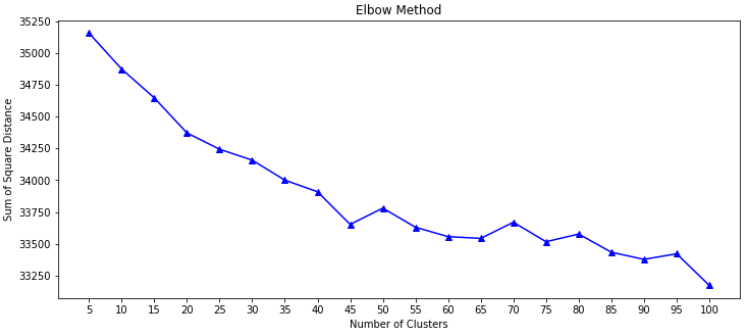

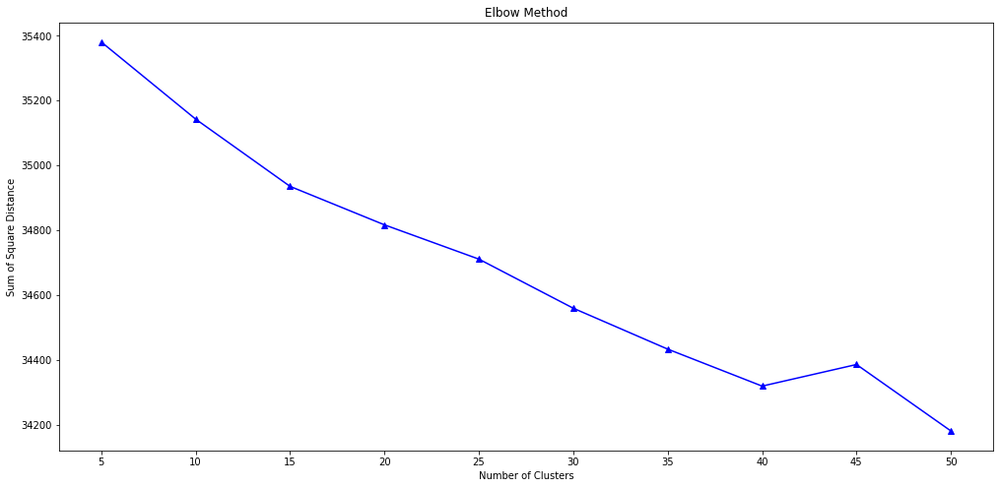

In [172]:
def find_optimal_clusters(data, max_k):
    iters = range(5, max_k+1, 5)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters=k, init_size=1024, batch_size=2048, random_state=20).fit(data).inertia_)
        
    plt.figure(figsize=(17,8))
    plt.plot(iters, sse, 'b^-')
    plt.xlabel('Number of Clusters')
    plt.xticks(iters)
    plt.ylabel('Sum of Square Distance')
    plt.title('Elbow Method')
    
find_optimal_clusters(text, 50)

**b. Based on the your plot above, pick a proper value for K and justify why.**

It is OK that you can't find any proper value for K. If not, specify why these are not proper.

**### YOUR DESCRIPTION HERE ###**
 
 

K가 20인 경우가 optimal이다. K가 10과 15사이일때의 기울기가 가장 가파르고, K가 5와 20사이에서 감소한 sum of distance와 20과 50사이에서 감소한 sum of distance가 비슷하다. 이를 토대로 K가 15와 20 사이일때 sum of distance의 감소 속도가 더뎌지는 구간이 존재한다 추론했고, optimal K를 20이라 생각한다.

### Problem 4-4 Visualize your clusters to evaluate the results of clustering analysis.

**a. Assgin the cluster index for each tweet with K=14**
- In other words, predict the label for each example

In [131]:
clusters = MiniBatchKMeans(n_clusters=14, init_size=1024, batch_size=2048, random_state=20).fit_predict(text)

**b. Fill the function in below, which visualizes your clusters with PCA and TSNE**

Both *PCA* and *TSNE* are the most common visualization techniques in the machine learning community. It is usually known that TSNE could capture the non-linear relationship between datapoints than PCA. For more detailed information, please refer to [this](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)
- At first, this function randomly selects some samples for fitting PCA, depending on your device's capability.
- Get the PCA matrices from the results of 4-2(tf-idf matrix) where the number of principal components is 2, each.
- If you are uncomfortable with this function, you can make your own function to accomplish the same goal with this.

Example
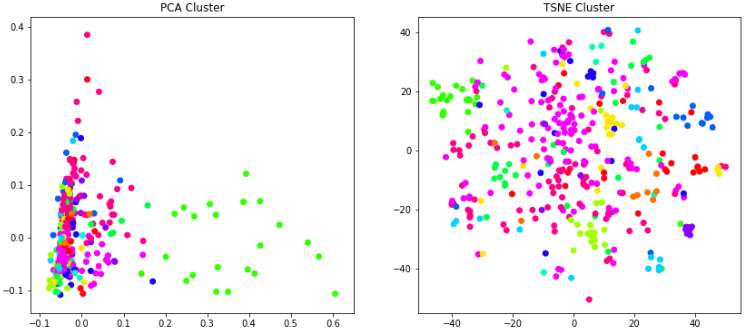

In [132]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import matplotlib.cm as cm

In [133]:
def plot_tsne_pca(data, labels):
    '''
    This function plots the PCA and t-SNE on 2D plane.
    args:
        data: tf-idf weight matrix
        labels: predictions from K-means
    '''
    # initial set up and random pick up samples
    max_label = max(labels)
    max_items = np.random.choice(range(data.shape[0]), size=2000, replace=False)
    
    '''
    pca (2000 x 2) : extract 2 eigenvectors that have the most explained variance
    tsne (2000 x 2) : feed the 50 principal components to t-SNE
                     For TSNE, you can use the TSNE().fit_transform() function.
    '''
    
    pca = PCA(n_components=2).fit_transform(data[max_items,:].todense())
    tsne =  TSNE().fit_transform(PCA(n_components=50).fit_transform(data[max_items,:].todense()))
        
    # random pick certain size of data points for visiualization
    idx = np.random.choice(range(pca.shape[0]), size=400, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    # plot PCA
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster')
    
    # plot t-SNE
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster')

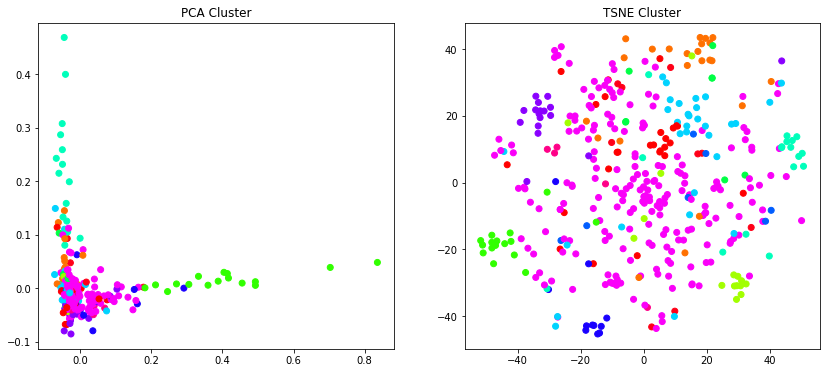

In [134]:
# plot PCA and t-SNE reduced data with above function
plot_tsne_pca( text, clusters)

### Problem 4-5 Extract keywords from each clusters

**a. get the top keywords from each cluster you've got from 4-4 (a.), based on the tf-idf matrix values**

- Use the function in below or make your own function to achieve the same goal with this function.

Example
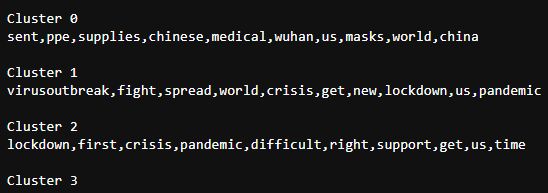

In [135]:
def get_top_keywords(data, clusters, labels, n_terms=10):
    '''
    This function displays the top keywords based on tf-idf score.
    data = tf-idf array
    clusters = assigned cluster index
    labels = vectorizer.get_feature_names()
    n_terms = top n keywords
    '''
    #  based on predictions
    df = pd.DataFrame(data.todense()).groupby(clusters).mean()
    
    # loop through each clusters and print top 10 score words
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([labels[t] for t in np.argsort(r)[-n_terms:]]))

In [136]:
### YOUR CODE HERE ###
get_top_keywords(text, clusters, tfidf.get_feature_names())


Cluster 0
amid,fight,health,help,amp,world,global,us,people,pandemic

Cluster 1
fight,prevent,stop,virus,slow,people,us,need,spread,help

Cluster 2
retweet,drop,comments,zelle,cashapp,apple,tags,join,live,facebook

Cluster 3
doctor,died,beds,one,field,staff,patient,patients,really,hospital

Cluster 4
death,number,reports,bringing,reported,confirmed,new,deaths,total,cases

Cluster 5
vulnerable,crisis,fight,pandemic,people,local,amp,need,help,support

Cluster 6
spread,keep,everyone,stayathomeandstaysafe,people,staying,lockdown,safe,home,stay

Cluster 7
one,need,crisis,get,medical,health,time,us,people,amp

Cluster 8
1228,us,borisjohnson,deaths,people,italy,government,nhs,lockdown,uk

Cluster 9
today,pm,30,update,29th,28,cases,29,2020,march

Cluster 10
new,people,ratings,realdonaldtrump,us,april,guidelines,donald,president,trump

Cluster 11
lockdown,stayathomeandstaysafe,coronaupdate,health,one,time,new,outbreak,us,people

Cluster 12
pandemic,supplies,ppe,us,medical,chinese,wuhan,masks,w

**b. According to the keywords selected from (a.), describe the differences between clusters or guess the topic of tweets in the specific cluster**

**### YOUR DESCRIPTION HERE ###**

topic inference <br>
cluster 0 : People on earth suffer from pandaemic <br>
cluster 1 : How hard people fight back virus and prevent/stop virus from spreading by helping others or asking for help <br>
cluster 2 : Tweets that gain lots of retweets or comments, tweets with lots of tags or facebook feed <br>
cluster 3 : What happens in hospital <br>
cluster 4 : Reports on death cases <br>
cluster 5 : What difficulites Locals have due to pandemic/crisis <br>
cluster 6 : Stay home not to spread virus <br>
cluster 7 : People need medical help <br>
cluster 8 : How governments in European countries deal with the situation : Lockdown <br>
cluster 9 : News reported at the end of March<br>
cluster 10 : Donald Trump tweets new guidelines in April, and people gave it rating <br>
cluster 11 : Stay home, Stay safe<br>
cluster 12 : China needs medical supplies<br>
cluster 13 : Medical personnel suffer from intensive work, as people needs more medical care<br>

### End of HW4 ###
Thanks for all your works